In [1]:
!pip install tdqm

  Preparing metadata (setup.py) ... done
  Created wheel for tdqm: filename=tdqm-0.0.1-py3-none-any.whl size=1322 sha256=71fe78014598c8e0cab339d0e82f0243e1a9a08ec7d20da611cdf09ba0aaccad
  Stored in directory: /root/.cache/pip/wheels/af/02/71/aae0f7ee738abf19498353918ddae0f90a0d6ceb337b0bbc91
Successfully built tdqm


# Segmentación Semántica de Vértebras

# 1.Análisis del Problema

## 1.1 Preparación técnica del Notebook



*   Importe de librerías
*   Lectura de las carpetas y archivos para entender la estructura




In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
PATH = '/content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes'


## 1.2 Estructura de archivos

Esta es la estructura a alto nivel de los archivos de origen

In [5]:
import os

files = os.listdir(PATH)
print(f"Contenido en: {PATH}\n")

for file in files:
    full_path = os.path.join(PATH, file)
    if os.path.isdir(full_path):
        print(f"[Directorio] {file}")
    else:
        print(f"[Archivo]    {file}")

Contenido en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes

[Directorio] LabelBinaryJPG
[Archivo]    diccionario_etiquetas_T1_T12_L1_L5.json
[Directorio] LabelMultiClass_Gray_JPG
[Directorio] LabelMultiClass_Color_JPG
[Directorio] Normal
[Directorio] LabelMultiClass_ID_PNG
[Directorio] RadiographMetrics
[Archivo]    indice_dataset.csv
[Archivo]    reporte_por_mascara_version_final.csv
[Archivo]    resumen_diccionario_original_35_entidades.csv
[Archivo]    resumen_version_final_T1_T12_L1_L5.csv
[Archivo]    README.md
[Directorio] Scoliosis
[Archivo]    indice_dataset.gsheet


Aquí verificamos más a fondo el contenido de cada una de las carpetas.

In [6]:

import os


def print_tree(path, max_depth=2, current_depth=0, indent=""):
    if current_depth > max_depth:
        return

    try:
        items = sorted(os.listdir(path))
    except Exception as e:
        print(f"{indent}Error al leer {path}: {e}")
        return

    for item in items:
        full_path = os.path.join(path, item)
        if os.path.isdir(full_path):
            print(f"{indent}[Directorio] {item}")
            print_tree(full_path, max_depth, current_depth + 1, indent + "    ")
        else:
            print(f"{indent}[Archivo]    {item}")

for folder in [
    "Scoliosis",
    "Normal",
    "LabelBinaryJPG",
    "LabelMultiClass_ID_PNG",
]:
    folder_path = os.path.join(PATH, folder)
    print("\n" + "="*80)
    print(f"Contenido de: {folder_path}")
    print("="*80)
    print_tree(folder_path, max_depth=2)



Contenido de: /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Scoliosis
[Archivo]    S_100.jpg
[Archivo]    S_101.jpg
[Archivo]    S_102.jpg
[Archivo]    S_103.jpg
[Archivo]    S_104.jpg
[Archivo]    S_105.jpg
[Archivo]    S_106.jpg
[Archivo]    S_108.jpg
[Archivo]    S_109.jpg
[Archivo]    S_110.jpg
[Archivo]    S_111.jpg
[Archivo]    S_113.jpg
[Archivo]    S_114.jpg
[Archivo]    S_115.jpg
[Archivo]    S_118.jpg
[Archivo]    S_119.jpg
[Archivo]    S_120.jpg
[Archivo]    S_121.jpg
[Archivo]    S_122.jpg
[Archivo]    S_123.jpg
[Archivo]    S_124.jpg
[Archivo]    S_125.jpg
[Archivo]    S_126.jpg
[Archivo]    S_127.jpg
[Archivo]    S_128.jpg
[Archivo]    S_129.jpg
[Archivo]    S_130.jpg
[Archivo]    S_131.jpg
[Archivo]    S_132.jpg
[Archivo]    S_133.jpg
[Archivo]    S_134.jpg
[Archivo]    S_135.jpg
[Archivo]    S_136.jpg
[Archivo]    S_137.jpg
[Archivo]    S_138.jpg
[Archivo]    S_139.jpg
[Archivo]    S_140.jpg
[Archivo]    S_141.jpg
[Archivo]    S_142.jpg
[Arch

## 1.3 Conteo de archivos del dataset

In [7]:
import os



def count_files(path, extensions=None):
    total = 0
    collected = []
    for root, dirs, files in os.walk(path):
        for f in files:
            if extensions is None or f.lower().endswith(extensions):
                total += 1
                collected.append(os.path.join(root, f))
    return total, collected

folders = [
    "Scoliosis",
    "Normal",
    "LabelBinaryJPG",
    "LabelMultiClass_ID_PNG",
    "LabelMultiClass_Color_JPG",
    "LabelMultiClass_Gray_JPG",
]

for folder in folders:
    folder_path = os.path.join(PATH, folder)
    total, files = count_files(folder_path, extensions=(".png", ".jpg", ".jpeg"))
    print(f"{folder}: {total} archivos de imagen")
    for f in files[:3]:
        print("   ", f)
    print()

Scoliosis: 178 archivos de imagen
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Scoliosis/S_127.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Scoliosis/S_56.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Scoliosis/S_122.jpg

Normal: 71 archivos de imagen
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_64.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_61.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_6.jpg

LabelBinaryJPG: 249 archivos de imagen
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_S_102.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_N_38.jpg
    /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_N_43.jpg

Labe

## 1.5 Relación entre etiqueta y máscara



In [8]:
import os



def list_basenames(folder, extensions=(".png", ".jpg", ".jpeg"), max_items=20):
    names = []
    for root, dirs, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(extensions):
                names.append(os.path.splitext(f)[0])
    return sorted(names)[:max_items]

image_names_scoliosis = list_basenames(os.path.join(PATH, "Scoliosis"))
image_names_normal = list_basenames(os.path.join(PATH, "Normal"))
mask_names_binary = list_basenames(os.path.join(PATH, "LabelBinaryJPG"))
mask_names_multi = list_basenames(os.path.join(PATH, "LabelMultiClass_ID_PNG"))

print("Ejemplos imágenes Scoliosis:")
print(image_names_scoliosis[:20])

print("\nEjemplos imágenes Normal:")
print(image_names_normal[:20])

print("\nEjemplos máscaras binarias:")
print(mask_names_binary[:20])

print("\nEjemplos máscaras multiclase:")
print(mask_names_multi[:20])

Ejemplos imágenes Scoliosis:
['S_100', 'S_101', 'S_102', 'S_103', 'S_104', 'S_105', 'S_106', 'S_108', 'S_109', 'S_110', 'S_111', 'S_113', 'S_114', 'S_115', 'S_118', 'S_119', 'S_120', 'S_121', 'S_122', 'S_123']

Ejemplos imágenes Normal:
['N_1', 'N_10', 'N_11', 'N_12', 'N_13', 'N_14', 'N_15', 'N_16', 'N_17', 'N_18', 'N_19', 'N_2', 'N_20', 'N_21', 'N_22', 'N_23', 'N_24', 'N_25', 'N_26', 'N_27']

Ejemplos máscaras binarias:
['Label_N_1', 'Label_N_10', 'Label_N_11', 'Label_N_12', 'Label_N_13', 'Label_N_14', 'Label_N_15', 'Label_N_16', 'Label_N_17', 'Label_N_18', 'Label_N_19', 'Label_N_2', 'Label_N_20', 'Label_N_21', 'Label_N_22', 'Label_N_23', 'Label_N_24', 'Label_N_25', 'Label_N_26', 'Label_N_27']

Ejemplos máscaras multiclase:
['LabelMulti_N_1', 'LabelMulti_N_10', 'LabelMulti_N_11', 'LabelMulti_N_12', 'LabelMulti_N_13', 'LabelMulti_N_14', 'LabelMulti_N_15', 'LabelMulti_N_16', 'LabelMulti_N_17', 'LabelMulti_N_18', 'LabelMulti_N_19', 'LabelMulti_N_2', 'LabelMulti_N_20', 'LabelMulti_N_21', 

* Las imágenes tienen este formato:

S_100
N_1


* Las máscaras binarias tienen:

Label_N_1

* Las máscaras multiclase tienen:

LabelMulti_N_1

Aunque existe una correspondencia, vamos a  normalizar los nombres:

* imagen N_1 -> máscara binaria Label_N_1
* imagen N_1 -> máscara multiclase LabelMulti_N_1

Así como:

* imagen S_100 ->máscara binaria Label_S_100
* imagen S_100 -> máscara multiclase LabelMulti_S_100



A continuación, vamos a construir el emparejamiento eliminando estos prefijos:

* Label_
* LabelMulti_

In [9]:
import os


def collect_images(folder, extensions=(".png", ".jpg", ".jpeg")):
    files_dict = {}
    for root, dirs, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(extensions):
                base = os.path.splitext(f)[0]
                files_dict[base] = os.path.join(root, f)
    return files_dict

def collect_masks(folder, prefix_to_remove="", extensions=(".png", ".jpg", ".jpeg")):
    files_dict = {}
    for root, dirs, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(extensions):
                base = os.path.splitext(f)[0]
                normalized = base
                if prefix_to_remove and normalized.startswith(prefix_to_remove):
                    normalized = normalized[len(prefix_to_remove):]
                files_dict[normalized] = os.path.join(root, f)
    return files_dict

# Imágenes
images_scoliosis = collect_images(os.path.join(PATH, "Scoliosis"))
images_normal = collect_images(os.path.join(PATH, "Normal"))

all_images = {}
all_images.update(images_scoliosis)
all_images.update(images_normal)

# Máscaras binarias
binary_masks = collect_masks(
    os.path.join(PATH, "LabelBinaryJPG"),
    prefix_to_remove="Label_"
)

# Máscaras multiclase
multiclass_masks = collect_masks(
    os.path.join(PATH, "LabelMultiClass_ID_PNG"),
    prefix_to_remove="LabelMulti_"
)

# Intersecciones
common_binary = sorted(set(all_images.keys()) & set(binary_masks.keys()))
common_multi = sorted(set(all_images.keys()) & set(multiclass_masks.keys()))

print("Total imágenes:", len(all_images))
print("Total máscaras binarias enlazadas:", len(binary_masks))
print("Total máscaras multiclase enlazadas:", len(multiclass_masks))

print("\nCoincidencias binarias:", len(common_binary))
print("Coincidencias multiclase:", len(common_multi))

print("\nEjemplos binarios:")
for k in common_binary[:10]:
    print("Imagen :", all_images[k])
    print("Máscara:", binary_masks[k])
    print("-" * 50)

print("\nEjemplos multiclase:")
for k in common_multi[:10]:
    print("Imagen :", all_images[k])
    print("Máscara:", multiclass_masks[k])
    print("-" * 50)

Total imágenes: 249
Total máscaras binarias enlazadas: 249
Total máscaras multiclase enlazadas: 250

Coincidencias binarias: 249
Coincidencias multiclase: 249

Ejemplos binarios:
Imagen : /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_1.jpg
Máscara: /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_N_1.jpg
--------------------------------------------------
Imagen : /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_10.jpg
Máscara: /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_N_10.jpg
--------------------------------------------------
Imagen : /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/Normal/N_11.jpg
Máscara: /content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes/LabelBinaryJPG/Label_N_11.jpg
--------------------------------------------------
Imagen : /content/drive/MyDrive/MasterIA

Vamos a hacer uso de ambos tipos de máscaras para que el modelo obtenga toda la información requerida.

Es importante aclarar aquí la diferencia entre unas y otras:

## 1.6 Máscaras binarias

Las máscaras de LabelBinaryJPG contienen solo dos valores:

* 0 -> fondo (todo lo que NO es columna)
* 1 (o 255 en la imagen original) -> columna vertebral
Qué representan

Responden a la pregunta:

“¿Dónde está la columna vertebral en la imagen?”


Máscara binaria:
0 0 0 0 0
0 1 1 1 0
0 1 1 1 0
0 0 0 0 0

Todo lo blanco es columna, todo lo negro es fondo.





## 1.7. Máscaras multiclase
Las máscaras de LabelMultiClass_ID_PNG contienen varios valores enteros, donde cada valor representa una clase distinta.

Ejemplo:

0 -> fondo 1 -> T1 2 -> T2 ... 12 -> T12 13 ->L1 ... 17 ->L5

Esto encaja con el archivo:

diccionario_etiquetas_T1_T12_L1_L5.json

Responden a la pregunta:

“¿Qué parte específica de la columna es cada píxel?”

No solo detectan la columna, sino que identifican:

vértebras torácicas (T1–T12) vértebras lumbares (L1–L5)

Diferencia
Tipo de máscara	Qué aprende el modelo
Binaria	Localización general de la columna
Multiclase	Anatomía detallada (cada vértebra)



In [10]:
image_paths = [all_images[k] for k in common_multi]
mask_paths = [multiclass_masks[k] for k in common_multi]
mask_binary_paths = [binary_masks[k] for k in common_multi]

## 1.8.Validación visual de las máscaras

1. Visualización Máscaras Multiclase

Aquí validamos que la máscara coincida visualmente

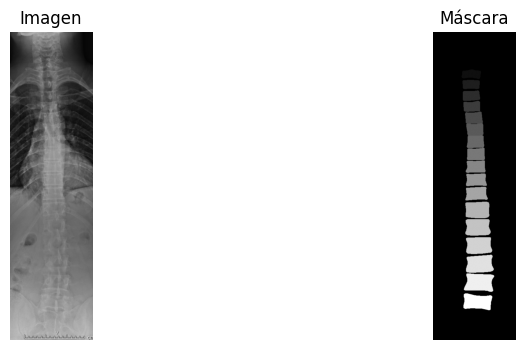

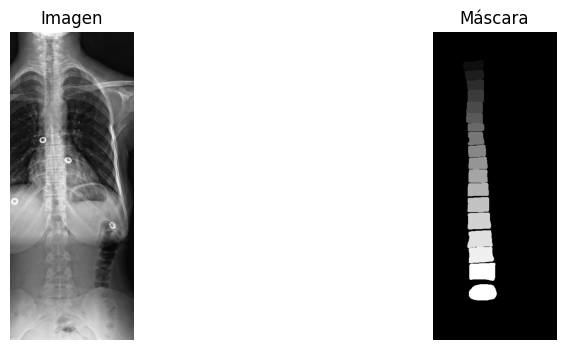

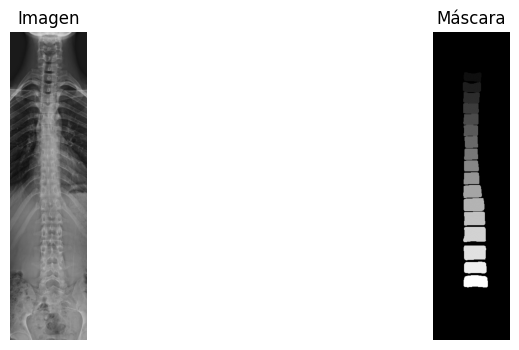

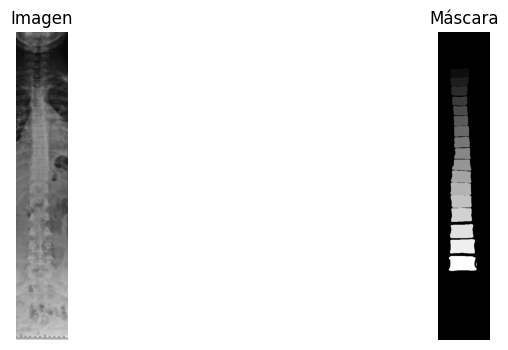

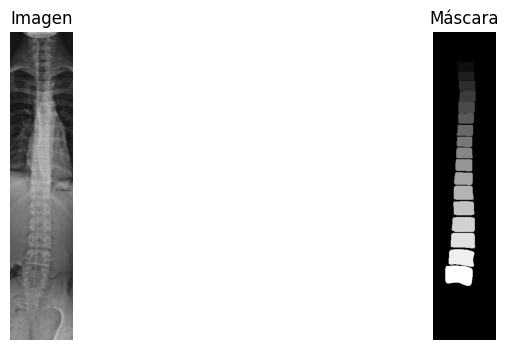

In [11]:
import cv2
import matplotlib.pyplot as plt

def show_pair(image_path, mask_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Imagen")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Máscara")
    plt.axis("off")

    plt.show()

for i in range(5):
    show_pair(image_paths[i], mask_paths[i])

2. Visualización de las máscaras binarias

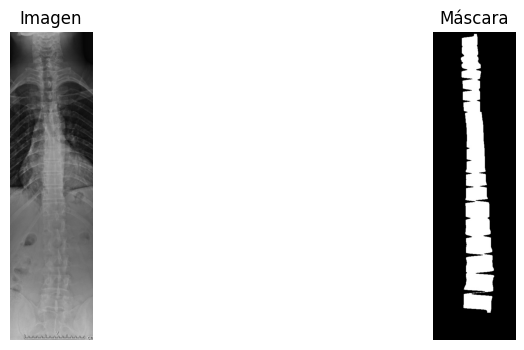

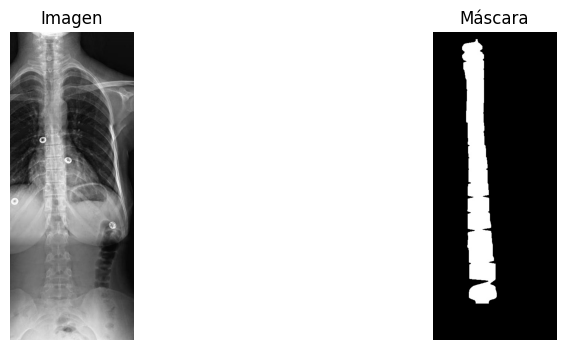

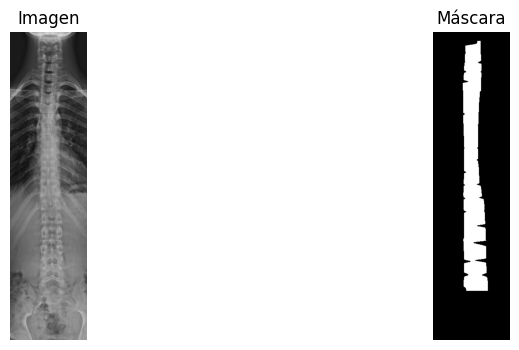

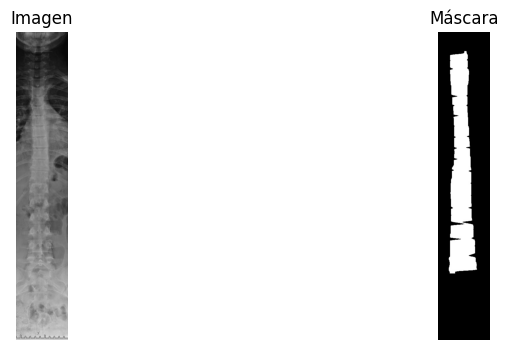

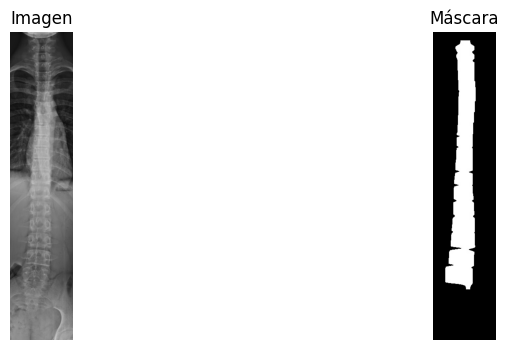

In [12]:
for i in range (5):
  show_pair(image_paths[i], mask_binary_paths[i])

# 2.Interpretación de las clases frente al diccionario de etiquetas

## 2.1 Cargamos el diccionario de etiquetas

In [13]:
import json
json_path = os.path.join(PATH, "diccionario_etiquetas_T1_T12_L1_L5.json")

with open(json_path, "r", encoding="utf-8") as f:
    label_dict = json.load(f)

print("Diccionario cargado:")
print(label_dict)

Diccionario cargado:
{'mascara_binaria': {'0': 'background', '255': 'spine'}, 'mascara_multiclase_id_png': {'0': 'background', '1': 'T1', '2': 'T2', '3': 'T3', '4': 'T4', '5': 'T5', '6': 'T6', '7': 'T7', '8': 'T8', '9': 'T9', '10': 'T10', '11': 'T11', '12': 'T12', '13': 'L1', '14': 'L2', '15': 'L3', '16': 'L4', '17': 'L5'}, 'mascara_multiclase_grises_jpg': {'0': 0, '1': 44, '2': 51, '3': 58, '4': 66, '5': 73, '6': 80, '7': 87, '8': 95, '9': 102, '10': 109, '11': 117, '12': 124, '13': 131, '14': 138, '15': 146, '16': 153, '17': 160}, 'mascara_multiclase_color_rgb': {'0': [0, 0, 0], '1': [242, 209, 12], '2': [235, 242, 12], '3': [196, 242, 12], '4': [156, 242, 12], '5': [117, 242, 12], '6': [77, 242, 12], '7': [38, 242, 12], '8': [12, 242, 25], '9': [12, 242, 64], '10': [12, 242, 104], '11': [12, 242, 143], '12': [12, 242, 183], '13': [12, 242, 222], '14': [12, 222, 242], '15': [12, 183, 242], '16': [12, 143, 242], '17': [12, 104, 242]}, 'equivalencia_diccionario_original_a_version_final

In [14]:
def show_image_and_multiclass_mask(image_path, mask_path, label_map):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
    unique_vals = np.unique(mask)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Radiografía")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap="nipy_spectral")
    plt.title("Máscara multiclase")
    plt.axis("off")

    plt.show()

    #unique_vals = np.unique(mask)

    print("Clases presentes en la máscara:")
    for val in unique_vals:
        name = label_map.get(int(val), f"Clase desconocida {val}")
        print(f"{val} -> {name}")


## 2.2 Normalización del diccionario


In [15]:
def normalize_label_dict(label_dict):
    normalized = {}

    for k, v in label_dict.items():
        if str(k).isdigit():
            normalized[int(k)] = v
        elif str(v).isdigit():
            normalized[int(v)] = k
        elif isinstance(v, int):
            normalized[v] = k

    return dict(sorted(normalized.items()))

label_map = normalize_label_dict(label_dict)
label_map_raw = label_dict["mascara_multiclase_id_png"]

print("Mapa normalizado:")
for k, v in label_map_raw.items():
    print(k, "->", v)

Mapa normalizado:
0 -> background
1 -> T1
2 -> T2
3 -> T3
4 -> T4
5 -> T5
6 -> T6
7 -> T7
8 -> T8
9 -> T9
10 -> T10
11 -> T11
12 -> T12
13 -> L1
14 -> L2
15 -> L3
16 -> L4
17 -> L5


## 2.3 Valores únicos en la máscara

In [16]:
import cv2
import numpy as np

mask = cv2.imread(mask_paths[4], cv2.IMREAD_UNCHANGED)

print("Shape:", mask.shape)
print("Dtype:", mask.dtype)
print("Valores únicos:", np.unique(mask))

Shape: (736, 149)
Dtype: uint8
Valores únicos: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


## 2.4 Traducción a nombres anatómicos


In [17]:
unique_vals = np.unique(mask)

label_map = {int(k): v for k, v in label_map_raw.items()}
print("Clases presentes en la máscara:")
for val in unique_vals:
    name = label_map.get(int(val), f"Clase desconocida {val}")
    print(f"{val} -> {name}")

Clases presentes en la máscara:
0 -> background
1 -> T1
2 -> T2
3 -> T3
4 -> T4
5 -> T5
6 -> T6
7 -> T7
8 -> T8
9 -> T9
10 -> T10
11 -> T11
12 -> T12
13 -> L1
14 -> L2
15 -> L3
16 -> L4
17 -> L5


## 2.5 Visualizar la máscara con nombres de clases

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.imshow(mask, cmap="nipy_spectral")
plt.title("Máscara multiclase")
plt.axis("off")
plt.colorbar()
plt.show()

## 2.6 Mostrar imagen, máscara y clases presentes

In [18]:
def show_image_and_multiclass_mask(image_path, mask_path, label_map):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
    unique_vals = np.unique(mask)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Radiografía")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap="nipy_spectral")
    plt.title("Máscara multiclase")
    plt.axis("off")

    plt.show()

    print("Clases presentes en esta máscara:")
    for val in unique_vals:
        print(f"{val} -> {label_map.get(int(val), f'Clase desconocida {val}')}")

Uso de esta función:

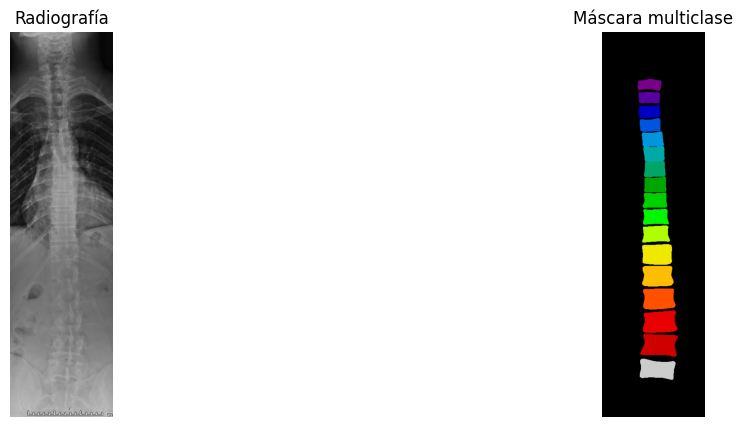

Clases presentes en esta máscara:
0 -> background
1 -> T1
2 -> T2
3 -> T3
4 -> T4
5 -> T5
6 -> T6
7 -> T7
8 -> T8
9 -> T9
10 -> T10
11 -> T11
12 -> T12
13 -> L1
14 -> L2
15 -> L3
16 -> L4
17 -> L5


In [19]:
show_image_and_multiclass_mask(
    image_paths[0],
    mask_paths[0],
    label_map
)

## 2.7 Creando una leyenda de máscara clara

In [20]:
def print_mask_legend(mask_path, label_map):
    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
    unique_vals = np.unique(mask)

    print("Leyenda de la máscara:")
    for val in unique_vals:
        print(f"Clase {val}: {label_map.get(int(val), f'Desconocida {val}')}")

Ejemplo de uso:

In [21]:
print_mask_legend(mask_paths[0], label_map)

Leyenda de la máscara:
Clase 0: background
Clase 1: T1
Clase 2: T2
Clase 3: T3
Clase 4: T4
Clase 5: T5
Clase 6: T6
Clase 7: T7
Clase 8: T8
Clase 9: T9
Clase 10: T10
Clase 11: T11
Clase 12: T12
Clase 13: L1
Clase 14: L2
Clase 15: L3
Clase 16: L4
Clase 17: L5


## 2.8 Visualización de cada vértebra  por separado

In [22]:
def show_individual_classes(mask_path, label_map):
    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
    unique_vals = [v for v in np.unique(mask) if v != 0]

    n = len(unique_vals)
    plt.figure(figsize=(4 * min(n, 4), 4 * ((n + 3) // 4)))

    for i, val in enumerate(unique_vals, 1):
        binary_region = (mask == val).astype(np.uint8)

        plt.subplot((n + 3) // 4, 4, i)
        plt.imshow(binary_region, cmap="gray")
        plt.title(label_map.get(int(val), f"Clase {val}"))
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Probando la visualización en cada una de las vértebras

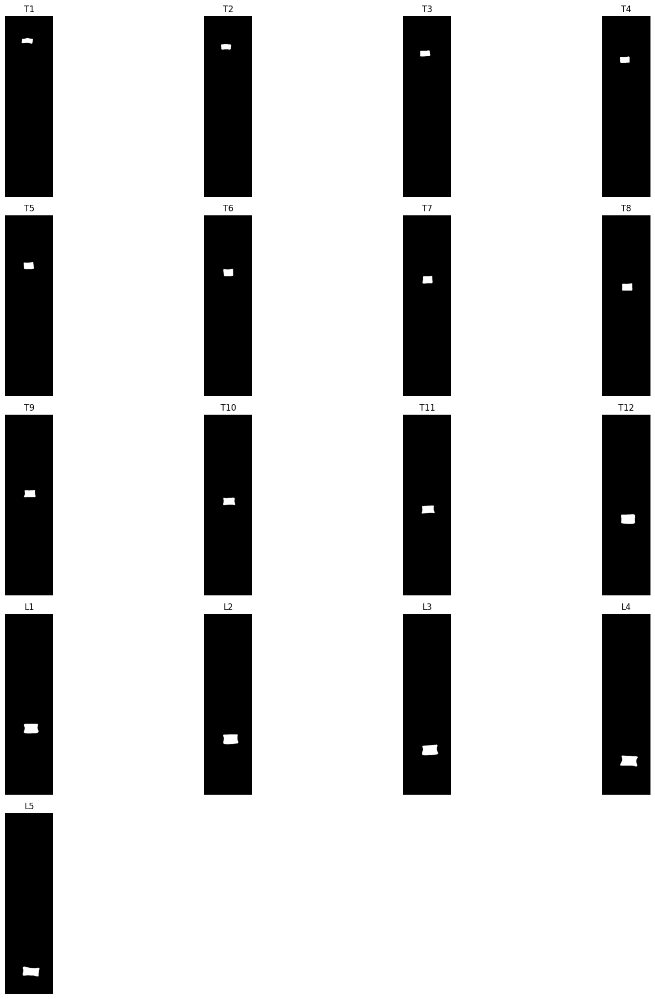

In [23]:
show_individual_classes(mask_paths[0], label_map)

## 2.9 Visualización de la superposición de la máscara sobre la radiografía

In [24]:
def overlay_mask_on_image(image_path, mask_path, alpha=0.45):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.imshow(mask, cmap="nipy_spectral", alpha=alpha)
    plt.title("Superposición imagen + máscara multiclase")
    plt.axis("off")
    plt.show()

Probamos la visualización en uno de los datos:

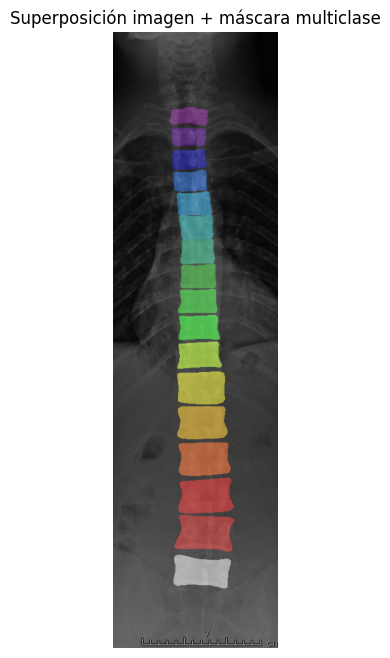

In [25]:
overlay_mask_on_image(image_paths[0], mask_paths[0])

### 2.9.1. Mostrando las clases en el overlay sobre la radiografía

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def build_color_map_from_json(label_dict):
    color_map_raw = label_dict["mascara_multiclase_color_rgb"]
    return {int(k): tuple(v) for k, v in color_map_raw.items()}

def build_label_map_from_json(label_dict):
    label_map_raw = label_dict["mascara_multiclase_id_png"]
    return {int(k): v for k, v in label_map_raw.items()}

def create_color_overlay(mask, color_map, alpha=0.45):
    h, w = mask.shape
    overlay = np.zeros((h, w, 3), dtype=np.uint8)

    for class_id, color in color_map.items():
        overlay[mask == class_id] = color

    return overlay

def get_class_centroid(mask, class_id):
    ys, xs = np.where(mask == class_id)
    if len(xs) == 0 or len(ys) == 0:
        return None
    cx = int(np.mean(xs))
    cy = int(np.mean(ys))
    return cx, cy

def show_overlay_with_labels(image_path, mask_path, label_dict, alpha=0.45, min_pixels=20):
    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    overlay = create_color_overlay(mask, color_map, alpha=alpha)

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.imshow(overlay, alpha=alpha)

    unique_vals = np.unique(mask)

    for class_id in unique_vals:
        if class_id == 0:
            continue

        region = (mask == class_id)
        if region.sum() < min_pixels:
            continue

        centroid = get_class_centroid(mask, class_id)
        if centroid is None:
            continue

        x, y = centroid
        class_name = label_map.get(int(class_id), str(class_id))

        plt.text(
            x, y, class_name,
            fontsize=7,
            ha="center",
            va="center",
            color="white",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

    plt.title("Overlay con clases anatómicas")
    plt.axis("off")
    plt.show()

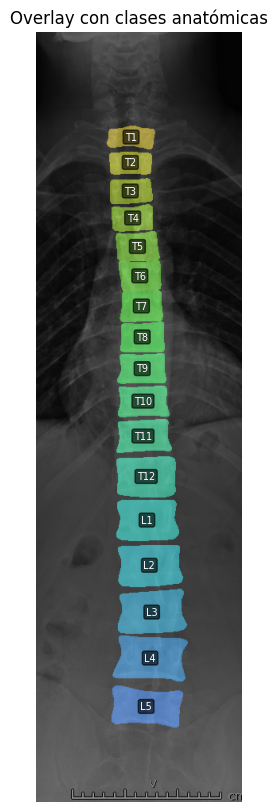

In [27]:
show_overlay_with_labels(
    image_paths[0],
    mask_paths[0],
    label_dict
)

In [28]:
def get_bbox_center(mask, class_id):
    ys, xs = np.where(mask == class_id)
    if len(xs) == 0 or len(ys) == 0:
        return None

    x_min, x_max = xs.min(), xs.max()
    y_min, y_max = ys.min(), ys.max()

    cx = (x_min + x_max) // 2
    cy = (y_min + y_max) // 2
    return cx, cy

def show_overlay_with_labels_bbox(image_path, mask_path, label_dict, alpha=0.45, min_pixels=20):
    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

    overlay = create_color_overlay(mask, color_map, alpha=alpha)

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.imshow(overlay, alpha=alpha)

    unique_vals = np.unique(mask)

    for class_id in unique_vals:
        if class_id == 0:
            continue

        region = (mask == class_id)
        if region.sum() < min_pixels:
            continue

        center = get_bbox_center(mask, class_id)
        if center is None:
            continue

        x, y = center
        class_name = label_map.get(int(class_id), str(class_id))

        plt.text(
            x, y, class_name,
            fontsize=7,
            ha="center",
            va="center",
            color="white",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

    plt.title("Overlay con clases anatómicas")
    plt.axis("off")
    plt.show()

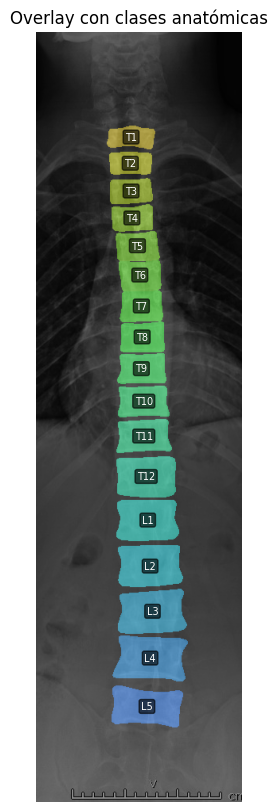

In [29]:
show_overlay_with_labels_bbox(
    image_paths[0],
    mask_paths[0],
    label_dict
)

## 2.10.Conclusión del Análisis del dataset, etiquetas y máscaras suministradas

Las máscaras multiclase del dataset codifican anatómicamente distintas vértebras torácicas y lumbares mediante identificadores enteros por píxel. Estos identificadores fueron interpretados utilizando el archivo diccionario_etiquetas_T1_T12_L1_L5.json, lo que permitió asociar cada región segmentada con una vértebra específica, desde T1 hasta T12 y de L1 a L5. Esta representación ofrece un nivel de detalle superior al de las máscaras binarias, ya que no solo delimita la columna vertebral, sino que también permite distinguir sus componentes anatómicos individuales.

El dataset no solo segmenta la columna completa
* también identifica vértebras específicas
* cada valor en la máscara corresponde a una estructura anatómica definida en el JSON
esto permite segmentación anatómica detallada, útil para análisis de escoliosis

# 3.Creación del Modelo

## 3.1.Preparación de Parámetros

In [30]:
import os
import copy
import random
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from sklearn.model_selection import GroupKFold

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

In [31]:
SEED = 42
IMG_SIZE = (256, 256)
BATCH_SIZE = 4
NUM_EPOCHS = 40
LR = 1e-4
N_SPLITS = 4
NUM_CLASSES = 18   # ajusta esto según tus clases reales
IN_CHANNELS = 3    # 1 si son grayscale, 3 si son RGB
PATIENCE = 8       # early stopping
MODEL_SAVE_DIR = "/content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv"

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


## Preparación de Folds

In [32]:
from sklearn.model_selection import GroupKFold

gkf = GroupKFold(n_splits=4)
file_paths = os.path.join(PATH,'indice_dataset.csv')
df_indice = pd.read_csv(file_paths)
df_indice


,grupo,imagen,id_paciente,ruta_radiografia,ruta_mascara_binaria,ruta_mascara_multiclase_id_png,ruta_mascara_multiclase_grises_jpg,ruta_mascara_multiclase_color_jpg,metricas_json
0,Normal,N_1.jpg,1,Normal/N_1.jpg,LabelBinaryJPG/Label_N_1.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_1.png,LabelMultiClass_Gray_JPG/LabelMulti_N_1.jpg,LabelMultiClass_Color_JPG/LabelMulti_N_1.jpg,NaN
1,Normal,N_2.jpg,2,Normal/N_2.jpg,LabelBinaryJPG/Label_N_2.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_2.png,LabelMultiClass_Gray_JPG/LabelMulti_N_2.jpg,LabelMultiClass_Color_JPG/LabelMulti_N_2.jpg,NaN
2,Normal,N_3.jpg,3,Normal/N_3.jpg,LabelBinaryJPG/Label_N_3.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_3.png,LabelMultiClass_Gray_JPG/LabelMulti_N_3.jpg,LabelMultiClass_Color_JPG/LabelMulti_N_3.jpg,NaN
3,Normal,N_4.jpg,4,Normal/N_4.jpg,LabelBinaryJPG/Label_N_4.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_4.png,LabelMultiClass_Gray_JPG/LabelMulti_N_4.jpg,LabelMultiClass_Color_JPG/LabelMulti_N_4.jpg,NaN
4,Normal,N_5.jpg,5,Normal/N_5.jpg,LabelBinaryJPG/Label_N_5.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_5.png,LabelMultiClass_Gray_JPG/LabelMulti_N_5.jpg,LabelMultiClass_Color_JPG/LabelMulti_N_5.jpg,NaN
...,...,...,...,...,...,...,...,...,...
245,Scoliosis,S_202.jpg,202,Scoliosis/S_202.jpg,LabelBinaryJPG/Label_S_202.jpg,LabelMultiClass_ID_PNG/LabelMulti_S_202.png,LabelMultiClass_Gray_JPG/LabelMulti_S_202.jpg,LabelMultiClass_Color_JPG/LabelMulti_S_202.jpg,RadiographMetrics/metrics_json/metrics_202.json
246,Scoliosis,S_203.jpg,203,Scoliosis/S_203.jpg,LabelBinaryJPG/Label_S_203.jpg,LabelMultiClass_ID_PNG/LabelMulti_S_203.png,LabelMultiClass_Gray_JPG/LabelMulti_S_203.jpg,LabelMultiClass_Color_JPG/LabelMulti_S_203.jpg,RadiographMetrics/metrics_json/metrics_203.json
247,Scoliosis,S_204.jpg,204,Scoliosis/S_204.jpg,LabelBinaryJPG/Label_S_204.jpg,LabelMultiClass_ID_PNG/LabelMulti_S_204.png,LabelMultiClass_Gray_JPG/LabelMulti_S_204.jpg,LabelMultiClass_Color_JPG/LabelMulti_S_204.jpg,RadiographMetrics/metrics_json/metrics_204.json
248,Scoliosis,S_205.jpg,205,Scoliosis/S_205.jpg,LabelBinaryJPG/Label_S_205.jpg,LabelMultiClass_ID_PNG/LabelMulti_S_205.png,LabelMultiClass_Gray_JPG/LabelMulti_S_205.jpg,LabelMultiClass_Color_JPG/LabelMulti_S_205.jpg,RadiographMetrics/metrics_json/metrics_205.json


Hay que tener en cuenta que las imágenes pertenecen a un paciente y puede haber varias imágenes por paciente.

In [33]:
image_paths = df_indice["ruta_radiografia"].values
mask_paths = df_indice["ruta_mascara_multiclase_id_png"].values
patient_ids = df_indice["id_paciente"].values

In [34]:
df_input = pd.DataFrame({
    "image_path": image_paths,
    "mask_path": mask_paths,
    "patient_id": patient_ids
})

print(df_input.head())
print("Número de muestras:", len(df_input))
print("Pacientes únicos:", df_input["patient_id"].nunique())

       image_path                                  mask_path  patient_id
0  Normal/N_1.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_1.png           1
1  Normal/N_2.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_2.png           2
2  Normal/N_3.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_3.png           3
3  Normal/N_4.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_4.png           4
4  Normal/N_5.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_5.png           5
Número de muestras: 250
Pacientes únicos: 199


Preparamos los grupos teniendo en cuenta el patient_id

In [35]:
from sklearn.model_selection import GroupKFold

gkf = GroupKFold(n_splits=4)

X = df_input["image_path"].values
y = df_input["mask_path"].values
groups = df_input["patient_id"].values

Verificamos que no hay un overlap de pacientes entre los folds (i.e. se comportan como una partición)

In [36]:
for fold, (train_idx, val_idx) in enumerate(gkf.split(X, y, groups=groups), start=1):
    train_df = df_input.iloc[train_idx].reset_index(drop=True)
    val_df = df_input.iloc[val_idx].reset_index(drop=True)

    print(f"Fold {fold}")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())
    print("-" * 40)

Fold 1
Train samples: 187
Val samples: 63
Train patients: 149
Val patients: 50
----------------------------------------
Fold 2
Train samples: 187
Val samples: 63
Train patients: 149
Val patients: 50
----------------------------------------
Fold 3
Train samples: 188
Val samples: 62
Train patients: 150
Val patients: 49
----------------------------------------
Fold 4
Train samples: 188
Val samples: 62
Train patients: 149
Val patients: 50
----------------------------------------


## 3.2.1 Verificación  de pacientes duplicados entre folds

In [37]:

for fold, (train_idx, val_idx) in enumerate(gkf.split(X, y, groups=groups), start=1):
    train_patients = set(df_input.iloc[train_idx]["patient_id"])
    val_patients = set(df_input.iloc[val_idx]["patient_id"])

    overlap = train_patients.intersection(val_patients)

    print(f"Fold {fold} - pacientes compartidos:", len(overlap))

Fold 1 - pacientes compartidos: 0
Fold 2 - pacientes compartidos: 0
Fold 3 - pacientes compartidos: 0
Fold 4 - pacientes compartidos: 0


In [38]:
print(df_input[["image_path", "mask_path", "patient_id"]].head())
print("Número de imágenes:", len(df_input))
print("Número de pacientes:", df_input["patient_id"].nunique())

       image_path                                  mask_path  patient_id
0  Normal/N_1.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_1.png           1
1  Normal/N_2.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_2.png           2
2  Normal/N_3.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_3.png           3
3  Normal/N_4.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_4.png           4
4  Normal/N_5.jpg  LabelMultiClass_ID_PNG/LabelMulti_N_5.png           5
Número de imágenes: 250
Número de pacientes: 199


In [39]:
patient_counts = df_input.groupby("patient_id").size().sort_values(ascending=False)
print(patient_counts.head(10))

patient_id
33    2
34    2
35    2
36    2
22    2
21    2
23    2
56    2
57    2
58    2
dtype: int64


## 3.3 Creación del Dataset de Segmentación

In [40]:
import cv2
import numpy as np
import torch
import os
from torch.utils.data import Dataset

class SegmentationDataset(Dataset):
    def __init__(self,
                 dataframe,
                 base_dir,
                 img_size=(256, 256),
                 train=True,
                 in_channels=3):
      self.df = dataframe.reset_index(drop=True)
      self.base_dir = base_dir
      self.img_size = img_size
      self.train = train
      self.in_channels = in_channels

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image_path = row["image_path"]
        mask_path = row["mask_path"]

        if not os.path.isabs(image_path):
          image_path = os.path.join(self.base_dir, image_path)

        if not os.path.isabs(mask_path):
          mask_path = os.path.join(self.base_dir, mask_path)


        # ===== 1. Cargar imagen =====
        if self.in_channels == 1:
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        else:
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)

        if image is None:
            print(f"[WARNING] No se pudo cargar la imagen: {image_path}")
            return None

        # ===== 2. Cargar máscara =====
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

        if mask is None:
            print(f"[WARNING] No se pudo cargar la máscara: {mask_path}")
            return None

        # ===== 3. Convertir color si aplica =====
        if self.in_channels != 1:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # ===== 4. Redimensionar =====
        image = cv2.resize(image, self.img_size, interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, self.img_size, interpolation=cv2.INTER_NEAREST)

        # ===== 5. Normalizar imagen =====
        image = image.astype(np.float32) / 255.0

        # ===== 6. Ajustar dimensiones =====
        if self.in_channels == 1:
            image = np.expand_dims(image, axis=0)
        else:
            image = np.transpose(image, (2, 0, 1))

        # ===== 7. Convertir a tensores =====
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.long)

        return image, mask

    # ===============================
    # AUGMENTATIONS
    # ===============================
    def apply_augmentations(self, image, mask):
        # Flip horizontal
        if np.random.rand() < 0.5:
            image = cv2.flip(image, 1)
            mask = cv2.flip(mask, 1)

        # Rotación pequeña
        if np.random.rand() < 0.5:
            angle = np.random.uniform(-10, 10)
            h, w = image.shape[:2]
            center = (w // 2, h // 2)

            M = cv2.getRotationMatrix2D(center, angle, 1.0)

            image = cv2.warpAffine(
                image, M, (w, h),
                flags=cv2.INTER_LINEAR,
                borderMode=cv2.BORDER_REFLECT_101
            )

            mask = cv2.warpAffine(
                mask, M, (w, h),
                flags=cv2.INTER_NEAREST,
                borderMode=cv2.BORDER_REFLECT_101
            )

        # Brillo / contraste
        if np.random.rand() < 0.5:
            alpha = np.random.uniform(0.9, 1.1)
            beta = np.random.uniform(-10, 10)
            image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

        return image, mask

Verificamos que el dataset se haya generado exitosamente y las clases de tensor que cargan las clases estén cargadas adecuadamente.

In [41]:
print(PATH)
print(os.path.exists(os.path.join(PATH, "Normal", "N_1.jpg")))
print(os.path.exists(os.path.join(PATH, "Scoliosis", "S_21.jpg")))

/content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes
True
True


In [42]:
def get_valid_sample(dataset):
    for i in range(len(dataset)):
        sample = dataset[i]
        if sample is not None:
            return i, sample
    return None, None

In [43]:
dataset = SegmentationDataset(
    df_input,
    base_dir=PATH,
    img_size=(256,256),
    train=False
)

sample = dataset[0]
idx, sample = get_valid_sample(dataset)
print(PATH)
if sample is None:
    print("No se encontró ninguna muestra válida")
else:
    img, mask = sample
    print("Índice válido:", idx)
    print("Imagen shape:", img.shape)
    print("Máscara shape:", mask.shape)
    print("Clases:", torch.unique(mask))

/content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes
Índice válido: 0
Imagen shape: torch.Size([3, 256, 256])
Máscara shape: torch.Size([256, 256])
Clases: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])


## 3.4.Creación del Modelo UNet

In [44]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

In [45]:
class SmallUNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=18, base_channels=32):
        super().__init__()

        self.enc1 = DoubleConv(in_channels, base_channels)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = DoubleConv(base_channels, base_channels * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = DoubleConv(base_channels * 2, base_channels * 4)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(base_channels * 4, base_channels * 8)

        self.up3 = nn.ConvTranspose2d(base_channels * 8, base_channels * 4, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(base_channels * 8, base_channels * 4)

        self.up2 = nn.ConvTranspose2d(base_channels * 4, base_channels * 2, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(base_channels * 4, base_channels * 2)

        self.up1 = nn.ConvTranspose2d(base_channels * 2, base_channels, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(base_channels * 2, base_channels)

        self.out_conv = nn.Conv2d(base_channels, num_classes, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))

        b = self.bottleneck(self.pool3(e3))

        d3 = self.up3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        return self.out_conv(d1)

## 3.5. Definición de Dice Loss

In [46]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets, num_classes):
        probs = torch.softmax(logits, dim=1)
        targets_one_hot = F.one_hot(targets, num_classes=num_classes)
        targets_one_hot = targets_one_hot.permute(0, 3, 1, 2).float()

        dims = (0, 2, 3)
        intersection = torch.sum(probs * targets_one_hot, dims)
        union = torch.sum(probs, dims) + torch.sum(targets_one_hot, dims)

        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        return 1.0 - dice.mean()

## 3.6.Definición de Loss Combinada

In [47]:
class CombinedLoss(nn.Module):
    def __init__(self, num_classes, ce_weight=0.5, dice_weight=0.5):
        super().__init__()
        self.ce = nn.CrossEntropyLoss()
        self.dice = DiceLoss()
        self.num_classes = num_classes
        self.ce_weight = ce_weight
        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        ce_loss = self.ce(logits, targets)
        dice_loss = self.dice(logits, targets, self.num_classes)
        return self.ce_weight * ce_loss + self.dice_weight * dice_loss

## 3.7.Función para obtener las métricas


In [48]:
def compute_metrics(logits, targets, num_classes, eps=1e-6):
    preds = torch.argmax(logits, dim=1)

    dice_scores = []
    iou_scores = []

    for cls in range(num_classes):
        pred_cls = (preds == cls).float()
        target_cls = (targets == cls).float()

        intersection = (pred_cls * target_cls).sum()
        union_dice = pred_cls.sum() + target_cls.sum()
        union_iou = pred_cls.sum() + target_cls.sum() - intersection

        dice = (2 * intersection + eps) / (union_dice + eps)
        iou = (intersection + eps) / (union_iou + eps)

        dice_scores.append(dice.item())
        iou_scores.append(iou.item())

    pixel_acc = (preds == targets).float().mean().item()

    return {
        "dice_mean": np.mean(dice_scores),
        "iou_mean": np.mean(iou_scores),
        "pixel_acc": pixel_acc,
        "dice_per_class": dice_scores,
        "iou_per_class": iou_scores,
    }

## 3.8 Función que permite entrenar por una época

In [49]:
def train_one_epoch(model, loader, optimizer, criterion, device, num_classes, scaler):
    model.train()

    running_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0
    running_pixel_acc = 0.0
    n_batches = 0

    for batch in loader:
        images, masks = batch
        images = images.to(device, non_blocking=True)
        masks = masks.to(device, non_blocking=True)

        optimizer.zero_grad()

        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                outputs = model(images)
                loss = criterion(outputs, masks)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = criterion(outputs, masks)

            loss.backward()
            optimizer.step()

        batch_metrics = compute_metrics(outputs, masks, num_classes)

        running_loss += loss.item()
        running_dice += batch_metrics["dice_mean"]
        running_iou += batch_metrics["iou_mean"]
        running_pixel_acc += batch_metrics["pixel_acc"]
        n_batches += 1

    return {
        "loss": running_loss / max(n_batches, 1),
        "dice": running_dice / max(n_batches, 1),
        "iou": running_iou / max(n_batches, 1),
        "pixel_acc": running_pixel_acc / max(n_batches, 1),
    }

## 3.9 Función que permite validar el rendimiento de una época

In [50]:
def validate_one_epoch(model, loader, criterion, device, num_classes):
    model.eval()

    running_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0
    running_acc = 0.0

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device, non_blocking=True)
            masks = masks.to(device, non_blocking=True)

            if device.type == "cuda":
                with torch.amp.autocast(device_type="cuda"):
                    logits = model(images)
                    loss = criterion(logits, masks)
            else:
                logits = model(images)
                loss = criterion(logits, masks)

            metrics = compute_metrics(logits, masks, num_classes)

            running_loss += loss.item()
            running_dice += metrics["dice_mean"]
            running_iou += metrics["iou_mean"]
            running_acc += metrics["pixel_acc"]

    n = len(loader)
    return {
        "loss": running_loss / n,
        "dice": running_dice / n,
        "iou": running_iou / n,
        "pixel_acc": running_acc / n,
    }

## 3.10. Clase para manejar el Early Stopping

In [51]:
class EarlyStopping:
    def __init__(self, patience=8, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = np.inf
        self.should_stop = False

    def step(self, val_loss):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            return True
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.should_stop = True
            return False

Esta función permitirá que al entrenar, los data loaders eviten los registros cuys imágenes  no existen.

In [52]:
from torch.utils.data.dataloader import default_collate

def safe_collate(batch):
    batch = [item for item in batch if item is not None]
    if len(batch) == 0:
        return None
    return default_collate(batch)

## 3.11 Función que permite entrenar un fold completo

In [53]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [54]:
import torch

print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("No se detectó GPU")

CUDA disponible: True
GPU: NVIDIA A100-SXM4-40GB


#### 3.1.1. Inclusión MLFlow en el entrenamiento (función train_one_fold)

In [55]:
!pip install -q mlflow databricks-sdk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 114.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 124.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.6/887.6 kB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.4/208.4 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.0/77.0 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.2/132.2 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [56]:
from google.colab import userdata
import os

os.environ["DATABRICKS_HOST"] = userdata.get("DBRICKS_HOST")
os.environ["DATABRICKS_TOKEN"] = userdata.get("DBRICKS_TOKEN")


Configurando MLFlow para Databricks

In [57]:
import mlflow

mlflow.set_tracking_uri("databricks")

EXPERIMENT_NAME = "/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small"
mlflow.set_experiment(EXPERIMENT_NAME)

<Experiment: artifact_location='dbfs:/databricks/mlflow-tracking/4342145353292010', creation_time=1778255291685, experiment_id='4342145353292010', last_update_time=1778686448954, lifecycle_stage='active', name='/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small', tags={'mlflow.experiment.sourceName': '/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small',
 'mlflow.experimentType': 'MLFLOW_EXPERIMENT',
 'mlflow.ownerEmail': 'anferiro@gmail.com',
 'mlflow.ownerId': '70959576900553'}, trace_location=None, workspace='default'>

Probando conexión a Databricks

In [58]:
with mlflow.start_run(run_name="test_from_colab"):
    mlflow.log_param("source", "colab")
    mlflow.log_metric("test_metric", 1.0)

🏃 View run test_from_colab at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/96dd596502ab4d52a328d89bf3493538
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010


Adaptando las visualizaciones para usarlas en MLFlow

##  3.13 Funciones de Visualización con Etiquetas

In [137]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

def build_color_map_from_json(label_dict):
    color_map_raw = label_dict["mascara_multiclase_color_rgb"]
    return {int(k): tuple(v) for k, v in color_map_raw.items()}

def build_label_map_from_json(label_dict):
    label_map_raw = label_dict["mascara_multiclase_id_png"]
    return {int(k): v for k, v in label_map_raw.items()}

def create_color_overlay(mask, color_map):
    h, w = mask.shape
    overlay = np.zeros((h, w, 3), dtype=np.uint8)

    for class_id, color in color_map.items():
        overlay[mask == class_id] = color

    return overlay

def get_class_centroid(mask, class_id):
    ys, xs = np.where(mask == class_id)
    if len(xs) == 0 or len(ys) == 0:
        return None
    cx = int(np.mean(xs))
    cy = int(np.mean(ys))
    return cx, cy

def draw_labels_on_axis(ax, mask, label_map, min_pixels=20):
    unique_vals = np.unique(mask)

    for class_id in unique_vals:
        if class_id == 0:
            continue

        region = (mask == class_id)
        if region.sum() < min_pixels:
            continue

        centroid = get_class_centroid(mask, class_id)
        if centroid is None:
            continue

        x, y = centroid
        class_name = label_map.get(int(class_id), str(class_id))

        ax.text(
            x, y, class_name,
            fontsize=9,
            ha="center",
            va="center",
            color="white",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

def show_gt_vs_pred_with_labels(
    model,
    dataset,
    device,
    idx,
    label_dict,
    alpha=0.45,
    min_pixels=20,
    save_path=None,
    show=True,
    print_classes=True
):
    model.eval()

    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    sample = dataset[idx]
    if sample is None:
        print(f"No se pudo cargar la muestra {idx}")
        return None

    image_tensor, gt_mask = sample
    image_batch = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                logits = model(image_batch)
        else:
            logits = model(image_batch)

    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    gt_mask = gt_mask.cpu().numpy()

    image = image_tensor.cpu().numpy()

    if image.shape[0] == 1:
        image = image.squeeze(0)
        image_cmap = "gray"
    else:
        image = np.transpose(image, (1, 2, 0))
        image_cmap = None

    image = np.clip(image, 0, 1)

    gt_overlay = create_color_overlay(gt_mask, color_map)
    pred_overlay = create_color_overlay(pred_mask, color_map)

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    axes[0].imshow(image, cmap=image_cmap)
    axes[0].set_title(f"Imagen - idx {idx}")
    axes[0].axis("off")

    axes[1].imshow(image, cmap=image_cmap)
    axes[1].imshow(gt_overlay, alpha=alpha)
    draw_labels_on_axis(
        axes[1],
        gt_mask,
        label_map,
        min_pixels=min_pixels
    )
    axes[1].set_title("Ground Truth con etiquetas")
    axes[1].axis("off")

    axes[2].imshow(image, cmap=image_cmap)
    axes[2].imshow(pred_overlay, alpha=alpha)
    draw_labels_on_axis(
        axes[2],
        pred_mask,
        label_map,
        min_pixels=min_pixels
    )
    axes[2].set_title("Predicción con etiquetas")
    axes[2].axis("off")

    plt.tight_layout()

    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)

    if print_classes:
        gt_classes = np.unique(gt_mask)
        pred_classes = np.unique(pred_mask)

        print("\nClases presentes en Ground Truth:")
        for c in gt_classes:
            name = label_map.get(int(c), f"Clase {c}")
            print(f"  {c} → {name}")

        print("\nClases presentes en Predicción:")
        for c in pred_classes:
            name = label_map.get(int(c), f"Clase {c}")
            print(f"  {c} → {name}")

    return save_path if save_path is not None else fig

Función para agregar MLFlow Logger al entrenamiento

In [138]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch


def show_gt_vs_pred_with_labels(
    model,
    dataset,
    device,
    idx,
    label_dict,
    alpha=0.45,
    min_pixels=20,
    save_path=None,
    show=True,
    print_classes=True
):
    model.eval()

    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    sample = dataset[idx]
    if sample is None:
        print(f"No se pudo cargar la muestra {idx}")
        return None

    image_tensor, gt_mask = sample
    image_batch = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                logits = model(image_batch)
        else:
            logits = model(image_batch)

    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    gt_mask = gt_mask.cpu().numpy()

    image = image_tensor.cpu().numpy()

    if image.shape[0] == 1:
        image = image.squeeze(0)
        image_cmap = "gray"
    else:
        image = np.transpose(image, (1, 2, 0))
        image_cmap = None

    image = np.clip(image, 0, 1)

    gt_overlay = create_color_overlay(gt_mask, color_map)
    pred_overlay = create_color_overlay(pred_mask, color_map)

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    axes[0].imshow(image, cmap=image_cmap)
    axes[0].set_title(f"Imagen - idx {idx}")
    axes[0].axis("off")

    axes[1].imshow(image, cmap=image_cmap)
    axes[1].imshow(gt_overlay, alpha=alpha)
    draw_labels_on_axis(
        axes[1],
        gt_mask,
        label_map,
        min_pixels=min_pixels
    )
    axes[1].set_title("Ground Truth con etiquetas")
    axes[1].axis("off")

    axes[2].imshow(image, cmap=image_cmap)
    axes[2].imshow(pred_overlay, alpha=alpha)
    draw_labels_on_axis(
        axes[2],
        pred_mask,
        label_map,
        min_pixels=min_pixels
    )
    axes[2].set_title("Predicción con etiquetas")
    axes[2].axis("off")

    plt.tight_layout()

    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)

    if print_classes:
        gt_classes = np.unique(gt_mask)
        pred_classes = np.unique(pred_mask)

        print("\nClases presentes en Ground Truth:")
        for c in gt_classes:
            name = label_map.get(int(c), f"Clase {c}")
            print(f"  {c} → {name}")

        print("\nClases presentes en Predicción:")
        for c in pred_classes:
            name = label_map.get(int(c), f"Clase {c}")
            print(f"  {c} → {name}")

    return save_path if save_path is not None else fig

In [139]:
def save_prediction_visualization(
    model,
    dataloader,
    label_dict,
    device,
    save_path,
    n_samples=4,
    alpha=0.45,
    min_pixels=20
):
    """
    Guarda visualizaciones de predicción usando show_gt_vs_pred_with_labels.

    En lugar de crear la visualización desde cero, reutiliza la función:
        show_gt_vs_pred_with_labels(...)

    Crea una carpeta con varias imágenes:
        predictions_fold_1/
            sample_0.png
            sample_1.png
            sample_2.png
            sample_3.png

    Args:
        model: modelo PyTorch.
        dataloader: DataLoader de validación.
        label_dict: diccionario de etiquetas.
        device: torch.device.
        save_path: ruta base. Puede ser .png o una carpeta.
        n_samples: número de muestras a guardar.
        alpha: transparencia del overlay.
        min_pixels: mínimo de píxeles para dibujar etiqueta.

    Returns:
        output_dir: carpeta donde quedaron guardadas las imágenes.
    """

    model.eval()

    dataset = dataloader.dataset

    # Si save_path termina en .png, usamos su nombre sin extensión como carpeta
    if save_path.endswith(".png"):
        output_dir = save_path.replace(".png", "")
    else:
        output_dir = save_path

    os.makedirs(output_dir, exist_ok=True)

    saved_paths = []
    samples_saved = 0

    for idx in range(len(dataset)):
        if samples_saved >= n_samples:
            break

        sample_save_path = os.path.join(
            output_dir,
            f"sample_{samples_saved}_idx_{idx}.png"
        )

        try:
            result_path = show_gt_vs_pred_with_labels(
                model=model,
                dataset=dataset,
                device=device,
                idx=idx,
                label_dict=label_dict,
                alpha=alpha,
                min_pixels=min_pixels,
                save_path=sample_save_path,
                show=False,
                print_classes=False
            )

            if result_path is not None and os.path.exists(result_path):
                saved_paths.append(result_path)
                samples_saved += 1

        except Exception as e:
            print(f"[WARNING] No se pudo visualizar idx={idx}: {e}")
            continue

    if len(saved_paths) == 0:
        print("[WARNING] No se guardó ninguna visualización.")
        return None

    print(f"Visualizaciones guardadas en: {output_dir}")

    return output_dir

In [62]:
import os
import mlflow
import mlflow.pytorch
import torch
import tempfile
import matplotlib.pyplot as plt


class MLflowExperimentLogger:
    def __init__(
        self,
        experiment_name,
        run_name=None,
        tracking_uri="databricks",
        nested=False,
        enabled=True
    ):
        self.experiment_name = experiment_name
        self.run_name = run_name
        self.tracking_uri = tracking_uri
        self.nested = nested
        self.enabled = enabled
        self.run = None

    def __enter__(self):
        if not self.enabled:
            return self

        mlflow.set_tracking_uri(self.tracking_uri)
        mlflow.set_experiment(self.experiment_name)

        self.run = mlflow.start_run(
            run_name=self.run_name,
            nested=self.nested
        )

        return self

    def __exit__(self, exc_type, exc_value, traceback):
        if self.enabled and mlflow.active_run() is not None:
            mlflow.end_run()

    def log_params(self, params: dict):
        if not self.enabled:
            return

        clean_params = {}
        for k, v in params.items():
            if v is None:
                continue
            if isinstance(v, (list, tuple, dict)):
                clean_params[k] = str(v)
            else:
                clean_params[k] = v

        mlflow.log_params(clean_params)

    def log_metrics(self, metrics: dict, step=None):
        if not self.enabled:
            return

        clean_metrics = {}
        for k, v in metrics.items():
            if v is None:
                continue
            try:
                clean_metrics[k] = float(v)
            except Exception:
                pass

        mlflow.log_metrics(clean_metrics, step=step)

    def log_epoch_metrics(
        self,
        epoch,
        train_loss,
        val_loss,
        val_dice,
        val_iou,
        val_acc
    ):
        self.log_metrics(
            {
                "train_loss": train_loss,
                "val_loss": val_loss,
                "val_dice": val_dice,
                "val_iou": val_iou,
                "val_acc": val_acc,
            },
            step=epoch
        )

    def log_artifact(self, local_path, artifact_path=None):
        if not self.enabled:
            return

        if local_path is not None and os.path.exists(local_path):
            mlflow.log_artifact(local_path, artifact_path=artifact_path)

    def log_model_checkpoint(self, model, local_path, artifact_path="checkpoints"):
        if not self.enabled:
            return

        torch.save(model.state_dict(), local_path)
        mlflow.log_artifact(local_path, artifact_path=artifact_path)


    def log_pytorch_model(self, model, artifact_path="model"):
        if not self.enabled:
            return

        mlflow.pytorch.log_model(
            pytorch_model=model,
            artifact_path=artifact_path
        )

    def log_prediction_visualization(
        self,
        model,
        dataloader,
        label_dict,
        device,
        save_path,
        n_samples=4,
        artifact_path="predictions"
    ):
        if not self.enabled:
            return

        # Crear carpeta local si no existe
        os.makedirs(os.path.dirname(save_path), exist_ok=True)

        # Esta función debe guardar la imagen en save_path
        path = save_prediction_visualization(
            model=model,
            dataloader=dataloader,
            label_dict=label_dict,
            device=device,
            save_path=save_path,
            n_samples=n_samples
        )

        # Si la función no devuelve path, usamos save_path
        if path is None:
            path = save_path

        # Registrar en MLflow
        if os.path.exists(path):
            mlflow.log_artifact(
                path,
                artifact_path=artifact_path
            )
        else:
            print(f"[WARNING] No se encontró la visualización en: {path}")

In [63]:
logger = MLflowExperimentLogger(EXPERIMENT_NAME)

In [88]:
print(EXPERIMENT_NAME)

/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small


Este método a continuación es para apagar el uso de ML Flow en el método train_one_fold si no quiero registrar el experimento

In [64]:
class NullLogger:
    def log_params(self, params):
        pass

    def log_metrics(self, metrics, step=None):
        pass

    def log_epoch_metrics(
        self,
        epoch,
        train_loss,
        val_loss,
        val_dice,
        val_iou,
        val_acc
    ):
        pass

    def log_artifact(self, local_path, artifact_path=None):
        pass

    def log_model_checkpoint(self, model, local_path, artifact_path="checkpoints"):
        pass

    def log_pytorch_model(self, model, artifact_path="model"):
        pass
    def log_prediction_visualization(
        self,
        model,
        dataloader,
        label_dict,
        device,
        save_path,
        fold=None,
        n_samples=4,
        artifact_path="predictions"
      ):
        pass

Entrenamiento para MLFlow-Databricks

In [65]:
def train_one_fold(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    logger=None,
    log_predictions=True,
    num_prediction_samples=4,
    log_model=True,
    log_history=True,
    log_artifacts=True
):
    if logger is None:
        logger = NullLogger()

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())

    os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

    # =========================
    # Log inicial de parámetros
    # =========================
    logger.log_params({
        "fold": fold,
        "train_samples": len(train_df),
        "val_samples": len(val_df),
        "train_patients": train_df["patient_id"].nunique(),
        "val_patients": val_df["patient_id"].nunique(),
        "base_dir": base_dir,
        "img_size": str(img_size),
        "batch_size": batch_size,
        "num_epochs": num_epochs,
        "lr": lr,
        "num_classes": num_classes,
        "in_channels": in_channels,
        "patience": patience,
        "ce_weight": ce_weight,
        "dice_weight": dice_weight,
        "base_channels": base_channels,
        "model_class": "SmallUNet",
        "loss": "CombinedLoss",
        "optimizer": "Adam",
        "device": str(device),
    })

    # =========================
    # Datasets
    # =========================
    train_dataset = SegmentationDataset(
        train_df,
        base_dir=base_dir,
        img_size=img_size,
        train=True,
        in_channels=in_channels
    )

    val_dataset = SegmentationDataset(
        val_df,
        base_dir=base_dir,
        img_size=img_size,
        train=False,
        in_channels=in_channels
    )

    # =========================
    # Dataloaders
    # =========================
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    # =========================
    # Modelo, loss, optimizer
    # =========================
    model = SmallUNet(
        in_channels=in_channels,
        num_classes=num_classes,
        base_channels=base_channels
    ).to(device)

    criterion = CombinedLoss(
        num_classes=num_classes,
        ce_weight=ce_weight,
        dice_weight=dice_weight
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

    early_stopper = EarlyStopping(patience=patience)

    history = []
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_dice = -1.0
    best_epoch = None
    best_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth")

    # =========================
    # Loop de entrenamiento
    # =========================
    for epoch in range(num_epochs):
        train_metrics = train_one_epoch(
            model,
            train_loader,
            optimizer,
            criterion,
            device,
            num_classes,
            scaler
        )

        val_metrics = validate_one_epoch(
            model,
            val_loader,
            criterion,
            device,
            num_classes
        )

        row = {
            "fold": fold,
            "epoch": epoch + 1,
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }

        history.append(row)

        # =========================
        # Log de métricas por época
        # =========================
        logger.log_metrics({
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }, step=epoch + 1)

        print(
            f"Epoch {epoch+1:02d} | "
            f"train_loss={train_metrics['loss']:.4f} | val_loss={val_metrics['loss']:.4f} | "
            f"train_dice={train_metrics['dice']:.4f} | val_dice={val_metrics['dice']:.4f} | "
            f"val_iou={val_metrics['iou']:.4f} | val_acc={val_metrics['pixel_acc']:.4f}"
        )

        early_stopper.step(val_metrics["loss"])

        # =========================
        # Guardar mejor modelo según Dice
        # =========================
        if val_metrics["dice"] > best_val_dice:
            best_val_dice = val_metrics["dice"]
            best_epoch = epoch + 1
            best_model_wts = copy.deepcopy(model.state_dict())

            checkpoint = {
                "fold": fold,
                "best_epoch": best_epoch,
                "model_name": model.__class__.__name__,
                "model_state_dict": best_model_wts,
                "optimizer_state_dict": optimizer.state_dict(),
                "config": {
                    "img_size": img_size,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lr": lr,
                    "num_classes": num_classes,
                    "in_channels": in_channels,
                    "patience": patience,
                    "ce_weight": ce_weight,
                    "dice_weight": dice_weight,
                    "base_channels": base_channels,
                },
                "metrics": {
                    "train_loss": train_metrics["loss"],
                    "train_dice": train_metrics["dice"],
                    "train_iou": train_metrics["iou"],
                    "train_pixel_acc": train_metrics["pixel_acc"],
                    "val_loss": val_metrics["loss"],
                    "val_dice": val_metrics["dice"],
                    "val_iou": val_metrics["iou"],
                    "val_pixel_acc": val_metrics["pixel_acc"],
                }
            }

            torch.save(checkpoint, best_model_path)

            logger.log_metrics({
                "best_val_dice": best_val_dice,
                "best_epoch": best_epoch,
                "best_val_loss": val_metrics["loss"],
                "best_val_iou": val_metrics["iou"],
                "best_val_pixel_acc": val_metrics["pixel_acc"],
            })

            print(f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: {best_val_dice:.4f}")
            print(f"Modelo guardado en: {best_model_path}")

        if early_stopper.should_stop:
            print(f"Early stopping en epoch {epoch+1}")
            break

    # =========================
    # Restaurar mejor modelo
    # =========================
    model.load_state_dict(best_model_wts)

    # =========================
    # Guardar history como CSV
    # =========================
    history_df = pd.DataFrame(history)

    history_path = os.path.join(
        MODEL_SAVE_DIR,
        f"history_fold_{fold}.csv"
    )

    history_df.to_csv(history_path, index=False)

    # =========================
    # Log final de artifacts
    # =========================
    logger.log_artifact(history_path, artifact_path="history")
    logger.log_artifact(best_model_path, artifact_path="checkpoints")

    best_row = history_df.loc[history_df["val_dice"].idxmax()].to_dict()

    # =========================
    # Log de resumen final del fold
    # =========================
    logger.log_metrics({
        "final_best_val_dice": best_row["val_dice"],
        "final_best_val_iou": best_row["val_iou"],
        "final_best_val_loss": best_row["val_loss"],
        "final_best_val_pixel_acc": best_row["val_pixel_acc"],
        "final_best_epoch": best_row["epoch"],
    })

    # =========================
    # Registrar visualización de predicciones
    # =========================
    if log_predictions:
        prediction_viz_path = os.path.join(
            MODEL_SAVE_DIR,
            f"predictions_fold_{fold}.png"
        )

        logger.log_prediction_visualization(
            model=model,
            dataloader=val_loader,
            label_dict=label_dict,
            save_path=prediction_viz_path,
            device=device,
            n_samples=num_prediction_samples,
            artifact_path=f"predictions/fold_{fold}"
        )

    return model, history_df, best_row

# 4.Entrenamiento del modelo

In [66]:
NUM_EPOCHS = 20
BATCH_SIZE = 2
PATIENCE = 5
N_SPLITS = 4
LR = 1e-4
IMG_SIZE = (256, 256)
IN_CHANNELS = 3
NUM_CLASSES = 18
CE_WEIGHT = 0.5
DICE_WEIGHT = 0.5
BASE_CHANNELS = 32

In [67]:
df_input.shape

(250, 3)

## 4.1 Definición de experimentos

Hemos preparado una combinacion de parámetros del modelo que puedan darnos una guía de cómo puede aprender mejor. En esta etapa hemos variado el batch size y el learning rate.

In [68]:
experiments = [
    {
        "experiment_name": "exp_bs4_lr1e4",
        "batch_size": 4,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
    {
        "experiment_name": "exp_bs4_lr5e4",
        "batch_size": 4,
        "lr": 5e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
    {
        "experiment_name": "exp_bs2_lr1e4",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
]

Corriendo experimentos con MLFlow

In [69]:
from tqdm import tqdm
import mlflow
from mlflow.tracking import MlflowClient

In [70]:
df_input.head()

,image_path,mask_path,patient_id
0,Normal/N_1.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_1.png,1
1,Normal/N_2.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_2.png,2
2,Normal/N_3.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_3.png,3
3,Normal/N_4.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_4.png,4
4,Normal/N_5.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_5.png,5


In [71]:
df_input.shape

(250, 3)

La imagen S_107 y sus máscaras no existen en este dataset, por lo que voy a quitar este registro del entrenamiento

In [72]:
df_input= df_input[~df_input["image_path"].str.contains("S_107.jpg")]

In [73]:
df_input.shape

(249, 3)

## 4.2 Definición de run_ experiment

In [74]:
def run_experiment(
    experiment_config,
    df_input,
    base_dir,
    img_size,
    num_epochs,
    num_classes,
    in_channels,
    patience,
    n_splits,
    device,
    model_save_dir,
    databricks_experiment_path,
    label_dict,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
):
    experiment_name = experiment_config["experiment_name"]
    batch_size = experiment_config["batch_size"]
    lr = experiment_config["lr"]
    ce_weight = experiment_config["ce_weight"]
    dice_weight = experiment_config["dice_weight"]
    base_channels = experiment_config["base_channels"]

    print("\n" + "=" * 80)
    print(f"Ejecutando experimento: {experiment_name}")
    print("=" * 80)

    os.makedirs(model_save_dir, exist_ok=True)

    gkf = GroupKFold(n_splits=n_splits)

    X = df_input["image_path"].values
    y = df_input["mask_path"].values
    groups = df_input["patient_id"].values

    all_histories = []
    best_rows = []

    with mlflow.start_run(run_name=experiment_name) as parent_run:

        mlflow.log_params({
            "experiment_name": experiment_name,
            "model_name": "SmallUNet",
            "split_strategy": "GroupKFold",
            "group_column": "patient_id",
            "n_splits": n_splits,
            "img_size": str(img_size),
            "batch_size": batch_size,
            "num_epochs": num_epochs,
            "lr": lr,
            "num_classes": num_classes,
            "in_channels": in_channels,
            "patience": patience,
            "ce_weight": ce_weight,
            "dice_weight": dice_weight,
            "base_channels": base_channels,
            "device": str(device),
            "total_samples": len(df_input),
            "total_patients": df_input["patient_id"].nunique(),
        })

        for fold, (train_idx, val_idx) in tqdm(
            enumerate(gkf.split(X, y, groups=groups), start=1),
            total=n_splits,
            desc=f"{experiment_name}"
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print(f"\nFold {fold}")
            print(f"Pacientes compartidos entre train y val: {len(overlap)}")

            fold_model_save_dir = os.path.join(
                model_save_dir,
                experiment_name,
                f"fold_{fold}"
            )

            os.makedirs(fold_model_save_dir, exist_ok=True)

            with MLflowExperimentLogger(
                experiment_name=databricks_experiment_path,
                run_name=f"{experiment_name}_fold_{fold}",
                tracking_uri="databricks",
                nested=True,
                enabled=use_mlflow
            ) as logger:

                logger.log_params({
                    "parent_run_id": parent_run.info.run_id,
                    "experiment_name": experiment_name,
                    "fold": fold,
                    "train_samples": len(train_df),
                    "val_samples": len(val_df),
                    "train_patients": len(train_patients),
                    "val_patients": len(val_patients),
                    "patient_overlap": len(overlap),
                })

                model, history_df, best_row = train_one_fold(
                    fold=fold,
                    train_df=train_df,
                    val_df=val_df,
                    base_dir=base_dir,
                    img_size=img_size,
                    batch_size=batch_size,
                    num_epochs=num_epochs,
                    lr=lr,
                    num_classes=num_classes,
                    in_channels=in_channels,
                    patience=patience,
                    device=device,
                    ce_weight=ce_weight,
                    dice_weight=dice_weight,
                    base_channels=base_channels,
                    logger=logger,
                    log_predictions=log_predictions,
                    num_prediction_samples=num_prediction_samples
                )

            history_df["experiment_name"] = experiment_name
            history_df["batch_size"] = batch_size
            history_df["lr"] = lr
            history_df["ce_weight"] = ce_weight
            history_df["dice_weight"] = dice_weight
            history_df["base_channels"] = base_channels

            best_row["experiment_name"] = experiment_name
            best_row["batch_size"] = batch_size
            best_row["lr"] = lr
            best_row["ce_weight"] = ce_weight
            best_row["dice_weight"] = dice_weight
            best_row["base_channels"] = base_channels

            all_histories.append(history_df)
            best_rows.append(best_row)

        all_histories_df = pd.concat(all_histories, ignore_index=True)
        best_rows_df = pd.DataFrame(best_rows)

        summary_metrics = {
            "mean_best_val_dice": float(best_rows_df["val_dice"].mean()),
            "std_best_val_dice": float(best_rows_df["val_dice"].std()),
            "mean_best_val_iou": float(best_rows_df["val_iou"].mean()),
            "std_best_val_iou": float(best_rows_df["val_iou"].std()),
            "mean_best_val_loss": float(best_rows_df["val_loss"].mean()),
            "std_best_val_loss": float(best_rows_df["val_loss"].std()),
            "mean_best_val_pixel_acc": float(best_rows_df["val_pixel_acc"].mean()),
            "std_best_val_pixel_acc": float(best_rows_df["val_pixel_acc"].std()),
        }

        mlflow.log_metrics(summary_metrics)

        experiment_output_dir = os.path.join(model_save_dir, experiment_name)
        os.makedirs(experiment_output_dir, exist_ok=True)

        histories_path = os.path.join(
            experiment_output_dir,
            f"{experiment_name}_all_histories.csv"
        )

        summary_path = os.path.join(
            experiment_output_dir,
            f"{experiment_name}_fold_summary.csv"
        )

        all_histories_df.to_csv(histories_path, index=False)
        best_rows_df.to_csv(summary_path, index=False)

        mlflow.log_artifact(histories_path, artifact_path="summary")
        mlflow.log_artifact(summary_path, artifact_path="summary")

        print("\nResumen del experimento:")
        print(best_rows_df[[
            "experiment_name",
            "fold",
            "epoch",
            "val_loss",
            "val_dice",
            "val_iou",
            "val_pixel_acc"
        ]])

        print("\nMétricas agregadas:")
        for k, v in summary_metrics.items():
            print(f"{k}: {v:.4f}")

    return all_histories_df, best_rows_df

Ejecutando la función para correr los experimentos en MLFlow

## 4.3 Entrenamiento de los experimentos

Entrenamos los experimentos inicialmente por 20 épocas para ver qué tal aprenden de acuerdo con los parámetros.

In [75]:
all_experiment_summaries = []
all_experiment_histories = []

for exp_config in experiments:

    histories_df, summary_df = run_experiment(
        experiment_config=exp_config,
        df_input=df_input,
        base_dir=PATH,
        img_size=IMG_SIZE,
        num_epochs=NUM_EPOCHS,
        num_classes=NUM_CLASSES,
        in_channels=IN_CHANNELS,
        patience=PATIENCE,
        n_splits=N_SPLITS,
        device=device,
        model_save_dir=MODEL_SAVE_DIR,
        databricks_experiment_path=EXPERIMENT_NAME,
        label_dict=label_dict,
        log_predictions=True,
        num_prediction_samples=4,
        use_mlflow=True
    )

    all_experiment_histories.append(histories_df)
    all_experiment_summaries.append(summary_df)


Ejecutando experimento: exp_bs4_lr1e4


exp_bs4_lr1e4:   0%|          | 0/4 [00:00<?, ?it/s]


Fold 1
Pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.5244 | val_loss=1.4751 | train_dice=0.0307 | val_dice=0.0415 | val_iou=0.0274 | val_acc=0.3632
Nuevo mejor modelo (Dice) en epoch 1: 0.0415
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 02 | train_loss=1.4267 | val_loss=1.4324 | train_dice=0.0434 | val_dice=0.0400 | val_iou=0.0280 | val_acc=0.4082
Epoch 03 | train_loss=1.3791 | val_loss=1.3687 | train_dice=0.0421 | val_dice=0.0456 | val_iou=0.0344 | val_acc=0.4666
Nuevo mejor modelo (Dice) en epoch 3: 0.0456
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 04 | train_loss=1.3465 | val_loss=1.3495 | train_dice=0.0430 | val_dice=0.0440 | val_iou=0.0334 | val_acc=

exp_bs4_lr1e4:  25%|██▌       | 1/4 [02:08<06:26, 128.90s/it]

🏃 View run exp_bs4_lr1e4_fold_1 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/c51d35e1429849e2b58f7f9b75711da1
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 2
Pacientes compartidos entre train y val: 0

========== Fold 2 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.5708 | val_loss=1.5088 | train_dice=0.0242 | val_dice=0.0368 | val_iou=0.0262 | val_acc=0.2906
Nuevo mejor modelo (Dice) en epoch 1: 0.0368
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_2.pth
Epoch 02 | train_loss=1.4723 | val_loss=1.4415 | train_dice=0.0375 | val_dice=0.0455 | val_iou=0.0353 | val_acc=0.4472
Nuevo mejor modelo (Dice) en epoch 2: 0.0455
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr1e4:  50%|█████     | 2/4 [03:28<03:19, 99.88s/it] 

🏃 View run exp_bs4_lr1e4_fold_2 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/7f7fdda40156443e9bb3e34dbfe4f63e
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 3
Pacientes compartidos entre train y val: 0

========== Fold 3 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.4717 | val_loss=1.4031 | train_dice=0.0298 | val_dice=0.0432 | val_iou=0.0300 | val_acc=0.4215
Nuevo mejor modelo (Dice) en epoch 1: 0.0432
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_3.pth
Epoch 02 | train_loss=1.3657 | val_loss=1.3449 | train_dice=0.0466 | val_dice=0.0472 | val_iou=0.0357 | val_acc=0.4820
Nuevo mejor modelo (Dice) en epoch 2: 0.0472
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr1e4:  75%|███████▌  | 3/4 [04:55<01:33, 93.83s/it]

🏃 View run exp_bs4_lr1e4_fold_3 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/4b3a36df193648a598d944c88031ace3
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 4
Pacientes compartidos entre train y val: 0

========== Fold 4 ==========
Train samples: 187
Val samples: 62
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.5136 | val_loss=1.4660 | train_dice=0.0303 | val_dice=0.0372 | val_iou=0.0258 | val_acc=0.3296
Nuevo mejor modelo (Dice) en epoch 1: 0.0372
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_4.pth
Epoch 02 | train_loss=1.4112 | val_loss=1.4093 | train_dice=0.0381 | val_dice=0.0411 | val_iou=0.0306 | val_acc=0.4224
Nuevo mejor modelo (Dice) en epoch 2: 0.0411
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr1e4: 100%|██████████| 4/4 [06:18<00:00, 94.59s/it]

🏃 View run exp_bs4_lr1e4_fold_4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/37dbb6c6076b44c081bf35d781a93f88
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010



Resumen del experimento:
  experiment_name  fold  epoch  val_loss  val_dice   val_iou  val_pixel_acc
0   exp_bs4_lr1e4   1.0   16.0  1.050013  0.098778  0.094267       0.854772
1   exp_bs4_lr1e4   2.0   12.0  1.189580  0.092331  0.087596       0.864696
2   exp_bs4_lr1e4   3.0   19.0  0.903100  0.105206  0.098847       0.866986
3   exp_bs4_lr1e4   4.0   15.0  1.032543  0.118437  0.112049       0.843036

Métricas agregadas:
mean_best_val_dice: 0.1037
std_best_val_dice: 0.0111
mean_best_val_iou: 0.0982
std_best_val_iou: 0.0103
mean_best_val_loss: 1.0438
std_best_val_loss: 0.1172
mean_best_val_pixel_acc: 0.8574
std_best_val_pixel_acc: 0.0109
🏃 View run exp_bs4_lr1e4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/7861c11433754939971af4b335dc190f
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Ejecutando experimento: exp_bs4_lr5e4


exp_bs4_lr5e4:   0%|          | 0/4 [00:00<?, ?it/s]


Fold 1
Pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.4640 | val_loss=1.3739 | train_dice=0.0427 | val_dice=0.0892 | val_iou=0.0845 | val_acc=0.8239
Nuevo mejor modelo (Dice) en epoch 1: 0.0892
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 02 | train_loss=1.3117 | val_loss=1.2963 | train_dice=0.0663 | val_dice=0.1073 | val_iou=0.1040 | val_acc=0.8704
Nuevo mejor modelo (Dice) en epoch 2: 0.1073
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 03 | train_loss=1.1910 | val_loss=1.0939 | train_dice=0.0746 | val_dice=0.1177 | val_iou=0.1145 | val_acc=0.8729
Nuevo mejor modelo (Dice) en epoch 3: 0.1177
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/M

exp_bs4_lr5e4:  25%|██▌       | 1/4 [01:17<03:53, 77.69s/it]

🏃 View run exp_bs4_lr5e4_fold_1 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/210c2c6780b34417914919d3d518c073
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 2
Pacientes compartidos entre train y val: 0

========== Fold 2 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.4035 | val_loss=1.2859 | train_dice=0.0469 | val_dice=0.0689 | val_iou=0.0638 | val_acc=0.8125
Nuevo mejor modelo (Dice) en epoch 1: 0.0689
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_2.pth
Epoch 02 | train_loss=1.2464 | val_loss=1.1895 | train_dice=0.0531 | val_dice=0.0869 | val_iou=0.0840 | val_acc=0.8868
Nuevo mejor modelo (Dice) en epoch 2: 0.0869
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr5e4:  50%|█████     | 2/4 [02:34<02:34, 77.34s/it]

🏃 View run exp_bs4_lr5e4_fold_2 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/2522a5f166cf455eb1033f55bbb29466
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 3
Pacientes compartidos entre train y val: 0

========== Fold 3 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.3809 | val_loss=1.3014 | train_dice=0.0540 | val_dice=0.0789 | val_iou=0.0732 | val_acc=0.8325
Nuevo mejor modelo (Dice) en epoch 1: 0.0789
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_3.pth
Epoch 02 | train_loss=1.2029 | val_loss=1.1724 | train_dice=0.0612 | val_dice=0.0901 | val_iou=0.0834 | val_acc=0.8542
Nuevo mejor modelo (Dice) en epoch 2: 0.0901
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr5e4:  75%|███████▌  | 3/4 [03:52<01:17, 77.64s/it]

🏃 View run exp_bs4_lr5e4_fold_3 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/d7a251f07ff04739ab4761695ba731a4
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 4
Pacientes compartidos entre train y val: 0

========== Fold 4 ==========
Train samples: 187
Val samples: 62
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.3540 | val_loss=1.2782 | train_dice=0.0469 | val_dice=0.0593 | val_iou=0.0539 | val_acc=0.8148
Nuevo mejor modelo (Dice) en epoch 1: 0.0593
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_4.pth
Epoch 02 | train_loss=1.1802 | val_loss=1.2197 | train_dice=0.0650 | val_dice=0.0679 | val_iou=0.0614 | val_acc=0.7215
Nuevo mejor modelo (Dice) en epoch 2: 0.0679
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs4_lr5e4: 100%|██████████| 4/4 [05:10<00:00, 77.66s/it]

🏃 View run exp_bs4_lr5e4_fold_4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/d8d2a8d862c64f6faafc7fd13b7fa2c2
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010



Resumen del experimento:
  experiment_name  fold  epoch  val_loss  val_dice   val_iou  val_pixel_acc
0   exp_bs4_lr5e4   1.0   17.0  0.755517  0.192861  0.157447       0.873174
1   exp_bs4_lr5e4   2.0   15.0  0.731602  0.208395  0.163914       0.885161
2   exp_bs4_lr5e4   3.0   20.0  0.710078  0.203058  0.154303       0.886297
3   exp_bs4_lr5e4   4.0   20.0  0.717897  0.200405  0.155502       0.888262

Métricas agregadas:
mean_best_val_dice: 0.2012
std_best_val_dice: 0.0065
mean_best_val_iou: 0.1578
std_best_val_iou: 0.0043
mean_best_val_loss: 0.7288
std_best_val_loss: 0.0199
mean_best_val_pixel_acc: 0.8832
std_best_val_pixel_acc: 0.0068
🏃 View run exp_bs4_lr5e4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/f614b1d2b1b74b299982713b78b5368e
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Ejecutando experimento: exp_bs2_lr1e4


exp_bs2_lr1e4:   0%|          | 0/4 [00:00<?, ?it/s]


Fold 1
Pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.5222 | val_loss=1.4183 | train_dice=0.0369 | val_dice=0.0672 | val_iou=0.0557 | val_acc=0.4389
Nuevo mejor modelo (Dice) en epoch 1: 0.0672
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 02 | train_loss=1.4039 | val_loss=1.3821 | train_dice=0.0504 | val_dice=0.0738 | val_iou=0.0627 | val_acc=0.4744
Nuevo mejor modelo (Dice) en epoch 2: 0.0738
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_1.pth
Epoch 03 | train_loss=1.3538 | val_loss=1.8442 | train_dice=0.0543 | val_dice=0.0815 | val_iou=0.0700 | val_acc=0.4437
Nuevo mejor modelo (Dice) en epoch 3: 0.0815
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/M

exp_bs2_lr1e4:  25%|██▌       | 1/4 [01:27<04:23, 87.92s/it]

🏃 View run exp_bs2_lr1e4_fold_1 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/1e42ca5672414efba4eb75dccdfe26fc
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 2
Pacientes compartidos entre train y val: 0

========== Fold 2 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.3826 | val_loss=1.3468 | train_dice=0.0669 | val_dice=0.0897 | val_iou=0.0778 | val_acc=0.6078
Nuevo mejor modelo (Dice) en epoch 1: 0.0897
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_2.pth
Epoch 02 | train_loss=1.2625 | val_loss=1.2208 | train_dice=0.0928 | val_dice=0.1198 | val_iou=0.1116 | val_acc=0.8760
Nuevo mejor modelo (Dice) en epoch 2: 0.1198
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs2_lr1e4:  50%|█████     | 2/4 [02:58<02:59, 89.66s/it]

🏃 View run exp_bs2_lr1e4_fold_2 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/3cb17bac17f7479db3102205b3fb2175
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 3
Pacientes compartidos entre train y val: 0

========== Fold 3 ==========
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Epoch 01 | train_loss=1.5375 | val_loss=1.4750 | train_dice=0.0164 | val_dice=0.0480 | val_iou=0.0350 | val_acc=0.4218
Nuevo mejor modelo (Dice) en epoch 1: 0.0480
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_3.pth
Epoch 02 | train_loss=1.4270 | val_loss=1.4023 | train_dice=0.0648 | val_dice=0.0756 | val_iou=0.0664 | val_acc=0.7586
Nuevo mejor modelo (Dice) en epoch 2: 0.0756
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs2_lr1e4:  75%|███████▌  | 3/4 [04:26<01:28, 88.54s/it]

🏃 View run exp_bs2_lr1e4_fold_3 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/04c41b54ffea4286abd7fd2220f5c438
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010

Fold 4
Pacientes compartidos entre train y val: 0

========== Fold 4 ==========
Train samples: 187
Val samples: 62
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.4252 | val_loss=1.3670 | train_dice=0.0410 | val_dice=0.0512 | val_iou=0.0407 | val_acc=0.4370
Nuevo mejor modelo (Dice) en epoch 1: 0.0512
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv/best_model_fold_4.pth
Epoch 02 | train_loss=1.3193 | val_loss=1.2871 | train_dice=0.0468 | val_dice=0.0624 | val_iou=0.0530 | val_acc=0.5021
Nuevo mejor modelo (Dice) en epoch 2: 0.0624
Modelo guardado en: /content/drive/MyDrive/MasterIA/ProyectoGrado/Modelos_Segmentacion/Imagenes_UNET4Folds/checkpoints_cv

exp_bs2_lr1e4: 100%|██████████| 4/4 [05:52<00:00, 88.21s/it]

🏃 View run exp_bs2_lr1e4_fold_4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/bae3b41161754a698471325db213af19
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010



Resumen del experimento:
  experiment_name  fold  epoch  val_loss  val_dice   val_iou  val_pixel_acc
0   exp_bs2_lr1e4   1.0   20.0  0.850331  0.197816  0.191891       0.872054
1   exp_bs2_lr1e4   2.0   19.0  0.766417  0.210004  0.187064       0.890569
2   exp_bs2_lr1e4   3.0   20.0  0.797658  0.169218  0.154942       0.879343
3   exp_bs2_lr1e4   4.0   14.0  0.870260  0.190968  0.181929       0.872188

Métricas agregadas:
mean_best_val_dice: 0.1920
std_best_val_dice: 0.0171
mean_best_val_iou: 0.1790
std_best_val_iou: 0.0165
mean_best_val_loss: 0.8212
std_best_val_loss: 0.0476
mean_best_val_pixel_acc: 0.8785
std_best_val_pixel_acc: 0.0087
🏃 View run exp_bs2_lr1e4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/cdb74565038644b5ac5dd68e3bc765c0
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010


In [76]:
final_histories_df = pd.concat(
    all_experiment_histories,
    ignore_index=True
)

final_summary_df = pd.concat(
    all_experiment_summaries,
    ignore_index=True
)

final_summary_df

,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc,experiment_name,batch_size,lr,ce_weight,dice_weight,base_channels
0,1.0,16.0,1.038257,0.060885,0.056515,0.871789,1.050013,0.098778,0.094267,0.854772,exp_bs4_lr1e4,4,0.0001,0.3,0.7,32
1,2.0,12.0,1.204019,0.064009,0.058803,0.853130,1.189580,0.092331,0.087596,0.864696,exp_bs4_lr1e4,4,0.0001,0.3,0.7,32
2,3.0,19.0,0.908954,0.079148,0.072767,0.869281,0.903100,0.105206,0.098847,0.866986,exp_bs4_lr1e4,4,0.0001,0.3,0.7,32
3,4.0,15.0,1.020899,0.068909,0.063309,0.859121,1.032543,0.118437,0.112049,0.843036,exp_bs4_lr1e4,4,0.0001,0.3,0.7,32
4,1.0,17.0,0.725564,0.176659,0.134470,0.884714,0.755517,0.192861,0.157447,0.873174,exp_bs4_lr5e4,4,0.0005,0.3,0.7,32
5,2.0,15.0,0.726661,0.183583,0.134703,0.880461,0.731602,0.208395,0.163914,0.885161,exp_bs4_lr5e4,4,0.0005,0.3,0.7,32
6,3.0,20.0,0.667526,0.248567,0.179412,0.890686,0.710078,0.203058,0.154303,0.886297,exp_bs4_lr5e4,4,0.0005,0.3,0.7,32
7,4.0,20.0,0.682713,0.216270,0.157579,0.889596,0.717897,0.200405,0.155502,0.888262,exp_bs4_lr5e4,4,0.0005,0.3,0.7,32
8,1.0,20.0,0.838018,0.114572,0.109737,0.878274,0.850331,0.197816,0.191891,0.872054,exp_bs2_lr1e4,2,0.0001,0.3,0.7,32
9,2.0,19.0,0.761191,0.195914,0.169776,0.883867,0.766417,0.210004,0.187064,0.890569,exp_bs2_lr1e4,2,0.0001,0.3,0.7,32


In [77]:
comparison_df = (
    final_summary_df
    .groupby("experiment_name")
    .agg(
        mean_val_dice=("val_dice", "mean"),
        std_val_dice=("val_dice", "std"),
        mean_val_iou=("val_iou", "mean"),
        std_val_iou=("val_iou", "std"),
        mean_val_loss=("val_loss", "mean"),
        std_val_loss=("val_loss", "std"),
        mean_val_pixel_acc=("val_pixel_acc", "mean"),
        std_val_pixel_acc=("val_pixel_acc", "std"),
    )
    .reset_index()
    .sort_values("mean_val_dice", ascending=False)
)

comparison_df

,experiment_name,mean_val_dice,std_val_dice,mean_val_iou,std_val_iou,mean_val_loss,std_val_loss,mean_val_pixel_acc,std_val_pixel_acc
2,exp_bs4_lr5e4,0.201180,0.006465,0.157791,0.004282,0.728773,0.019925,0.883224,0.006821
0,exp_bs2_lr1e4,0.192001,0.017108,0.178957,0.016518,0.821167,0.047648,0.878539,0.008713
1,exp_bs4_lr1e4,0.103688,0.011149,0.098190,0.010330,1.043809,0.117209,0.857372,0.010929


In [78]:
comparison_output_dir = os.path.join(MODEL_SAVE_DIR, "comparison")
os.makedirs(comparison_output_dir, exist_ok=True)

final_summary_path = os.path.join(
    comparison_output_dir,
    "all_experiments_fold_summary.csv"
)

comparison_path = os.path.join(
    comparison_output_dir,
    "experiments_comparison.csv"
)

final_summary_df.to_csv(final_summary_path, index=False)
comparison_df.to_csv(comparison_path, index=False)

with mlflow.start_run(run_name="all_experiments_comparison"):

    mlflow.log_param("num_experiments", len(experiments))
    mlflow.log_param("selection_metric", "mean_val_dice")

    best_experiment = comparison_df.iloc[0]

    mlflow.log_param("best_experiment_name", best_experiment["experiment_name"])
    mlflow.log_metric("best_mean_val_dice", float(best_experiment["mean_val_dice"]))
    mlflow.log_metric("best_mean_val_iou", float(best_experiment["mean_val_iou"]))
    mlflow.log_metric("best_mean_val_loss", float(best_experiment["mean_val_loss"]))

    mlflow.log_artifact(final_summary_path, artifact_path="comparison")
    mlflow.log_artifact(comparison_path, artifact_path="comparison")

🏃 View run all_experiments_comparison at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010/runs/9290ddc4d0914f6da6863a85e278f853
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4342145353292010


## 4.4 Entrenando el mejor modelo SmallUNet con MLFlow

In [79]:
MODEL_SAVE_DIR = "/content/mlflow_outputs/smallunet_final"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

In [80]:
final_experiment_config = {
    "experiment_name": "smallunet_final_bs4_lr1e4",
    "batch_size": 4,
    "lr": 1e-4,
    "ce_weight": 0.3,
    "dice_weight": 0.7,
    "base_channels": 32,
}

### 4.4.1 Definiendo el run experiment específico para esta red

In [86]:
from sklearn.model_selection import GroupKFold
from tqdm.auto import tqdm
import os
import mlflow
import pandas as pd
import numpy as np


def run_final_smallunet_experiment(
    experiment_config,
    df_input,
    base_dir,
    img_size,
    num_epochs,
    num_classes,
    in_channels,
    patience,
    n_splits,
    device,
    model_save_dir,
    databricks_experiment_path,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
):
    experiment_name = experiment_config["experiment_name"]
    batch_size = experiment_config["batch_size"]
    lr = experiment_config["lr"]
    ce_weight = experiment_config["ce_weight"]
    dice_weight = experiment_config["dice_weight"]
    base_channels = experiment_config["base_channels"]

    print("\n" + "=" * 90)
    print(f"EXPERIMENTO FINAL SMALLUNET: {experiment_name}")
    print("=" * 90)

    os.makedirs(model_save_dir, exist_ok=True)

    mlflow.set_tracking_uri("databricks")
    mlflow.set_experiment(databricks_experiment_path)

    gkf = GroupKFold(n_splits=n_splits)

    X = df_input["image_path"].values
    y = df_input["mask_path"].values
    groups = df_input["patient_id"].values

    all_histories = []
    best_rows = []

    with mlflow.start_run(run_name=experiment_name) as parent_run:

        mlflow.log_params({
            "experiment_type": "final_model_experiment",
            "experiment_name": experiment_name,
            "model_name": "SmallUNet",
            "split_strategy": "GroupKFold",
            "group_column": "patient_id",
            "n_splits": n_splits,
            "img_size": str(img_size),
            "batch_size": batch_size,
            "num_epochs": num_epochs,
            "lr": lr,
            "num_classes": num_classes,
            "in_channels": in_channels,
            "patience": patience,
            "ce_weight": ce_weight,
            "dice_weight": dice_weight,
            "base_channels": base_channels,
            "device": str(device),
            "total_samples": len(df_input),
            "total_patients": df_input["patient_id"].nunique(),
        })

        for fold, (train_idx, val_idx) in tqdm(
            enumerate(gkf.split(X, y, groups=groups), start=1),
            total=n_splits,
            desc=experiment_name
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print(f"\nFold {fold}")
            print(f"Train samples: {len(train_df)}")
            print(f"Val samples: {len(val_df)}")
            print(f"Train patients: {len(train_patients)}")
            print(f"Val patients: {len(val_patients)}")
            print(f"Patient overlap: {len(overlap)}")

            fold_model_save_dir = os.path.join(
                model_save_dir,
                experiment_name,
                f"fold_{fold}"
            )
            os.makedirs(fold_model_save_dir, exist_ok=True)

            with MLflowExperimentLogger(
                experiment_name=databricks_experiment_path,
                run_name=f"{experiment_name}_fold_{fold}",
                tracking_uri="databricks",
                nested=True,
                enabled=use_mlflow
            ) as logger:

                logger.log_params({
                    "parent_run_id": parent_run.info.run_id,
                    "experiment_name": experiment_name,
                    "fold": fold,
                    "train_samples": len(train_df),
                    "val_samples": len(val_df),
                    "train_patients": len(train_patients),
                    "val_patients": len(val_patients),
                    "patient_overlap": len(overlap),
                })

                model, history_df, best_row = train_one_fold(
                    fold=fold,
                    train_df=train_df,
                    val_df=val_df,
                    base_dir=base_dir,
                    img_size=img_size,
                    batch_size=batch_size,
                    num_epochs=num_epochs,
                    lr=lr,
                    num_classes=num_classes,
                    in_channels=in_channels,
                    patience=patience,
                    device=device,
                    ce_weight=ce_weight,
                    dice_weight=dice_weight,
                    base_channels=base_channels,
                    logger=logger,
                    log_predictions=log_predictions,
                    num_prediction_samples=num_prediction_samples,
                    model_save_dir=fold_model_save_dir
                )

            history_df["experiment_name"] = experiment_name
            history_df["batch_size"] = batch_size
            history_df["lr"] = lr
            history_df["ce_weight"] = ce_weight
            history_df["dice_weight"] = dice_weight
            history_df["base_channels"] = base_channels

            best_row["experiment_name"] = experiment_name
            best_row["batch_size"] = batch_size
            best_row["lr"] = lr
            best_row["ce_weight"] = ce_weight
            best_row["dice_weight"] = dice_weight
            best_row["base_channels"] = base_channels

            all_histories.append(history_df)
            best_rows.append(best_row)

        all_histories_df = pd.concat(all_histories, ignore_index=True)
        fold_summary_df = pd.DataFrame(best_rows)

        summary_metrics = {
            "mean_best_val_dice": float(fold_summary_df["val_dice"].mean()),
            "std_best_val_dice": float(fold_summary_df["val_dice"].std()),
            "mean_best_val_iou": float(fold_summary_df["val_iou"].mean()),
            "std_best_val_iou": float(fold_summary_df["val_iou"].std()),
            "mean_best_val_loss": float(fold_summary_df["val_loss"].mean()),
            "std_best_val_loss": float(fold_summary_df["val_loss"].std()),
            "mean_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].mean()),
            "std_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].std()),
        }

        mlflow.log_metrics(summary_metrics)

        output_dir = os.path.join(model_save_dir, experiment_name)
        os.makedirs(output_dir, exist_ok=True)

        histories_path = os.path.join(
            output_dir,
            f"{experiment_name}_all_histories.csv"
        )

        summary_path = os.path.join(
            output_dir,
            f"{experiment_name}_fold_summary.csv"
        )

        all_histories_df.to_csv(histories_path, index=False)
        fold_summary_df.to_csv(summary_path, index=False)

        mlflow.log_artifact(histories_path, artifact_path="summary")
        mlflow.log_artifact(summary_path, artifact_path="summary")

        print("\nResumen por fold:")
        display_cols = [
            "experiment_name",
            "fold",
            "epoch",
            "val_loss",
            "val_dice",
            "val_iou",
            "val_pixel_acc"
        ]
        print(fold_summary_df[display_cols])

        print("\nMétricas agregadas del experimento final:")
        for metric_name, metric_value in summary_metrics.items():
            print(f"{metric_name}: {metric_value:.4f}")

    return all_histories_df, fold_summary_df

### 4.4.2 Modificaciones a train_one_fold

In [95]:
def train_one_fold(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    logger=None,
    log_predictions=True,
    num_prediction_samples=4,
    log_model=True,
    log_history=True,
    log_artifacts=True,
    model_save_dir=None
):
    if logger is None:
        logger = NullLogger()

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())

    if model_save_dir is None:
      model_save_dir = MODEL_SAVE_DIR

    # =========================
    # Log inicial de parámetros
    # =========================
    logger.log_params({
        "fold": fold,
        "train_samples": len(train_df),
        "val_samples": len(val_df),
        "train_patients": train_df["patient_id"].nunique(),
        "val_patients": val_df["patient_id"].nunique(),
        "base_dir": base_dir,
        "img_size": str(img_size),
        "batch_size": batch_size,
        "num_epochs": num_epochs,
        "lr": lr,
        "num_classes": num_classes,
        "in_channels": in_channels,
        "patience": patience,
        "ce_weight": ce_weight,
        "dice_weight": dice_weight,
        "base_channels": base_channels,
        "model_class": "SmallUNet",
        "loss": "CombinedLoss",
        "optimizer": "Adam",
        "device": str(device),
    })

    # =========================
    # Datasets
    # =========================
    train_dataset = SegmentationDataset(
        train_df,
        base_dir=base_dir,
        img_size=img_size,
        train=True,
        in_channels=in_channels
    )

    val_dataset = SegmentationDataset(
        val_df,
        base_dir=base_dir,
        img_size=img_size,
        train=False,
        in_channels=in_channels
    )

    # =========================
    # Dataloaders
    # =========================
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    # =========================
    # Modelo, loss, optimizer
    # =========================
    model = SmallUNet(
        in_channels=in_channels,
        num_classes=num_classes,
        base_channels=base_channels
    ).to(device)

    criterion = CombinedLoss(
        num_classes=num_classes,
        ce_weight=ce_weight,
        dice_weight=dice_weight
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

    early_stopper = EarlyStopping(patience=patience)

    history = []
    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_dice = -1.0
    best_epoch = None
    best_model_path = os.path.join(MODEL_SAVE_DIR, f"best_model_fold_{fold}.pth")

    # =========================
    # Loop de entrenamiento
    # =========================
    for epoch in range(num_epochs):
        train_metrics = train_one_epoch(
            model,
            train_loader,
            optimizer,
            criterion,
            device,
            num_classes,
            scaler
        )

        val_metrics = validate_one_epoch(
            model,
            val_loader,
            criterion,
            device,
            num_classes
        )

        row = {
            "fold": fold,
            "epoch": epoch + 1,
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }

        history.append(row)

        # =========================
        # Log de métricas por época
        # =========================
        logger.log_metrics({
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }, step=epoch + 1)

        print(
            f"Epoch {epoch+1:02d} | "
            f"train_loss={train_metrics['loss']:.4f} | val_loss={val_metrics['loss']:.4f} | "
            f"train_dice={train_metrics['dice']:.4f} | val_dice={val_metrics['dice']:.4f} | "
            f"val_iou={val_metrics['iou']:.4f} | val_acc={val_metrics['pixel_acc']:.4f}"
        )

        early_stopper.step(val_metrics["loss"])

        # =========================
        # Guardar mejor modelo según Dice
        # =========================
        if val_metrics["dice"] > best_val_dice:
            best_val_dice = val_metrics["dice"]
            best_epoch = epoch + 1
            best_model_wts = copy.deepcopy(model.state_dict())

            checkpoint = {
                "fold": fold,
                "best_epoch": best_epoch,
                "model_name": model.__class__.__name__,
                "model_state_dict": best_model_wts,
                "optimizer_state_dict": optimizer.state_dict(),
                "config": {
                    "img_size": img_size,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lr": lr,
                    "num_classes": num_classes,
                    "in_channels": in_channels,
                    "patience": patience,
                    "ce_weight": ce_weight,
                    "dice_weight": dice_weight,
                    "base_channels": base_channels,
                },
                "metrics": {
                    "train_loss": train_metrics["loss"],
                    "train_dice": train_metrics["dice"],
                    "train_iou": train_metrics["iou"],
                    "train_pixel_acc": train_metrics["pixel_acc"],
                    "val_loss": val_metrics["loss"],
                    "val_dice": val_metrics["dice"],
                    "val_iou": val_metrics["iou"],
                    "val_pixel_acc": val_metrics["pixel_acc"],
                }
            }

            torch.save(checkpoint, best_model_path)

            logger.log_metrics({
                "best_val_dice": best_val_dice,
                "best_epoch": best_epoch,
                "best_val_loss": val_metrics["loss"],
                "best_val_iou": val_metrics["iou"],
                "best_val_pixel_acc": val_metrics["pixel_acc"],
            })

            print(f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: {best_val_dice:.4f}")
            print(f"Modelo guardado en: {best_model_path}")

        if early_stopper.should_stop:
            print(f"Early stopping en epoch {epoch+1}")
            break

    # =========================
    # Restaurar mejor modelo
    # =========================
    model.load_state_dict(best_model_wts)

    # =========================
    # Guardar history como CSV
    # =========================
    history_df = pd.DataFrame(history)

    history_path = os.path.join(
        model_save_dir,
        f"history_fold_{fold}.csv"
    )

    history_df.to_csv(history_path, index=False)

    # =========================
    # Log final de artifacts
    # =========================
    logger.log_artifact(history_path, artifact_path="history")
    logger.log_artifact(best_model_path, artifact_path="checkpoints")

    best_row = history_df.loc[history_df["val_dice"].idxmax()].to_dict()

    # =========================
    # Log de resumen final del fold
    # =========================
    logger.log_metrics({
        "final_best_val_dice": best_row["val_dice"],
        "final_best_val_iou": best_row["val_iou"],
        "final_best_val_loss": best_row["val_loss"],
        "final_best_val_pixel_acc": best_row["val_pixel_acc"],
        "final_best_epoch": best_row["epoch"],
    })

    # =========================
    # Registrar visualización de predicciones
    # =========================
    if log_predictions:
        prediction_viz_path = os.path.join(
            model_save_dir,
            f"predictions_fold_{fold}.png"
        )

        logger.log_prediction_visualization(
            model=model,
            dataloader=val_loader,
            label_dict=label_dict,
            device=device,
            save_path=prediction_viz_path,
            n_samples=num_prediction_samples,
            artifact_path=f"predictions/fold_{fold}"
        )

    return model, history_df, best_row

In [96]:
DATABRICKS_EXPERIMENT_PATH="/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small_best"

In [97]:
final_histories_df, final_summary_df = run_final_smallunet_experiment(
    experiment_config=final_experiment_config,
    df_input=df_input,
    base_dir=PATH,
    img_size=IMG_SIZE,
    num_epochs=NUM_EPOCHS,
    num_classes=NUM_CLASSES,
    in_channels=IN_CHANNELS,
    patience=PATIENCE,
    n_splits=N_SPLITS,
    device=device,
    model_save_dir=MODEL_SAVE_DIR,
    databricks_experiment_path=DATABRICKS_EXPERIMENT_PATH,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
)


EXPERIMENTO FINAL SMALLUNET: smallunet_final_bs4_lr1e4


smallunet_final_bs4_lr1e4:   0%|          | 0/4 [00:00<?, ?it/s]


Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.4553 | val_loss=1.3820 | train_dice=0.0494 | val_dice=0.0723 | val_iou=0.0641 | val_acc=0.7650
Nuevo mejor modelo (Dice) en epoch 1: 0.0723
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 02 | train_loss=1.3464 | val_loss=1.3235 | train_dice=0.0625 | val_dice=0.0751 | val_iou=0.0696 | val_acc=0.8412
Nuevo mejor modelo (Dice) en epoch 2: 0.0751
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 03 | train_loss=1.3006 | val_loss=1.2716 | train_dice=0.0707 | val_dice=0.0886 | val_iou=0.0827 | val_acc=0.8636
Nuevo mejor modelo (Dice) en epoch 3: 0.0886
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 04 | train_loss=1.2689 | val_loss=1.2620 | train_dice=0

### 4.4.3 Entrenando el modelo

In [104]:
gkf = GroupKFold(n_splits=N_SPLITS)

X = df_input["image_path"].values
y = df_input["mask_path"].values
groups = df_input["patient_id"].values

all_histories = []
fold_summaries = []

for fold, (train_idx, val_idx) in tqdm(enumerate(gkf.split(X, y, groups=groups), start=1)):
    train_df = df_input.iloc[train_idx].reset_index(drop=True)
    val_df = df_input.iloc[val_idx].reset_index(drop=True)

    train_patients = set(train_df["patient_id"])
    val_patients = set(val_df["patient_id"])
    overlap = train_patients.intersection(val_patients)

    print(f"\nFold {fold} - pacientes compartidos entre train y val: {len(overlap)}")

    model, history_df, best_row = train_one_fold(
        fold=fold,
        train_df=train_df,
        val_df=val_df,
        base_dir=PATH,
        img_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        num_epochs=NUM_EPOCHS,
        lr=LR,
        num_classes=NUM_CLASSES,
        in_channels=IN_CHANNELS,
        patience=PATIENCE,
        device=device,
        ce_weight=CE_WEIGHT,
        dice_weight=DICE_WEIGHT,
        base_channels=BASE_CHANNELS
    )

    all_histories.append(history_df)
    fold_summaries.append(best_row)

0it [00:00, ?it/s]


Fold 1 - pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.6304 | val_loss=1.4739 | train_dice=0.0767 | val_dice=0.1707 | val_iou=0.1670 | val_acc=0.8722
Nuevo mejor modelo (Dice) en epoch 1: 0.1707
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 02 | train_loss=1.4311 | val_loss=1.3401 | train_dice=0.1097 | val_dice=0.1457 | val_iou=0.1372 | val_acc=0.8603
Epoch 03 | train_loss=1.3023 | val_loss=1.2673 | train_dice=0.1189 | val_dice=0.1597 | val_iou=0.1465 | val_acc=0.8335
Epoch 04 | train_loss=1.2003 | val_loss=1.1767 | train_dice=0.1358 | val_dice=0.1858 | val_iou=0.1713 | val_acc=0.8341
Nuevo mejor modelo (Dice) en epoch 4: 0.1858
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 05 | train_loss=1.1064 | val_loss=1.0831 | train_dice=0.1420 | val_dice=0.1813 | val_iou=0.1683 | val_acc=0.8

### 4.4.4 Métricas del Modelo

In [105]:
history_df = pd.concat(all_histories)
history_df.to_csv(os.path.join(MODEL_SAVE_DIR, "history.csv"), index=False)

In [106]:
history_df

,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc
0,1,1,1.630445,0.076710,0.067133,0.702954,1.473926,0.170655,0.167027,0.872196
1,1,2,1.431077,0.109718,0.099235,0.856430,1.340147,0.145686,0.137220,0.860299
2,1,3,1.302345,0.118855,0.105121,0.845585,1.267254,0.159743,0.146479,0.833546
3,1,4,1.200304,0.135812,0.120585,0.846682,1.176710,0.185850,0.171313,0.834067
4,1,5,1.106437,0.141980,0.125195,0.854370,1.083067,0.181259,0.168327,0.861950
...,...,...,...,...,...,...,...,...,...,...
15,4,16,0.736358,0.165102,0.144634,0.880305,0.734784,0.199751,0.181076,0.877709
16,4,17,0.716859,0.161922,0.136839,0.881434,0.721480,0.194417,0.178487,0.883471
17,4,18,0.700012,0.186697,0.156014,0.883153,0.719643,0.206513,0.181122,0.876167
18,4,19,0.685173,0.218942,0.179235,0.885267,0.691950,0.219608,0.186481,0.882731


### 4.4.5 Mejor Modelo de Acuerdo a las métricas Dice Score y IoU

In [107]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_prediction(model, dataset, device, idx, class_names=None, alpha=0.45):
    model.eval()

    image, mask = dataset[idx]

    image_batch = image.unsqueeze(0).to(device)

    with torch.no_grad():
        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                logits = model(image_batch)
        else:
            logits = model(image_batch)

    pred = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    mask = mask.cpu().numpy()
    image = image.cpu().permute(1, 2, 0).numpy()

    # Si la imagen fue normalizada, aquí podrías desnormalizarla
    image = np.clip(image, 0, 1)

    fig, axes = plt.subplots(1, 4, figsize=(8, 4))

    axes[0].imshow(image, cmap="gray" if image.shape[-1] == 1 else None)
    axes[0].set_title("Imagen")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="nipy_spectral", vmin=0)
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")

    axes[2].imshow(pred, cmap="nipy_spectral", vmin=0)
    axes[2].set_title("Predicción")
    axes[2].axis("off")

    axes[3].imshow(image, cmap="gray" if image.shape[-1] == 1 else None)
    axes[3].imshow(pred, cmap="nipy_spectral", alpha=alpha, vmin=0)
    axes[3].set_title("Overlay predicción")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

    if class_names is not None:
        gt_classes = np.unique(mask)
        pred_classes = np.unique(pred)

        print("Clases en ground truth:")
        for c in gt_classes:
            print(f"  {c}: {class_names.get(int(c), f'Clase {c}')}")

        print("\nClases en predicción:")
        for c in pred_classes:
            print(f"  {c}: {class_names.get(int(c), f'Clase {c}')}")

In [108]:
import pandas as pd

summary_df = (
    history_df
    .sort_values("val_dice", ascending=False)
    .groupby("fold")
    .first()
    .reset_index()
)

summary_df = summary_df[["fold", "val_dice", "val_iou", "val_pixel_acc"]]

summary_df.columns = ["Fold", "Dice", "IoU", "Accuracy"]

summary_df

,Fold,Dice,IoU,Accuracy
0,1,0.227375,0.207766,0.874290
1,2,0.258744,0.220699,0.891948
2,3,0.170328,0.164768,0.878099
3,4,0.235625,0.196997,0.885912


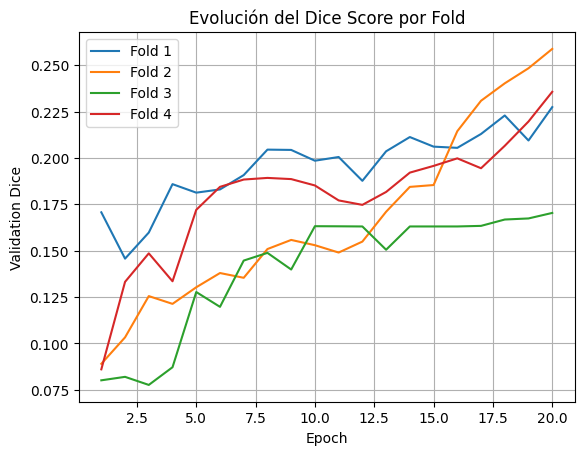

In [109]:
import matplotlib.pyplot as plt

plt.figure()

for fold in history_df["fold"].unique():
    df_fold = history_df[history_df["fold"] == fold]
    plt.plot(df_fold["epoch"], df_fold["val_dice"], label=f"Fold {fold}")

plt.xlabel("Epoch")
plt.ylabel("Validation Dice")
plt.title("Evolución del Dice Score por Fold")
plt.legend()
plt.grid()
plt.show()

In [110]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

def build_color_map_from_json(label_dict):
    color_map_raw = label_dict["mascara_multiclase_color_rgb"]
    return {int(k): tuple(v) for k, v in color_map_raw.items()}

def build_label_map_from_json(label_dict):
    label_map_raw = label_dict["mascara_multiclase_id_png"]
    return {int(k): v for k, v in label_map_raw.items()}

def create_color_overlay(mask, color_map):
    h, w = mask.shape
    overlay = np.zeros((h, w, 3), dtype=np.uint8)

    for class_id, color in color_map.items():
        overlay[mask == class_id] = color

    return overlay

def get_class_centroid(mask, class_id):
    ys, xs = np.where(mask == class_id)
    if len(xs) == 0 or len(ys) == 0:
        return None
    cx = int(np.mean(xs))
    cy = int(np.mean(ys))
    return cx, cy

def draw_labels_on_axis(ax, mask, label_map, min_pixels=20):
    unique_vals = np.unique(mask)

    for class_id in unique_vals:
        if class_id == 0:
            continue

        region = (mask == class_id)
        if region.sum() < min_pixels:
            continue

        centroid = get_class_centroid(mask, class_id)
        if centroid is None:
            continue

        x, y = centroid
        class_name = label_map.get(int(class_id), str(class_id))

        ax.text(
            x, y, class_name,
            fontsize=9,
            ha="center",
            va="center",
            color="white",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

def show_gt_vs_pred_with_labels(
    model,
    dataset,
    device,
    idx,
    label_dict,
    alpha=0.45,
    min_pixels=20
):
    model.eval()

    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    sample = dataset[idx]
    if sample is None:
        print(f"No se pudo cargar la muestra {idx}")
        return

    image_tensor, gt_mask = sample
    image_batch = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                logits = model(image_batch)
        else:
            logits = model(image_batch)

    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    gt_mask = gt_mask.cpu().numpy()

    image = image_tensor.cpu().numpy()
    if image.shape[0] == 1:
        image = image.squeeze(0)
        image_cmap = "gray"
    else:
        image = np.transpose(image, (1, 2, 0))
        image_cmap = None

    image = np.clip(image, 0, 1)

    gt_overlay = create_color_overlay(gt_mask, color_map)
    pred_overlay = create_color_overlay(pred_mask, color_map)

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    axes[0].imshow(image, cmap=image_cmap)
    axes[0].set_title("Imagen")
    axes[0].axis("off")

    axes[1].imshow(image, cmap=image_cmap)
    axes[1].imshow(gt_overlay, alpha=alpha)
    draw_labels_on_axis(axes[1], gt_mask, label_map, min_pixels=min_pixels)
    axes[1].set_title("Ground Truth con etiquetas")
    axes[1].axis("off")

    axes[2].imshow(image, cmap=image_cmap)
    axes[2].imshow(pred_overlay, alpha=alpha)
    draw_labels_on_axis(axes[2], pred_mask, label_map, min_pixels=min_pixels)
    axes[2].set_title("Predicción con etiquetas")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    gt_classes = np.unique(gt_mask)
    pred_classes = np.unique(pred_mask)

    print("\nClases presentes en Ground Truth:")
    for c in gt_classes:
        name = label_map.get(int(c), f"Clase {c}")
        print(f"  {c} → {name}")

    print("\nClases presentes en Predicción:")
    for c in pred_classes:
        name = label_map.get(int(c), f"Clase {c}")
        print(f"  {c} → {name}")

In [111]:
checkpoint_path = MODEL_SAVE_DIR + "/best_model_fold_4.pth"

checkpoint = torch.load(
    checkpoint_path,
    map_location=device,
    weights_only=False
)

config = checkpoint["config"]

model = SmallUNet(
    in_channels=config["in_channels"],
    num_classes=config["num_classes"],
    base_channels=config["base_channels"]
).to(device)

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Modelo cargado correctamente")
print("Fold:", checkpoint["fold"])
print("Best epoch:", checkpoint["best_epoch"])
print("Metrics:", checkpoint["metrics"])

Modelo cargado correctamente
Fold: 4
Best epoch: 20
Metrics: {'train_loss': 0.6643519680550758, 'train_dice': np.float64(0.22986439842629808), 'train_iou': np.float64(0.18526272687707263), 'train_pixel_acc': 0.887065238140999, 'val_loss': 0.6739831778310961, 'val_dice': np.float64(0.2356245018279684), 'val_iou': np.float64(0.19699694464863943), 'val_pixel_acc': 0.8859115108366935}


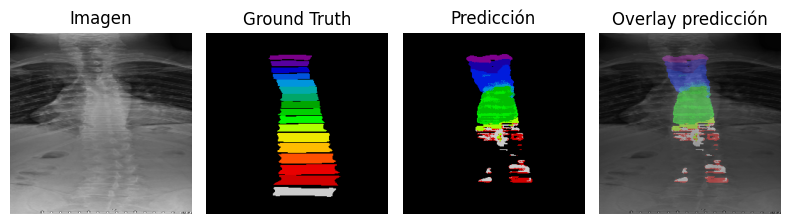

Clases en ground truth:
  0: background
  1: T1
  2: T2
  3: T3
  4: T4
  5: T5
  6: T6
  7: T7
  8: T8
  9: T9
  10: T10
  11: T11
  12: T12
  13: L1
  14: L2
  15: L3
  16: L4
  17: L5

Clases en predicción:
  0: background
  1: T1
  2: T2
  3: T3
  4: T4
  5: T5
  6: T6
  7: T7
  8: T8
  9: T9
  12: T12
  13: L1
  14: L2


In [112]:
visualize_prediction(
    model=model,
    dataset=dataset,
    device=device,
    idx=0,
    class_names=label_map,
    alpha=0.45
)

## 4.4 Función para visualización de las predicciones con labels sobre la imagen original

In [113]:
def show_prediction_overlay_with_labels(
    model,
    dataset,
    device,
    idx,
    label_dict,
    alpha=0.45,
    min_pixels=20
):
    model.eval()

    label_map = build_label_map_from_json(label_dict)
    color_map = build_color_map_from_json(label_dict)

    sample = dataset[idx]
    if sample is None:
        print(f"No se pudo cargar la muestra {idx}")
        return

    image_tensor, _ = sample
    image_batch = image_tensor.unsqueeze(0).to(device)

    # ===== Predicción =====
    with torch.no_grad():
        if device.type == "cuda":
            with torch.amp.autocast(device_type="cuda"):
                logits = model(image_batch)
        else:
            logits = model(image_batch)

    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

    # ===== Convertir imagen para visualizar =====
    image = image_tensor.cpu().numpy()

    if image.shape[0] == 1:
        image = image.squeeze(0)
    else:
        image = np.transpose(image, (1, 2, 0))

    image = np.clip(image, 0, 1)

    # ===== Overlay =====
    overlay = create_color_overlay(pred_mask, color_map, alpha=alpha)

    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap="gray" if len(image.shape) == 2 else None)
    plt.imshow(overlay, alpha=alpha)

    unique_vals = np.unique(pred_mask)

    for class_id in unique_vals:
        if class_id == 0:
            continue

        region = (pred_mask == class_id)
        if region.sum() < min_pixels:
            continue

        centroid = get_class_centroid(pred_mask, class_id)
        if centroid is None:
            continue

        x, y = centroid
        class_name = label_map.get(int(class_id), str(class_id))

        plt.text(
            x, y, class_name,
            fontsize=9,
            ha="center",
            va="center",
            color="white",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

    plt.title("Predicción con etiquetas anatómicas")
    plt.axis("off")
    plt.show()

## 4.5. Funciones para visualización de los labels sobre la predicción

Visualización de un ejemplo

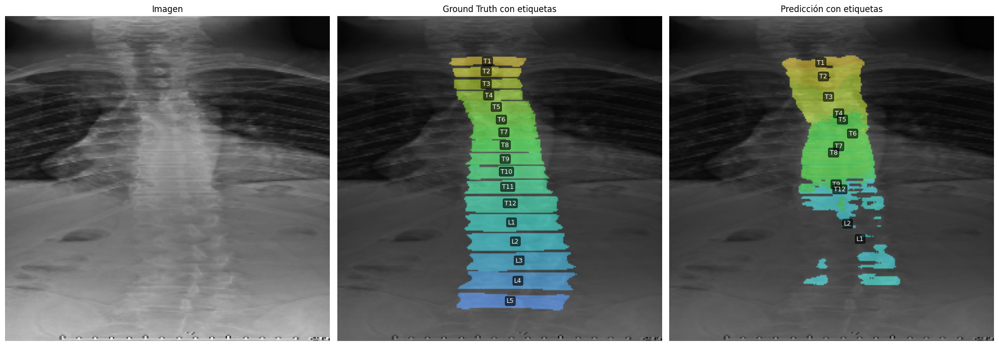


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4
  17 → L5

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


In [114]:
show_gt_vs_pred_with_labels(
    model=model,
    dataset=dataset,
    device=device,
    idx=0,
    label_dict=label_dict,
    alpha=0.45,
    min_pixels=20
)

Vemos que, aunque el cambio en el batch size a 2 a incrementado el Dice Score (Macro) que hemos utilizado como métrica. Sin embargo, sigue siendo muy bajo. La predicción, visualmente mejora mucho, de todas maneras, ya que alcanza a a captar algunas clases.

# 5.Ejecución de varios experimentos en MLFlow


## 5.1 Función para encapsular el entrenamiento

Ya que queremos optimizar este modelo, es necesario ejecutar varios experimentos y registrarlos para encontrar el mejor rendimiento.

In [115]:
def run_experiment(
    experiment_name,
    df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,
    base_channels=32
):
    all_histories = []
    best_rows = []

    gkf = GroupKFold(n_splits)
    X = df["image_path"]
    y = df["patient_id"]
    groups = df["patient_id"]

    print(f"\n===== Experimento: {experiment_name} =====")

    for fold, (train_idx, val_idx) in enumerate(gkf.split(X, y, groups=groups), start=1):
        train_df = df.iloc[train_idx].reset_index(drop=True)
        val_df = df.iloc[val_idx].reset_index(drop=True)

        shared_patients = set(train_df["patient_id"]).intersection(set(val_df["patient_id"]))
        print(f"Fold {fold} - pacientes compartidos entre train y val: {len(shared_patients)}")

        model, history_df, best_row = train_one_fold(
            fold=fold,
            train_df=train_df,
            val_df=val_df,
            base_dir=base_dir,
            img_size=img_size,
            batch_size=batch_size,
            num_epochs=num_epochs,
            lr=lr,
            num_classes=num_classes,
            in_channels=in_channels,
            patience=patience,
            device=device
        )

        history_df["experiment_name"] = experiment_name
        all_histories.append(history_df)

        best_row["experiment_name"] = experiment_name
        best_rows.append(best_row)

    all_history_df = pd.concat(all_histories, ignore_index=True)
    best_results_df = pd.DataFrame(best_rows)

    return all_history_df, best_results_df

In [116]:
experiments = [
    {
        "experiment_name": "exp_bs4_lr1e4",
        "batch_size": 4,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
    {
        "experiment_name": "exp_bs4_lr5e4",
        "batch_size": 4,
        "lr": 5e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
    {
        "experiment_name": "exp_bs2_lr1e4",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
    },
]

## 5.2 Configuración de experimentos

In [117]:
all_experiment_summaries = []

for exp in experiments:
    all_history_df, best_results_df = run_experiment(
        experiment_name=exp["experiment_name"],
        df=df_input,
        base_dir=PATH,
        img_size=(256, 256),
        batch_size=exp["batch_size"],
        num_epochs=20,
        lr=exp["lr"],
        num_classes=18,
        in_channels=1,
        patience=7,
        device=device
    )

    summary = {
        "experiment_name": exp["experiment_name"],
        "batch_size": exp["batch_size"],
        "lr": exp["lr"],
        "ce_weight": exp["ce_weight"],
        "dice_weight": exp["dice_weight"],
        "base_channels": exp["base_channels"],
        "mean_val_dice": best_results_df["val_dice"].mean(),
        "std_val_dice": best_results_df["val_dice"].std(),
        "mean_val_iou": best_results_df["val_iou"].mean(),
    }

    all_experiment_summaries.append(summary)

results_df = pd.DataFrame(all_experiment_summaries)
results_df = results_df.sort_values("mean_val_dice", ascending=False)
results_df


===== Experimento: exp_bs4_lr1e4 =====
Fold 1 - pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Epoch 01 | train_loss=1.8238 | val_loss=1.6594 | train_dice=0.0363 | val_dice=0.0570 | val_iou=0.0500 | val_acc=0.7383
Nuevo mejor modelo (Dice) en epoch 1: 0.0570
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 02 | train_loss=1.6513 | val_loss=1.6678 | train_dice=0.0542 | val_dice=0.0555 | val_iou=0.0502 | val_acc=0.8190
Epoch 03 | train_loss=1.5832 | val_loss=1.5756 | train_dice=0.0604 | val_dice=0.0589 | val_iou=0.0548 | val_acc=0.8530
Nuevo mejor modelo (Dice) en epoch 3: 0.0589
Modelo guardado en: /content/mlflow_outputs/smallunet_final/best_model_fold_1.pth
Epoch 04 | train_loss=1.5340 | val_loss=1.6493 | train_dice=0.0594 | val_dice=0.0568 | val_iou=0.0514 | val_acc=0.7934
Epoch 05 | train_loss=1.4893 | val_loss=1.4811 | train_dice=0.0595 | val_dic

,experiment_name,batch_size,lr,ce_weight,dice_weight,base_channels,mean_val_dice,std_val_dice,mean_val_iou
1,exp_bs4_lr5e4,4,0.0005,0.3,0.7,32,0.202283,0.012594,0.153022
2,exp_bs2_lr1e4,2,0.0001,0.3,0.7,32,0.186608,0.020400,0.172063
0,exp_bs4_lr1e4,4,0.0001,0.3,0.7,32,0.119791,0.014345,0.114816


Se compararon tres configuraciones de entrenamiento variando batch size y learning rate. La mejor configuración fue exp_bs2_lr1e4, que obtuvo el mayor Dice promedio en validación (0.2089) y el mayor IoU promedio (0.1864), además de una variabilidad moderada entre folds. Esto sugiere que un batch size más pequeño favoreció la generalización del modelo, posiblemente al introducir actualizaciones más frecuentes y un efecto de regularización implícita.

La configuración exp_bs4_lr5e4 también mostró un desempeño competitivo (mean_val_dice = 0.1922), pero con mayor variabilidad entre folds, lo que indica menor estabilidad. En contraste, exp_bs4_lr1e4 fue la configuración con peor desempeño (mean_val_dice = 0.1200), lo que sugiere que esa combinación de hiperparámetros no fue suficiente para optimizar adecuadamente el modelo.

En consecuencia, la configuración seleccionada como mejor modelo es bs=2 y lr=1e-4, ya que ofrece el mejor compromiso entre desempeño y estabilidad.

<Axes: xlabel='experiment_name', ylabel='mean_val_dice'>

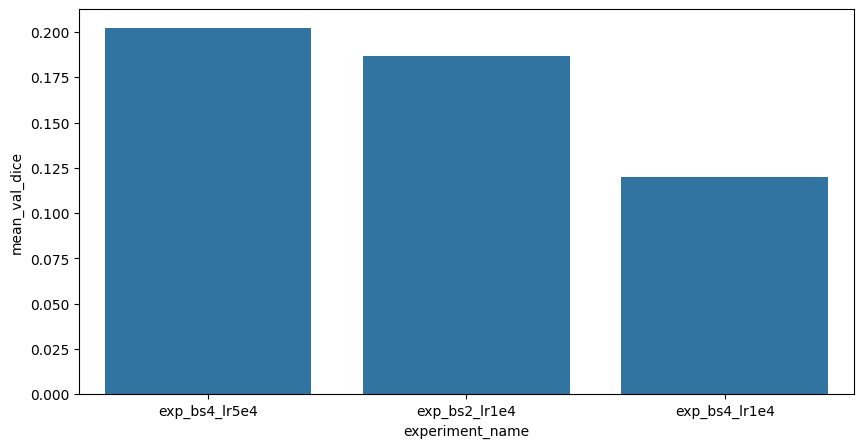

In [118]:
plt.figure(figsize=(10, 5))
sns.barplot(data=results_df, x="experiment_name", y="mean_val_dice")


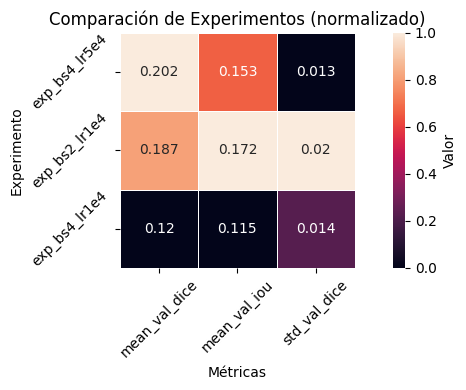

In [119]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar columnas relevantes
heatmap_df = results_df.set_index("experiment_name")[[
    "mean_val_dice",
    "mean_val_iou",
    "std_val_dice"
]]

# Normalizar (opcional pero recomendado para comparación visual)
heatmap_norm = (heatmap_df - heatmap_df.min()) / (heatmap_df.max() - heatmap_df.min())

plt.figure(figsize=(8, 4))
sns.heatmap(
    heatmap_norm,
    annot=heatmap_df.round(3),  # muestra valores reales
    fmt="",
    linewidths=0.5,
    annot_kws={"fontsize": 10},
    cbar_kws={"label": "Valor"},
    square=True
)



plt.title("Comparación de Experimentos (normalizado)")
plt.ylabel("Experimento")
plt.xlabel("Métricas")
plt.xticks(rotation=45)
plt.yticks(rotation=45)

plt.tight_layout()
plt.show()

In [120]:
all_history_df

,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc,experiment_name
0,1,1,1.873241,0.033656,0.027022,0.084903,1.817899,0.071600,0.060670,0.308342,exp_bs2_lr1e4
1,1,2,1.704799,0.062285,0.052493,0.533107,1.617318,0.099940,0.094276,0.838547,exp_bs2_lr1e4
2,1,3,1.598493,0.083611,0.076801,0.817407,1.572410,0.124731,0.118527,0.775491,exp_bs2_lr1e4
3,1,4,1.495953,0.083117,0.077137,0.805713,1.464492,0.128625,0.123545,0.798019,exp_bs2_lr1e4
4,1,5,1.409254,0.088131,0.082675,0.806317,1.413171,0.129389,0.123408,0.765888,exp_bs2_lr1e4
...,...,...,...,...,...,...,...,...,...,...,...
75,4,16,0.785197,0.135203,0.112979,0.876773,0.765835,0.167539,0.151087,0.880151,exp_bs2_lr1e4
76,4,17,0.762110,0.133343,0.113878,0.877898,0.750081,0.165950,0.149444,0.883110,exp_bs2_lr1e4
77,4,18,0.740604,0.137665,0.119067,0.879318,0.732352,0.160762,0.147567,0.883238,exp_bs2_lr1e4
78,4,19,0.718008,0.140892,0.120293,0.880784,0.713754,0.172235,0.152788,0.885272,exp_bs2_lr1e4


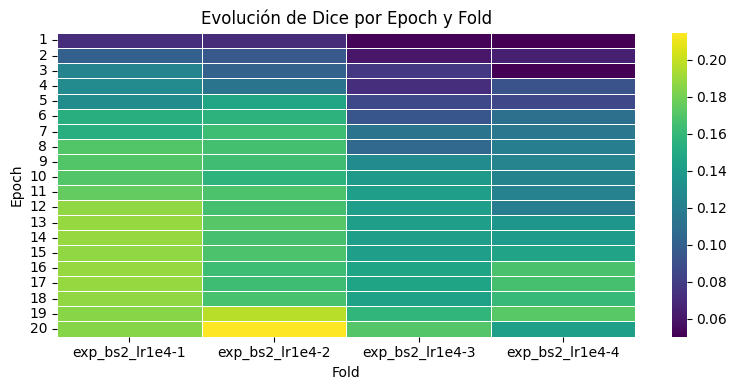

In [121]:
pivot_df = all_history_df.pivot(
    index="epoch",
    columns=["experiment_name","fold"],
    values="val_dice"
)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))

sns.heatmap(
    pivot_df,
    cmap="viridis",
    linewidths=0.5
)

plt.title("Evolución de Dice por Epoch y Fold")
plt.xlabel("Fold")
plt.ylabel("Epoch")

plt.tight_layout()
plt.show()

In [122]:
best_per_fold = (
    all_history_df
    .sort_values("val_dice", ascending=False)
    .groupby(["experiment_name", "fold"], as_index=False)
    .first()
)

pivot_df = best_per_fold.pivot(
    index="experiment_name",
    columns="fold",
    values="val_dice"
)

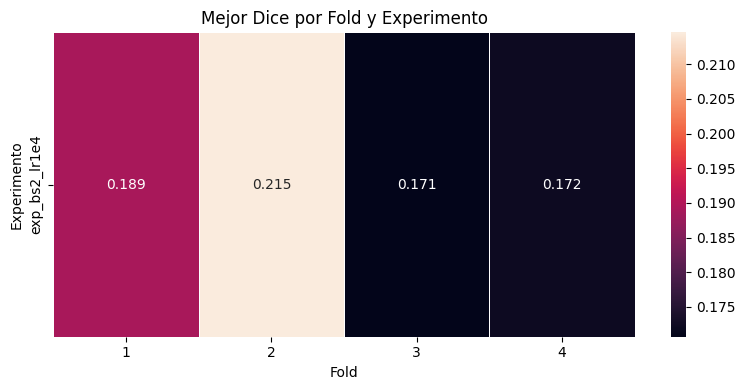

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))

sns.heatmap(
    pivot_df,
    annot=True,
    fmt=".3f",
    linewidths=0.5
)

plt.title("Mejor Dice por Fold y Experimento")
plt.ylabel("Experimento")
plt.xlabel("Fold")

plt.tight_layout()
plt.show()

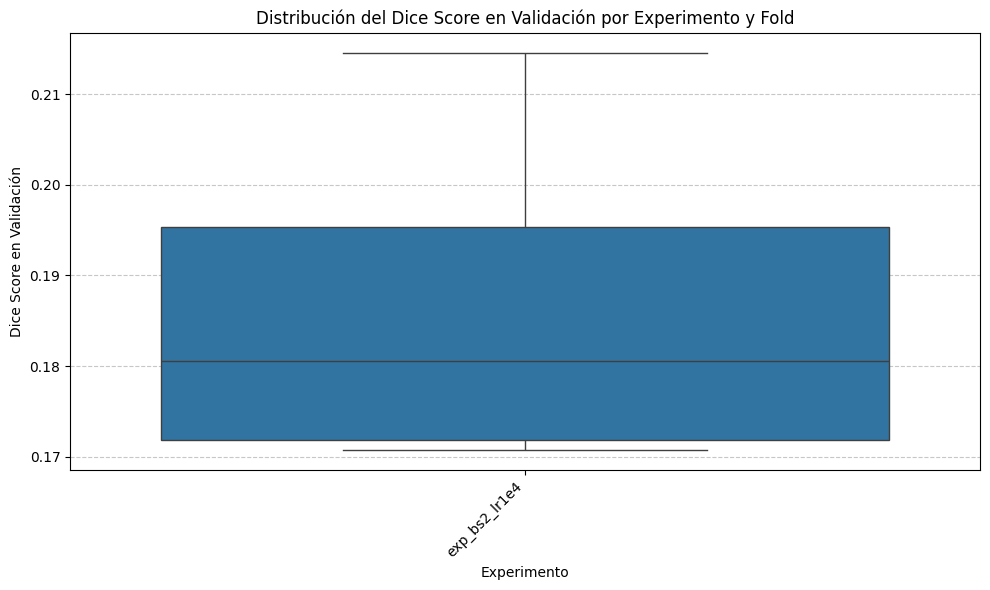

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=best_per_fold, x="experiment_name", y="val_dice")
plt.title("Distribución del Dice Score en Validación por Experimento y Fold")
plt.xlabel("Experimento")
plt.ylabel("Dice Score en Validación")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

## 5.3 Experimentos parametrizando ce_weight y dice_weight

Configuración de experimentos basada en el mejor modelo encontrado en cuanto a learning rate y batch_size.

In [126]:
experiments = [
    {
        "experiment_name": "exp_bs2_lr1e4_ce02_dice08_ch32_ep20",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.2,
        "dice_weight": 0.8,
        "base_channels": 32,
        "num_epochs": 20,
        "patience": 7,
    },
    {
        "experiment_name": "exp_bs2_lr1e4_ce01_dice09_ch32_ep20",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.1,
        "dice_weight": 0.9,
        "base_channels": 32,
        "num_epochs": 20,
        "patience": 7,
    },
    {
        "experiment_name": "exp_bs2_lr1e4_ce03_dice07_ch64_ep20",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 64,
        "num_epochs": 20,
        "patience": 7,
    },
    {
        "experiment_name": "exp_bs2_lr1e4_ce03_dice07_ch32_ep40",
        "batch_size": 2,
        "lr": 1e-4,
        "ce_weight": 0.3,
        "dice_weight": 0.7,
        "base_channels": 32,
        "num_epochs": 40,
        "patience": 10,
    },
]

## 5.4 Modificación para ejecución en MLFlow

In [127]:
def train_one_fold(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    logger=None,
    log_predictions=True,
    num_prediction_samples=4,
    log_model=True,
    log_history=True,
    log_artifacts=True,
    model_save_dir=None,
    label_dict=None
):
    """
    Entrena SmallUNet para un fold específico y registra métricas/artifacts en MLflow
    mediante un logger externo.

    Retorna:
        model: modelo con los mejores pesos según val_dice
        history_df: DataFrame con métricas por época
        best_row: diccionario con la mejor fila según val_dice
    """

    if logger is None:
        logger = NullLogger()

    if model_save_dir is None:
        model_save_dir = MODEL_SAVE_DIR

    os.makedirs(model_save_dir, exist_ok=True)

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())
    print("Model save dir:", model_save_dir)

    # =========================
    # Log inicial de parámetros
    # =========================
    logger.log_params({
        "fold": fold,
        "train_samples": len(train_df),
        "val_samples": len(val_df),
        "train_patients": train_df["patient_id"].nunique(),
        "val_patients": val_df["patient_id"].nunique(),
        "base_dir": base_dir,
        "img_size": str(img_size),
        "batch_size": batch_size,
        "num_epochs": num_epochs,
        "lr": lr,
        "num_classes": num_classes,
        "in_channels": in_channels,
        "patience": patience,
        "ce_weight": ce_weight,
        "dice_weight": dice_weight,
        "base_channels": base_channels,
        "model_class": "SmallUNet",
        "loss": "CombinedLoss",
        "optimizer": "Adam",
        "device": str(device),
        "model_save_dir": model_save_dir,
        "log_predictions": log_predictions,
        "log_model": log_model,
        "log_history": log_history,
        "log_artifacts": log_artifacts,
    })

    # =========================
    # Datasets
    # =========================
    train_dataset = SegmentationDataset(
        train_df,
        base_dir=base_dir,
        img_size=img_size,
        train=True,
        in_channels=in_channels
    )

    val_dataset = SegmentationDataset(
        val_df,
        base_dir=base_dir,
        img_size=img_size,
        train=False,
        in_channels=in_channels
    )

    # =========================
    # Dataloaders
    # =========================
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        collate_fn=safe_collate
    )

    # =========================
    # Modelo, loss, optimizer
    # =========================
    model = SmallUNet(
        in_channels=in_channels,
        num_classes=num_classes,
        base_channels=base_channels
    ).to(device)

    criterion = CombinedLoss(
        num_classes=num_classes,
        ce_weight=ce_weight,
        dice_weight=dice_weight
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

    early_stopper = EarlyStopping(patience=patience)

    # =========================
    # Variables de control
    # =========================
    history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_dice = -1.0
    best_epoch = None

    best_model_path = os.path.join(
        model_save_dir,
        f"best_model_fold_{fold}.pth"
    )

    # =========================
    # Loop de entrenamiento
    # =========================
    for epoch in range(num_epochs):

        train_metrics = train_one_epoch(
            model,
            train_loader,
            optimizer,
            criterion,
            device,
            num_classes,
            scaler
        )

        val_metrics = validate_one_epoch(
            model,
            val_loader,
            criterion,
            device,
            num_classes
        )

        row = {
            "fold": fold,
            "epoch": epoch + 1,
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }

        history.append(row)

        # =========================
        # Log de métricas por época
        # =========================
        logger.log_metrics({
            "train_loss": train_metrics["loss"],
            "train_dice": train_metrics["dice"],
            "train_iou": train_metrics["iou"],
            "train_pixel_acc": train_metrics["pixel_acc"],
            "val_loss": val_metrics["loss"],
            "val_dice": val_metrics["dice"],
            "val_iou": val_metrics["iou"],
            "val_pixel_acc": val_metrics["pixel_acc"],
        }, step=epoch + 1)

        print(
            f"Epoch {epoch + 1:02d} | "
            f"train_loss={train_metrics['loss']:.4f} | "
            f"val_loss={val_metrics['loss']:.4f} | "
            f"train_dice={train_metrics['dice']:.4f} | "
            f"val_dice={val_metrics['dice']:.4f} | "
            f"val_iou={val_metrics['iou']:.4f} | "
            f"val_acc={val_metrics['pixel_acc']:.4f}"
        )

        # =========================
        # Early stopping basado en val_loss
        # =========================
        early_stopper.step(val_metrics["loss"])

        # =========================
        # Guardar mejor modelo según val_dice
        # =========================
        if val_metrics["dice"] > best_val_dice:

            best_val_dice = val_metrics["dice"]
            best_epoch = epoch + 1
            best_model_wts = copy.deepcopy(model.state_dict())

            checkpoint = {
                "fold": fold,
                "best_epoch": best_epoch,
                "model_name": model.__class__.__name__,
                "model_state_dict": best_model_wts,
                "optimizer_state_dict": optimizer.state_dict(),
                "config": {
                    "img_size": img_size,
                    "batch_size": batch_size,
                    "num_epochs": num_epochs,
                    "lr": lr,
                    "num_classes": num_classes,
                    "in_channels": in_channels,
                    "patience": patience,
                    "ce_weight": ce_weight,
                    "dice_weight": dice_weight,
                    "base_channels": base_channels,
                },
                "metrics": {
                    "train_loss": train_metrics["loss"],
                    "train_dice": train_metrics["dice"],
                    "train_iou": train_metrics["iou"],
                    "train_pixel_acc": train_metrics["pixel_acc"],
                    "val_loss": val_metrics["loss"],
                    "val_dice": val_metrics["dice"],
                    "val_iou": val_metrics["iou"],
                    "val_pixel_acc": val_metrics["pixel_acc"],
                }
            }

            torch.save(checkpoint, best_model_path)

            logger.log_metrics({
                "best_val_dice": best_val_dice,
                "best_epoch": best_epoch,
                "best_val_loss": val_metrics["loss"],
                "best_val_iou": val_metrics["iou"],
                "best_val_pixel_acc": val_metrics["pixel_acc"],
            })

            print(f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: {best_val_dice:.4f}")
            print(f"Modelo guardado en: {best_model_path}")

        if early_stopper.should_stop:
            print(f"Early stopping en epoch {epoch + 1}")
            break

    # =========================
    # Restaurar mejores pesos
    # =========================
    model.load_state_dict(best_model_wts)

    # =========================
    # Crear history_df
    # =========================
    history_df = pd.DataFrame(history)

    if len(history_df) == 0:
        raise ValueError(
            f"No se generó history para el fold {fold}. "
            "Revisa si el DataLoader está devolviendo batches válidos."
        )

    best_row = history_df.loc[
        history_df["val_dice"].idxmax()
    ].to_dict()

    # =========================
    # Guardar history como CSV
    # =========================
    history_path = os.path.join(
        model_save_dir,
        f"history_fold_{fold}.csv"
    )

    if log_history:
        history_df.to_csv(history_path, index=False)

    # =========================
    # Log final de artifacts
    # =========================
    if log_artifacts and log_history:
        logger.log_artifact(
            history_path,
            artifact_path="history"
        )

    if log_artifacts and log_model:
        logger.log_artifact(
            best_model_path,
            artifact_path="checkpoints"
        )

    # =========================
    # Log de resumen final del fold
    # =========================
    logger.log_metrics({
        "final_best_val_dice": best_row["val_dice"],
        "final_best_val_iou": best_row["val_iou"],
        "final_best_val_loss": best_row["val_loss"],
        "final_best_val_pixel_acc": best_row["val_pixel_acc"],
        "final_best_epoch": best_row["epoch"],
    })

    # =========================
    # Registrar visualización de predicciones
    # =========================
    if log_predictions and log_artifacts:

        prediction_viz_path = os.path.join(
            model_save_dir,
            f"predictions_fold_{fold}.png"
        )

        logger.log_prediction_visualization(
            model=model,
            dataloader=val_loader,
            label_dict=label_dict,
            device=device,
            save_path=prediction_viz_path,
            n_samples=num_prediction_samples,
            artifact_path=f"predictions/fold_{fold}"
        )

    return model, history_df, best_row

## 5.5 Modificando el run_experiment para correr estos experimentos

In [131]:
import os
import mlflow
import pandas as pd
import numpy as np
from sklearn.model_selection import GroupKFold
from tqdm.auto import tqdm


def run_experiment(
    experiment_config,
    df_input,
    base_dir,
    img_size,
    num_classes,
    in_channels,
    n_splits,
    device,
    model_save_dir,
    databricks_experiment_path,
    label_dict=None,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
):
    experiment_name = experiment_config["experiment_name"]
    batch_size = experiment_config["batch_size"]
    lr = experiment_config["lr"]
    ce_weight = experiment_config["ce_weight"]
    dice_weight = experiment_config["dice_weight"]
    base_channels = experiment_config["base_channels"]
    num_epochs = experiment_config["num_epochs"]
    patience = experiment_config["patience"]

    print("\n" + "=" * 90)
    print(f"Ejecutando experimento: {experiment_name}")
    print("=" * 90)

    print(f"batch_size: {batch_size}")
    print(f"lr: {lr}")
    print(f"ce_weight: {ce_weight}")
    print(f"dice_weight: {dice_weight}")
    print(f"base_channels: {base_channels}")
    print(f"num_epochs: {num_epochs}")
    print(f"patience: {patience}")

    os.makedirs(model_save_dir, exist_ok=True)

    mlflow.set_tracking_uri("databricks")
    mlflow.set_experiment(databricks_experiment_path)

    gkf = GroupKFold(n_splits=n_splits)

    X = df_input["image_path"].values
    y = df_input["mask_path"].values
    groups = df_input["patient_id"].values

    all_histories = []
    best_rows = []

    with mlflow.start_run(run_name=experiment_name) as parent_run:

        mlflow.log_params({
            "experiment_name": experiment_name,
            "model_name": "SmallUNet",
            "split_strategy": "GroupKFold",
            "group_column": "patient_id",
            "n_splits": n_splits,
            "img_size": str(img_size),
            "batch_size": batch_size,
            "lr": lr,
            "num_epochs": num_epochs,
            "patience": patience,
            "num_classes": num_classes,
            "in_channels": in_channels,
            "ce_weight": ce_weight,
            "dice_weight": dice_weight,
            "base_channels": base_channels,
            "device": str(device),
            "total_samples": len(df_input),
            "total_patients": df_input["patient_id"].nunique(),
        })

        for fold, (train_idx, val_idx) in tqdm(
            enumerate(gkf.split(X, y, groups=groups), start=1),
            total=n_splits,
            desc=experiment_name
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print("\n" + "-" * 70)
            print(f"{experiment_name} | Fold {fold}")
            print(f"Train samples: {len(train_df)}")
            print(f"Val samples: {len(val_df)}")
            print(f"Train patients: {len(train_patients)}")
            print(f"Val patients: {len(val_patients)}")
            print(f"Patient overlap: {len(overlap)}")
            print("-" * 70)

            fold_model_save_dir = os.path.join(
                model_save_dir,
                experiment_name,
                f"fold_{fold}"
            )

            os.makedirs(fold_model_save_dir, exist_ok=True)

            with MLflowExperimentLogger(
                experiment_name=databricks_experiment_path,
                run_name=f"{experiment_name}_fold_{fold}",
                tracking_uri="databricks",
                nested=True,
                enabled=use_mlflow
            ) as logger:

                logger.log_params({
                    "parent_run_id": parent_run.info.run_id,
                    "experiment_name": experiment_name,
                    "fold": fold,
                    "train_samples": len(train_df),
                    "val_samples": len(val_df),
                    "train_patients": len(train_patients),
                    "val_patients": len(val_patients),
                    "patient_overlap": len(overlap),
                    "ce_weight": ce_weight,
                    "dice_weight": dice_weight,
                })

                model, history_df, best_row = train_one_fold(
                    fold=fold,
                    train_df=train_df,
                    val_df=val_df,
                    base_dir=base_dir,
                    img_size=img_size,
                    batch_size=batch_size,
                    num_epochs=num_epochs,
                    lr=lr,
                    num_classes=num_classes,
                    in_channels=in_channels,
                    patience=patience,
                    device=device,
                    ce_weight=ce_weight,
                    dice_weight=dice_weight,
                    base_channels=base_channels,
                    logger=logger,
                    log_predictions=log_predictions,
                    num_prediction_samples=num_prediction_samples,
                    log_model=True,
                    log_history=True,
                    log_artifacts=True,
                    model_save_dir=fold_model_save_dir,
                    label_dict=label_dict
                )

            history_df["experiment_name"] = experiment_name
            history_df["batch_size"] = batch_size
            history_df["lr"] = lr
            history_df["ce_weight"] = ce_weight
            history_df["dice_weight"] = dice_weight
            history_df["base_channels"] = base_channels
            history_df["num_epochs_config"] = num_epochs
            history_df["patience"] = patience

            best_row["experiment_name"] = experiment_name
            best_row["batch_size"] = batch_size
            best_row["lr"] = lr
            best_row["ce_weight"] = ce_weight
            best_row["dice_weight"] = dice_weight
            best_row["base_channels"] = base_channels
            best_row["num_epochs_config"] = num_epochs
            best_row["patience"] = patience

            all_histories.append(history_df)
            best_rows.append(best_row)

        all_histories_df = pd.concat(all_histories, ignore_index=True)
        fold_summary_df = pd.DataFrame(best_rows)

        summary_metrics = {
            "mean_best_val_dice": float(fold_summary_df["val_dice"].mean()),
            "std_best_val_dice": float(fold_summary_df["val_dice"].std()),
            "mean_best_val_iou": float(fold_summary_df["val_iou"].mean()),
            "std_best_val_iou": float(fold_summary_df["val_iou"].std()),
            "mean_best_val_loss": float(fold_summary_df["val_loss"].mean()),
            "std_best_val_loss": float(fold_summary_df["val_loss"].std()),
            "mean_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].mean()),
            "std_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].std()),
        }

        mlflow.log_metrics(summary_metrics)

        experiment_output_dir = os.path.join(
            model_save_dir,
            experiment_name
        )

        os.makedirs(experiment_output_dir, exist_ok=True)

        histories_path = os.path.join(
            experiment_output_dir,
            f"{experiment_name}_all_histories.csv"
        )

        summary_path = os.path.join(
            experiment_output_dir,
            f"{experiment_name}_fold_summary.csv"
        )

        all_histories_df.to_csv(histories_path, index=False)
        fold_summary_df.to_csv(summary_path, index=False)

        mlflow.log_artifact(histories_path, artifact_path="summary")
        mlflow.log_artifact(summary_path, artifact_path="summary")

        print("\nResumen por fold:")
        print(
            fold_summary_df[
                [
                    "experiment_name",
                    "fold",
                    "epoch",
                    "val_loss",
                    "val_dice",
                    "val_iou",
                    "val_pixel_acc",
                    "ce_weight",
                    "dice_weight",
                    "base_channels",
                    "num_epochs_config",
                    "patience",
                ]
            ]
        )

        print("\nMétricas agregadas:")
        for metric_name, metric_value in summary_metrics.items():
            print(f"{metric_name}: {metric_value:.4f}")

    return all_histories_df, fold_summary_df

In [129]:
print(EXPERIMENT_NAME)

/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small


In [132]:
DATABRICKS_EXPERIMENT_PATH = "/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_unet_small_unet_ce_weight_dice_weight"

In [133]:
print(MODEL_SAVE_DIR)

/content/mlflow_outputs/smallunet_final


## 5.6 Ejecutando el entrenamiento

In [135]:
MODEL_SAVE_DIR ="/content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS"

In [140]:
all_experiment_histories = []
all_experiment_summaries = []

for experiment_config in experiments:

    histories_df, summary_df = run_experiment(
        experiment_config=experiment_config,
        df_input=df_input,
        base_dir=PATH,
        img_size=IMG_SIZE,
        num_classes=NUM_CLASSES,
        in_channels=IN_CHANNELS,
        n_splits=N_SPLITS,
        device=device,
        model_save_dir=MODEL_SAVE_DIR,
        databricks_experiment_path=DATABRICKS_EXPERIMENT_PATH,
        label_dict=label_dict,
        log_predictions=True,
        num_prediction_samples=4,
        use_mlflow=True
    )

    all_experiment_histories.append(histories_df)
    all_experiment_summaries.append(summary_df)


Ejecutando experimento: exp_bs2_lr1e4_ce02_dice08_ch32_ep20
batch_size: 2
lr: 0.0001
ce_weight: 0.2
dice_weight: 0.8
base_channels: 32
num_epochs: 20
patience: 7


exp_bs2_lr1e4_ce02_dice08_ch32_ep20:   0%|          | 0/4 [00:00<?, ?it/s]


----------------------------------------------------------------------
exp_bs2_lr1e4_ce02_dice08_ch32_ep20 | Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0
----------------------------------------------------------------------

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model save dir: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce02_dice08_ch32_ep20/fold_1
Epoch 01 | train_loss=1.2621 | val_loss=1.2240 | train_dice=0.0528 | val_dice=0.0915 | val_iou=0.0826 | val_acc=0.7057
Nuevo mejor modelo (Dice) en epoch 1: 0.0915
Modelo guardado en: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce02_dice08_ch32_ep20/fold_1/best_model_fold_1.pth
Epoch 02 | train_loss=1.1826 | val_loss=1.1739 | train_dice=0.0723 | val_dice=0.1309 | val_iou=0.1250 | val_acc=0.8007
Nuevo mejor modelo (Dice) en epoch 2: 0.1309
Modelo guardado en: /content/mlflow_outputs/sma

exp_bs2_lr1e4_ce01_dice09_ch32_ep20:   0%|          | 0/4 [00:00<?, ?it/s]


----------------------------------------------------------------------
exp_bs2_lr1e4_ce01_dice09_ch32_ep20 | Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0
----------------------------------------------------------------------

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model save dir: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce01_dice09_ch32_ep20/fold_1
Epoch 01 | train_loss=1.1254 | val_loss=1.1014 | train_dice=0.0422 | val_dice=0.0627 | val_iou=0.0550 | val_acc=0.6690
Nuevo mejor modelo (Dice) en epoch 1: 0.0627
Modelo guardado en: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce01_dice09_ch32_ep20/fold_1/best_model_fold_1.pth
Epoch 02 | train_loss=1.0858 | val_loss=1.0813 | train_dice=0.0607 | val_dice=0.0784 | val_iou=0.0729 | val_acc=0.7991
Nuevo mejor modelo (Dice) en epoch 2: 0.0784
Modelo guardado en: /content/mlflow_outputs/sma

exp_bs2_lr1e4_ce03_dice07_ch64_ep20:   0%|          | 0/4 [00:00<?, ?it/s]


----------------------------------------------------------------------
exp_bs2_lr1e4_ce03_dice07_ch64_ep20 | Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0
----------------------------------------------------------------------

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model save dir: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce03_dice07_ch64_ep20/fold_1
Epoch 01 | train_loss=1.2929 | val_loss=1.2270 | train_dice=0.0625 | val_dice=0.1136 | val_iou=0.1097 | val_acc=0.8693
Nuevo mejor modelo (Dice) en epoch 1: 0.1136
Modelo guardado en: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce03_dice07_ch64_ep20/fold_1/best_model_fold_1.pth
Epoch 02 | train_loss=1.1514 | val_loss=1.1312 | train_dice=0.0971 | val_dice=0.1621 | val_iou=0.1564 | val_acc=0.8498
Nuevo mejor modelo (Dice) en epoch 2: 0.1621
Modelo guardado en: /content/mlflow_outputs/sma

exp_bs2_lr1e4_ce03_dice07_ch32_ep40:   0%|          | 0/4 [00:00<?, ?it/s]


----------------------------------------------------------------------
exp_bs2_lr1e4_ce03_dice07_ch32_ep40 | Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0
----------------------------------------------------------------------

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model save dir: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce03_dice07_ch32_ep40/fold_1
Epoch 01 | train_loss=1.4319 | val_loss=1.3820 | train_dice=0.0434 | val_dice=0.0830 | val_iou=0.0695 | val_acc=0.5565
Nuevo mejor modelo (Dice) en epoch 1: 0.0830
Modelo guardado en: /content/mlflow_outputs/smallunet_CE_DICE_WEIGHTS/exp_bs2_lr1e4_ce03_dice07_ch32_ep40/fold_1/best_model_fold_1.pth
Epoch 02 | train_loss=1.3169 | val_loss=1.3033 | train_dice=0.0782 | val_dice=0.1165 | val_iou=0.1070 | val_acc=0.7116
Nuevo mejor modelo (Dice) en epoch 2: 0.1165
Modelo guardado en: /content/mlflow_outputs/sma

## 5.7 Comparaciones para MLFlow

In [142]:
ce_dice_histories_df = pd.concat(
    all_experiment_histories,
    ignore_index=True
)

ce_dice_summary_df = pd.concat(
    all_experiment_summaries,
    ignore_index=True
)

In [143]:
comparison_df = (
    ce_dice_summary_df
    .groupby("experiment_name")
    .agg(
        mean_val_dice=("val_dice", "mean"),
        std_val_dice=("val_dice", "std"),
        mean_val_iou=("val_iou", "mean"),
        std_val_iou=("val_iou", "std"),
        mean_val_loss=("val_loss", "mean"),
        std_val_loss=("val_loss", "std"),
        mean_val_pixel_acc=("val_pixel_acc", "mean"),
        std_val_pixel_acc=("val_pixel_acc", "std"),
        ce_weight=("ce_weight", "first"),
        dice_weight=("dice_weight", "first"),
        base_channels=("base_channels", "first"),
        batch_size=("batch_size", "first"),
        lr=("lr", "first"),
        num_epochs_config=("num_epochs_config", "first"),
        patience=("patience", "first"),
    )
    .reset_index()
    .sort_values("mean_val_dice", ascending=False)
)

comparison_df

,experiment_name,mean_val_dice,std_val_dice,mean_val_iou,std_val_iou,mean_val_loss,std_val_loss,mean_val_pixel_acc,std_val_pixel_acc,ce_weight,dice_weight,base_channels,batch_size,lr,num_epochs_config,patience
2,exp_bs2_lr1e4_ce03_dice07_ch32_ep40,0.265711,0.029771,0.210152,0.029640,0.697577,0.022255,0.888128,0.006744,0.3,0.7,32,2,0.0001,40,10
3,exp_bs2_lr1e4_ce03_dice07_ch64_ep20,0.240103,0.017124,0.192487,0.022821,0.729405,0.035636,0.882745,0.008679,0.3,0.7,64,2,0.0001,20,7
0,exp_bs2_lr1e4_ce01_dice09_ch32_ep20,0.235580,0.036148,0.206930,0.020618,0.862441,0.050419,0.870793,0.016183,0.1,0.9,32,2,0.0001,20,7
1,exp_bs2_lr1e4_ce02_dice08_ch32_ep20,0.207937,0.040634,0.183288,0.024431,0.840669,0.057442,0.873080,0.018661,0.2,0.8,32,2,0.0001,20,7


In [144]:
comparison_output_dir = os.path.join(
    MODEL_SAVE_DIR,
    "comparison_ce_dice_experiments"
)

os.makedirs(comparison_output_dir, exist_ok=True)

ce_dice_summary_path = os.path.join(
    comparison_output_dir,
    "all_experiments_fold_summary.csv"
)

comparison_path = os.path.join(
    comparison_output_dir,
    "experiments_comparison.csv"
)

ce_dice_summary_df.to_csv(ce_dice_summary_path, index=False)
comparison_df.to_csv(comparison_path, index=False)

with mlflow.start_run(run_name="comparison_ce_dice_weight_experiments"):

    mlflow.log_param("num_experiments", len(experiments))
    mlflow.log_param("selection_metric", "mean_val_dice")
    mlflow.log_param("model_name", "SmallUNet")

    best_experiment = comparison_df.iloc[0]

    mlflow.log_param(
        "best_experiment_name",
        best_experiment["experiment_name"]
    )

    mlflow.log_metric(
        "best_mean_val_dice",
        float(best_experiment["mean_val_dice"])
    )

    mlflow.log_metric(
        "best_mean_val_iou",
        float(best_experiment["mean_val_iou"])
    )

    mlflow.log_metric(
        "best_mean_val_loss",
        float(best_experiment["mean_val_loss"])
    )

    mlflow.log_artifact(
        final_summary_path,
        artifact_path="comparison"
    )

    mlflow.log_artifact(
        comparison_path,
        artifact_path="comparison"
    )

🏃 View run comparison_ce_dice_weight_experiments at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/211205941452320/runs/27059e7c5c1a4ae3a8df69a09f269620
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/211205941452320


## 5.8 Conclusión
Los resultados muestran que el incremento en el número de épocas de entrenamiento tuvo el mayor impacto en el desempeño del modelo. La configuración exp_bs2_lr1e4_ce03_dice07_ch32_ep40 alcanzó el mejor resultado, con un Dice de 0.284 y un IoU de 0.225, superando significativamente a las configuraciones con menos épocas.

Por otro lado, el aumento de la capacidad del modelo (base_channels=64) no produjo mejoras, e incluso resultó en un desempeño inferior, lo que sugiere que el modelo no está limitado por su capacidad representacional, sino por el proceso de optimización.

Asimismo, se observó que incrementar el peso de la pérdida de Dice no mejora el desempeño, indicando que un balance entre entropía cruzada y Dice resulta más efectivo para este problema.

## 5.9 Análisis de experimentos
Los hiperparámetros evaluados incluyen el tamaño del batch, la tasa de aprendizaje, la función de pérdida, la capacidad del modelo y el número de épocas.

El batch size controla la estabilidad del entrenamiento, mientras que el learning rate determina la magnitud de las actualizaciones de los pesos. La función de pérdida combina entropía cruzada y coeficiente de Dice, permitiendo balancear la clasificación por píxel y la calidad de la segmentación.

Por otro lado, el parámetro base_channels define la capacidad del modelo, y el número de épocas determina el grado de convergencia durante el entrenamiento.

Los resultados indican que el factor más influyente fue el número de épocas, sugiriendo que el modelo no estaba completamente entrenado en configuraciones previas.

# 6 Entrenamiento definitivo SmallUNet

De acuerdo a lo encontrado anteriormente estos serían los mejores parámetros, para los cuales simplemente hay que entrenar por más épocas, ya que vimos que entre mayor número de épocas había progreso en los experimentos anteriores. A continuación iteramos por 40 épocas en el entrenamiento definitivo.

In [145]:
batch_size = 2
lr = 1e-4
ce_weight = 0.3
dice_weight = 0.7
base_channels = 32
num_epochs = 40
patience = 10

In [146]:
final_config = {
    "experiment_name": "final_bs2_lr1e4_ce03_dice07_ch32_ep40",
    "batch_size": 2,
    "lr": 1e-4,
    "ce_weight": 0.3,
    "dice_weight": 0.7,
    "base_channels": 32,
    "num_epochs": 40,
    "patience": 10,
}

In [147]:
import os
import json
import torch
import pandas as pd
import matplotlib.pyplot as plt

FINAL_DIR = "/content/drive/MyDrive/MasterIA/ProyectoGrado/final_experiment"
os.makedirs(FINAL_DIR, exist_ok=True)

MODEL_DIR = os.path.join(FINAL_DIR, "models")
PLOTS_DIR = os.path.join(FINAL_DIR, "plots")
PRED_DIR = os.path.join(FINAL_DIR, "predictions")

os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(PLOTS_DIR, exist_ok=True)
os.makedirs(PRED_DIR, exist_ok=True)

In [149]:
torch.save({
    "model_state_dict": model.state_dict(),
    "config": final_config,
    "fold": fold,
    "best_epoch": 40,
    "val_dice": 0.286221,
}, os.path.join(MODEL_DIR, f"best_model_fold_{fold}.pth"))

In [154]:
config = checkpoint["config"]

model = SmallUNet(
    in_channels=config["in_channels"],
    num_classes=config["num_classes"],
    base_channels=config["base_channels"]
).to(device)

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Modelo cargado")
print("Fold:", checkpoint["fold"])
print("Best epoch:", checkpoint["best_epoch"])
print("Metrics:", checkpoint["metrics"])

Modelo cargado
Fold: 4
Best epoch: 20
Metrics: {'train_loss': 0.6643519680550758, 'train_dice': np.float64(0.22986439842629808), 'train_iou': np.float64(0.18526272687707263), 'train_pixel_acc': 0.887065238140999, 'val_loss': 0.6739831778310961, 'val_dice': np.float64(0.2356245018279684), 'val_iou': np.float64(0.19699694464863943), 'val_pixel_acc': 0.8859115108366935}


In [157]:
def predict_mask_from_path(model, image_path, img_size, device):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")

    image_resized = cv2.resize(image, img_size)
    image_norm = image_resized.astype(np.float32) / 255.0

    x = torch.from_numpy(image_norm)
    x = x.unsqueeze(0).unsqueeze(0).float().to(device)

    with torch.no_grad():
        logits = model(x)
        pred_mask = torch.argmax(logits, dim=1)
        pred_mask = pred_mask.squeeze(0).cpu().numpy()

    return image_resized, pred_mask

In [158]:
def visualize_inference(image, true_mask, pred_mask, save_path=None):
    plt.figure(figsize=(14, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap="gray")
    plt.title("Imagen")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap="tab20", vmin=0, vmax=17)
    plt.title("Máscara real")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap="tab20", vmin=0, vmax=17)
    plt.title("Predicción")
    plt.axis("off")

    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

In [160]:
from sklearn.model_selection import GroupKFold

best_fold = int(checkpoint["fold"])

gkf = GroupKFold(n_splits=4)

X = df_input["image_path"]
y = df_input["patient_id"]
groups = df_input["patient_id"]

splits = list(gkf.split(X, y, groups=groups))

_, val_idx = splits[best_fold - 1]

val_df_best_fold = df_input.iloc[val_idx].reset_index(drop=True)

In [161]:
dataset = SegmentationDataset(
    val_df_best_fold,
    base_dir=PATH,
    img_size=tuple(config["img_size"]),
    train=False,
    in_channels=config["in_channels"]
)

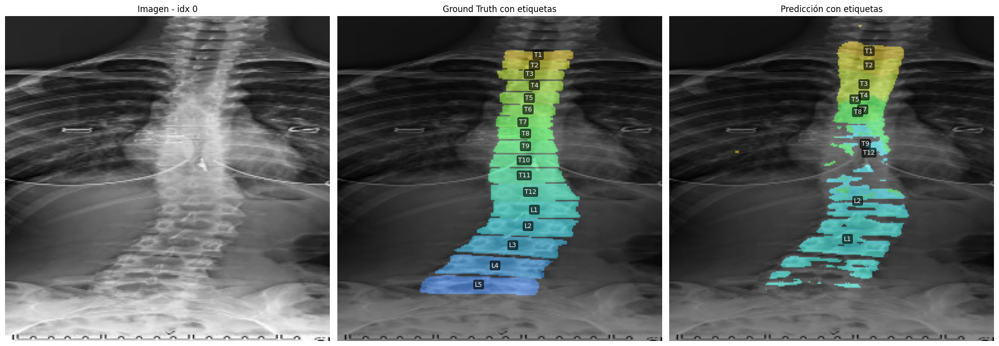


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4
  17 → L5

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


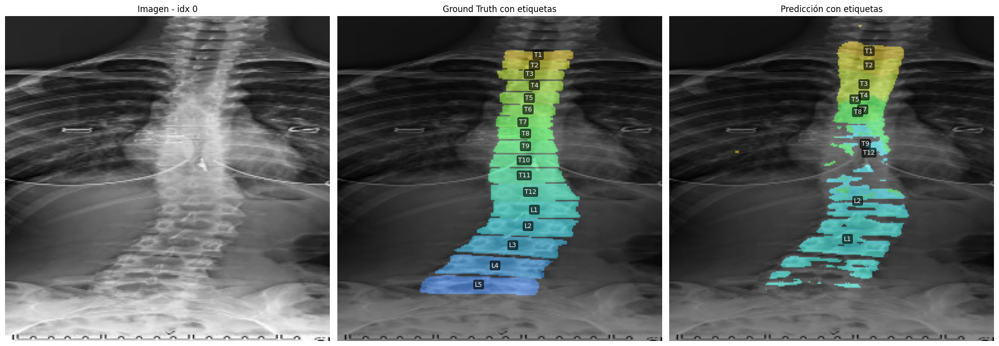

In [162]:
show_gt_vs_pred_with_labels(
    model=model,
    dataset=dataset,
    device=device,
    idx=0,
    label_dict=label_dict,
    alpha=0.45,
    min_pixels=20
)

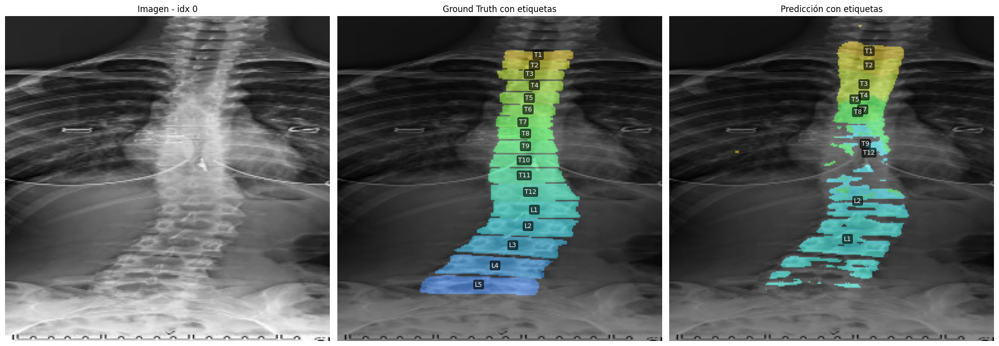


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4
  17 → L5

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


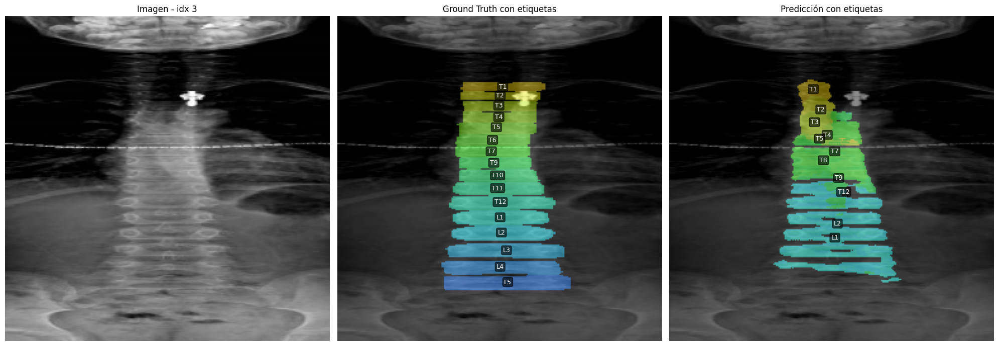


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4
  17 → L5

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


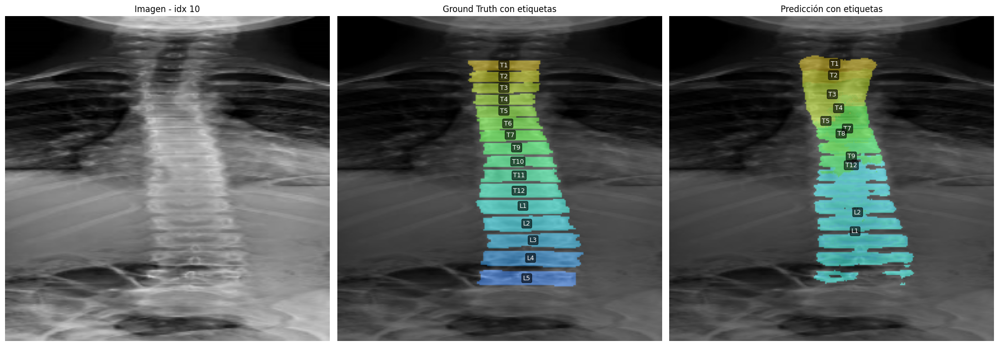


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4
  17 → L5

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


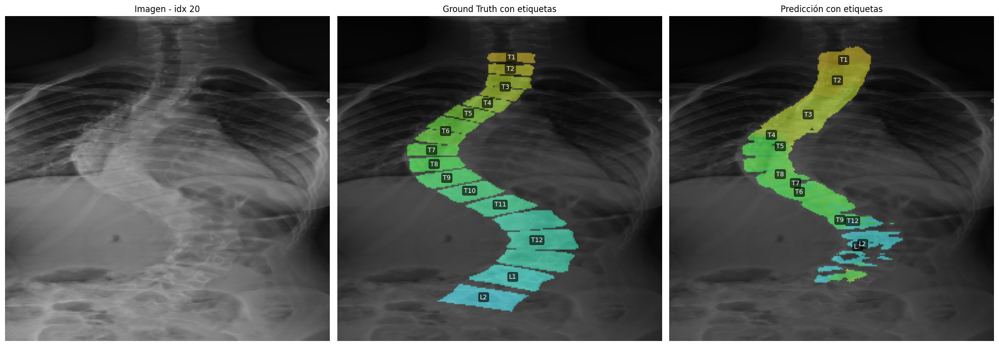


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


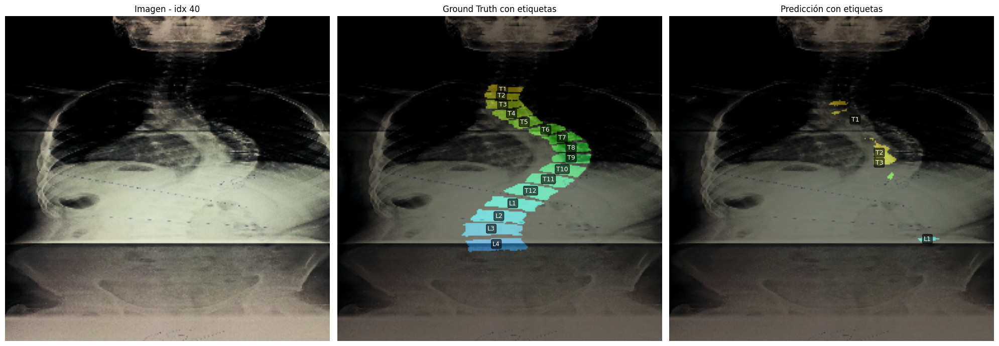


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  6 → T6
  13 → L1
  14 → L2


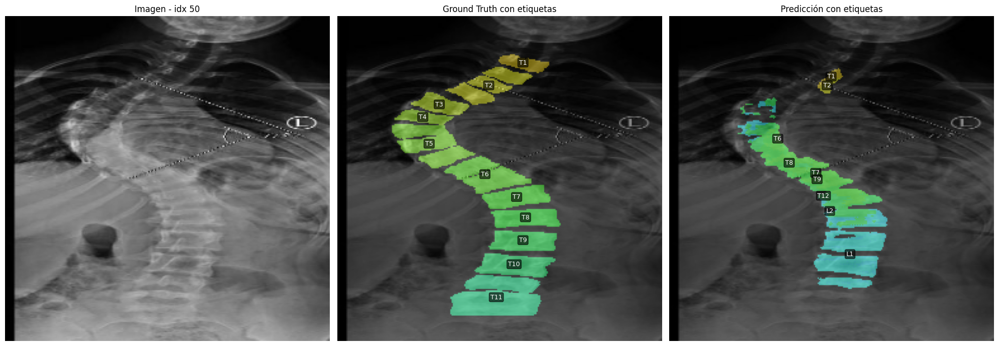


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


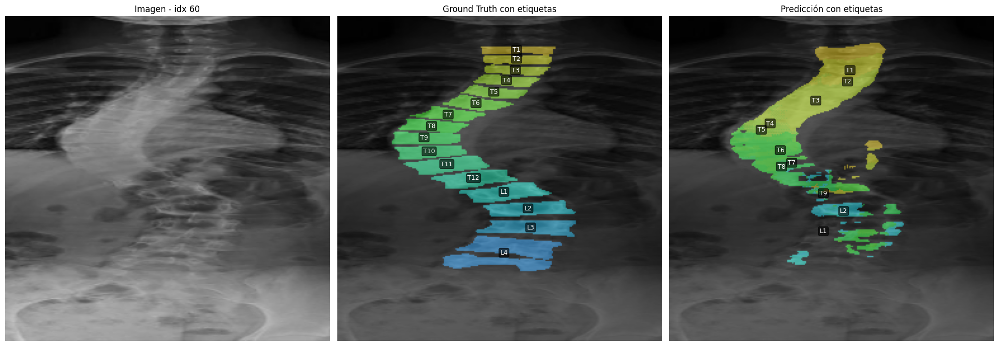


Clases presentes en Ground Truth:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  10 → T10
  11 → T11
  12 → T12
  13 → L1
  14 → L2
  15 → L3
  16 → L4

Clases presentes en Predicción:
  0 → background
  1 → T1
  2 → T2
  3 → T3
  4 → T4
  5 → T5
  6 → T6
  7 → T7
  8 → T8
  9 → T9
  12 → T12
  13 → L1
  14 → L2


In [163]:
for i in [0, 3, 10, 20,40,50,60]:
    show_gt_vs_pred_with_labels(
        model=model,
        dataset=dataset,
        device=device,
        idx=i,
        label_dict=label_dict,
        alpha=0.45,
        min_pixels=20
    )

## 6.1 Entrenamiento Final para MLFlow

En las celdas anteriores el entrenamiento fue orientado a encontrar los mejores parámetros en Colab. Aquí se adapta el experimento final para registrar el mejor modelo encontrado con la red SmallUNet

In [167]:
MODEL_SAVE_DIR = "/content/mlflow_outputs/smallunet_final"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

In [168]:
EXPERIMENT_NAME = "smallunet_final_experiment"
DATABRICKS_EXPERIMENT_PATH = "/Users/sl.lancheros20@uniandes.edu.co/smallunet_final_experiment"

In [169]:
final_config = {
    "experiment_name": "final_bs2_lr1e4_ce03_dice07_ch32_ep40",
    "batch_size": 2,
    "lr": 1e-4,
    "ce_weight": 0.3,
    "dice_weight": 0.7,
    "base_channels": 32,
    "num_epochs": 40,
    "patience": 10,
    "img_size": [256, 256],
    "num_classes": 18,
    "in_channels": 1,
}

In [170]:
from sklearn.model_selection import GroupKFold
from tqdm.auto import tqdm
import os
import mlflow
import pandas as pd
import numpy as np


def run_final_smallunet_experiment(
    experiment_config,
    df_input,
    base_dir,
    img_size,
    num_epochs,
    num_classes,
    in_channels,
    patience,
    n_splits,
    device,
    model_save_dir,
    databricks_experiment_path,
    label_dict=None,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
):
    experiment_name = experiment_config["experiment_name"]
    batch_size = experiment_config["batch_size"]
    lr = experiment_config["lr"]
    ce_weight = experiment_config["ce_weight"]
    dice_weight = experiment_config["dice_weight"]
    base_channels = experiment_config["base_channels"]

    print("\n" + "=" * 90)
    print(f"EXPERIMENTO FINAL SMALLUNET: {experiment_name}")
    print("=" * 90)

    os.makedirs(model_save_dir, exist_ok=True)

    mlflow.set_tracking_uri("databricks")
    mlflow.set_experiment(databricks_experiment_path)

    gkf = GroupKFold(n_splits=n_splits)

    X = df_input["image_path"].values
    y = df_input["mask_path"].values
    groups = df_input["patient_id"].values

    all_histories = []
    best_rows = []

    with mlflow.start_run(run_name=experiment_name) as parent_run:

        mlflow.log_params({
            "experiment_type": "final_model_experiment",
            "experiment_name": experiment_name,
            "model_name": "SmallUNet",
            "split_strategy": "GroupKFold",
            "group_column": "patient_id",
            "n_splits": n_splits,
            "img_size": str(img_size),
            "batch_size": batch_size,
            "num_epochs": num_epochs,
            "lr": lr,
            "num_classes": num_classes,
            "in_channels": in_channels,
            "patience": patience,
            "ce_weight": ce_weight,
            "dice_weight": dice_weight,
            "base_channels": base_channels,
            "device": str(device),
            "total_samples": len(df_input),
            "total_patients": df_input["patient_id"].nunique(),
        })

        for fold, (train_idx, val_idx) in tqdm(
            enumerate(gkf.split(X, y, groups=groups), start=1),
            total=n_splits,
            desc=experiment_name
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print(f"\nFold {fold}")
            print(f"Train samples: {len(train_df)}")
            print(f"Val samples: {len(val_df)}")
            print(f"Train patients: {len(train_patients)}")
            print(f"Val patients: {len(val_patients)}")
            print(f"Patient overlap: {len(overlap)}")

            fold_model_save_dir = os.path.join(
                model_save_dir,
                experiment_name,
                f"fold_{fold}"
            )
            os.makedirs(fold_model_save_dir, exist_ok=True)

            with MLflowExperimentLogger(
                experiment_name=databricks_experiment_path,
                run_name=f"{experiment_name}_fold_{fold}",
                tracking_uri="databricks",
                nested=True,
                enabled=use_mlflow
            ) as logger:

                logger.log_params({
                    "parent_run_id": parent_run.info.run_id,
                    "experiment_name": experiment_name,
                    "fold": fold,
                    "train_samples": len(train_df),
                    "val_samples": len(val_df),
                    "train_patients": len(train_patients),
                    "val_patients": len(val_patients),
                    "patient_overlap": len(overlap),
                })

                model, history_df, best_row = train_one_fold(
                    fold=fold,
                    train_df=train_df,
                    val_df=val_df,
                    base_dir=base_dir,
                    img_size=img_size,
                    batch_size=batch_size,
                    num_epochs=num_epochs,
                    lr=lr,
                    num_classes=num_classes,
                    in_channels=in_channels,
                    patience=patience,
                    device=device,
                    ce_weight=ce_weight,
                    dice_weight=dice_weight,
                    base_channels=base_channels,
                    logger=logger,
                    log_predictions=log_predictions,
                    num_prediction_samples=num_prediction_samples,
                    model_save_dir=fold_model_save_dir,
                    label_dict=label_dict
                )

            history_df["experiment_name"] = experiment_name
            history_df["batch_size"] = batch_size
            history_df["lr"] = lr
            history_df["ce_weight"] = ce_weight
            history_df["dice_weight"] = dice_weight
            history_df["base_channels"] = base_channels

            best_row["experiment_name"] = experiment_name
            best_row["batch_size"] = batch_size
            best_row["lr"] = lr
            best_row["ce_weight"] = ce_weight
            best_row["dice_weight"] = dice_weight
            best_row["base_channels"] = base_channels

            all_histories.append(history_df)
            best_rows.append(best_row)

        all_histories_df = pd.concat(all_histories, ignore_index=True)
        fold_summary_df = pd.DataFrame(best_rows)

        summary_metrics = {
            "mean_best_val_dice": float(fold_summary_df["val_dice"].mean()),
            "std_best_val_dice": float(fold_summary_df["val_dice"].std()),
            "mean_best_val_iou": float(fold_summary_df["val_iou"].mean()),
            "std_best_val_iou": float(fold_summary_df["val_iou"].std()),
            "mean_best_val_loss": float(fold_summary_df["val_loss"].mean()),
            "std_best_val_loss": float(fold_summary_df["val_loss"].std()),
            "mean_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].mean()),
            "std_best_val_pixel_acc": float(fold_summary_df["val_pixel_acc"].std()),
        }

        mlflow.log_metrics(summary_metrics)

        output_dir = os.path.join(model_save_dir, experiment_name)
        os.makedirs(output_dir, exist_ok=True)

        histories_path = os.path.join(
            output_dir,
            f"{experiment_name}_all_histories.csv"
        )

        summary_path = os.path.join(
            output_dir,
            f"{experiment_name}_fold_summary.csv"
        )

        all_histories_df.to_csv(histories_path, index=False)
        fold_summary_df.to_csv(summary_path, index=False)

        mlflow.log_artifact(histories_path, artifact_path="summary")
        mlflow.log_artifact(summary_path, artifact_path="summary")

        print("\nResumen por fold:")
        display_cols = [
            "experiment_name",
            "fold",
            "epoch",
            "val_loss",
            "val_dice",
            "val_iou",
            "val_pixel_acc"
        ]
        print(fold_summary_df[display_cols])

        print("\nMétricas agregadas del experimento final:")
        for metric_name, metric_value in summary_metrics.items():
            print(f"{metric_name}: {metric_value:.4f}")

    return all_histories_df, fold_summary_df

In [171]:
NUM_EPOCHS = 40
PATIENCE = 10
N_SPLITS = 4

In [172]:
print(type(label_dict))
print(label_dict)

<class 'dict'>
{'mascara_binaria': {'0': 'background', '255': 'spine'}, 'mascara_multiclase_id_png': {'0': 'background', '1': 'T1', '2': 'T2', '3': 'T3', '4': 'T4', '5': 'T5', '6': 'T6', '7': 'T7', '8': 'T8', '9': 'T9', '10': 'T10', '11': 'T11', '12': 'T12', '13': 'L1', '14': 'L2', '15': 'L3', '16': 'L4', '17': 'L5'}, 'mascara_multiclase_grises_jpg': {'0': 0, '1': 44, '2': 51, '3': 58, '4': 66, '5': 73, '6': 80, '7': 87, '8': 95, '9': 102, '10': 109, '11': 117, '12': 124, '13': 131, '14': 138, '15': 146, '16': 153, '17': 160}, 'mascara_multiclase_color_rgb': {'0': [0, 0, 0], '1': [242, 209, 12], '2': [235, 242, 12], '3': [196, 242, 12], '4': [156, 242, 12], '5': [117, 242, 12], '6': [77, 242, 12], '7': [38, 242, 12], '8': [12, 242, 25], '9': [12, 242, 64], '10': [12, 242, 104], '11': [12, 242, 143], '12': [12, 242, 183], '13': [12, 242, 222], '14': [12, 222, 242], '15': [12, 183, 242], '16': [12, 143, 242], '17': [12, 104, 242]}, 'equivalencia_diccionario_original_a_version_final': {'0

In [173]:
final_histories_df, final_summary_df = run_final_smallunet_experiment(
    experiment_config=final_experiment_config,
    df_input=df_input,
    base_dir=PATH,
    img_size=IMG_SIZE,
    num_epochs=NUM_EPOCHS,
    num_classes=NUM_CLASSES,
    in_channels=IN_CHANNELS,
    patience=PATIENCE,
    n_splits=N_SPLITS,
    device=device,
    model_save_dir=MODEL_SAVE_DIR,
    label_dict=label_dict,
    databricks_experiment_path=DATABRICKS_EXPERIMENT_PATH,
    log_predictions=True,
    num_prediction_samples=4,
    use_mlflow=True
)


EXPERIMENTO FINAL SMALLUNET: smallunet_final_bs4_lr1e4


smallunet_final_bs4_lr1e4:   0%|          | 0/4 [00:00<?, ?it/s]


Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model save dir: /content/mlflow_outputs/smallunet_final/smallunet_final_bs4_lr1e4/fold_1
Epoch 01 | train_loss=1.4716 | val_loss=1.3901 | train_dice=0.0372 | val_dice=0.0535 | val_iou=0.0449 | val_acc=0.6382
Nuevo mejor modelo (Dice) en epoch 1: 0.0535
Modelo guardado en: /content/mlflow_outputs/smallunet_final/smallunet_final_bs4_lr1e4/fold_1/best_model_fold_1.pth
Epoch 02 | train_loss=1.3643 | val_loss=1.3576 | train_dice=0.0597 | val_dice=0.0723 | val_iou=0.0661 | val_acc=0.7823
Nuevo mejor modelo (Dice) en epoch 2: 0.0723
Modelo guardado en: /content/mlflow_outputs/smallunet_final/smallunet_final_bs4_lr1e4/fold_1/best_model_fold_1.pth
Epoch 03 | train_loss=1.3287 | val_loss=1.3324 | train_dice=0.0609 | val_dice=0.0724 | val_iou=0.0678 | val_acc=0.8344
Nuevo mejor modelo (Dice) en epoc

Ejecutando las sentencias para generar la comparación

In [174]:
final_summary_df.sort_values("val_dice", ascending=False)

,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc,experiment_name,batch_size,lr,ce_weight,dice_weight,base_channels
3,4.0,40.0,0.744879,0.200999,0.151897,0.887459,0.757790,0.205837,0.164406,0.887175,smallunet_final_bs4_lr1e4,4,0.0001,0.3,0.7,32
1,2.0,39.0,0.760150,0.160129,0.126774,0.884726,0.768636,0.203635,0.166853,0.888238,smallunet_final_bs4_lr1e4,4,0.0001,0.3,0.7,32
0,1.0,38.0,0.758168,0.157392,0.120451,0.888371,0.781689,0.174567,0.141215,0.869037,smallunet_final_bs4_lr1e4,4,0.0001,0.3,0.7,32
2,3.0,33.0,0.871940,0.086372,0.078371,0.866551,0.874602,0.117053,0.108688,0.862785,smallunet_final_bs4_lr1e4,4,0.0001,0.3,0.7,32


In [175]:
best_fold_row = final_summary_df.sort_values("val_dice", ascending=False).iloc[0]
best_fold = int(best_fold_row["fold"])

best_fold, best_fold_row["val_dice"], best_fold_row["val_iou"]

(4, np.float64(0.20583704690710403), np.float64(0.16440576124168862))

## 6.2 Registro del mejor modelo

In [176]:
import mlflow.pytorch

best_fold_row = final_summary_df.sort_values("val_dice", ascending=False).iloc[0]
best_fold = int(best_fold_row["fold"])

best_checkpoint_path = os.path.join(
    MODEL_SAVE_DIR,
    final_experiment_config["experiment_name"],
    f"fold_{best_fold}",
    f"best_model_fold_{best_fold}.pth"
)

checkpoint = torch.load(
    best_checkpoint_path,
    map_location=device,
    weights_only=False
)

best_model = SmallUNet(
    in_channels=IN_CHANNELS,
    num_classes=NUM_CLASSES,
    base_channels=final_experiment_config["base_channels"]
).to(device)

best_model.load_state_dict(checkpoint["model_state_dict"])
best_model.eval()

with mlflow.start_run(
    run_name=f"{final_experiment_config['experiment_name']}_registered_best_fold_{best_fold}"
) as run:

    mlflow.log_params({
        "model_name": "SmallUNet",
        "selected_fold": best_fold,
        "selection_metric": "val_dice",
        "in_channels": IN_CHANNELS,
        "num_classes": NUM_CLASSES,
        "base_channels": final_experiment_config["base_channels"],
        "img_size": str(IMG_SIZE),
        "checkpoint_path": best_checkpoint_path,
    })

    mlflow.log_metrics({
        "selected_val_dice": float(best_fold_row["val_dice"]),
        "selected_val_iou": float(best_fold_row["val_iou"]),
        "selected_val_loss": float(best_fold_row["val_loss"]),
        "selected_val_pixel_acc": float(best_fold_row["val_pixel_acc"]),
    })

    mlflow.log_artifact(best_checkpoint_path, artifact_path="selected_checkpoint")

    mlflow.pytorch.log_model(
        pytorch_model=best_model,
        artifact_path="model"
    )

    model_uri = f"runs:/{run.info.run_id}/model"

print("Best fold:", best_fold)
print("Model URI:", model_uri)

2026/05/13 21:56:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2026/05/13 21:56:41 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/13 21:56:41 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2026/05/13 21:56:51 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label

🏃 View run smallunet_final_bs4_lr1e4_registered_best_fold_4 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/211205941452321/runs/b4e2925ae70e4bc1adec0e6883128c99
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/211205941452321
Best fold: 4
Model URI: runs:/b4e2925ae70e4bc1adec0e6883128c99/model


# 7.Robusteciendo el modelo básico con ResNet

Descripción del uso de una UNet más robusta

Con el objetivo de mejorar el desempeño del modelo base, se implementó una variante más robusta de la arquitectura UNet, incorporando un encoder preentrenado basado en ResNet34.

A diferencia del modelo inicial (SmallUNet), cuyo encoder es aprendido desde cero, esta nueva arquitectura aprovecha pesos preentrenados en ImageNet para inicializar el encoder. Esto permite capturar características visuales más ricas y jerárquicas desde las primeras capas, favoreciendo una mejor generalización del modelo, especialmente en escenarios con datos limitados.

La arquitectura utilizada mantiene la estructura clásica de UNet, compuesta por:

Un encoder profundo (ResNet34) encargado de extraer representaciones semánticas de alto nivel mediante bloques residuales.
Un decoder simétrico, que reconstruye la resolución espacial mediante operaciones de upsampling y conexiones de salto (skip connections), permitiendo combinar información global con detalles locales.

Para adaptar el modelo al problema de segmentación de imágenes médicas en escala de grises, se configuraron los siguientes parámetros:

Número de canales de entrada: 1
Número de clases de salida: 18 (incluyendo background y vértebras T1–L5)
Activación final: sin activación (logits), ya que la función de pérdida se encarga de aplicar las transformaciones necesarias

El modelo fue entrenado bajo las mismas condiciones experimentales que el modelo base, incluyendo:

Validación cruzada por grupos (GroupKFold), garantizando separación por paciente
Función de pérdida combinada (CrossEntropy + Dice)
Métricas de evaluación: Dice, IoU y precisión por píxel
Mismo tamaño de imagen, número de épocas y estrategia de early stopping

Esta configuración permite una comparación directa y justa entre el modelo base y la versión más robusta, evaluando el impacto del uso de un encoder preentrenado en la calidad de la segmentación.

In [177]:
!pip install -q segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.0 MB/s eta 0:00:00


In [178]:
import torch.nn as nn
import segmentation_models_pytorch as smp

class RobustUNet(nn.Module):
    def __init__(
        self,
        in_channels=1,
        num_classes=18,
        encoder_name="resnet34",
        encoder_weights="imagenet"
    ):
        super().__init__()

        self.model = smp.Unet(
            encoder_name=encoder_name,
            encoder_weights=encoder_weights,
            in_channels=in_channels,
            classes=num_classes,
            activation=None
        )

    def forward(self, x):
        return self.model(x)

In [179]:
print(IN_CHANNELS)

3


In [180]:
model = RobustUNet(
    in_channels=IN_CHANNELS,
    num_classes=NUM_CLASSES,
    encoder_name="resnet34",
    encoder_weights="imagenet"
).to(device)

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

## 7.1 Actualización del código para entrenamiento para usar resnet

## 7.2 Actualización de este modelo robusto para usar MLFlow


In [185]:
model_type = "resnet34_unet"
encoder_name = "resnet34"
encoder_weights = "imagenet"

In [184]:
from contextlib import nullcontext

In [190]:
def train_one_fold(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    experiment_name="experiment",
    experiment_file_name=None,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",

    # nuevos parámetros
    logger=None,
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
    mlflow_nested=True
):
    """
    Entrena un fold para SmallUNet o RobustUNet/ResNet34.

    Incluye:
    - MLflow params
    - MLflow metrics por época
    - checkpoint del mejor modelo
    - artifact del checkpoint en MLflow
    - history CSV por fold
    - visualizaciones de predicción usando logger.log_prediction_visualization
    """

    if isinstance(device, str):
        device = torch.device(device)

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())
    print("Model type:", model_type)
    print("Device:", device)

    if model_dir is None:
        model_dir = MODEL_SAVE_DIR

    if experiment_file_name is None:
        experiment_file_name ="experiment"

    os.makedirs(model_dir, exist_ok=True)

    fold_dir = os.path.join(model_dir, f"fold_{fold}")
    os.makedirs(fold_dir, exist_ok=True)

    prediction_save_path = os.path.join(
        fold_dir,
        prediction_artifact_path
    )
    os.makedirs(prediction_save_path, exist_ok=True)

    history_path = os.path.join(
        fold_dir,
        f"{experiment_file_name}_history_fold_{fold}.csv"
    )

    # Si no hay un run activo, esta función crea uno.
    # Si ya hay run activo desde run_experiment, usa ese mismo.
    if log_to_mlflow and mlflow.active_run() is None:
        mlflow.set_experiment(experiment_name)
        mlflow_context = mlflow.start_run(
            run_name=f"{experiment_name}_fold_{fold}",
            nested=mlflow_nested
        )
    else:
        mlflow_context = nullcontext()

    with mlflow_context:

        # ============================================================
        # MLflow params
        # ============================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    f"fold_{fold}_experiment_name": experiment_name,
                    f"fold_{fold}_model_type": model_type,
                    f"fold_{fold}_img_size": str(img_size),
                    f"fold_{fold}_batch_size": int(batch_size),
                    f"fold_{fold}_num_epochs": int(num_epochs),
                    f"fold_{fold}_lr": float(lr),
                    f"fold_{fold}_num_classes": int(num_classes),
                    f"fold_{fold}_in_channels": int(in_channels),
                    f"fold_{fold}_patience": int(patience),
                    f"fold_{fold}_ce_weight": float(ce_weight),
                    f"fold_{fold}_dice_weight": float(dice_weight),
                    f"fold_{fold}_base_channels": int(base_channels),
                    f"fold_{fold}_encoder_name": encoder_name,
                    f"fold_{fold}_encoder_weights": str(encoder_weights),
                    f"fold_{fold}_train_samples": int(len(train_df)),
                    f"fold_{fold}_val_samples": int(len(val_df)),
                    f"fold_{fold}_train_patients": int(train_df["patient_id"].nunique()),
                    f"fold_{fold}_val_patients": int(val_df["patient_id"].nunique()),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar params en MLflow: {e}")

        # ============================================================
        # Datasets
        # ============================================================

        train_dataset = SegmentationDataset(
            train_df,
            base_dir=base_dir,
            img_size=img_size,
            train=True,
            in_channels=in_channels
        )

        val_dataset = SegmentationDataset(
            val_df,
            base_dir=base_dir,
            img_size=img_size,
            train=False,
            in_channels=in_channels
        )

        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=batch_size,
            shuffle=False,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        # ============================================================
        # Modelo
        # ============================================================

        if model_type == "small_unet":
            model = SmallUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                base_channels=base_channels
            ).to(device)

        elif model_type == "resnet34_unet":
            model = RobustUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                encoder_name=encoder_name,
                encoder_weights=encoder_weights
            ).to(device)

        else:
            raise ValueError(f"model_type no soportado: {model_type}")

        # ============================================================
        # Loss, optimizer, scaler, early stopping
        # ============================================================

        criterion = CombinedLoss(
            num_classes=num_classes,
            ce_weight=ce_weight,
            dice_weight=dice_weight
        )

        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=lr
        )

        scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

        early_stopper = EarlyStopping(patience=patience)

        history = []
        best_model_wts = copy.deepcopy(model.state_dict())
        best_val_dice = -1.0
        best_epoch = 0
        best_checkpoint_path = None

        # ============================================================
        # Entrenamiento
        # ============================================================

        for epoch in range(num_epochs):

            train_metrics = train_one_epoch(
                model,
                train_loader,
                optimizer,
                criterion,
                device,
                num_classes,
                scaler
            )

            val_metrics = validate_one_epoch(
                model,
                val_loader,
                criterion,
                device,
                num_classes
            )

            row = {
                "fold": fold,
                "epoch": epoch + 1,

                "train_loss": train_metrics["loss"],
                "train_dice": train_metrics["dice"],
                "train_iou": train_metrics["iou"],
                "train_pixel_acc": train_metrics["pixel_acc"],

                "val_loss": val_metrics["loss"],
                "val_dice": val_metrics["dice"],
                "val_iou": val_metrics["iou"],
                "val_pixel_acc": val_metrics["pixel_acc"],

                "model_type": model_type,
                "encoder_name": encoder_name if model_type == "resnet34_unet" else None,
                "encoder_weights": encoder_weights if model_type == "resnet34_unet" else None,
                "ce_weight": ce_weight,
                "dice_weight": dice_weight,
                "lr": lr,
                "batch_size": batch_size,
            }

            history.append(row)

            print(
                f"Epoch {epoch+1:02d} | "
                f"train_loss={train_metrics['loss']:.4f} | "
                f"val_loss={val_metrics['loss']:.4f} | "
                f"train_dice={train_metrics['dice']:.4f} | "
                f"val_dice={val_metrics['dice']:.4f} | "
                f"val_iou={val_metrics['iou']:.4f} | "
                f"val_acc={val_metrics['pixel_acc']:.4f}"
            )

            # ========================================================
            # MLflow metrics por época
            # ========================================================

            if log_to_mlflow:
                try:
                    mlflow.log_metrics(
                        {
                            f"fold_{fold}/train_loss": float(train_metrics["loss"]),
                            f"fold_{fold}/train_dice": float(train_metrics["dice"]),
                            f"fold_{fold}/train_iou": float(train_metrics["iou"]),
                            f"fold_{fold}/train_pixel_acc": float(train_metrics["pixel_acc"]),

                            f"fold_{fold}/val_loss": float(val_metrics["loss"]),
                            f"fold_{fold}/val_dice": float(val_metrics["dice"]),
                            f"fold_{fold}/val_iou": float(val_metrics["iou"]),
                            f"fold_{fold}/val_pixel_acc": float(val_metrics["pixel_acc"]),
                        },
                        step=epoch + 1
                    )
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar métricas en MLflow: {e}")

            # ========================================================
            # Early stopping
            # ========================================================

            early_stopper.step(val_metrics["loss"])

            # ========================================================
            # Guardar mejor modelo por Dice
            # ========================================================

            if val_metrics["dice"] > best_val_dice:
                best_val_dice = float(val_metrics["dice"])
                best_epoch = epoch + 1
                best_model_wts = copy.deepcopy(model.state_dict())

                best_checkpoint_path = os.path.join(
                    fold_dir,
                    f"{experiment_file_name}_best_model_fold_{fold}.pth"
                )

                checkpoint = {
                    "model_state_dict": best_model_wts,
                    "experiment_name": experiment_name,
                    "model_type": model_type,
                    "fold": int(fold),
                    "best_epoch": int(best_epoch),
                    "val_dice": float(best_val_dice),
                    "val_iou": float(val_metrics["iou"]),
                    "val_loss": float(val_metrics["loss"]),
                    "val_pixel_acc": float(val_metrics["pixel_acc"]),
                    "config": {
                        "img_size": list(img_size),
                        "batch_size": int(batch_size),
                        "num_epochs": int(num_epochs),
                        "lr": float(lr),
                        "num_classes": int(num_classes),
                        "in_channels": int(in_channels),
                        "patience": int(patience),
                        "ce_weight": float(ce_weight),
                        "dice_weight": float(dice_weight),
                        "base_channels": int(base_channels),
                        "model_type": model_type,
                        "encoder_name": encoder_name,
                        "encoder_weights": encoder_weights,
                    },
                }

                torch.save(checkpoint, best_checkpoint_path)

                print(
                    f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: "
                    f"{best_val_dice:.4f}"
                )
                print(f"Modelo guardado en: {best_checkpoint_path}")

                if log_to_mlflow:
                    try:
                        mlflow.log_artifact(
                            best_checkpoint_path,
                            artifact_path=f"fold_{fold}/model"
                        )
                    except Exception as e:
                        print(f"[WARNING] No se pudo registrar checkpoint en MLflow: {e}")

            if early_stopper.should_stop:
                print(f"Early stopping en epoch {epoch+1}")
                break

        # ============================================================
        # Cargar mejor modelo
        # ============================================================

        model.load_state_dict(best_model_wts)

        # ============================================================
        # History dataframe
        # ============================================================

        history_df = pd.DataFrame(history)

        if len(history_df) > 0:
            best_row = history_df.loc[
                history_df["val_dice"].idxmax()
            ].to_dict()
        else:
            best_row = {}

        best_row["checkpoint_path"] = best_checkpoint_path
        best_row["experiment_name"] = experiment_name
        best_row["model_type"] = model_type
        best_row["best_epoch"] = best_epoch
        best_row["best_val_dice"] = best_val_dice

        history_df.to_csv(history_path, index=False)
        print(f"Historial guardado en: {history_path}")

        if log_to_mlflow:
            try:
                mlflow.log_artifact(
                    history_path,
                    artifact_path=f"fold_{fold}/history"
                )

                mlflow.log_metrics({
                    f"fold_{fold}/best_val_dice": float(best_val_dice),
                    f"fold_{fold}/best_epoch": float(best_epoch),
                })
            except Exception as e:
                print(f"[WARNING] No se pudo registrar history/best metrics en MLflow: {e}")

        # ============================================================
        # Visualizaciones de predicción
        # ============================================================

        if log_predictions:
            print(f"\nGenerando visualizaciones para fold {fold}...")

            logger.log_prediction_visualization(
                model=model,
                dataloader=val_loader,
                label_dict=label_dict,
                device=device,
                n_samples=num_prediction_samples,
                artifact_path=f"fold_{fold}/{prediction_artifact_path}",
                save_path=prediction_save_path
             )

            if log_to_mlflow and os.path.exists(prediction_save_path):
                try:
                    mlflow.log_artifacts(
                        prediction_save_path,
                        artifact_path=f"fold_{fold}/{prediction_artifact_path}"
                    )
                    print(
                        f"Visualizaciones registradas en MLflow artifact: "
                        f"fold_{fold}/{prediction_artifact_path}"
                    )
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar las visualizaciones en MLflow: {e}")

    return model, history_df, best_row

## 7.3 Actualización de run_experiments para alojar experimentos con resnet

In [191]:
def run_experiment(
    experiment_name,
    df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,
    base_channels=32,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet"
):
    all_histories = []
    best_rows = []

    gkf = GroupKFold(n_splits=n_splits)

    X = df["image_path"]
    y = df["patient_id"]
    groups = df["patient_id"]

    print(f"\n===== Experimento: {experiment_name} =====")
    print(f"Modelo: {model_type}")

    for fold, (train_idx, val_idx) in enumerate(
        gkf.split(X, y, groups=groups),
        start=1
    ):
        train_df = df.iloc[train_idx].reset_index(drop=True)
        val_df = df.iloc[val_idx].reset_index(drop=True)

        shared_patients = set(train_df["patient_id"]).intersection(
            set(val_df["patient_id"])
        )

        print(
            f"Fold {fold} - pacientes compartidos entre train y val: "
            f"{len(shared_patients)}"
        )

        model, history_df, best_row = train_one_fold(
            fold=fold,
            train_df=train_df,
            val_df=val_df,
            base_dir=base_dir,
            img_size=img_size,
            batch_size=batch_size,
            num_epochs=num_epochs,
            lr=lr,
            num_classes=num_classes,
            in_channels=in_channels,
            patience=patience,
            device=device,
            ce_weight=ce_weight,
            dice_weight=dice_weight,
            base_channels=base_channels,
            experiment_name=experiment_name,
            model_dir=model_dir,
            model_type=model_type,
            encoder_name=encoder_name,
            encoder_weights=encoder_weights
        )

        history_df["experiment_name"] = experiment_name
        history_df["model_type"] = model_type
        history_df["encoder_name"] = encoder_name
        history_df["encoder_weights"] = encoder_weights
        all_histories.append(history_df)

        best_row["experiment_name"] = experiment_name
        best_row["model_type"] = model_type
        best_row["encoder_name"] = encoder_name
        best_row["encoder_weights"] = encoder_weights
        best_rows.append(best_row)

    all_history_df = pd.concat(all_histories, ignore_index=True)
    best_results_df = pd.DataFrame(best_rows)

    return all_history_df, best_results_df

## 7.4 Actualización de Run Experiments para MLFlow

In [196]:
def run_experiment(
    experiment_name,
    df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,
    base_channels=32,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    run_name=None,
    tracking_uri="databricks",
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
    experiment_file_name=None
):
    """
    Ejecuta un experimento completo con GroupKFold.

    Compatible con:
    - SmallUNet
    - RobustUNet con ResNet34
    - MLflow
    - visualizaciones de predicción
    - guardado local de histories y summary
    """

    if isinstance(device, str):
        device = torch.device(device)

    if experiment_file_name is None:
        experiment_file_name = "experiment"

    if model_dir is None:
        model_dir = os.path.join(MODEL_SAVE_DIR, experiment_name)



    os.makedirs(model_dir, exist_ok=True)

    if run_name is None:
        run_name = f"{experiment_name}_{model_type}"

    all_histories = []
    best_rows = []

    gkf = GroupKFold(n_splits=n_splits)

    X = df["image_path"]
    y = df["patient_id"]
    groups = df["patient_id"]

    print("\n" + "=" * 90)
    print(f"EXPERIMENTO: {experiment_name}")
    print("=" * 90)
    print(f"Modelo: {model_type}")
    print(f"Model dir: {model_dir}")
    print(f"Device: {device}")
    print(f"N splits: {n_splits}")
    print(f"Samples: {len(df)}")
    print(f"Pacientes únicos: {df['patient_id'].nunique()}")

    if model_type == "resnet34_unet":
        print(f"Encoder: {encoder_name}")
        print(f"Encoder weights: {encoder_weights}")

    # =========================================================================
    # Abrir MLflow run principal
    # =========================================================================

    if log_to_mlflow:
        logger_context = MLflowExperimentLogger(
            experiment_name=experiment_name,
            run_name=run_name,
            tracking_uri=tracking_uri,
            nested=False,
            enabled=True
        )
    else:
        logger_context = nullcontext(None)

    with logger_context as logger:

        # =====================================================================
        # Log de parámetros globales del experimento
        # =====================================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    "experiment_name": experiment_name,
                    "run_name": run_name,
                    "model_type": model_type,
                    "img_size": str(img_size),
                    "batch_size": int(batch_size),
                    "num_epochs": int(num_epochs),
                    "lr": float(lr),
                    "num_classes": int(num_classes),
                    "in_channels": int(in_channels),
                    "patience": int(patience),
                    "n_splits": int(n_splits),
                    "ce_weight": float(ce_weight),
                    "dice_weight": float(dice_weight),
                    "base_channels": int(base_channels),
                    "encoder_name": encoder_name,
                    "encoder_weights": str(encoder_weights),
                    "total_samples": int(len(df)),
                    "total_patients": int(df["patient_id"].nunique()),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar parámetros globales en MLflow: {e}")

        # =====================================================================
        # Loop de folds
        # =====================================================================

        for fold, (train_idx, val_idx) in enumerate(
            gkf.split(X, y, groups=groups),
            start=1
        ):
            train_df = df.iloc[train_idx].reset_index(drop=True)
            val_df = df.iloc[val_idx].reset_index(drop=True)

            shared_patients = set(train_df["patient_id"]).intersection(
                set(val_df["patient_id"])
            )

            print("\n" + "-" * 90)
            print(f"Fold {fold}")
            print("-" * 90)
            print(
                f"Pacientes compartidos entre train y val: "
                f"{len(shared_patients)}"
            )

            if len(shared_patients) > 0:
                print("[WARNING] Hay pacientes compartidos entre train y val.")
                print(shared_patients)

            model, history_df, best_row = train_one_fold(
                fold=fold,
                train_df=train_df,
                val_df=val_df,
                base_dir=base_dir,
                img_size=img_size,
                batch_size=batch_size,
                num_epochs=num_epochs,
                lr=lr,
                num_classes=num_classes,
                in_channels=in_channels,
                patience=patience,
                device=device,
                ce_weight=ce_weight,
                dice_weight=dice_weight,
                base_channels=base_channels,
                experiment_name=experiment_name,
                experiment_file_name=experiment_file_name,
                model_dir=model_dir,
                model_type=model_type,
                encoder_name=encoder_name,
                encoder_weights=encoder_weights,

                # MLflow + visualizaciones
                logger=logger,
                label_dict=label_dict,
                log_to_mlflow=log_to_mlflow,
                log_predictions=log_predictions,
                num_prediction_samples=num_prediction_samples,
                prediction_artifact_path=prediction_artifact_path
            )

            history_df["experiment_name"] = experiment_name
            history_df["run_name"] = run_name
            history_df["model_type"] = model_type
            history_df["encoder_name"] = encoder_name
            history_df["encoder_weights"] = encoder_weights

            all_histories.append(history_df)

            best_row["experiment_name"] = experiment_name
            best_row["run_name"] = run_name
            best_row["model_type"] = model_type
            best_row["encoder_name"] = encoder_name
            best_row["encoder_weights"] = encoder_weights
            best_rows.append(best_row)

        # =====================================================================
        # Resultados globales
        # =====================================================================

        all_history_df = pd.concat(all_histories, ignore_index=True)
        best_results_df = pd.DataFrame(best_rows)

        all_history_path = os.path.join(
          model_dir,
          f"{experiment_file_name}_all_history.csv"
        )

        best_results_path = os.path.join(
          model_dir,
          f"{experiment_file_name}_best_results.csv"
        )

        all_history_df.to_csv(all_history_path, index=False)
        best_results_df.to_csv(best_results_path, index=False)

        print("\n" + "=" * 90)
        print("RESULTADOS DEL EXPERIMENTO")
        print("=" * 90)
        print(f"History global guardado en: {all_history_path}")
        print(f"Best results guardado en: {best_results_path}")

        display_cols = [
            "fold",
            "best_epoch",
            "best_val_dice",
            "best_val_iou",
            "best_val_loss",
            "checkpoint_path"
        ]

        available_cols = [
            col for col in display_cols
            if col in best_results_df.columns
        ]

        print(best_results_df[available_cols])

        # =====================================================================
        # Métricas agregadas del experimento
        # =====================================================================

        if "best_val_dice" in best_results_df.columns:
            mean_best_dice = best_results_df["best_val_dice"].mean()
            std_best_dice = best_results_df["best_val_dice"].std()
        elif "val_dice" in best_results_df.columns:
            mean_best_dice = best_results_df["val_dice"].mean()
            std_best_dice = best_results_df["val_dice"].std()
        else:
            mean_best_dice = None
            std_best_dice = None

        if "best_val_iou" in best_results_df.columns:
            mean_best_iou = best_results_df["best_val_iou"].mean()
            std_best_iou = best_results_df["best_val_iou"].std()
        elif "val_iou" in best_results_df.columns:
            mean_best_iou = best_results_df["val_iou"].mean()
            std_best_iou = best_results_df["val_iou"].std()
        else:
            mean_best_iou = None
            std_best_iou = None

        print("\nMétricas agregadas:")
        if mean_best_dice is not None:
            print(f"Mean best Dice: {mean_best_dice:.4f}")
            print(f"Std best Dice:  {std_best_dice:.4f}")

        if mean_best_iou is not None:
            print(f"Mean best IoU:  {mean_best_iou:.4f}")
            print(f"Std best IoU:   {std_best_iou:.4f}")

        # =====================================================================
        # Log de artifacts y métricas globales en MLflow
        # =====================================================================

        if log_to_mlflow:
            try:
                mlflow.log_artifact(
                    all_history_path,
                    artifact_path="experiment_summary"
                )

                mlflow.log_artifact(
                    best_results_path,
                    artifact_path="experiment_summary"
                )

                metrics_to_log = {}

                if mean_best_dice is not None:
                    metrics_to_log["mean_best_val_dice"] = float(mean_best_dice)
                    metrics_to_log["std_best_val_dice"] = float(std_best_dice)

                if mean_best_iou is not None:
                    metrics_to_log["mean_best_val_iou"] = float(mean_best_iou)
                    metrics_to_log["std_best_val_iou"] = float(std_best_iou)

                if len(metrics_to_log) > 0:
                    mlflow.log_metrics(metrics_to_log)

            except Exception as e:
                print(f"[WARNING] No se pudieron registrar artifacts globales en MLflow: {e}")

    return all_history_df, best_results_df

## 7.5 Entrenamiento en MLFlow

In [197]:
from datetime import datetime
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

EXPERIMENT_NAME = "/Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_final"
EXPERIMENT_FILE_NAME = f"robust_unet_resnet34_final_{timestamp}"
RUN_NAME = f"resnet34_unet_bs4_lr1e4_{timestamp}"

MODEL_DIR_RESNET34 = f"/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_{timestamp}"

histories_df, summary_df = run_experiment(
    experiment_name=EXPERIMENT_NAME,
    experiment_file_name=EXPERIMENT_FILE_NAME,
    run_name=RUN_NAME,

    df=df_input,
    base_dir=PATH,

    img_size=IMG_SIZE,
    batch_size=4,
    num_epochs=NUM_EPOCHS,
    lr=1e-4,

    num_classes=NUM_CLASSES,
    in_channels=1,
    patience=7,
    device=device,

    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,

    base_channels=32,
    model_dir=MODEL_DIR_RESNET34,

    model_type="resnet34_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",

    tracking_uri="databricks",
    label_dict=label_dict,

    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations"
)


EXPERIMENTO: /Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_final
Modelo: resnet34_unet
Model dir: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_20260513_221314
Device: cuda
N splits: 4
Samples: 249
Pacientes únicos: 198
Encoder: resnet34
Encoder weights: imagenet

------------------------------------------------------------------------------------------
Fold 1
------------------------------------------------------------------------------------------
Pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model type: resnet34_unet
Device: cuda
Epoch 01 | train_loss=1.5081 | val_loss=1.4457 | train_dice=0.0262 | val_dice=0.0441 | val_iou=0.0264 | val_acc=0.2839
Nuevo mejor modelo (Dice) en epoch 1: 0.0441
Modelo guardado en: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_20260513_221314/fold_1/robust_unet_resnet34_final_20260513_221314_best_m

Epoch 24 | train_loss=0.3461 | val_loss=0.6603 | train_dice=0.7196 | val_dice=0.3321 | val_iou=0.2450 | val_acc=0.8991
Nuevo mejor modelo (Dice) en epoch 24: 0.3321
Modelo guardado en: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_20260513_221314/fold_4/robust_unet_resnet34_final_20260513_221314_best_model_fold_4.pth
Epoch 25 | train_loss=0.3194 | val_loss=0.6372 | train_dice=0.7375 | val_dice=0.3680 | val_iou=0.2731 | val_acc=0.9031
Nuevo mejor modelo (Dice) en epoch 25: 0.3680
Modelo guardado en: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_20260513_221314/fold_4/robust_unet_resnet34_final_20260513_221314_best_model_fold_4.pth
Epoch 26 | train_loss=0.2843 | val_loss=0.6487 | train_dice=0.7715 | val_dice=0.3522 | val_iou=0.2618 | val_acc=0.9008
Epoch 27 | train_loss=0.2632 | val_loss=0.6465 | train_dice=0.7909 | val_dice=0.3496 | val_iou=0.2589 | val_acc=0.9000
Epoch 28 | train_loss=0.2441 | val_loss=0.6516 | train_dice=0.8013 | val_dice=

## 7.6 Comparación de resultados para MLFlow

In [198]:
import os
import glob
import json
import shutil
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

In [199]:
import mlflow
import pandas as pd
import numpy as np

# ============================================================
# CONFIGURACIÓN
# ============================================================

TRACKING_URI = "databricks"  # o tu tracking URI local/remoto


mlflow.set_tracking_uri(TRACKING_URI)

# ============================================================
# CARGAR RUNS DESDE MLFLOW
# ============================================================

runs_df = mlflow.search_runs(
    experiment_names=[EXPERIMENT_NAME],
    output_format="pandas"
)

print("Número de runs encontrados:", len(runs_df))
print(runs_df.shape)

runs_df.head()

Número de runs encontrados: 9
(9, 145)


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.fold_3/val_dice,metrics.fold_2/val_pixel_acc,metrics.fold_3/best_val_dice,metrics.fold_4/train_dice,...,params.fold_3_experiment_name,params.fold_4_model_type,params.fold_1_img_size,params.fold_3_dice_weight,params.lr,tags.mlflow.runName,tags.mlflow.source.name,tags.mlflow.runColor,tags.mlflow.user,tags.mlflow.source.type
0,8681b3d345f64243834e8c14f6bf13b5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:13:15.083000+00:00,2026-05-13 22:25:04.077000+00:00,0.356526,0.906619,0.367579,0.858076,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_20260513_221314,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#edb732,anferiro@gmail.com,NOTEBOOK
1,2668d8a0d7db4599be68edd771ac98d5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:03:00.773000+00:00,2026-05-13 22:03:01.599000+00:00,NaN,NaN,NaN,NaN,...,None,None,"(256, 256)",None,0.0001,resnet34_unet_bs4_lr1e4_20260513_220300,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#c565c7,anferiro@gmail.com,NOTEBOOK
2,0b242541a2b444f297c64e940846c446,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:36:51.578000+00:00,2026-05-09 12:54:20.989000+00:00,0.350419,0.906010,0.368943,0.898439,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_20260509_123651,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#87cebf,anferiro@gmail.com,NOTEBOOK
3,f73465ea279b483baa8d5b590ee08180,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:36:11.711000+00:00,2026-05-09 12:36:34.571000+00:00,NaN,NaN,NaN,NaN,...,None,None,"(256, 256)",None,0.0001,resnet34_unet_bs4_lr1e4_20260509_123609,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#e57439,anferiro@gmail.com,NOTEBOOK
4,14385cf746394659bcbf2f3ff52671c0,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:09:46.918000+00:00,2026-05-09 12:26:49.586000+00:00,0.362156,0.907591,0.375195,0.889117,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#e87b9f,anferiro@gmail.com,NOTEBOOK


In [200]:
metric_cols = [c for c in runs_df.columns if c.startswith("metrics.")]
param_cols = [c for c in runs_df.columns if c.startswith("params.")]
tag_cols = [c for c in runs_df.columns if c.startswith("tags.")]

print("Métricas disponibles:")
for c in metric_cols:
    print(c)

print("\nParámetros disponibles:")
for c in param_cols:
    print(c)

Métricas disponibles:
metrics.fold_3/val_dice
metrics.fold_2/val_pixel_acc
metrics.fold_3/best_val_dice
metrics.fold_4/train_dice
metrics.fold_2/val_iou
metrics.fold_1/train_iou
metrics.fold_4/train_pixel_acc
metrics.fold_4/val_iou
metrics.fold_4/val_pixel_acc
metrics.fold_1/train_loss
metrics.fold_1/train_dice
metrics.fold_1/best_val_dice
metrics.fold_3/train_loss
metrics.std_best_val_iou
metrics.fold_3/val_iou
metrics.fold_1/val_iou
metrics.fold_4/train_loss
metrics.fold_4/val_dice
metrics.fold_2/train_pixel_acc
metrics.fold_4/best_epoch
metrics.fold_2/train_dice
metrics.fold_2/best_val_dice
metrics.fold_4/train_iou
metrics.fold_1/val_pixel_acc
metrics.mean_best_val_dice
metrics.fold_2/best_epoch
metrics.fold_3/train_iou
metrics.fold_2/train_loss
metrics.fold_3/train_pixel_acc
metrics.fold_1/val_dice
metrics.fold_4/best_val_dice
metrics.fold_1/val_loss
metrics.std_best_val_dice
metrics.fold_1/best_epoch
metrics.fold_2/val_dice
metrics.fold_4/val_loss
metrics.fold_1/train_pixel_acc
me

In [201]:
import mlflow
import pandas as pd
import numpy as np
import os
import glob
import torch

mlflow.set_tracking_uri("databricks")

EXPERIMENT_NAME = "/Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_final"

runs_df = mlflow.search_runs(
    experiment_names=[EXPERIMENT_NAME],
    output_format="pandas"
)

print("Runs encontrados:", len(runs_df))
runs_df.head()

Runs encontrados: 9


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.fold_3/val_dice,metrics.fold_2/val_pixel_acc,metrics.fold_3/best_val_dice,metrics.fold_4/train_dice,...,params.fold_3_experiment_name,params.fold_4_model_type,params.fold_1_img_size,params.fold_3_dice_weight,params.lr,tags.mlflow.runName,tags.mlflow.source.name,tags.mlflow.runColor,tags.mlflow.user,tags.mlflow.source.type
0,8681b3d345f64243834e8c14f6bf13b5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:13:15.083000+00:00,2026-05-13 22:25:04.077000+00:00,0.356526,0.906619,0.367579,0.858076,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_20260513_221314,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#edb732,anferiro@gmail.com,NOTEBOOK
1,2668d8a0d7db4599be68edd771ac98d5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:03:00.773000+00:00,2026-05-13 22:03:01.599000+00:00,NaN,NaN,NaN,NaN,...,None,None,"(256, 256)",None,0.0001,resnet34_unet_bs4_lr1e4_20260513_220300,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#c565c7,anferiro@gmail.com,NOTEBOOK
2,0b242541a2b444f297c64e940846c446,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:36:51.578000+00:00,2026-05-09 12:54:20.989000+00:00,0.350419,0.906010,0.368943,0.898439,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_20260509_123651,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#87cebf,anferiro@gmail.com,NOTEBOOK
3,f73465ea279b483baa8d5b590ee08180,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:36:11.711000+00:00,2026-05-09 12:36:34.571000+00:00,NaN,NaN,NaN,NaN,...,None,None,"(256, 256)",None,0.0001,resnet34_unet_bs4_lr1e4_20260509_123609,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#e57439,anferiro@gmail.com,NOTEBOOK
4,14385cf746394659bcbf2f3ff52671c0,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-09 12:09:46.918000+00:00,2026-05-09 12:26:49.586000+00:00,0.362156,0.907591,0.375195,0.889117,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#e87b9f,anferiro@gmail.com,NOTEBOOK


In [202]:
comparison_cols = [
    "run_id",
    "status",
    "start_time",
    "params.run_name",
    "params.model_type",
    "params.encoder_name",
    "params.encoder_weights",
    "params.lr",
    "params.batch_size",
    "params.ce_weight",
    "params.dice_weight",
    "metrics.mean_best_val_dice",
    "metrics.std_best_val_dice",
    "metrics.mean_best_val_iou",
    "metrics.std_best_val_iou",
]

available_cols = [c for c in comparison_cols if c in runs_df.columns]

comparison_df = runs_df[available_cols].copy()

comparison_df = comparison_df.sort_values(
    by="metrics.mean_best_val_dice",
    ascending=False
)

comparison_df

,run_id,status,start_time,params.run_name,params.model_type,params.encoder_name,params.encoder_weights,params.lr,params.batch_size,params.ce_weight,params.dice_weight,metrics.mean_best_val_dice,metrics.std_best_val_dice,metrics.mean_best_val_iou,metrics.std_best_val_iou
0,8681b3d345f64243834e8c14f6bf13b5,FINISHED,2026-05-13 22:13:15.083000+00:00,resnet34_unet_bs4_lr1e4_20260513_221314,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,0.358037,0.018140,0.267683,0.013012
2,0b242541a2b444f297c64e940846c446,FINISHED,2026-05-09 12:36:51.578000+00:00,resnet34_unet_bs4_lr1e4_20260509_123651,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,0.352631,0.012061,0.264665,0.007699
1,2668d8a0d7db4599be68edd771ac98d5,FINISHED,2026-05-13 22:03:00.773000+00:00,resnet34_unet_bs4_lr1e4_20260513_220300,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
3,f73465ea279b483baa8d5b590ee08180,FINISHED,2026-05-09 12:36:11.711000+00:00,resnet34_unet_bs4_lr1e4_20260509_123609,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
4,14385cf746394659bcbf2f3ff52671c0,FINISHED,2026-05-09 12:09:46.918000+00:00,resnet34_unet_bs4_lr1e4,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
5,e9ae753821454ca891095d769d1773e6,FINISHED,2026-05-09 11:57:51.167000+00:00,resnet34_unet_bs4_lr1e4,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
6,6e0030adf66840ab9bedcd9dd6593014,FINISHED,2026-05-09 11:48:58.695000+00:00,resnet34_unet_bs4_lr1e4,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
7,3dc4095d484c4c638af9fb6b7e6622d3,FINISHED,2026-05-09 11:39:14.087000+00:00,resnet34_unet_bs4_lr1e4,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN
8,fc59d27f046449f696a05ecf16f4ea0a,FINISHED,2026-05-09 11:33:17.723000+00:00,resnet34_unet_bs4_lr1e4,resnet34_unet,resnet34,imagenet,0.0001,4,0.3,0.7,NaN,NaN,NaN,NaN


In [203]:
best_run_row = comparison_df.iloc[0]

best_run_id = best_run_row["run_id"]

print("Mejor run:")
print("run_id:", best_run_id)
print("run_name:", best_run_row.get("params.run_name"))
print("model_type:", best_run_row.get("params.model_type"))
print("encoder:", best_run_row.get("params.encoder_name"))
print("mean_best_val_dice:", best_run_row.get("metrics.mean_best_val_dice"))
print("mean_best_val_iou:", best_run_row.get("metrics.mean_best_val_iou"))

Mejor run:
run_id: 8681b3d345f64243834e8c14f6bf13b5
run_name: resnet34_unet_bs4_lr1e4_20260513_221314
model_type: resnet34_unet
encoder: resnet34
mean_best_val_dice: 0.35803672273750814
mean_best_val_iou: 0.2676826521901545


In [204]:
fold_dice_metrics = {}

for fold in range(1, 5):
    metric_col = f"metrics.fold_{fold}/best_val_dice"

    if metric_col in runs_df.columns:
        value = runs_df.loc[
            runs_df["run_id"] == best_run_id,
            metric_col
        ].values[0]

        if pd.notna(value):
            fold_dice_metrics[fold] = float(value)

fold_dice_metrics

{1: 0.36571397084245666,
 2: 0.33086703417411634,
 3: 0.3675785451250026,
 4: 0.3679873408084569}

In [205]:
best_fold = max(fold_dice_metrics, key=fold_dice_metrics.get)
best_fold_dice = fold_dice_metrics[best_fold]

print("Mejor fold:", best_fold)
print("Best fold Dice:", best_fold_dice)

Mejor fold: 4
Best fold Dice: 0.3679873408084569


## 7.7 Descargando el mejor Modelo hasta ahora de ML Flow

In [206]:
artifact_dir = mlflow.artifacts.download_artifacts(
    run_id=best_run_id,
    artifact_path=f"fold_{best_fold}/model"
)

print("Artifact descargado en:", artifact_dir)

checkpoint_files = glob.glob(
    os.path.join(artifact_dir, "*.pth")
)

print("Checkpoints encontrados:")
for path in checkpoint_files:
    print(path)

if len(checkpoint_files) == 0:
    raise FileNotFoundError(
        f"No se encontró ningún .pth en el artifact fold_{best_fold}/model"
    )

best_checkpoint_path = checkpoint_files[0]

print("Checkpoint seleccionado:", best_checkpoint_path)

Artifact descargado en: /tmp/tmp_jfap0t7/model
Checkpoints encontrados:
/tmp/tmp_jfap0t7/model/robust_unet_resnet34_final_20260513_221314_best_model_fold_4.pth
Checkpoint seleccionado: /tmp/tmp_jfap0t7/model/robust_unet_resnet34_final_20260513_221314_best_model_fold_4.pth


## 7.8 Cargando el Checkpoint

In [207]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

checkpoint = torch.load(
    best_checkpoint_path,
    map_location=device,
    weights_only=False
)

print("Checkpoint cargado.")
print("Model type:", checkpoint.get("model_type"))
print("Best epoch:", checkpoint.get("best_epoch"))
print("Val Dice:", checkpoint.get("val_dice"))
print("Val IoU:", checkpoint.get("val_iou"))
print("Config:", checkpoint.get("config"))

Checkpoint cargado.
Model type: resnet34_unet
Best epoch: 25
Val Dice: 0.3679873408084569
Val IoU: 0.2731072109922847
Config: {'img_size': [256, 256], 'batch_size': 4, 'num_epochs': 40, 'lr': 0.0001, 'num_classes': 18, 'in_channels': 1, 'patience': 7, 'ce_weight': 0.3, 'dice_weight': 0.7, 'base_channels': 32, 'model_type': 'resnet34_unet', 'encoder_name': 'resnet34', 'encoder_weights': 'imagenet'}


## 7.9 Reconstruyendo el modelo

In [208]:
def build_model_from_checkpoint(checkpoint, device):
    config = checkpoint.get("config", {})

    model_type = checkpoint.get(
        "model_type",
        config.get("model_type", "small_unet")
    )

    num_classes = int(config.get("num_classes", 18))
    in_channels = int(config.get("in_channels", 1))
    base_channels = int(config.get("base_channels", 32))

    encoder_name = config.get("encoder_name", "resnet34")
    encoder_weights = config.get("encoder_weights", "imagenet")

    if model_type == "small_unet":
        model = SmallUNet(
            in_channels=in_channels,
            num_classes=num_classes,
            base_channels=base_channels
        )

    elif model_type == "resnet34_unet":
        model = RobustUNet(
            in_channels=in_channels,
            num_classes=num_classes,
            encoder_name=encoder_name,
            encoder_weights=encoder_weights
        )

    else:
        raise ValueError(f"model_type no soportado: {model_type}")

    model.load_state_dict(checkpoint["model_state_dict"])
    model.to(device)
    model.eval()

    return model

In [209]:
best_model = build_model_from_checkpoint(
    checkpoint=checkpoint,
    device=device
)

print("Modelo reconstruido correctamente.")

Modelo reconstruido correctamente.


In [210]:
import mlflow.pytorch
import json
import tempfile

BEST_MODEL_EXPERIMENT = "/Users/sl.lancheros20@uniandes.edu.co/best_spine_segmentation_model_unet_resnet34"

mlflow.set_experiment(BEST_MODEL_EXPERIMENT)

with mlflow.start_run(run_name="best_model_from_cross_validation") as run:

    config = checkpoint.get("config", {})

    mlflow.log_params({
        "source_run_id": best_run_id,
        "selected_fold": int(best_fold),
        "model_type": checkpoint.get("model_type", config.get("model_type")),
        "encoder_name": config.get("encoder_name"),
        "encoder_weights": config.get("encoder_weights"),
        "num_classes": config.get("num_classes"),
        "in_channels": config.get("in_channels"),
        "img_size": str(config.get("img_size")),
        "best_epoch": checkpoint.get("best_epoch"),
        "lr": config.get("lr"),
        "batch_size": config.get("batch_size"),
        "ce_weight": config.get("ce_weight"),
        "dice_weight": config.get("dice_weight"),
    })

    mlflow.log_metrics({
        "best_val_dice": float(checkpoint.get("val_dice", best_fold_dice)),
        "best_val_iou": float(checkpoint.get("val_iou", np.nan)),
        "best_val_loss": float(checkpoint.get("val_loss", np.nan)),
    })

    # Guardar checkpoint original como artifact
    mlflow.log_artifact(
        best_checkpoint_path,
        artifact_path="best_checkpoint"
    )

    # Guardar config como JSON
    with tempfile.TemporaryDirectory() as tmpdir:
        config_path = os.path.join(tmpdir, "best_model_config.json")

        with open(config_path, "w") as f:
            json.dump(config, f, indent=4)

        mlflow.log_artifact(
            config_path,
            artifact_path="best_model_metadata"
        )

    # Guardar modelo PyTorch completo
    img_size = config.get("img_size", [256, 256])
    in_channels = int(config.get("in_channels", 1))

    input_example = np.zeros(
        (
            1,
            in_channels,
            int(img_size[0]),
            int(img_size[1])
        ),
        dtype=np.float32
    )

    mlflow.pytorch.log_model(
        pytorch_model=best_model,
        name="best_pytorch_model",
        input_example=input_example
    )

    best_model_run_id = run.info.run_id
    best_model_uri = f"runs:/{best_model_run_id}/best_pytorch_model"

print("Mejor modelo subido a MLflow.")
print("Best model run id:", best_model_run_id)
print("Best model URI:", best_model_uri)

2026/05/13 22:30:04 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2026/05/13 22:30:04 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/13 22:30:04 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10

🏃 View run best_model_from_cross_validation at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471759/runs/1bed029543244a6a90c1875978d4c5c9
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471759
Mejor modelo subido a MLflow.
Best model run id: 1bed029543244a6a90c1875978d4c5c9
Best model URI: runs:/1bed029543244a6a90c1875978d4c5c9/best_pytorch_model


## 7.10 Corrigiendo la subida del modelo

In [211]:
import copy
import numpy as np
import mlflow
import mlflow.pytorch
import torch
import os
import json
import tempfile

from mlflow.models.signature import ModelSignature
from mlflow.types.schema import Schema, TensorSpec

In [212]:
BEST_MODEL_EXPERIMENT = "/Users/sl.lancheros20@uniandes.edu.co/best_spine_segmentation_model_unet_resnet34"

mlflow.set_tracking_uri("databricks")
mlflow.set_experiment(BEST_MODEL_EXPERIMENT)

config = checkpoint.get("config", {})

img_size = config.get("img_size", [256, 256])
in_channels = int(config.get("in_channels", 1))
num_classes = int(config.get("num_classes", 18))

height = int(img_size[0])
width = int(img_size[1])

# Copia del modelo en CPU para que MLflow pueda inferir/validar correctamente
best_model_cpu = copy.deepcopy(best_model)
best_model_cpu = best_model_cpu.to("cpu")
best_model_cpu.eval()

# Input example en float32, no float64
input_example = np.zeros(
    (1, in_channels, height, width),
    dtype=np.float32
)

# Signature explícita para segmentación
input_schema = Schema([
    TensorSpec(
        type=np.dtype(np.float32),
        shape=(-1, in_channels, height, width),
        name="input"
    )
])

output_schema = Schema([
    TensorSpec(
        type=np.dtype(np.float32),
        shape=(-1, num_classes, height, width),
        name="output"
    )
])

signature = ModelSignature(
    inputs=input_schema,
    outputs=output_schema
)

with mlflow.start_run(run_name="best_model_from_cross_validation_clean") as run:

    mlflow.log_params({
        "source_run_id": best_run_id,
        "selected_fold": int(best_fold),
        "model_type": checkpoint.get("model_type", config.get("model_type")),
        "encoder_name": config.get("encoder_name"),
        "encoder_weights": config.get("encoder_weights"),
        "num_classes": num_classes,
        "in_channels": in_channels,
        "img_size": str(img_size),
        "best_epoch": checkpoint.get("best_epoch"),
        "lr": config.get("lr"),
        "batch_size": config.get("batch_size"),
        "ce_weight": config.get("ce_weight"),
        "dice_weight": config.get("dice_weight"),
    })

    mlflow.log_metrics({
        "best_val_dice": float(checkpoint.get("val_dice", best_fold_dice)),
        "best_val_iou": float(checkpoint.get("val_iou", np.nan)),
        "best_val_loss": float(checkpoint.get("val_loss", np.nan)),
    })

    # Guardar checkpoint original
    mlflow.log_artifact(
        best_checkpoint_path,
        artifact_path="best_checkpoint"
    )

    # Guardar config
    with tempfile.TemporaryDirectory() as tmpdir:
        config_path = os.path.join(tmpdir, "best_model_config.json")

        with open(config_path, "w") as f:
            json.dump(config, f, indent=4)

        mlflow.log_artifact(
            config_path,
            artifact_path="best_model_metadata"
        )

    # Guardar modelo PyTorch en MLflow
    mlflow.pytorch.log_model(
        pytorch_model=best_model_cpu,
        name="best_pytorch_model",
        signature=signature
    )

    clean_run_id = run.info.run_id
    clean_model_uri = f"runs:/{clean_run_id}/best_pytorch_model"

print("Modelo subido limpiamente a MLflow.")
print("Run ID:", clean_run_id)
print("Model URI:", clean_model_uri)

2026/05/13 22:30:31 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/13 22:30:31 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


🏃 View run best_model_from_cross_validation_clean at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471759/runs/d4055cd99447422d8161ff5b85efd969
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471759
Modelo subido limpiamente a MLflow.
Run ID: d4055cd99447422d8161ff5b85efd969
Model URI: runs:/d4055cd99447422d8161ff5b85efd969/best_pytorch_model


## 7.11 Agregando Regularización para reducir el sobreajuste

In [213]:
from datetime import datetime
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

EXPERIMENT_NAME = "/Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_regularized"
EXPERIMENT_FILE_NAME = f"robust_unet_resnet34_regularized_{timestamp}"
RUN_NAME = f"resnet34_unet_bs4_lr1e4_wd1e4_{timestamp}"

MODEL_DIR_RESNET34_REG = (
    f"/content/mlflow_outputs/robust_unet_resnet34/"
    f"resnet34_unet_bs4_lr1e4_wd1e4_{timestamp}"
)

In [214]:
def train_one_fold(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    experiment_name="experiment",
    experiment_file_name=None,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    weight_decay=1e-4,
    # nuevos parámetros
    logger=None,
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
    mlflow_nested=True
):
    """
    Entrena un fold para SmallUNet o RobustUNet/ResNet34.

    Incluye:
    - MLflow params
    - MLflow metrics por época
    - checkpoint del mejor modelo
    - artifact del checkpoint en MLflow
    - history CSV por fold
    - visualizaciones de predicción usando logger.log_prediction_visualization
    """

    if isinstance(device, str):
        device = torch.device(device)

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())
    print("Model type:", model_type)
    print("Device:", device)

    if model_dir is None:
        model_dir = MODEL_SAVE_DIR

    if experiment_file_name is None:
        experiment_file_name ="experiment"

    os.makedirs(model_dir, exist_ok=True)

    fold_dir = os.path.join(model_dir, f"fold_{fold}")
    os.makedirs(fold_dir, exist_ok=True)

    prediction_save_path = os.path.join(
        fold_dir,
        prediction_artifact_path
    )
    os.makedirs(prediction_save_path, exist_ok=True)

    history_path = os.path.join(
        fold_dir,
        f"{experiment_file_name}_history_fold_{fold}.csv"
    )

    # Si no hay un run activo, esta función crea uno.
    # Si ya hay run activo desde run_experiment, usa ese mismo.
    if log_to_mlflow and mlflow.active_run() is None:
        mlflow.set_experiment(experiment_name)
        mlflow_context = mlflow.start_run(
            run_name=f"{experiment_name}_fold_{fold}",
            nested=mlflow_nested
        )
    else:
        mlflow_context = nullcontext()

    with mlflow_context:

        # ============================================================
        # MLflow params
        # ============================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    f"fold_{fold}_experiment_name": experiment_name,
                    f"fold_{fold}_model_type": model_type,
                    f"fold_{fold}_img_size": str(img_size),
                    f"fold_{fold}_batch_size": int(batch_size),
                    f"fold_{fold}_num_epochs": int(num_epochs),
                    f"fold_{fold}_lr": float(lr),
                    f"fold_{fold}_num_classes": int(num_classes),
                    f"fold_{fold}_in_channels": int(in_channels),
                    f"fold_{fold}_patience": int(patience),
                    f"fold_{fold}_ce_weight": float(ce_weight),
                    f"fold_{fold}_dice_weight": float(dice_weight),
                    f"fold_{fold}_base_channels": int(base_channels),
                    f"fold_{fold}_encoder_name": encoder_name,
                    f"fold_{fold}_encoder_weights": str(encoder_weights),
                    f"fold_{fold}_weight_decay": float(weight_decay),
                    f"fold_{fold}_train_samples": int(len(train_df)),
                    f"fold_{fold}_val_samples": int(len(val_df)),
                    f"fold_{fold}_train_patients": int(train_df["patient_id"].nunique()),
                    f"fold_{fold}_val_patients": int(val_df["patient_id"].nunique()),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar params en MLflow: {e}")

        # ============================================================
        # Datasets
        # ============================================================

        train_dataset = SegmentationDataset(
            train_df,
            base_dir=base_dir,
            img_size=img_size,
            train=True,
            in_channels=in_channels
        )

        val_dataset = SegmentationDataset(
            val_df,
            base_dir=base_dir,
            img_size=img_size,
            train=False,
            in_channels=in_channels
        )

        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=batch_size,
            shuffle=False,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        # ============================================================
        # Modelo
        # ============================================================

        if model_type == "small_unet":
            model = SmallUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                base_channels=base_channels
            ).to(device)

        elif model_type == "resnet34_unet":
            model = RobustUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                encoder_name=encoder_name,
                encoder_weights=encoder_weights
            ).to(device)

        else:
            raise ValueError(f"model_type no soportado: {model_type}")

        # ============================================================
        # Loss, optimizer, scaler, early stopping
        # ============================================================

        criterion = CombinedLoss(
            num_classes=num_classes,
            ce_weight=ce_weight,
            dice_weight=dice_weight
        )

        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=lr,
            weight_decay=weight_decay
        )

        scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

        early_stopper = EarlyStopping(patience=patience)

        history = []
        best_model_wts = copy.deepcopy(model.state_dict())
        best_val_dice = -1.0
        best_epoch = 0
        best_checkpoint_path = None

        # ============================================================
        # Entrenamiento
        # ============================================================

        for epoch in range(num_epochs):

            train_metrics = train_one_epoch(
                model,
                train_loader,
                optimizer,
                criterion,
                device,
                num_classes,
                scaler
            )

            val_metrics = validate_one_epoch(
                model,
                val_loader,
                criterion,
                device,
                num_classes
            )

            row = {
                "fold": fold,
                "epoch": epoch + 1,

                "train_loss": train_metrics["loss"],
                "train_dice": train_metrics["dice"],
                "train_iou": train_metrics["iou"],
                "train_pixel_acc": train_metrics["pixel_acc"],

                "val_loss": val_metrics["loss"],
                "val_dice": val_metrics["dice"],
                "val_iou": val_metrics["iou"],
                "val_pixel_acc": val_metrics["pixel_acc"],

                "model_type": model_type,
                "encoder_name": encoder_name if model_type == "resnet34_unet" else None,
                "encoder_weights": encoder_weights if model_type == "resnet34_unet" else None,
                "ce_weight": ce_weight,
                "dice_weight": dice_weight,
                "lr": lr,
                "batch_size": batch_size,
            }

            history.append(row)

            print(
                f"Epoch {epoch+1:02d} | "
                f"train_loss={train_metrics['loss']:.4f} | "
                f"val_loss={val_metrics['loss']:.4f} | "
                f"train_dice={train_metrics['dice']:.4f} | "
                f"val_dice={val_metrics['dice']:.4f} | "
                f"val_iou={val_metrics['iou']:.4f} | "
                f"val_acc={val_metrics['pixel_acc']:.4f}"
            )

            # ========================================================
            # MLflow metrics por época
            # ========================================================

            if log_to_mlflow:
                try:
                    mlflow.log_metrics(
                        {
                            f"fold_{fold}/train_loss": float(train_metrics["loss"]),
                            f"fold_{fold}/train_dice": float(train_metrics["dice"]),
                            f"fold_{fold}/train_iou": float(train_metrics["iou"]),
                            f"fold_{fold}/train_pixel_acc": float(train_metrics["pixel_acc"]),

                            f"fold_{fold}/val_loss": float(val_metrics["loss"]),
                            f"fold_{fold}/val_dice": float(val_metrics["dice"]),
                            f"fold_{fold}/val_iou": float(val_metrics["iou"]),
                            f"fold_{fold}/val_pixel_acc": float(val_metrics["pixel_acc"]),
                        },
                        step=epoch + 1
                    )
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar métricas en MLflow: {e}")

            # ========================================================
            # Early stopping
            # ========================================================

            early_stopper.step(val_metrics["loss"])

            # ========================================================
            # Guardar mejor modelo por Dice
            # ========================================================

            if val_metrics["dice"] > best_val_dice:
                best_val_dice = float(val_metrics["dice"])
                best_epoch = epoch + 1
                best_model_wts = copy.deepcopy(model.state_dict())

                best_checkpoint_path = os.path.join(
                    fold_dir,
                    f"{experiment_file_name}_best_model_fold_{fold}.pth"
                )

                checkpoint = {
                    "model_state_dict": best_model_wts,
                    "experiment_name": experiment_name,
                    "model_type": model_type,
                    "fold": int(fold),
                    "best_epoch": int(best_epoch),
                    "val_dice": float(best_val_dice),
                    "val_iou": float(val_metrics["iou"]),
                    "val_loss": float(val_metrics["loss"]),
                    "val_pixel_acc": float(val_metrics["pixel_acc"]),
                    "config": {
                        "img_size": list(img_size),
                        "batch_size": int(batch_size),
                        "num_epochs": int(num_epochs),
                        "lr": float(lr),
                        "num_classes": int(num_classes),
                        "in_channels": int(in_channels),
                        "patience": int(patience),
                        "ce_weight": float(ce_weight),
                        "dice_weight": float(dice_weight),
                        "base_channels": int(base_channels),
                        "model_type": model_type,
                        "encoder_name": encoder_name,
                        "encoder_weights": encoder_weights,
                        "weight_decay": float(weight_decay),
                    },
                }

                torch.save(checkpoint, best_checkpoint_path)

                print(
                    f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: "
                    f"{best_val_dice:.4f}"
                )
                print(f"Modelo guardado en: {best_checkpoint_path}")

                if log_to_mlflow:
                    try:
                        mlflow.log_artifact(
                            best_checkpoint_path,
                            artifact_path=f"fold_{fold}/model"
                        )
                    except Exception as e:
                        print(f"[WARNING] No se pudo registrar checkpoint en MLflow: {e}")

            if early_stopper.should_stop:
                print(f"Early stopping en epoch {epoch+1}")
                break

        # ============================================================
        # Cargar mejor modelo
        # ============================================================

        model.load_state_dict(best_model_wts)

        # ============================================================
        # History dataframe
        # ============================================================

        history_df = pd.DataFrame(history)

        if len(history_df) > 0:
            best_row = history_df.loc[
                history_df["val_dice"].idxmax()
            ].to_dict()
        else:
            best_row = {}

        best_row["checkpoint_path"] = best_checkpoint_path
        best_row["experiment_name"] = experiment_name
        best_row["model_type"] = model_type
        best_row["best_epoch"] = best_epoch
        best_row["best_val_dice"] = best_val_dice

        history_df.to_csv(history_path, index=False)
        print(f"Historial guardado en: {history_path}")

        if log_to_mlflow:
            try:
                mlflow.log_artifact(
                    history_path,
                    artifact_path=f"fold_{fold}/history"
                )

                mlflow.log_metrics({
                    f"fold_{fold}/best_val_dice": float(best_val_dice),
                    f"fold_{fold}/best_epoch": float(best_epoch),
                })
            except Exception as e:
                print(f"[WARNING] No se pudo registrar history/best metrics en MLflow: {e}")

        # ============================================================
        # Visualizaciones de predicción
        # ============================================================

        if log_predictions:
            print(f"\nGenerando visualizaciones para fold {fold}...")

            logger.log_prediction_visualization(
                model=model,
                dataloader=val_loader,
                label_dict=label_dict,
                device=device,
                n_samples=num_prediction_samples,
                artifact_path=f"fold_{fold}/{prediction_artifact_path}",
                save_path=prediction_save_path
             )

            if log_to_mlflow and os.path.exists(prediction_save_path):
                try:
                    mlflow.log_artifacts(
                        prediction_save_path,
                        artifact_path=f"fold_{fold}/{prediction_artifact_path}"
                    )
                    print(
                        f"Visualizaciones registradas en MLflow artifact: "
                        f"fold_{fold}/{prediction_artifact_path}"
                    )
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar las visualizaciones en MLflow: {e}")

    return model, history_df, best_row

In [215]:
def run_experiment(
    experiment_name,
    df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,
    base_channels=32,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    weight_decay=1e-4,
    run_name=None,
    tracking_uri="databricks",
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
    experiment_file_name=None
):
    """
    Ejecuta un experimento completo con GroupKFold.

    Compatible con:
    - SmallUNet
    - RobustUNet con ResNet34
    - MLflow
    - visualizaciones de predicción
    - guardado local de histories y summary
    """

    if isinstance(device, str):
        device = torch.device(device)

    if experiment_file_name is None:
        experiment_file_name = "experiment"

    if model_dir is None:
        model_dir = os.path.join(MODEL_SAVE_DIR, experiment_name)



    os.makedirs(model_dir, exist_ok=True)

    if run_name is None:
        run_name = f"{experiment_name}_{model_type}"

    all_histories = []
    best_rows = []

    gkf = GroupKFold(n_splits=n_splits)

    X = df["image_path"]
    y = df["patient_id"]
    groups = df["patient_id"]

    print("\n" + "=" * 90)
    print(f"EXPERIMENTO: {experiment_name}")
    print("=" * 90)
    print(f"Modelo: {model_type}")
    print(f"Model dir: {model_dir}")
    print(f"Device: {device}")
    print(f"N splits: {n_splits}")
    print(f"Samples: {len(df)}")
    print(f"Pacientes únicos: {df['patient_id'].nunique()}")

    if model_type == "resnet34_unet":
        print(f"Encoder: {encoder_name}")
        print(f"Encoder weights: {encoder_weights}")

    # =========================================================================
    # Abrir MLflow run principal
    # =========================================================================

    if log_to_mlflow:
        logger_context = MLflowExperimentLogger(
            experiment_name=experiment_name,
            run_name=run_name,
            tracking_uri=tracking_uri,
            nested=False,
            enabled=True
        )
    else:
        logger_context = nullcontext(None)

    with logger_context as logger:

        # =====================================================================
        # Log de parámetros globales del experimento
        # =====================================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    "experiment_name": experiment_name,
                    "run_name": run_name,
                    "model_type": model_type,
                    "img_size": str(img_size),
                    "batch_size": int(batch_size),
                    "num_epochs": int(num_epochs),
                    "lr": float(lr),
                    "num_classes": int(num_classes),
                    "in_channels": int(in_channels),
                    "patience": int(patience),
                    "n_splits": int(n_splits),
                    "ce_weight": float(ce_weight),
                    "dice_weight": float(dice_weight),
                    "base_channels": int(base_channels),
                    "encoder_name": encoder_name,
                    "encoder_weights": str(encoder_weights),
                    "total_samples": int(len(df)),
                    "total_patients": int(df["patient_id"].nunique()),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar parámetros globales en MLflow: {e}")

        # =====================================================================
        # Loop de folds
        # =====================================================================

        for fold, (train_idx, val_idx) in enumerate(
            gkf.split(X, y, groups=groups),
            start=1
        ):
            train_df = df.iloc[train_idx].reset_index(drop=True)
            val_df = df.iloc[val_idx].reset_index(drop=True)

            shared_patients = set(train_df["patient_id"]).intersection(
                set(val_df["patient_id"])
            )

            print("\n" + "-" * 90)
            print(f"Fold {fold}")
            print("-" * 90)
            print(
                f"Pacientes compartidos entre train y val: "
                f"{len(shared_patients)}"
            )

            if len(shared_patients) > 0:
                print("[WARNING] Hay pacientes compartidos entre train y val.")
                print(shared_patients)

            model, history_df, best_row = train_one_fold(
                fold=fold,
                train_df=train_df,
                val_df=val_df,
                base_dir=base_dir,
                img_size=img_size,
                batch_size=batch_size,
                num_epochs=num_epochs,
                lr=lr,
                num_classes=num_classes,
                in_channels=in_channels,
                patience=patience,
                device=device,
                ce_weight=ce_weight,
                dice_weight=dice_weight,
                base_channels=base_channels,
                experiment_name=experiment_name,
                experiment_file_name=experiment_file_name,
                model_dir=model_dir,
                model_type=model_type,
                encoder_name=encoder_name,
                encoder_weights=encoder_weights,
                weight_decay=weight_decay,

                # MLflow + visualizaciones
                logger=logger,
                label_dict=label_dict,
                log_to_mlflow=log_to_mlflow,
                log_predictions=log_predictions,
                num_prediction_samples=num_prediction_samples,
                prediction_artifact_path=prediction_artifact_path
            )

            history_df["experiment_name"] = experiment_name
            history_df["run_name"] = run_name
            history_df["model_type"] = model_type
            history_df["encoder_name"] = encoder_name
            history_df["encoder_weights"] = encoder_weights

            all_histories.append(history_df)

            best_row["experiment_name"] = experiment_name
            best_row["run_name"] = run_name
            best_row["model_type"] = model_type
            best_row["encoder_name"] = encoder_name
            best_row["encoder_weights"] = encoder_weights
            best_rows.append(best_row)

        # =====================================================================
        # Resultados globales
        # =====================================================================

        all_history_df = pd.concat(all_histories, ignore_index=True)
        best_results_df = pd.DataFrame(best_rows)

        all_history_path = os.path.join(
          model_dir,
          f"{experiment_file_name}_all_history.csv"
        )

        best_results_path = os.path.join(
          model_dir,
          f"{experiment_file_name}_best_results.csv"
        )

        all_history_df.to_csv(all_history_path, index=False)
        best_results_df.to_csv(best_results_path, index=False)

        print("\n" + "=" * 90)
        print("RESULTADOS DEL EXPERIMENTO")
        print("=" * 90)
        print(f"History global guardado en: {all_history_path}")
        print(f"Best results guardado en: {best_results_path}")

        display_cols = [
            "fold",
            "best_epoch",
            "best_val_dice",
            "best_val_iou",
            "best_val_loss",
            "checkpoint_path"
        ]

        available_cols = [
            col for col in display_cols
            if col in best_results_df.columns
        ]

        print(best_results_df[available_cols])

        # =====================================================================
        # Métricas agregadas del experimento
        # =====================================================================

        if "best_val_dice" in best_results_df.columns:
            mean_best_dice = best_results_df["best_val_dice"].mean()
            std_best_dice = best_results_df["best_val_dice"].std()
        elif "val_dice" in best_results_df.columns:
            mean_best_dice = best_results_df["val_dice"].mean()
            std_best_dice = best_results_df["val_dice"].std()
        else:
            mean_best_dice = None
            std_best_dice = None

        if "best_val_iou" in best_results_df.columns:
            mean_best_iou = best_results_df["best_val_iou"].mean()
            std_best_iou = best_results_df["best_val_iou"].std()
        elif "val_iou" in best_results_df.columns:
            mean_best_iou = best_results_df["val_iou"].mean()
            std_best_iou = best_results_df["val_iou"].std()
        else:
            mean_best_iou = None
            std_best_iou = None

        print("\nMétricas agregadas:")
        if mean_best_dice is not None:
            print(f"Mean best Dice: {mean_best_dice:.4f}")
            print(f"Std best Dice:  {std_best_dice:.4f}")

        if mean_best_iou is not None:
            print(f"Mean best IoU:  {mean_best_iou:.4f}")
            print(f"Std best IoU:   {std_best_iou:.4f}")

        # =====================================================================
        # Log de artifacts y métricas globales en MLflow
        # =====================================================================

        if log_to_mlflow:
            try:
                mlflow.log_artifact(
                    all_history_path,
                    artifact_path="experiment_summary"
                )

                mlflow.log_artifact(
                    best_results_path,
                    artifact_path="experiment_summary"
                )

                metrics_to_log = {}

                if mean_best_dice is not None:
                    metrics_to_log["mean_best_val_dice"] = float(mean_best_dice)
                    metrics_to_log["std_best_val_dice"] = float(std_best_dice)

                if mean_best_iou is not None:
                    metrics_to_log["mean_best_val_iou"] = float(mean_best_iou)
                    metrics_to_log["std_best_val_iou"] = float(std_best_iou)

                if len(metrics_to_log) > 0:
                    mlflow.log_metrics(metrics_to_log)

            except Exception as e:
                print(f"[WARNING] No se pudieron registrar artifacts globales en MLflow: {e}")

    return all_history_df, best_results_df

In [216]:
histories_df_reg, summary_df_reg = run_experiment(
    experiment_name=EXPERIMENT_NAME,
    experiment_file_name=EXPERIMENT_FILE_NAME,
    run_name=RUN_NAME,

    df=df_input,
    base_dir=PATH,

    img_size=IMG_SIZE,
    batch_size=4,
    num_epochs=NUM_EPOCHS,
    lr=1e-4,

    num_classes=NUM_CLASSES,
    in_channels=1,
    patience=7,
    device=device,

    n_splits=4,
    ce_weight=0.3,
    dice_weight=0.7,

    base_channels=32,
    model_dir=MODEL_DIR_RESNET34_REG,

    model_type="resnet34_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",

    weight_decay=1e-4,

    tracking_uri="databricks",
    label_dict=label_dict,

    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations"
)


EXPERIMENTO: /Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_regularized
Modelo: resnet34_unet
Model dir: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056
Device: cuda
N splits: 4
Samples: 249
Pacientes únicos: 198
Encoder: resnet34
Encoder weights: imagenet

------------------------------------------------------------------------------------------
Fold 1
------------------------------------------------------------------------------------------
Pacientes compartidos entre train y val: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model type: resnet34_unet
Device: cuda
Epoch 01 | train_loss=1.4126 | val_loss=1.3263 | train_dice=0.0443 | val_dice=0.0635 | val_iou=0.0463 | val_acc=0.5816
Nuevo mejor modelo (Dice) en epoch 1: 0.0635
Modelo guardado en: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/fold_1/robust_unet_resnet34_regularize

## 7.12 Reportando Resultados ResNe34 Regularizado

In [218]:
import os
import pandas as pd
import numpy as np
import mlflow

In [219]:
def normalize_summary_df(summary_df):
    df = summary_df.copy()

    # Normalizar nombres de columnas por si vienen con nombres distintos
    if "best_val_dice" not in df.columns and "val_dice" in df.columns:
        df["best_val_dice"] = df["val_dice"]

    if "best_val_iou" not in df.columns and "val_iou" in df.columns:
        df["best_val_iou"] = df["val_iou"]

    if "best_val_loss" not in df.columns and "val_loss" in df.columns:
        df["best_val_loss"] = df["val_loss"]

    if "best_val_pixel_acc" not in df.columns and "val_pixel_acc" in df.columns:
        df["best_val_pixel_acc"] = df["val_pixel_acc"]

    if "checkpoint_path" not in df.columns and "model_path" in df.columns:
        df["checkpoint_path"] = df["model_path"]

    return df

In [220]:
def build_result_dataframes(
    histories_df,
    summary_df,
    experiment_name,
    experiment_file_name,
    run_name,
    model_dir
):
    fold_results_df = normalize_summary_df(summary_df)

    fold_results_df["experiment_name"] = experiment_name
    fold_results_df["experiment_file_name"] = experiment_file_name
    fold_results_df["run_name"] = run_name
    fold_results_df["model_dir"] = model_dir

    # Ranking de folds por Dice
    fold_results_df = fold_results_df.sort_values(
        by="best_val_dice",
        ascending=False
    ).reset_index(drop=True)

    fold_results_df["rank_by_dice"] = np.arange(1, len(fold_results_df) + 1)

    # Mejor fold/checkpoint
    best_checkpoint_df = fold_results_df.head(1).copy()

    # Resumen agregado del experimento
    experiment_results_df = pd.DataFrame([
        {
            "experiment_name": experiment_name,
            "experiment_file_name": experiment_file_name,
            "run_name": run_name,
            "model_dir": model_dir,

            "n_folds": len(fold_results_df),

            "mean_best_val_dice": fold_results_df["best_val_dice"].mean(),
            "std_best_val_dice": fold_results_df["best_val_dice"].std(ddof=0),

            "mean_best_val_iou": fold_results_df["best_val_iou"].mean()
            if "best_val_iou" in fold_results_df.columns else np.nan,

            "std_best_val_iou": fold_results_df["best_val_iou"].std(ddof=0)
            if "best_val_iou" in fold_results_df.columns else np.nan,

            "mean_best_val_loss": fold_results_df["best_val_loss"].mean()
            if "best_val_loss" in fold_results_df.columns else np.nan,

            "best_fold": best_checkpoint_df.iloc[0].get("fold"),
            "best_checkpoint_path": best_checkpoint_df.iloc[0].get("checkpoint_path"),
            "best_model_type": best_checkpoint_df.iloc[0].get("model_type"),
            "best_encoder_name": best_checkpoint_df.iloc[0].get("encoder_name"),
            "best_val_dice": best_checkpoint_df.iloc[0].get("best_val_dice"),
            "best_val_iou": best_checkpoint_df.iloc[0].get("best_val_iou"),
            "best_val_loss": best_checkpoint_df.iloc[0].get("best_val_loss"),
        }
    ])

    return histories_df, fold_results_df, experiment_results_df, best_checkpoint_df

In [221]:
history_results_df, fold_results_df, experiment_results_df, best_checkpoint_df = build_result_dataframes(
    histories_df=histories_df_reg,
    summary_df=summary_df_reg,
    experiment_name=EXPERIMENT_NAME,
    experiment_file_name=EXPERIMENT_FILE_NAME,
    run_name=RUN_NAME,
    model_dir=MODEL_DIR_RESNET34_REG
)

In [222]:
display_cols = [
    "rank_by_dice",
    "fold",
    "model_type",
    "encoder_name",
    "best_epoch",
    "best_val_dice",
    "best_val_iou",
    "best_val_loss",
    "checkpoint_path"
]

available_cols = [
    col for col in display_cols
    if col in fold_results_df.columns
]

fold_results_df[available_cols]

,rank_by_dice,fold,model_type,encoder_name,best_epoch,best_val_dice,best_val_iou,best_val_loss,checkpoint_path
0,1,1,resnet34_unet,resnet34,28,0.395555,0.301435,0.612881,/content/mlflow_outputs/robust_unet_resnet34/r...
1,2,3,resnet34_unet,resnet34,40,0.374791,0.278923,0.617272,/content/mlflow_outputs/robust_unet_resnet34/r...
2,3,4,resnet34_unet,resnet34,30,0.366491,0.275315,0.621217,/content/mlflow_outputs/robust_unet_resnet34/r...
3,4,2,resnet34_unet,resnet34,31,0.345808,0.261117,0.652543,/content/mlflow_outputs/robust_unet_resnet34/r...


In [223]:
RESULTS_DIR = os.path.join(
    MODEL_DIR_RESNET34_REG,
    "results_summary"
)

os.makedirs(RESULTS_DIR, exist_ok=True)

history_results_path = os.path.join(
    RESULTS_DIR,
    f"{EXPERIMENT_FILE_NAME}_history_results.csv"
)

fold_results_path = os.path.join(
    RESULTS_DIR,
    f"{EXPERIMENT_FILE_NAME}_fold_results.csv"
)

experiment_results_path = os.path.join(
    RESULTS_DIR,
    f"{EXPERIMENT_FILE_NAME}_experiment_results.csv"
)

best_checkpoint_results_path = os.path.join(
    RESULTS_DIR,
    f"{EXPERIMENT_FILE_NAME}_best_checkpoint.csv"
)

history_results_df.to_csv(history_results_path, index=False)
fold_results_df.to_csv(fold_results_path, index=False)
experiment_results_df.to_csv(experiment_results_path, index=False)
best_checkpoint_df.to_csv(best_checkpoint_results_path, index=False)

print("Archivos guardados:")
print(history_results_path)
print(fold_results_path)
print(experiment_results_path)
print(best_checkpoint_results_path)

Archivos guardados:
/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_history_results.csv
/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_fold_results.csv
/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_experiment_results.csv
/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_best_checkpoint.csv


In [224]:
best_checkpoint_path = best_checkpoint_df.iloc[0]["checkpoint_path"]

print("Best checkpoint path:")
print(best_checkpoint_path)

if not os.path.exists(best_checkpoint_path):
    raise FileNotFoundError(f"No existe el checkpoint: {best_checkpoint_path}")

print("Checkpoint encontrado correctamente.")

Best checkpoint path:
/content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/fold_1/robust_unet_resnet34_regularized_20260513_223056_best_model_fold_1.pth
Checkpoint encontrado correctamente.


## 7.13 Subiendo la evaluación de resultados de la regularización a MLFlow

In [225]:
def upload_best_checkpoint_results_to_mlflow(
    experiment_name,
    run_name,
    fold_results_df,
    experiment_results_df,
    best_checkpoint_df,
    results_dir,
    best_checkpoint_path,
    tracking_uri="databricks"
):
    mlflow.set_tracking_uri(tracking_uri)
    mlflow.set_experiment(experiment_name)

    best_row = best_checkpoint_df.iloc[0].to_dict()
    exp_row = experiment_results_df.iloc[0].to_dict()

    upload_run_name = f"{run_name}_best_checkpoint_upload"

    with mlflow.start_run(run_name=upload_run_name) as run:

        # =========================
        # Params
        # =========================

        params = {
            "source_run_name": run_name,
            "experiment_file_name": exp_row.get("experiment_file_name"),
            "model_dir": exp_row.get("model_dir"),
            "selected_fold": best_row.get("fold"),
            "model_type": best_row.get("model_type"),
            "encoder_name": best_row.get("encoder_name"),
            "encoder_weights": best_row.get("encoder_weights"),
            "checkpoint_path": best_checkpoint_path,
        }

        params = {
            k: v for k, v in params.items()
            if v is not None and not pd.isna(v)
        }

        mlflow.log_params(params)

        # =========================
        # Metrics globales
        # =========================

        metrics = {}

        metric_candidates = [
            "mean_best_val_dice",
            "std_best_val_dice",
            "mean_best_val_iou",
            "std_best_val_iou",
            "mean_best_val_loss",
            "best_val_dice",
            "best_val_iou",
            "best_val_loss",
        ]

        for metric_name in metric_candidates:
            value = exp_row.get(metric_name)

            if value is not None and not pd.isna(value):
                metrics[metric_name] = float(value)

        if len(metrics) > 0:
            mlflow.log_metrics(metrics)

        # =========================
        # Métricas por fold
        # =========================

        for _, row in fold_results_df.iterrows():
            fold = int(row["fold"])

            if "best_val_dice" in row and not pd.isna(row["best_val_dice"]):
                mlflow.log_metric(
                    f"fold_{fold}/best_val_dice",
                    float(row["best_val_dice"])
                )

            if "best_val_iou" in row and not pd.isna(row["best_val_iou"]):
                mlflow.log_metric(
                    f"fold_{fold}/best_val_iou",
                    float(row["best_val_iou"])
                )

            if "best_val_loss" in row and not pd.isna(row["best_val_loss"]):
                mlflow.log_metric(
                    f"fold_{fold}/best_val_loss",
                    float(row["best_val_loss"])
                )

        # =========================
        # Artifacts: dataframes
        # =========================

        mlflow.log_artifacts(
            results_dir,
            artifact_path="results_dataframes"
        )

        # =========================
        # Artifact: mejor checkpoint
        # =========================

        mlflow.log_artifact(
            best_checkpoint_path,
            artifact_path="best_checkpoint"
        )

        uploaded_run_id = run.info.run_id

    return uploaded_run_id

In [226]:
uploaded_run_id = upload_best_checkpoint_results_to_mlflow(
    experiment_name=EXPERIMENT_NAME,
    run_name=RUN_NAME,
    fold_results_df=fold_results_df,
    experiment_results_df=experiment_results_df,
    best_checkpoint_df=best_checkpoint_df,
    results_dir=RESULTS_DIR,
    best_checkpoint_path=best_checkpoint_path,
    tracking_uri="databricks"
)

print("Resultados y checkpoint subidos a MLflow.")
print("Run ID:", uploaded_run_id)

🏃 View run resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056_best_checkpoint_upload at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471760/runs/bf6a9601137345f2a33d8ce0b775ac42
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471760
Resultados y checkpoint subidos a MLflow.
Run ID: bf6a9601137345f2a33d8ce0b775ac42


## 7.14 Comparación con el modelo anterior

In [227]:
import mlflow
import pandas as pd
import numpy as np

mlflow.set_tracking_uri("databricks")

EXPERIMENTS_TO_COMPARE = [
    "/Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_final",
    "/Users/sl.lancheros20@uniandes.edu.co/robust_unet_resnet34_regularized",
]

In [228]:
runs_df = mlflow.search_runs(
    experiment_names=EXPERIMENTS_TO_COMPARE,
    output_format="pandas"
)

print("Runs encontrados:", len(runs_df))
runs_df.head()

Runs encontrados: 13


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.fold_3/best_val_dice,metrics.fold_2/best_val_loss,metrics.fold_4/best_val_loss,metrics.fold_4/best_val_dice,...,params.fold_3_experiment_name,params.fold_4_model_type,params.fold_1_img_size,params.fold_3_dice_weight,params.lr,tags.mlflow.runName,tags.mlflow.source.name,tags.mlflow.runColor,tags.mlflow.user,tags.mlflow.source.type
0,bf6a9601137345f2a33d8ce0b775ac42,4302171601471760,FINISHED,dbfs:/databricks/mlflow-tracking/4302171601471...,2026-05-13 22:45:19.036000+00:00,2026-05-13 22:45:24.025000+00:00,0.374791,0.652543,0.621217,0.366491,...,None,None,None,None,None,resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056_...,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#7d54b2,anferiro@gmail.com,NOTEBOOK
1,854251e81f584270979c2280e694a19d,4302171601471760,FINISHED,dbfs:/databricks/mlflow-tracking/4302171601471...,2026-05-13 22:31:23.752000+00:00,2026-05-13 22:43:29.063000+00:00,0.374791,NaN,NaN,0.366491,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#479a5f,anferiro@gmail.com,NOTEBOOK
2,8681b3d345f64243834e8c14f6bf13b5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:13:15.083000+00:00,2026-05-13 22:25:04.077000+00:00,0.367579,NaN,NaN,0.367987,...,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,"(256, 256)",0.7,0.0001,resnet34_unet_bs4_lr1e4_20260513_221314,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#edb732,anferiro@gmail.com,NOTEBOOK
3,2668d8a0d7db4599be68edd771ac98d5,1359004151960843,FINISHED,dbfs:/databricks/mlflow-tracking/1359004151960...,2026-05-13 22:03:00.773000+00:00,2026-05-13 22:03:01.599000+00:00,NaN,NaN,NaN,NaN,...,None,None,"(256, 256)",None,0.0001,resnet34_unet_bs4_lr1e4_20260513_220300,fileId=1wzYinokpy5nqXMc7Wwzw4lpvcD52aT7G,#c565c7,anferiro@gmail.com,NOTEBOOK
4,fea4239b06fc40c4b1428831a07e45c6,4302171601471760,FINISHED,dbfs:/databricks/mlflow-tracking/4302171601471...,2026-05-09 17:40:46.200000+00:00,2026-05-09 17:41:10.237000+00:00,0.342653,0.633556,0.647712,0.365540,...,None,None,None,None,None,resnet34_unet_bs4_lr1e4_wd1e4_20260509_164124_...,fileId=1AFG6--CIlycdvGas1v0enwdzETylz7OS,#da4c4c,anferiro@gmail.com,NOTEBOOK


In [229]:
comparison_cols = [
    "run_id",
    "experiment_id",
    "status",
    "start_time",

    "params.run_name",
    "params.experiment_name",
    "params.model_type",
    "params.encoder_name",
    "params.encoder_weights",
    "params.lr",
    "params.batch_size",
    "params.ce_weight",
    "params.dice_weight",
    "params.weight_decay",

    "metrics.mean_best_val_dice",
    "metrics.std_best_val_dice",
    "metrics.mean_best_val_iou",
    "metrics.std_best_val_iou",

    "metrics.fold_1/best_val_dice",
    "metrics.fold_2/best_val_dice",
    "metrics.fold_3/best_val_dice",
    "metrics.fold_4/best_val_dice",
]

available_cols = [col for col in comparison_cols if col in runs_df.columns]

comparison_df = runs_df[available_cols].copy()

comparison_df = comparison_df.sort_values(
    by="metrics.mean_best_val_dice",
    ascending=False
).reset_index(drop=True)

comparison_df

,run_id,experiment_id,status,start_time,params.run_name,params.experiment_name,params.model_type,params.encoder_name,params.encoder_weights,params.lr,...,params.ce_weight,params.dice_weight,metrics.mean_best_val_dice,metrics.std_best_val_dice,metrics.mean_best_val_iou,metrics.std_best_val_iou,metrics.fold_1/best_val_dice,metrics.fold_2/best_val_dice,metrics.fold_3/best_val_dice,metrics.fold_4/best_val_dice
0,bf6a9601137345f2a33d8ce0b775ac42,4302171601471760,FINISHED,2026-05-13 22:45:19.036000+00:00,None,None,resnet34_unet,resnet34,imagenet,None,...,None,None,0.370661,0.017831,0.279198,0.014462,0.395555,0.345808,0.374791,0.366491
1,854251e81f584270979c2280e694a19d,4302171601471760,FINISHED,2026-05-13 22:31:23.752000+00:00,resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.370661,0.020590,0.279198,0.016699,0.395555,0.345808,0.374791,0.366491
2,8681b3d345f64243834e8c14f6bf13b5,1359004151960843,FINISHED,2026-05-13 22:13:15.083000+00:00,resnet34_unet_bs4_lr1e4_20260513_221314,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.358037,0.018140,0.267683,0.013012,0.365714,0.330867,0.367579,0.367987
3,fea4239b06fc40c4b1428831a07e45c6,4302171601471760,FINISHED,2026-05-09 17:40:46.200000+00:00,None,None,resnet34_unet,resnet34,imagenet,None,...,None,None,0.355853,0.010565,0.269248,0.010099,0.366891,0.348330,0.342653,0.365540
4,aaba99a4dffa41f6873a6afb0bbf74df,4302171601471760,FINISHED,2026-05-09 17:07:53.176000+00:00,resnet34_unet_bs4_lr1e4_wd1e4_20260509_164124,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.355853,0.012200,0.269248,0.011661,0.366891,0.348330,0.342653,0.365540
5,0b242541a2b444f297c64e940846c446,1359004151960843,FINISHED,2026-05-09 12:36:51.578000+00:00,resnet34_unet_bs4_lr1e4_20260509_123651,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.352631,0.012061,0.264665,0.007699,0.350180,0.339857,0.368943,0.351545
6,2668d8a0d7db4599be68edd771ac98d5,1359004151960843,FINISHED,2026-05-13 22:03:00.773000+00:00,resnet34_unet_bs4_lr1e4_20260513_220300,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,f73465ea279b483baa8d5b590ee08180,1359004151960843,FINISHED,2026-05-09 12:36:11.711000+00:00,resnet34_unet_bs4_lr1e4_20260509_123609,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,14385cf746394659bcbf2f3ff52671c0,1359004151960843,FINISHED,2026-05-09 12:09:46.918000+00:00,resnet34_unet_bs4_lr1e4,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,0.404313,0.334368,0.375195,0.350809
9,e9ae753821454ca891095d769d1773e6,1359004151960843,FINISHED,2026-05-09 11:57:51.167000+00:00,resnet34_unet_bs4_lr1e4,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,0.371890,0.354288,NaN,NaN


In [230]:
best_run = comparison_df.iloc[0]

print("Mejor modelo encontrado:")
print("Versión:", best_run.get("model_version"))
print("Run name:", best_run.get("params.run_name"))
print("Run ID:", best_run.get("run_id"))
print("Mean Dice:", best_run.get("metrics.mean_best_val_dice"))
print("Mean IoU:", best_run.get("metrics.mean_best_val_iou"))
print("Std Dice:", best_run.get("metrics.std_best_val_dice"))

Mejor modelo encontrado:
Versión: None
Run name: None
Run ID: bf6a9601137345f2a33d8ce0b775ac42
Mean Dice: 0.3706612971027722
Mean IoU: 0.27919764485566434
Std Dice: 0.017831331223396883


In [231]:
from datetime import datetime
import os

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

COMPARISON_DIR = "/content/mlflow_outputs/model_comparison"
os.makedirs(COMPARISON_DIR, exist_ok=True)

comparison_path = os.path.join(
    COMPARISON_DIR,
    f"resnet34_previous_vs_regularized_comparison_{timestamp}.csv"
)

comparison_df.to_csv(comparison_path, index=False)

print("Comparación guardada en:")
print(comparison_path)

Comparación guardada en:
/content/mlflow_outputs/model_comparison/resnet34_previous_vs_regularized_comparison_20260513_224844.csv


In [232]:
best_run_df = comparison_df.head(1).copy()

best_run_path = os.path.join(
    COMPARISON_DIR,
    f"resnet34_best_run_{timestamp}.csv"
)

best_run_df.to_csv(best_run_path, index=False)

print("Mejor run guardado en:")
print(best_run_path)

Mejor run guardado en:
/content/mlflow_outputs/model_comparison/resnet34_best_run_20260513_224844.csv


In [233]:
import mlflow
import pandas as pd
import numpy as np

COMPARISON_EXPERIMENT = "/Users/sl.lancheros20@uniandes.edu.co/resnet34_model_comparison"

mlflow.set_tracking_uri("databricks")
mlflow.set_experiment(COMPARISON_EXPERIMENT)

best_run = comparison_df.iloc[0]

with mlflow.start_run(run_name=f"resnet34_previous_vs_regularized_{timestamp}") as run:

    mlflow.log_params({
        "comparison_name": "resnet34_previous_vs_regularized",
        "best_run_id": best_run.get("run_id"),
        "best_run_name": best_run.get("params.run_name"),
        "best_model_version": best_run.get("model_version"),
        "best_model_type": best_run.get("params.model_type"),
        "best_encoder_name": best_run.get("params.encoder_name"),
        "best_encoder_weights": best_run.get("params.encoder_weights"),
    })

    metrics_to_log = {}

    metric_cols = [
        "metrics.mean_best_val_dice",
        "metrics.std_best_val_dice",
        "metrics.mean_best_val_iou",
        "metrics.std_best_val_iou",
        "metrics.fold_1/best_val_dice",
        "metrics.fold_2/best_val_dice",
        "metrics.fold_3/best_val_dice",
        "metrics.fold_4/best_val_dice",
    ]

    for col in metric_cols:
        if col in best_run.index:
            value = best_run[col]
            if pd.notna(value):
                clean_name = col.replace("metrics.", "").replace("/", "_")
                metrics_to_log[clean_name] = float(value)

    if len(metrics_to_log) > 0:
        mlflow.log_metrics(metrics_to_log)

    mlflow.log_artifact(
        comparison_path,
        artifact_path="comparison_tables"
    )

    mlflow.log_artifact(
        best_run_path,
        artifact_path="comparison_tables"
    )

    comparison_run_id = run.info.run_id

print("Comparación subida a MLflow.")
print("Run ID:", comparison_run_id)

🏃 View run resnet34_previous_vs_regularized_20260513_224844 at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471761/runs/c545836524f64eaf9a3c4e3be33e466e
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/4302171601471761
Comparación subida a MLflow.
Run ID: c545836524f64eaf9a3c4e3be33e466e


In [234]:
comparison_df.sort_values(
    by="metrics.mean_best_val_dice",
    ascending=False
)

,run_id,experiment_id,status,start_time,params.run_name,params.experiment_name,params.model_type,params.encoder_name,params.encoder_weights,params.lr,...,params.ce_weight,params.dice_weight,metrics.mean_best_val_dice,metrics.std_best_val_dice,metrics.mean_best_val_iou,metrics.std_best_val_iou,metrics.fold_1/best_val_dice,metrics.fold_2/best_val_dice,metrics.fold_3/best_val_dice,metrics.fold_4/best_val_dice
0,bf6a9601137345f2a33d8ce0b775ac42,4302171601471760,FINISHED,2026-05-13 22:45:19.036000+00:00,None,None,resnet34_unet,resnet34,imagenet,None,...,None,None,0.370661,0.017831,0.279198,0.014462,0.395555,0.345808,0.374791,0.366491
1,854251e81f584270979c2280e694a19d,4302171601471760,FINISHED,2026-05-13 22:31:23.752000+00:00,resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.370661,0.020590,0.279198,0.016699,0.395555,0.345808,0.374791,0.366491
2,8681b3d345f64243834e8c14f6bf13b5,1359004151960843,FINISHED,2026-05-13 22:13:15.083000+00:00,resnet34_unet_bs4_lr1e4_20260513_221314,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.358037,0.018140,0.267683,0.013012,0.365714,0.330867,0.367579,0.367987
3,fea4239b06fc40c4b1428831a07e45c6,4302171601471760,FINISHED,2026-05-09 17:40:46.200000+00:00,None,None,resnet34_unet,resnet34,imagenet,None,...,None,None,0.355853,0.010565,0.269248,0.010099,0.366891,0.348330,0.342653,0.365540
4,aaba99a4dffa41f6873a6afb0bbf74df,4302171601471760,FINISHED,2026-05-09 17:07:53.176000+00:00,resnet34_unet_bs4_lr1e4_wd1e4_20260509_164124,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.355853,0.012200,0.269248,0.011661,0.366891,0.348330,0.342653,0.365540
5,0b242541a2b444f297c64e940846c446,1359004151960843,FINISHED,2026-05-09 12:36:51.578000+00:00,resnet34_unet_bs4_lr1e4_20260509_123651,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,0.352631,0.012061,0.264665,0.007699,0.350180,0.339857,0.368943,0.351545
6,2668d8a0d7db4599be68edd771ac98d5,1359004151960843,FINISHED,2026-05-13 22:03:00.773000+00:00,resnet34_unet_bs4_lr1e4_20260513_220300,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,f73465ea279b483baa8d5b590ee08180,1359004151960843,FINISHED,2026-05-09 12:36:11.711000+00:00,resnet34_unet_bs4_lr1e4_20260509_123609,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,14385cf746394659bcbf2f3ff52671c0,1359004151960843,FINISHED,2026-05-09 12:09:46.918000+00:00,resnet34_unet_bs4_lr1e4,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,0.404313,0.334368,0.375195,0.350809
9,e9ae753821454ca891095d769d1773e6,1359004151960843,FINISHED,2026-05-09 11:57:51.167000+00:00,resnet34_unet_bs4_lr1e4,/Users/sl.lancheros20@uniandes.edu.co/robust_u...,resnet34_unet,resnet34,imagenet,0.0001,...,0.3,0.7,NaN,NaN,NaN,NaN,0.371890,0.354288,NaN,NaN


In [240]:
from sklearn.model_selection import GroupKFold

best_fold = int(checkpoint["fold"])

gkf = GroupKFold(n_splits=4)
X = df_input["image_path"]
y = df_input["patient_id"]
groups = df_input["patient_id"]

splits = list(gkf.split(X, y, groups=groups))
_, val_idx = splits[best_fold - 1]

val_df_best_fold = df_input.iloc[val_idx].reset_index(drop=True)

dataset = SegmentationDataset(
    val_df_best_fold,
    base_dir=PATH,
    img_size=tuple(config["img_size"]),
    train=False,
    in_channels=config["in_channels"]
)

### 7.15 Análisis de Resultados
El modelo basado en ResNet34-UNet mostró una mejora significativa en el desempeño respecto al modelo base, alcanzando valores de Dice superiores. Sin embargo, se evidenció un claro fenómeno de sobreajuste, reflejado en la divergencia entre las curvas de entrenamiento y validación. Esto sugiere la necesidad de incorporar técnicas de regularización y augmentación para mejorar la capacidad de generalización del modelo.

# 8.Reproducción de Artículo Análisis de Escoliosis -  Progressive UNet

In [242]:
import os
import json
import copy
import glob
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

import mlflow
import mlflow.pytorch

from sklearn.model_selection import GroupKFold
from torch.utils.data import DataLoader
from tqdm.auto import tqdm

In [243]:
# ============================================================
# CONFIGURACIÓN GENERAL
# ============================================================

PROJECT_NAME = "spine_segmentation_unet"
EXPERIMENT_FAMILY = "progressive_unet"


BASE_DIR = "/content/drive/MyDrive/MasterIA/ProyectoGrado/Scoliosis_Dataset_Imagenes"

OUTPUT_ROOT = "/content/mlflow_outputs"
MODEL_OUTPUT_DIR = f"{OUTPUT_ROOT}/{EXPERIMENT_FAMILY}"
os.makedirs(MODEL_OUTPUT_DIR, exist_ok=True)


MLFLOW_TRACKING_URI = "databricks"



MLFLOW_EXPERIMENT_NAME = "/Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_progressive_unet"


mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_experiment(MLFLOW_EXPERIMENT_NAME)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", device)
print("MLflow tracking URI:", mlflow.get_tracking_uri())
print("MLflow experiment:", MLFLOW_EXPERIMENT_NAME)
print("Output dir:", MODEL_OUTPUT_DIR)

Device: cuda
MLflow tracking URI: databricks
MLflow experiment: /Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_progressive_unet
Output dir: /content/mlflow_outputs/progressive_unet


## 8.1 Parámetros

In [244]:
# ============================================================
# PARÁMETROS DEL EXPERIMENTO
# ============================================================

RUN_NAME = "progressive_unet_bs4_lr1e4_wd1e4"

IMG_SIZE = (256, 256)
BATCH_SIZE = 4
NUM_EPOCHS = 40
LR = 1e-4
WEIGHT_DECAY = 1e-4
PATIENCE = 7
N_SPLITS = 4

NUM_CLASSES = 18
IN_CHANNELS = 1

BASE_CHANNELS = 32

CE_WEIGHT = 0.3
DICE_WEIGHT = 0.7

USE_DEEP_SUPERVISION = False

EXPERIMENT_CONFIG = {
    "run_name": RUN_NAME,
    "model_type": "ProgressiveUNet",
    "img_size": IMG_SIZE,
    "batch_size": BATCH_SIZE,
    "num_epochs": NUM_EPOCHS,
    "lr": LR,
    "weight_decay": WEIGHT_DECAY,
    "patience": PATIENCE,
    "n_splits": N_SPLITS,
    "num_classes": NUM_CLASSES,
    "in_channels": IN_CHANNELS,
    "base_channels": BASE_CHANNELS,
    "ce_weight": CE_WEIGHT,
    "dice_weight": DICE_WEIGHT,
    "use_deep_supervision": USE_DEEP_SUPERVISION,
}

Celda auxiliar para recuperar los modelos anteriores

In [245]:
# ============================================================
# RECUPERAR CHECKPOINTS ANTERIORES
# ============================================================

PREVIOUS_MODEL_DIRS = [
    "/content/mlflow_outputs/smallunet_final",
    "/content/mlflow_outputs/robust_unet_resnet34",
    "/content/mlflow_outputs/robust_unet_resnet34_reg",
]

def find_checkpoints(model_dirs):
    checkpoint_rows = []

    for model_dir in model_dirs:
        if not os.path.exists(model_dir):
            print(f"No existe: {model_dir}")
            continue

        patterns = [
            f"{model_dir}/**/*.pth",
            f"{model_dir}/**/*.pt",
        ]

        for pattern in patterns:
            for ckpt_path in glob.glob(pattern, recursive=True):
                checkpoint_rows.append({
                    "model_dir": model_dir,
                    "checkpoint_path": ckpt_path,
                    "checkpoint_name": os.path.basename(ckpt_path),
                })

    return pd.DataFrame(checkpoint_rows)


checkpoints_df = find_checkpoints(PREVIOUS_MODEL_DIRS)
checkpoints_df

No existe: /content/mlflow_outputs/robust_unet_resnet34_reg


,model_dir,checkpoint_path,checkpoint_name
0,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/best_m...,best_model_fold_1.pth
1,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/best_m...,best_model_fold_2.pth
2,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/best_m...,best_model_fold_4.pth
3,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/best_m...,best_model_fold_3.pth
4,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,best_model_fold_2.pth
5,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,best_model_fold_3.pth
6,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,best_model_fold_1.pth
7,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,best_model_fold_4.pth
8,/content/mlflow_outputs/robust_unet_resnet34,/content/mlflow_outputs/robust_unet_resnet34/r...,robust_unet_resnet34_regularized_20260513_2230...
9,/content/mlflow_outputs/robust_unet_resnet34,/content/mlflow_outputs/robust_unet_resnet34/r...,robust_unet_resnet34_regularized_20260513_2230...


Celda para recuperar checkpoints y summaries anteriores

In [246]:
# ============================================================
# RECUPERAR RESULTADOS CSV ANTERIORES
# ============================================================

def find_result_csvs(model_dirs):
    rows = []

    for model_dir in model_dirs:
        if not os.path.exists(model_dir):
            continue

        csv_paths = glob.glob(f"{model_dir}/**/*.csv", recursive=True)

        for csv_path in csv_paths:
            name = os.path.basename(csv_path).lower()

            if "history" in name:
                csv_type = "history"
            elif "summary" in name:
                csv_type = "summary"
            elif "comparison" in name:
                csv_type = "comparison"
            elif "metrics" in name:
                csv_type = "metrics"
            else:
                csv_type = "other"

            rows.append({
                "model_dir": model_dir,
                "csv_path": csv_path,
                "csv_name": os.path.basename(csv_path),
                "csv_type": csv_type,
            })

    return pd.DataFrame(rows)


previous_csvs_df = find_result_csvs(PREVIOUS_MODEL_DIRS)
previous_csvs_df

,model_dir,csv_path,csv_name,csv_type
0,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_2.csv,history
1,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_1.csv,history
2,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_3.csv,history
3,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_4.csv,history
4,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history.csv,history
5,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,smallunet_final_bs4_lr1e4_fold_summary.csv,summary
6,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,smallunet_final_bs4_lr1e4_all_histories.csv,other
7,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_2.csv,history
8,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_3.csv,history
9,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_1.csv,history


In [247]:
def find_result_csvs(model_dirs):
    rows = []

    for model_dir in model_dirs:
        if not os.path.exists(model_dir):
            print(f"No existe: {model_dir}")
            continue

        csv_paths = glob.glob(f"{model_dir}/**/*.csv", recursive=True)

        print(f"{model_dir} -> {len(csv_paths)} CSV encontrados")

        for csv_path in csv_paths:
            name = os.path.basename(csv_path).lower()

            if "summary" in name or "summaries" in name or "resume" in name:
                csv_type = "summary"
            elif "metric" in name or "metrics" in name:
                csv_type = "metrics"
            elif "history" in name or "histories" in name:
                csv_type = "history"
            elif "comparison" in name or "compare" in name:
                csv_type = "comparison"
            elif "result" in name or "results" in name:
                csv_type = "results"
            else:
                csv_type = "other"

            rows.append({
                "model_dir": model_dir,
                "csv_path": csv_path,
                "csv_name": os.path.basename(csv_path),
                "csv_type": csv_type,
            })

    return pd.DataFrame(rows)


previous_csvs_df = find_result_csvs(PREVIOUS_MODEL_DIRS)
previous_csvs_df

/content/mlflow_outputs/smallunet_final -> 11 CSV encontrados
/content/mlflow_outputs/robust_unet_resnet34 -> 16 CSV encontrados
No existe: /content/mlflow_outputs/robust_unet_resnet34_reg


,model_dir,csv_path,csv_name,csv_type
0,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_2.csv,history
1,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_1.csv,history
2,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_3.csv,history
3,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history_fold_4.csv,history
4,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/histor...,history.csv,history
5,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,smallunet_final_bs4_lr1e4_fold_summary.csv,summary
6,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,smallunet_final_bs4_lr1e4_all_histories.csv,history
7,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_2.csv,history
8,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_3.csv,history
9,/content/mlflow_outputs/smallunet_final,/content/mlflow_outputs/smallunet_final/smallu...,history_fold_1.csv,history


In [248]:
def build_summary_from_histories(previous_csvs_df):
    history_paths = previous_csvs_df[
        previous_csvs_df["csv_type"] == "history"
    ]["csv_path"].tolist()

    if len(history_paths) == 0:
        print("No hay archivos history para construir summaries.")
        return pd.DataFrame()

    summary_rows = []

    for path in history_paths:
        try:
            hist_df = pd.read_csv(path)

            if hist_df.empty:
                print("History vacío:", path)
                continue

            # Intentamos encontrar la métrica principal
            metric_candidates = [
                "val_dice",
                "dice_macro",
                "val_dice_macro",
                "best_val_dice",
            ]

            metric_col = None
            for col in metric_candidates:
                if col in hist_df.columns:
                    metric_col = col
                    break

            if metric_col is None:
                print("No encontré columna de Dice en:", path)
                print("Columnas disponibles:", hist_df.columns.tolist())
                continue

            best_idx = hist_df[metric_col].idxmax()
            best_row = hist_df.loc[best_idx].to_dict()

            best_row["source_file"] = path
            best_row["source_name"] = os.path.basename(path)
            best_row["metric_used_for_selection"] = metric_col
            best_row["best_metric_value"] = hist_df.loc[best_idx, metric_col]

            summary_rows.append(best_row)

            print("Summary construido desde:", path)

        except Exception as e:
            print(f"No se pudo procesar history {path}: {e}")

    if len(summary_rows) == 0:
        return pd.DataFrame()

    return pd.DataFrame(summary_rows)

In [249]:
def load_previous_summaries(previous_csvs_df):
    summary_dfs = []

    if previous_csvs_df is None or previous_csvs_df.empty:
        print("previous_csvs_df está vacío. Revisa PREVIOUS_MODEL_DIRS.")
        return pd.DataFrame()

    candidate_types = ["summary", "metrics", "results"]

    summary_paths = previous_csvs_df[
        previous_csvs_df["csv_type"].isin(candidate_types)
    ]["csv_path"].tolist()

    print("Archivos summary/metrics/results encontrados:", len(summary_paths))

    for path in summary_paths:
        try:
            df_tmp = pd.read_csv(path)
            df_tmp["source_file"] = path
            df_tmp["source_name"] = os.path.basename(path)
            summary_dfs.append(df_tmp)
            print("Cargado:", path, "shape:", df_tmp.shape)
        except Exception as e:
            print(f"No se pudo leer {path}: {e}")

    if len(summary_dfs) > 0:
        return pd.concat(summary_dfs, ignore_index=True)

    print("No se encontraron summaries. Intentando construir resumen desde histories...")

    return build_summary_from_histories(previous_csvs_df)

In [250]:
previous_summary_df = load_previous_summaries(previous_csvs_df)
previous_summary_df.head()

Archivos summary/metrics/results encontrados: 5
Cargado: /content/mlflow_outputs/smallunet_final/smallunet_final_bs4_lr1e4/smallunet_final_bs4_lr1e4_fold_summary.csv shape: (4, 18)
Cargado: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/robust_unet_resnet34_regularized_20260513_223056_best_results.csv shape: (4, 24)
Cargado: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_fold_results.csv shape: (4, 30)
Cargado: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_wd1e4_20260513_223056/results_summary/robust_unet_resnet34_regularized_20260513_223056_experiment_results.csv shape: (1, 19)
Cargado: /content/mlflow_outputs/robust_unet_resnet34/resnet34_unet_bs4_lr1e4_20260513_221314/robust_unet_resnet34_final_20260513_221314_best_results.csv shape: (4, 24)


,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc,...,n_folds,mean_best_val_dice,std_best_val_dice,mean_best_val_iou,std_best_val_iou,mean_best_val_loss,best_fold,best_checkpoint_path,best_model_type,best_encoder_name
0,1.0,38.0,0.758168,0.157392,0.120451,0.888371,0.781689,0.174567,0.141215,0.869037,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,39.0,0.760150,0.160129,0.126774,0.884726,0.768636,0.203635,0.166853,0.888238,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,33.0,0.871940,0.086372,0.078371,0.866551,0.874602,0.117053,0.108688,0.862785,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,40.0,0.744879,0.200999,0.151897,0.887459,0.757790,0.205837,0.164406,0.887175,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,28.0,0.251685,0.796369,0.677909,0.962566,0.612881,0.395555,0.301435,0.904497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 8.2 Definición del Modelo Progressive U-Net

In [251]:
# ============================================================
# MODELO PROGRESSIVE U-NET
# ============================================================

class ConvBNReLU(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super().__init__()

        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        ]

        if dropout > 0:
            layers.append(nn.Dropout2d(dropout))

        layers += [
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        ]

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)


class ProgressiveExpansionBlock(nn.Module):
    """
    Bloque base de expansión progresiva.

    Idea:
    - Procesa la entrada con un bloque convolucional.
    - Agrega una rama adicional más ligera.
    - Fusiona ambas representaciones.
    - Usa conexión residual si las dimensiones lo permiten.
    """

    def __init__(self, in_channels, out_channels, dropout=0.0):
        super().__init__()

        self.main = ConvBNReLU(in_channels, out_channels, dropout=dropout)

        self.progressive_branch = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

        self.fusion = nn.Sequential(
            nn.Conv2d(out_channels * 2, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

        if in_channels != out_channels:
            self.residual = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        else:
            self.residual = nn.Identity()

    def forward(self, x):
        main_features = self.main(x)
        progressive_features = self.progressive_branch(main_features)

        fused = torch.cat([main_features, progressive_features], dim=1)
        fused = self.fusion(fused)

        residual = self.residual(x)

        return fused + residual


class ProgressiveUNet(nn.Module):
    def __init__(
        self,
        in_channels=1,
        num_classes=18,
        base_channels=32,
        dropout=0.1,
        deep_supervision=False,
    ):
        super().__init__()

        self.deep_supervision = deep_supervision

        c1 = base_channels
        c2 = base_channels * 2
        c3 = base_channels * 4
        c4 = base_channels * 8
        c5 = base_channels * 16

        self.enc1 = ProgressiveExpansionBlock(in_channels, c1, dropout=dropout)
        self.enc2 = ProgressiveExpansionBlock(c1, c2, dropout=dropout)
        self.enc3 = ProgressiveExpansionBlock(c2, c3, dropout=dropout)
        self.enc4 = ProgressiveExpansionBlock(c3, c4, dropout=dropout)

        self.bottleneck = ProgressiveExpansionBlock(c4, c5, dropout=dropout)

        self.pool = nn.MaxPool2d(2)

        self.up4 = nn.ConvTranspose2d(c5, c4, kernel_size=2, stride=2)
        self.dec4 = ProgressiveExpansionBlock(c4 + c4, c4, dropout=dropout)

        self.up3 = nn.ConvTranspose2d(c4, c3, kernel_size=2, stride=2)
        self.dec3 = ProgressiveExpansionBlock(c3 + c3, c3, dropout=dropout)

        self.up2 = nn.ConvTranspose2d(c3, c2, kernel_size=2, stride=2)
        self.dec2 = ProgressiveExpansionBlock(c2 + c2, c2, dropout=dropout)

        self.up1 = nn.ConvTranspose2d(c2, c1, kernel_size=2, stride=2)
        self.dec1 = ProgressiveExpansionBlock(c1 + c1, c1, dropout=dropout)

        self.out = nn.Conv2d(c1, num_classes, kernel_size=1)

        if self.deep_supervision:
            self.out_ds4 = nn.Conv2d(c4, num_classes, kernel_size=1)
            self.out_ds3 = nn.Conv2d(c3, num_classes, kernel_size=1)
            self.out_ds2 = nn.Conv2d(c2, num_classes, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        b = self.bottleneck(self.pool(e4))

        d4 = self.up4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        logits = self.out(d1)

        if not self.deep_supervision:
            return logits

        ds4 = F.interpolate(self.out_ds4(d4), size=logits.shape[-2:], mode="bilinear", align_corners=False)
        ds3 = F.interpolate(self.out_ds3(d3), size=logits.shape[-2:], mode="bilinear", align_corners=False)
        ds2 = F.interpolate(self.out_ds2(d2), size=logits.shape[-2:], mode="bilinear", align_corners=False)

        return logits, ds2, ds3, ds4

## 8.3 Definición de Clase de Pérdida y Métricas

In [252]:
# ============================================================
# LOSS Y MÉTRICAS
# ============================================================

class DiceLoss(nn.Module):
    def __init__(self, num_classes, smooth=1e-6):
        super().__init__()
        self.num_classes = num_classes
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.softmax(logits, dim=1)

        targets_one_hot = F.one_hot(
            targets.long(),
            num_classes=self.num_classes
        ).permute(0, 3, 1, 2).float()

        dims = (0, 2, 3)

        intersection = torch.sum(probs * targets_one_hot, dims)
        cardinality = torch.sum(probs + targets_one_hot, dims)

        dice = (2.0 * intersection + self.smooth) / (cardinality + self.smooth)

        return 1.0 - dice.mean()


class CombinedCEDiceLoss(nn.Module):
    def __init__(self, num_classes, ce_weight=0.3, dice_weight=0.7, class_weights=None):
        super().__init__()

        self.ce_weight = ce_weight
        self.dice_weight = dice_weight

        self.ce = nn.CrossEntropyLoss(weight=class_weights)
        self.dice = DiceLoss(num_classes=num_classes)

    def forward(self, logits, targets):
        ce_loss = self.ce(logits, targets.long())
        dice_loss = self.dice(logits, targets)

        return self.ce_weight * ce_loss + self.dice_weight * dice_loss




def compute_segmentation_metrics(logits, masks, num_classes=18, eps=1e-6):
    """
    Calcula Dice, IoU y accuracy promedio.
    Ignora clases no presentes en el batch para Dice/IoU.
    """
    preds = torch.argmax(logits, dim=1)

    preds_np = preds.detach().cpu().numpy()
    masks_np = masks.detach().cpu().numpy()

    dice_scores = []
    iou_scores = []

    for cls in range(num_classes):
        pred_cls = preds_np == cls
        mask_cls = masks_np == cls

        if mask_cls.sum() == 0 and pred_cls.sum() == 0:
            continue

        intersection = np.logical_and(pred_cls, mask_cls).sum()
        union = np.logical_or(pred_cls, mask_cls).sum()

        dice = (2 * intersection + eps) / (pred_cls.sum() + mask_cls.sum() + eps)
        iou = (intersection + eps) / (union + eps)

        dice_scores.append(dice)
        iou_scores.append(iou)

    acc = (preds_np == masks_np).mean()

    mean_dice = float(np.mean(dice_scores)) if dice_scores else 0.0
    mean_iou = float(np.mean(iou_scores)) if iou_scores else 0.0

    return {
        "dice": mean_dice,
        "iou": mean_iou,
        "acc": float(acc),
    }

## 8.4 Función para inspección de Checkpoints de modelos anteriores

In [253]:
# ============================================================
# INSPECCIÓN DE CHECKPOINTS
# ============================================================

def inspect_checkpoint(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location="cpu")

    print("Checkpoint:", checkpoint_path)
    print("Tipo:", type(checkpoint))

    if isinstance(checkpoint, dict):
        print("Keys principales:")
        for key in checkpoint.keys():
            print(" -", key)

        if "model_state_dict" in checkpoint:
            state_dict = checkpoint["model_state_dict"]
        elif "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]
        else:
            state_dict = checkpoint
    else:
        state_dict = checkpoint

    print("\nPrimeras capas:")
    for i, (k, v) in enumerate(state_dict.items()):
        print(k, tuple(v.shape))
        if i >= 10:
            break

    return checkpoint


def load_model_checkpoint(model, checkpoint_path, device, strict=True):
    checkpoint = torch.load(checkpoint_path, map_location=device)

    if isinstance(checkpoint, dict):
        if "model_state_dict" in checkpoint:
            state_dict = checkpoint["model_state_dict"]
        elif "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]
        else:
            state_dict = checkpoint
    else:
        state_dict = checkpoint

    model.load_state_dict(state_dict, strict=strict)
    model.to(device)
    model.eval()

    return model

## 8.5 Train One Fold de la red Progressive UNet

In [254]:
# checkpoint_path = checkpoints_df.loc[0, "checkpoint_path"]
# checkpoint = inspect_checkpoint(checkpoint_path)

In [255]:
# ============================================================
# TRAIN ONE FOLD - PROGRESSIVE U-NET + MLFLOW
# ============================================================
from contextlib import nullcontext
import os
import copy
import pandas as pd
import torch
import mlflow


def train_one_fold_progressive_unet(
    fold,
    train_df,
    val_df,
    base_dir,
    img_size,
    batch_size,
    num_epochs,
    lr,
    num_classes,
    in_channels,
    patience,
    device,
    ce_weight=0.5,
    dice_weight=0.5,
    base_channels=32,
    experiment_name="experiment",
    experiment_file_name=None,
    model_dir=None,
    model_type="small_unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    weight_decay=1e-4,

    # MLflow / logger
    logger=None,
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
    mlflow_nested=True,
):
    """
    Entrena un fold para:
    - SmallUNet
    - RobustUNet / ResNet34 U-Net
    - ProgressiveUNet

    Incluye:
    - MLflow params
    - MLflow metrics por época
    - checkpoint del mejor modelo
    - artifact del checkpoint en MLflow
    - history CSV por fold
    - visualizaciones de predicción con logger.log_prediction_visualization
    """

    if isinstance(device, str):
        device = torch.device(device)

    print(f"\n========== Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))
    print("Train patients:", train_df["patient_id"].nunique())
    print("Val patients:", val_df["patient_id"].nunique())
    print("Model type:", model_type)
    print("Device:", device)

    if model_dir is None:
        model_dir = MODEL_SAVE_DIR

    if experiment_file_name is None:
        experiment_file_name = "experiment"

    os.makedirs(model_dir, exist_ok=True)

    fold_dir = os.path.join(model_dir, f"fold_{fold}")
    os.makedirs(fold_dir, exist_ok=True)

    prediction_save_path = os.path.join(
        fold_dir,
        prediction_artifact_path
    )
    os.makedirs(prediction_save_path, exist_ok=True)

    history_path = os.path.join(
        fold_dir,
        f"{experiment_file_name}_history_fold_{fold}.csv"
    )

    # Si no hay run activo, esta función crea uno.
    # Si ya hay un run activo desde run_experiment, usa ese mismo.
    if log_to_mlflow and mlflow.active_run() is None:
        mlflow.set_experiment(experiment_name)
        mlflow_context = mlflow.start_run(
            run_name=f"{experiment_file_name}_fold_{fold}",
            nested=mlflow_nested
        )
    else:
        mlflow_context = nullcontext()

    with mlflow_context:

        # ============================================================
        # MLflow params
        # ============================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    f"fold_{fold}_experiment_name": experiment_name,
                    f"fold_{fold}_experiment_file_name": experiment_file_name,
                    f"fold_{fold}_model_type": model_type,
                    f"fold_{fold}_img_size": str(img_size),
                    f"fold_{fold}_batch_size": int(batch_size),
                    f"fold_{fold}_num_epochs": int(num_epochs),
                    f"fold_{fold}_lr": float(lr),
                    f"fold_{fold}_num_classes": int(num_classes),
                    f"fold_{fold}_in_channels": int(in_channels),
                    f"fold_{fold}_patience": int(patience),
                    f"fold_{fold}_ce_weight": float(ce_weight),
                    f"fold_{fold}_dice_weight": float(dice_weight),
                    f"fold_{fold}_base_channels": int(base_channels),
                    f"fold_{fold}_encoder_name": str(encoder_name),
                    f"fold_{fold}_encoder_weights": str(encoder_weights),
                    f"fold_{fold}_weight_decay": float(weight_decay),
                    f"fold_{fold}_train_samples": int(len(train_df)),
                    f"fold_{fold}_val_samples": int(len(val_df)),
                    f"fold_{fold}_train_patients": int(train_df["patient_id"].nunique()),
                    f"fold_{fold}_val_patients": int(val_df["patient_id"].nunique()),
                    f"fold_{fold}_log_predictions": bool(log_predictions),
                    f"fold_{fold}_num_prediction_samples": int(num_prediction_samples),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar params en MLflow: {e}")

        # ============================================================
        # Datasets
        # ============================================================

        train_dataset = SegmentationDataset(
            train_df,
            base_dir=base_dir,
            img_size=img_size,
            train=True,
            in_channels=in_channels
        )

        val_dataset = SegmentationDataset(
            val_df,
            base_dir=base_dir,
            img_size=img_size,
            train=False,
            in_channels=in_channels
        )

        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=batch_size,
            shuffle=False,
            num_workers=2,
            pin_memory=True if device.type == "cuda" else False,
            collate_fn=safe_collate
        )

        # ============================================================
        # Modelo
        # ============================================================

        if model_type == "small_unet":
            model = SmallUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                base_channels=base_channels
            ).to(device)

        elif model_type == "resnet34_unet":
            model = RobustUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                encoder_name=encoder_name,
                encoder_weights=encoder_weights
            ).to(device)

        elif model_type == "progressive_unet":
            model = ProgressiveUNet(
                in_channels=in_channels,
                num_classes=num_classes,
                base_channels=base_channels,
                dropout=0.1
            ).to(device)

        else:
            raise ValueError(
                f"model_type no soportado: {model_type}. "
                "Usa: 'small_unet', 'resnet34_unet' o 'progressive_unet'."
            )

        # ============================================================
        # Loss, optimizer, AMP, early stopping
        # ============================================================

        criterion = CombinedCEDiceLoss(
            num_classes=num_classes,
            ce_weight=ce_weight,
            dice_weight=dice_weight
        )

        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=lr,
            weight_decay=weight_decay
        )

        scaler = torch.amp.GradScaler("cuda") if device.type == "cuda" else None

        early_stopper = EarlyStopping(patience=patience)

        history = []
        best_model_wts = copy.deepcopy(model.state_dict())
        best_val_dice = -1.0
        best_epoch = 0
        best_checkpoint_path = None

        # ============================================================
        # Entrenamiento
        # ============================================================

        for epoch in range(num_epochs):

            train_metrics = train_one_epoch(
                model,
                train_loader,
                optimizer,
                criterion,
                device,
                num_classes,
                scaler
            )

            val_metrics = validate_one_epoch(
                model,
                val_loader,
                criterion,
                device,
                num_classes
            )

            row = {
                "fold": fold,
                "epoch": epoch + 1,

                "train_loss": train_metrics["loss"],
                "train_dice": train_metrics["dice"],
                "train_iou": train_metrics["iou"],
                "train_pixel_acc": train_metrics["pixel_acc"],

                "val_loss": val_metrics["loss"],
                "val_dice": val_metrics["dice"],
                "val_iou": val_metrics["iou"],
                "val_pixel_acc": val_metrics["pixel_acc"],

                "model_type": model_type,
                "encoder_name": encoder_name if model_type == "resnet34_unet" else None,
                "encoder_weights": encoder_weights if model_type == "resnet34_unet" else None,
                "ce_weight": ce_weight,
                "dice_weight": dice_weight,
                "lr": lr,
                "weight_decay": weight_decay,
                "batch_size": batch_size,
                "base_channels": base_channels,
            }

            history.append(row)

            print(
                f"Epoch {epoch + 1:02d} | "
                f"train_loss={train_metrics['loss']:.4f} | "
                f"val_loss={val_metrics['loss']:.4f} | "
                f"train_dice={train_metrics['dice']:.4f} | "
                f"val_dice={val_metrics['dice']:.4f} | "
                f"val_iou={val_metrics['iou']:.4f} | "
                f"val_acc={val_metrics['pixel_acc']:.4f}"
            )

            # ========================================================
            # MLflow metrics por época
            # ========================================================

            if log_to_mlflow:
                try:
                    mlflow.log_metrics(
                        {
                            f"fold_{fold}/train_loss": float(train_metrics["loss"]),
                            f"fold_{fold}/train_dice": float(train_metrics["dice"]),
                            f"fold_{fold}/train_iou": float(train_metrics["iou"]),
                            f"fold_{fold}/train_pixel_acc": float(train_metrics["pixel_acc"]),

                            f"fold_{fold}/val_loss": float(val_metrics["loss"]),
                            f"fold_{fold}/val_dice": float(val_metrics["dice"]),
                            f"fold_{fold}/val_iou": float(val_metrics["iou"]),
                            f"fold_{fold}/val_pixel_acc": float(val_metrics["pixel_acc"]),
                        },
                        step=epoch + 1
                    )
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar métricas en MLflow: {e}")

            # ========================================================
            # Early stopping por val_loss
            # ========================================================

            early_stopper.step(val_metrics["loss"])

            # ========================================================
            # Guardar mejor modelo por val_dice
            # ========================================================

            if val_metrics["dice"] > best_val_dice:
                best_val_dice = float(val_metrics["dice"])
                best_epoch = epoch + 1
                best_model_wts = copy.deepcopy(model.state_dict())

                best_checkpoint_path = os.path.join(
                    fold_dir,
                    f"{experiment_file_name}_best_model_fold_{fold}.pth"
                )

                checkpoint = {
                    "model_state_dict": best_model_wts,
                    "experiment_name": experiment_name,
                    "experiment_file_name": experiment_file_name,
                    "model_type": model_type,
                    "fold": int(fold),
                    "best_epoch": int(best_epoch),
                    "val_dice": float(best_val_dice),
                    "val_iou": float(val_metrics["iou"]),
                    "val_loss": float(val_metrics["loss"]),
                    "val_pixel_acc": float(val_metrics["pixel_acc"]),
                    "config": {
                        "img_size": list(img_size),
                        "batch_size": int(batch_size),
                        "num_epochs": int(num_epochs),
                        "lr": float(lr),
                        "num_classes": int(num_classes),
                        "in_channels": int(in_channels),
                        "patience": int(patience),
                        "ce_weight": float(ce_weight),
                        "dice_weight": float(dice_weight),
                        "base_channels": int(base_channels),
                        "model_type": model_type,
                        "encoder_name": encoder_name if model_type == "resnet34_unet" else None,
                        "encoder_weights": encoder_weights if model_type == "resnet34_unet" else None,
                        "weight_decay": float(weight_decay),
                        "dropout": 0.1 if model_type == "progressive_unet" else None,
                    },
                }

                torch.save(checkpoint, best_checkpoint_path)

                print(
                    f"Nuevo mejor modelo (Dice) en epoch {best_epoch}: "
                    f"{best_val_dice:.4f}"
                )
                print(f"Modelo guardado en: {best_checkpoint_path}")

                if log_to_mlflow:
                    try:
                        mlflow.log_artifact(
                            best_checkpoint_path,
                            artifact_path=f"fold_{fold}/model"
                        )
                    except Exception as e:
                        print(f"[WARNING] No se pudo registrar checkpoint en MLflow: {e}")

            if early_stopper.should_stop:
                print(f"Early stopping en epoch {epoch + 1}")
                break

        # ============================================================
        # Cargar mejor modelo
        # ============================================================

        model.load_state_dict(best_model_wts)

        # ============================================================
        # History dataframe
        # ============================================================

        history_df = pd.DataFrame(history)

        if len(history_df) > 0:
            best_row = history_df.loc[
                history_df["val_dice"].idxmax()
            ].to_dict()
        else:
            best_row = {}

        best_row["checkpoint_path"] = best_checkpoint_path
        best_row["experiment_name"] = experiment_name
        best_row["experiment_file_name"] = experiment_file_name
        best_row["model_type"] = model_type
        best_row["best_epoch"] = best_epoch
        best_row["best_val_dice"] = best_val_dice

        history_df.to_csv(history_path, index=False)
        print(f"Historial guardado en: {history_path}")

        if log_to_mlflow:
            try:
                mlflow.log_artifact(
                    history_path,
                    artifact_path=f"fold_{fold}/history"
                )

                mlflow.log_metrics({
                    f"fold_{fold}/best_val_dice": float(best_val_dice),
                    f"fold_{fold}/best_epoch": float(best_epoch),
                })
            except Exception as e:
                print(f"[WARNING] No se pudo registrar history/best metrics en MLflow: {e}")

        # ============================================================
        # Visualizaciones de predicción
        # ============================================================

        if log_predictions:
            if logger is None:
                print(
                    "[WARNING] log_predictions=True, pero logger=None. "
                    "No se generarán visualizaciones."
                )
            else:
                print(f"\nGenerando visualizaciones para fold {fold}...")

                try:
                    logger.log_prediction_visualization(
                        model=model,
                        dataloader=val_loader,
                        label_dict=label_dict,
                        device=device,
                        n_samples=num_prediction_samples,
                        artifact_path=f"fold_{fold}/{prediction_artifact_path}",
                        save_path=prediction_save_path
                    )

                    if log_to_mlflow and os.path.exists(prediction_save_path):
                        mlflow.log_artifacts(
                            prediction_save_path,
                            artifact_path=f"fold_{fold}/{prediction_artifact_path}"
                        )

                        print(
                            "Visualizaciones registradas en MLflow artifact: "
                            f"fold_{fold}/{prediction_artifact_path}"
                        )

                except TypeError as e:
                    print("[WARNING] Error de argumentos en log_prediction_visualization.")
                    print("Detalle:", e)
                    print(
                        "Revisa si tu método espera 'n_samples' o 'num_samples', "
                        "y si acepta 'save_path'."
                    )

                except Exception as e:
                    print(f"[WARNING] No se pudieron generar o registrar visualizaciones: {e}")

    return model, history_df, best_row


## 8.6 Run Experiment para la red Progressive- UNet

In [256]:
## ============================================================
# RUN EXPERIMENT - PROGRESSIVE U-NET + MLFLOW
# Compatible con train_one_fold general
# ============================================================

import os
import json
import pandas as pd
import mlflow
from sklearn.model_selection import GroupKFold


def run_progressive_unet_experiment(
    experiment_name,
    experiment_file_name,
    run_name,
    df_input,
    experiment_config,
    base_dir,
    output_root,
    device,
    logger=None,
    label_dict=None,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
):
    """
    Ejecuta entrenamiento Progressive U-Net con GroupKFold y MLflow.

    Usa internamente train_one_fold(), por lo tanto reutiliza:
    - SegmentationDataset
    - safe_collate
    - train_one_epoch
    - validate_one_epoch
    - CombinedLoss
    - EarlyStopping
    - logger.log_prediction_visualization
    """

    model_save_dir = os.path.join(output_root, run_name)
    os.makedirs(model_save_dir, exist_ok=True)

    all_histories = []
    fold_summaries = []

    if log_to_mlflow:
        mlflow.set_experiment(experiment_name)
        mlflow_context = mlflow.start_run(run_name=run_name)
    else:
        from contextlib import nullcontext
        mlflow_context = nullcontext()

    with mlflow_context as run:

        if log_to_mlflow and run is not None:
            run_id = run.info.run_id
            print("MLflow run_id:", run_id)

        print("\n========== EXPERIMENTO ==========")
        print("Experiment name:", experiment_name)
        print("Run name:", run_name)
        print("Model save dir:", model_save_dir)
        print("Model type:", experiment_config["model_type"])

        # ============================================================
        # MLflow params generales
        # ============================================================

        if log_to_mlflow:
            try:
                mlflow.log_params({
                    "experiment_file_name": experiment_file_name,
                    "run_name": run_name,
                    "model_type": experiment_config["model_type"],
                    "img_size": str(experiment_config["img_size"]),
                    "batch_size": int(experiment_config["batch_size"]),
                    "num_epochs": int(experiment_config["num_epochs"]),
                    "lr": float(experiment_config["lr"]),
                    "weight_decay": float(experiment_config["weight_decay"]),
                    "patience": int(experiment_config["patience"]),
                    "n_splits": int(experiment_config["n_splits"]),
                    "num_classes": int(experiment_config["num_classes"]),
                    "in_channels": int(experiment_config["in_channels"]),
                    "base_channels": int(experiment_config["base_channels"]),
                    "ce_weight": float(experiment_config["ce_weight"]),
                    "dice_weight": float(experiment_config["dice_weight"]),
                    "log_predictions": bool(log_predictions),
                    "num_prediction_samples": int(num_prediction_samples),
                })
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar params generales en MLflow: {e}")

        # ============================================================
        # Guardar configuración como artifact
        # ============================================================

        config_path = os.path.join(model_save_dir, "experiment_config.json")

        with open(config_path, "w") as f:
            json.dump(experiment_config, f, indent=4)

        if log_to_mlflow:
            try:
                mlflow.log_artifact(config_path, artifact_path="config")
            except Exception as e:
                print(f"[WARNING] No se pudo registrar config en MLflow: {e}")

        # ============================================================
        # Validaciones mínimas del dataframe
        # ============================================================

        required_cols = ["image_path", "mask_path", "patient_id"]
        missing_cols = [col for col in required_cols if col not in df_input.columns]

        if missing_cols:
            raise ValueError(f"Faltan columnas requeridas en df_input: {missing_cols}")

        # ============================================================
        # GroupKFold
        # ============================================================

        gkf = GroupKFold(n_splits=experiment_config["n_splits"])

        X = df_input["image_path"].values
        y = df_input["mask_path"].values
        groups = df_input["patient_id"].values

        for fold, (train_idx, val_idx) in enumerate(
            gkf.split(X, y, groups=groups),
            start=1
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print("\n" + "=" * 80)
            print(f"Fold {fold}")
            print("=" * 80)
            print("Train samples:", len(train_df))
            print("Val samples:", len(val_df))
            print("Train patients:", len(train_patients))
            print("Val patients:", len(val_patients))
            print("Patient overlap:", len(overlap))

            if len(overlap) > 0:
                print("[WARNING] Hay pacientes compartidos entre train y val.")

            if log_to_mlflow:
                try:
                    mlflow.log_metrics({
                        f"fold_{fold}/train_samples": int(len(train_df)),
                        f"fold_{fold}/val_samples": int(len(val_df)),
                        f"fold_{fold}/train_patients": int(len(train_patients)),
                        f"fold_{fold}/val_patients": int(len(val_patients)),
                        f"fold_{fold}/patient_overlap": int(len(overlap)),
                    })
                except Exception as e:
                    print(f"[WARNING] No se pudieron registrar métricas del fold en MLflow: {e}")

            # ========================================================
            # Entrenar fold usando tu train_one_fold general
            # ========================================================

            model, history_df, best_row = train_one_fold_progressive_unet(
                fold=fold,
                train_df=train_df,
                val_df=val_df,
                base_dir=base_dir,
                img_size=experiment_config["img_size"],
                batch_size=experiment_config["batch_size"],
                num_epochs=experiment_config["num_epochs"],
                lr=experiment_config["lr"],
                num_classes=experiment_config["num_classes"],
                in_channels=experiment_config["in_channels"],
                patience=experiment_config["patience"],
                device=device,
                ce_weight=experiment_config["ce_weight"],
                dice_weight=experiment_config["dice_weight"],
                base_channels=experiment_config["base_channels"],
                experiment_name=experiment_name,
                experiment_file_name=experiment_file_name,
                model_dir=model_save_dir,
                model_type=experiment_config["model_type"],
                encoder_name=experiment_config.get("encoder_name", None),
                encoder_weights=experiment_config.get("encoder_weights", None),
                weight_decay=experiment_config["weight_decay"],
                logger=logger,
                label_dict=label_dict,
                log_to_mlflow=log_to_mlflow,
                log_predictions=log_predictions,
                num_prediction_samples=num_prediction_samples,
                prediction_artifact_path=prediction_artifact_path,
                mlflow_nested=True,
            )

            history_df["run_name"] = run_name
            history_df["experiment_name"] = experiment_name
            history_df["experiment_file_name"] = experiment_file_name
            history_df["model_type"] = experiment_config["model_type"]

            best_row["fold"] = fold
            best_row["run_name"] = run_name
            best_row["experiment_name"] = experiment_name
            best_row["experiment_file_name"] = experiment_file_name
            best_row["model_type"] = experiment_config["model_type"]

            all_histories.append(history_df)
            fold_summaries.append(best_row)

        # ============================================================
        # Consolidar resultados
        # ============================================================

        histories_df = pd.concat(all_histories, ignore_index=True)
        summary_df = pd.DataFrame(fold_summaries)

        histories_path = os.path.join(
            model_save_dir,
            f"{experiment_file_name}_all_histories.csv"
        )

        summary_path = os.path.join(
            model_save_dir,
            f"{experiment_file_name}_summary.csv"
        )

        histories_df.to_csv(histories_path, index=False)
        summary_df.to_csv(summary_path, index=False)

        print("\nHistories guardado en:", histories_path)
        print("Summary guardado en:", summary_path)

        if log_to_mlflow:
            try:
                mlflow.log_artifact(histories_path, artifact_path="results")
                mlflow.log_artifact(summary_path, artifact_path="results")
            except Exception as e:
                print(f"[WARNING] No se pudieron registrar resultados en MLflow: {e}")

        # ============================================================
        # Métricas cross-validation
        # ============================================================

        # Compatibilidad con nombres antiguos y nuevos
        dice_col = "val_dice" if "val_dice" in summary_df.columns else "best_val_dice"
        iou_col = "val_iou" if "val_iou" in summary_df.columns else None
        loss_col = "val_loss" if "val_loss" in summary_df.columns else None

        if "val_pixel_acc" in summary_df.columns:
            acc_col = "val_pixel_acc"
        elif "val_acc" in summary_df.columns:
            acc_col = "val_acc"
        else:
            acc_col = None

        mean_val_dice = summary_df[dice_col].mean()
        std_val_dice = summary_df[dice_col].std()

        mean_val_iou = summary_df[iou_col].mean() if iou_col else None
        mean_val_acc = summary_df[acc_col].mean() if acc_col else None
        mean_val_loss = summary_df[loss_col].mean() if loss_col else None

        if log_to_mlflow:
            try:
                mlflow.log_metric("cv_mean_val_dice", float(mean_val_dice))
                mlflow.log_metric("cv_std_val_dice", float(std_val_dice))

                if mean_val_iou is not None:
                    mlflow.log_metric("cv_mean_val_iou", float(mean_val_iou))

                if mean_val_acc is not None:
                    mlflow.log_metric("cv_mean_val_acc", float(mean_val_acc))

                if mean_val_loss is not None:
                    mlflow.log_metric("cv_mean_val_loss", float(mean_val_loss))

            except Exception as e:
                print(f"[WARNING] No se pudieron registrar métricas CV en MLflow: {e}")

        print("\n========== RESULTADOS CROSS-VALIDATION ==========")
        print("Mean val Dice:", mean_val_dice)
        print("Std val Dice:", std_val_dice)

        if mean_val_iou is not None:
            print("Mean val IoU:", mean_val_iou)

        if mean_val_acc is not None:
            print("Mean val Acc:", mean_val_acc)

        if mean_val_loss is not None:
            print("Mean val Loss:", mean_val_loss)

    return histories_df, summary_df

## 8.7 Entrenamiento del Modelo Progressive-UNet

In [257]:
df_input.head()

,image_path,mask_path,patient_id
0,Normal/N_1.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_1.png,1
1,Normal/N_2.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_2.png,2
2,Normal/N_3.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_3.png,3
3,Normal/N_4.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_4.png,4
4,Normal/N_5.jpg,LabelMultiClass_ID_PNG/LabelMulti_N_5.png,5


In [258]:
df_input.shape

(249, 3)

In [259]:
EXPERIMENT_CONFIG_PROGRESSIVE = {
    "model_type": "progressive_unet",
    "img_size": IMG_SIZE,
    "batch_size": BATCH_SIZE,
    "num_epochs": NUM_EPOCHS,
    "lr": LR,
    "weight_decay": WEIGHT_DECAY,
    "patience": PATIENCE,
    "n_splits": N_SPLITS,
    "num_classes": NUM_CLASSES,
    "in_channels": IN_CHANNELS,
    "base_channels": BASE_CHANNELS,
    "ce_weight": CE_WEIGHT,
    "dice_weight": DICE_WEIGHT,

    # No se usan en ProgressiveUNet, pero los dejamos para compatibilidad
    "encoder_name": None,
    "encoder_weights": None,
}

In [262]:

EXPERIMENT_FILE_NAME = "progressive_unet_bs4_lr1e4_wd1e4"
RUN_NAME = "progressive_unet_bs4_lr1e4_wd1e4"

MODEL_DIR_PROGRESSIVE_ROOT = "/content/mlflow_outputs/progressive_unet"

histories_df_prog, summary_df_prog = run_progressive_unet_experiment(
    experiment_name= MLFLOW_EXPERIMENT_NAME,
    experiment_file_name=EXPERIMENT_FILE_NAME,
    run_name=RUN_NAME,
    df_input=df_input,
    experiment_config=EXPERIMENT_CONFIG_PROGRESSIVE,
    base_dir=PATH,
    output_root=MODEL_DIR_PROGRESSIVE_ROOT,
    device=device,
    logger=logger,
    label_dict=label_dict,
    log_to_mlflow=True,
    log_predictions=True,
    num_prediction_samples=4,
    prediction_artifact_path="prediction_visualizations",
)

MLflow run_id: e3df9ae204234af0891806c9a208efe8

========== EXPERIMENTO ==========
Experiment name: /Users/sl.lancheros20@uniandes.edu.co/spine_segmentation_progressive_unet
Run name: progressive_unet_bs4_lr1e4_wd1e4
Model save dir: /content/mlflow_outputs/progressive_unet/progressive_unet_bs4_lr1e4_wd1e4
Model type: progressive_unet

Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0

========== Fold 1 ==========
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Model type: progressive_unet
Device: cuda
Epoch 01 | train_loss=1.3754 | val_loss=1.0283 | train_dice=0.0429 | val_dice=0.1073 | val_iou=0.1040 | val_acc=0.8723
Nuevo mejor modelo (Dice) en epoch 1: 0.1073
Modelo guardado en: /content/mlflow_outputs/progressive_unet/progressive_unet_bs4_lr1e4_wd1e4/fold_1/progressive_unet_bs4_lr1e4_wd1e4_best_model_fold_1.pth
Epoch 02 | train_loss=0.8352 | val_loss=0.8237 | train_dice=0.0713 | val_dice=0.1298 | val_iou=0.1199

In [263]:
previous_summary_df

,fold,epoch,train_loss,train_dice,train_iou,train_pixel_acc,val_loss,val_dice,val_iou,val_pixel_acc,...,n_folds,mean_best_val_dice,std_best_val_dice,mean_best_val_iou,std_best_val_iou,mean_best_val_loss,best_fold,best_checkpoint_path,best_model_type,best_encoder_name
0,1.0,38.0,0.758168,0.157392,0.120451,0.888371,0.781689,0.174567,0.141215,0.869037,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,39.0,0.760150,0.160129,0.126774,0.884726,0.768636,0.203635,0.166853,0.888238,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,33.0,0.871940,0.086372,0.078371,0.866551,0.874602,0.117053,0.108688,0.862785,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,40.0,0.744879,0.200999,0.151897,0.887459,0.757790,0.205837,0.164406,0.887175,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,28.0,0.251685,0.796369,0.677909,0.962566,0.612881,0.395555,0.301435,0.904497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2.0,31.0,0.183322,0.857989,0.760580,0.969651,0.652543,0.345808,0.261117,0.907493,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3.0,40.0,0.148999,0.879911,0.793885,0.975172,0.617272,0.374791,0.278923,0.907628,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,4.0,30.0,0.212392,0.827928,0.717998,0.965743,0.621217,0.366491,0.275315,0.907099,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1.0,28.0,0.251685,0.796369,0.677909,0.962566,0.612881,0.395555,0.301435,0.904497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,3.0,40.0,0.148999,0.879911,0.793885,0.975172,0.617272,0.374791,0.278923,0.907628,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 8.8 Comparación con Modelos Anteriores

In [264]:
# ============================================================
# COMPARACIÓN CON MODELOS ANTERIORES
# ============================================================

def build_experiment_comparison(previous_summary_df, new_summary_df):
    comparison_rows = []

    if previous_summary_df is not None and len(previous_summary_df) > 0:
        df_prev = previous_summary_df.copy()

        possible_metric_cols = [
            "val_dice",
            "best_val_dice",
            "mean_val_dice",
            "cv_mean_val_dice",
        ]

        metric_col = None
        for col in possible_metric_cols:
            if col in df_prev.columns:
                metric_col = col
                break

        if metric_col is not None:
            comparison_rows.append({
                "model": "previous_models",
                "metric_source": metric_col,
                "mean_val_dice": df_prev[metric_col].mean(),
                "std_val_dice": df_prev[metric_col].std(),
                "num_rows": len(df_prev),
            })

    comparison_rows.append({
        "model": "ProgressiveUNet",
        "metric_source": "val_dice",
        "mean_val_dice": new_summary_df["val_dice"].mean(),
        "std_val_dice": new_summary_df["val_dice"].std(),
        "mean_val_iou": new_summary_df["val_iou"].mean(),
        "mean_val_pixel_acc": new_summary_df["val_pixel_acc"].mean(),
        "num_rows": len(new_summary_df),
    })

    return pd.DataFrame(comparison_rows)


comparison_df = build_experiment_comparison(
    previous_summary_df=previous_summary_df,
    new_summary_df=summary_df_prog,
)

comparison_df

,model,metric_source,mean_val_dice,std_val_dice,num_rows,mean_val_iou,mean_val_pixel_acc
0,previous_models,val_dice,0.318658,0.08897,17,NaN,NaN
1,ProgressiveUNet,val_dice,0.284026,0.01922,4,0.208541,0.890739


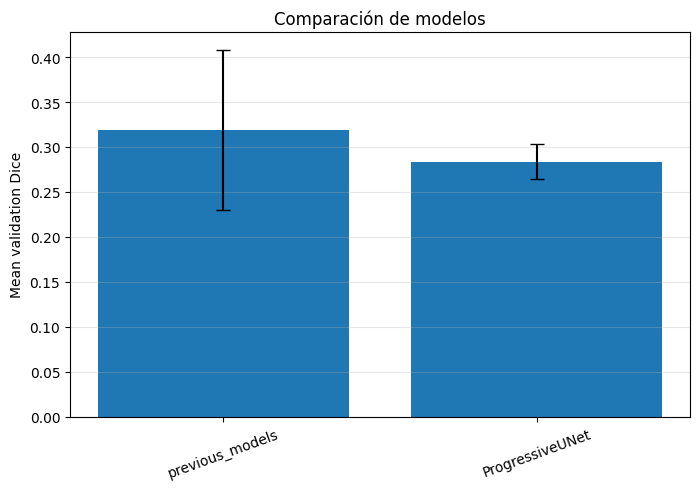

In [265]:
plt.figure(figsize=(8, 5))

plt.bar(
    comparison_df["model"],
    comparison_df["mean_val_dice"],
    yerr=comparison_df["std_val_dice"],
    capsize=5,
)

plt.ylabel("Mean validation Dice")
plt.title("Comparación de modelos")
plt.xticks(rotation=20)
plt.grid(axis="y", alpha=0.3)
plt.show()

In [266]:
best_fold_row = summary_df_prog.loc[summary_df_prog["val_dice"].idxmax()]



In [267]:
best_fold_row

,0
fold,1
epoch,40
train_loss,0.51886
train_dice,0.435681
train_iou,0.319284
train_pixel_acc,0.913314
val_loss,0.647519
val_dice,0.308887
val_iou,0.229791
val_pixel_acc,0.885305


In [268]:
# ============================================================
# INSPECCIÓN DE CHECKPOINTS
# ============================================================

def inspect_checkpoint(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location="cpu")

    print("Checkpoint:", checkpoint_path)
    print("Tipo:", type(checkpoint))

    if isinstance(checkpoint, dict):
        print("Keys principales:")
        for key in checkpoint.keys():
            print(" -", key)

        if "model_state_dict" in checkpoint:
            state_dict = checkpoint["model_state_dict"]
        elif "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]
        else:
            state_dict = checkpoint
    else:
        state_dict = checkpoint

    print("\nPrimeras capas:")
    for i, (k, v) in enumerate(state_dict.items()):
        print(k, tuple(v.shape))
        if i >= 10:
            break

    return checkpoint


def load_model_checkpoint(model, checkpoint_path, device, strict=True):
    checkpoint = torch.load(checkpoint_path, map_location=device)

    if isinstance(checkpoint, dict):
        if "model_state_dict" in checkpoint:
            state_dict = checkpoint["model_state_dict"]
        elif "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]
        else:
            state_dict = checkpoint
    else:
        state_dict = checkpoint

    model.load_state_dict(state_dict, strict=strict)
    model.to(device)
    model.eval()

    return model

In [269]:
best_fold = int(best_fold_row["fold"])
best_model_path = best_fold_row["checkpoint_path"]

print("Mejor fold:", best_fold)
print("Best val Dice:", best_fold_row["val_dice"])
print("Checkpoint:", best_model_path)

Mejor fold: 1
Best val Dice: 0.30888719038333756
Checkpoint: /content/mlflow_outputs/progressive_unet/progressive_unet_bs4_lr1e4_wd1e4/fold_1/progressive_unet_bs4_lr1e4_wd1e4_best_model_fold_1.pth


In [270]:
best_progressive_model = ProgressiveUNet(
    in_channels=IN_CHANNELS,
    num_classes=NUM_CLASSES,
    base_channels=BASE_CHANNELS,
    dropout=0.1,
    deep_supervision=USE_DEEP_SUPERVISION,
).to(device)

best_progressive_model = load_model_checkpoint(
    model=best_progressive_model,
    checkpoint_path=best_model_path,
    device=device,
    strict=True,
)

best_progressive_model.eval()

ProgressiveUNet(
  (enc1): ProgressiveExpansionBlock(
    (main): ConvBNReLU(
      (block): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Dropout2d(p=0.1, inplace=False)
        (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (6): ReLU(inplace=True)
      )
    )
    (progressive_branch): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (fusion): Sequential(
      (0): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, 

## 8.9 Guardando el modelo en MLFlow

In [271]:
import os
import json
import mlflow
import mlflow.pytorch
import torch

# ============================================================
# GUARDAR MODELO ACTUAL EN MLFLOW
# ============================================================

MODEL_NAME_IN_MLFLOW = "progressive_unet_spine_segmentation"

# Usa el modelo que ya tienes cargado
model_to_log = best_progressive_model  # cambia por model si ese es tu objeto

model_to_log.eval()

# Carpeta local temporal para guardar artefactos
mlflow_model_output_dir = os.path.join(MODEL_OUTPUT_DIR, RUN_NAME, "mlflow_model_export")
os.makedirs(mlflow_model_output_dir, exist_ok=True)

checkpoint_path = os.path.join(
    mlflow_model_output_dir,
    "progressive_unet_checkpoint.pth"
)

config_path = os.path.join(
    mlflow_model_output_dir,
    "progressive_unet_config.json"
)

# Guardar checkpoint PyTorch
torch.save(
    {
        "model_state_dict": model_to_log.state_dict(),
        "config": EXPERIMENT_CONFIG,
        "model_type": "ProgressiveUNet",
        "num_classes": NUM_CLASSES,
        "in_channels": IN_CHANNELS,
        "base_channels": BASE_CHANNELS,
        "run_name": RUN_NAME,
    },
    checkpoint_path,
)

# Guardar configuración
with open(config_path, "w") as f:
    json.dump(EXPERIMENT_CONFIG, f, indent=4)

with mlflow.start_run(run_name=f"{RUN_NAME}_model_export") as run:
    run_id = run.info.run_id
    print("MLflow run_id:", run_id)

    # Log de parámetros
    mlflow.log_params(EXPERIMENT_CONFIG)

    # Log del checkpoint como artefacto
    mlflow.log_artifact(checkpoint_path, artifact_path="checkpoints")
    mlflow.log_artifact(config_path, artifact_path="config")

    # Log del modelo PyTorch en formato MLflow
    mlflow.pytorch.log_model(
        pytorch_model=model_to_log,
        name="model",
        registered_model_name=None,  # puedes registrar después
    )

    print("Modelo guardado en MLflow.")
    print("Checkpoint local:", checkpoint_path)

MLflow run_id: 520d67cb94f44c86bcc29385589c18b8


2026/05/13 23:13:10 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/13 23:13:10 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2026/05/13 23:13:15 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version la

Modelo guardado en MLflow.
Checkpoint local: /content/mlflow_outputs/progressive_unet/progressive_unet_bs4_lr1e4_wd1e4/mlflow_model_export/progressive_unet_checkpoint.pth
🏃 View run progressive_unet_bs4_lr1e4_wd1e4_model_export at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/520d67cb94f44c86bcc29385589c18b8
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


In [272]:
mlflow.set_tracking_uri("databricks")
mlflow.set_registry_uri("databricks")

print("Tracking URI:", mlflow.get_tracking_uri())
print("Registry URI:", mlflow.get_registry_uri())

Tracking URI: databricks
Registry URI: databricks


In [273]:
import mlflow
import mlflow.pytorch

mlflow.set_tracking_uri("databricks")

model_to_log.eval()

with mlflow.start_run(run_name=f"{RUN_NAME}_model_logged_only") as run:
    run_id = run.info.run_id
    print("MLflow run_id:", run_id)

    mlflow.log_params(EXPERIMENT_CONFIG)

    mlflow.log_artifact(checkpoint_path, artifact_path="checkpoints")
    mlflow.log_artifact(config_path, artifact_path="config")

    mlflow.pytorch.log_model(
        pytorch_model=model_to_log,
        name="model",
        input_example=input_example,
        registered_model_name=None,
    )

    print("Modelo guardado dentro del run, sin registrar en Model Registry.")

MLflow run_id: 7da14d3daa184b308960f5dadb94b6b3


2026/05/13 23:13:50 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2026/05/13 23:13:50 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/13 23:13:50 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10

Modelo guardado dentro del run, sin registrar en Model Registry.
🏃 View run progressive_unet_bs4_lr1e4_wd1e4_model_logged_only at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/7da14d3daa184b308960f5dadb94b6b3
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


# 9.Experimento B - Reproduciendo el artículo por medio de clasificación binaria

In [276]:
# ============================================================
# EXPERIMENTO B - PROGRESSIVE U-NET BINARIA de acuerdo con el  paper Analysis of Scoliosis
# ============================================================

RUN_NAME_B = "exp_b_progressive_unet_binary_paper_like"

EXPERIMENT_B_CONFIG = {
    "experiment_id": "B",
    "experiment_name": "Progressive U-Net binary paper-like",
    "run_name": RUN_NAME_B,

    # El paper usa 1024 x 512 x 1.
    "img_size": (1024, 512),

    "batch_size": 1,
    "num_epochs": 60,
    "lr": 1e-2,
    "weight_decay": 0.0,
    "patience": 15,

    "n_splits": 4,

    "in_channels": 1,
    "out_channels": 1,

    "base_channels": 32,
    "dropout": 0.25,

    # Opciones: "bce", "dice", "bce_dice"
    # Para recrear PUX se usa "bce".
    # Para recrear PUD se usa "dice".
    # Para una versión propia más estable usar "bce_dice".
    "loss_type": "bce_dice",

    "threshold": 0.5,

    "model_type": "ProgressiveUNetBinaryPaperLike",
    "task": "binary_vertebra_segmentation",
}

In [277]:
EXPERIMENT_B_CONFIG["img_size"] = (512, 256)

## 9.1 Dataset Binario para el Experimento B

In [278]:
# ============================================================
# DATASET BINARIO PARA EXPERIMENTO B
# ============================================================

import cv2
from torch.utils.data import Dataset


class BinarySpineSegmentationDataset(Dataset):
    def __init__(
        self,
        dataframe,
        base_dir,
        img_size=(1024, 512),
        image_col="image_path",
        mask_col="mask_path",
    ):
        self.df = dataframe.reset_index(drop=True)
        self.base_dir = base_dir
        self.img_size = img_size
        self.image_col = image_col
        self.mask_col = mask_col

    def __len__(self):
        return len(self.df)

    def _resolve_path(self, path_value):
        path_value = str(path_value)

        if os.path.isabs(path_value):
            return path_value

        return os.path.join(self.base_dir, path_value)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image_path = self._resolve_path(row[self.image_col])
        mask_path = self._resolve_path(row[self.mask_col])

        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)

        if image is None:
            raise ValueError(f"No se pudo cargar la imagen: {image_path}")

        if mask is None:
            raise ValueError(f"No se pudo cargar la máscara: {mask_path}")

        image = cv2.resize(
            image,
            self.img_size,
            interpolation=cv2.INTER_AREA,
        )

        mask = cv2.resize(
            mask,
            self.img_size,
            interpolation=cv2.INTER_NEAREST,
        )

        if mask.ndim == 3:
            mask = mask[:, :, 0]

        image = image.astype(np.float32) / 255.0

        # Conversión multiclase -> binaria
        mask = (mask > 0).astype(np.float32)

        image = np.expand_dims(image, axis=0)
        mask = np.expand_dims(mask, axis=0)

        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)

        return {
            "image": image,
            "mask": mask,
            "image_path": image_path,
            "mask_path": mask_path,
        }

## 9.2 Funciones de Pérdida

In [279]:
# ============================================================
# LOSS BINARIA
# ============================================================

class BinaryDiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)

        probs = probs.view(probs.size(0), -1)
        targets = targets.view(targets.size(0), -1)

        intersection = (probs * targets).sum(dim=1)
        denominator = probs.sum(dim=1) + targets.sum(dim=1)

        dice = (2.0 * intersection + self.smooth) / (denominator + self.smooth)

        return 1.0 - dice.mean()


class BinaryBCEDiceLoss(nn.Module):
    def __init__(self, bce_weight=0.5, dice_weight=0.5):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = BinaryDiceLoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        bce_loss = self.bce(logits, targets)
        dice_loss = self.dice(logits, targets)

        return self.bce_weight * bce_loss + self.dice_weight * dice_loss


def get_binary_loss(loss_type="bce_dice"):
    if loss_type == "bce":
        return nn.BCEWithLogitsLoss()

    if loss_type == "dice":
        return BinaryDiceLoss()

    if loss_type == "bce_dice":
        return BinaryBCEDiceLoss(bce_weight=0.5, dice_weight=0.5)

    raise ValueError(f"loss_type no soportado: {loss_type}")

## 9.3 Métricas Binarias

In [280]:
# ============================================================
# MÉTRICAS BINARIAS
# ============================================================

def compute_binary_segmentation_metrics(logits, masks, threshold=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()

    preds_np = preds.detach().cpu().numpy().astype(np.uint8)
    masks_np = masks.detach().cpu().numpy().astype(np.uint8)

    pred_positive = preds_np == 1
    mask_positive = masks_np == 1

    intersection = np.logical_and(pred_positive, mask_positive).sum()
    union = np.logical_or(pred_positive, mask_positive).sum()

    pred_sum = pred_positive.sum()
    mask_sum = mask_positive.sum()

    dice = (2 * intersection + eps) / (pred_sum + mask_sum + eps)
    iou = (intersection + eps) / (union + eps)

    tp = intersection
    fp = np.logical_and(preds_np == 1, masks_np == 0).sum()
    fn = np.logical_and(preds_np == 0, masks_np == 1).sum()
    tn = np.logical_and(preds_np == 0, masks_np == 0).sum()

    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)
    f1 = (2 * precision * recall + eps) / (precision + recall + eps)
    acc = (tp + tn + eps) / (tp + tn + fp + fn + eps)

    return {
        "dice": float(dice),
        "iou": float(iou),
        "f1": float(f1),
        "precision": float(precision),
        "recall": float(recall),
        "acc": float(acc),
    }

## 9.4 Definición del Modelo similar al Paper

In [281]:
# ============================================================
# PROGRESSIVE U-NET BINARIA TIPO PAPER
# ============================================================

class PaperConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.25):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),

            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
        )

    def forward(self, x):
        return self.block(x)


class ProgressiveUNetBinaryPaperLike(nn.Module):
    def __init__(
        self,
        in_channels=1,
        out_channels=1,
        base_channels=32,
        dropout=0.25,
    ):
        super().__init__()

        c1 = base_channels
        c2 = base_channels * 2
        c3 = base_channels * 4
        c4 = base_channels * 8
        c5 = base_channels * 16

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc1 = PaperConvBlock(in_channels, c1, dropout=dropout)
        self.enc2 = PaperConvBlock(c1, c2, dropout=dropout)
        self.enc3 = PaperConvBlock(c2, c3, dropout=dropout)
        self.enc4 = PaperConvBlock(c3, c4, dropout=dropout)

        self.bottleneck = PaperConvBlock(c4, c5, dropout=dropout)

        self.up4 = nn.ConvTranspose2d(c5, c4, kernel_size=2, stride=2)
        self.dec4 = PaperConvBlock(c4 + c4, c4, dropout=dropout)

        self.up3 = nn.ConvTranspose2d(c4, c3, kernel_size=2, stride=2)
        self.dec3 = PaperConvBlock(c3 + c3, c3, dropout=dropout)

        self.up2 = nn.ConvTranspose2d(c3, c2, kernel_size=2, stride=2)
        self.dec2 = PaperConvBlock(c2 + c2, c2, dropout=dropout)

        self.up1 = nn.ConvTranspose2d(c2, c1, kernel_size=2, stride=2)
        self.dec1 = PaperConvBlock(c1 + c1, c1, dropout=dropout)

        # Side outputs: x/8, x/4, x/2
        self.side4 = nn.Conv2d(c4, out_channels, kernel_size=1)
        self.side3 = nn.Conv2d(c3, out_channels, kernel_size=1)
        self.side2 = nn.Conv2d(c2, out_channels, kernel_size=1)

        # Output final
        self.final_conv = nn.Conv2d(c1, out_channels, kernel_size=1)

    def forward(self, x):
        input_size = x.shape[-2:]

        e1 = self.enc1(x)              # x
        e2 = self.enc2(self.pool(e1))  # x/2
        e3 = self.enc3(self.pool(e2))  # x/4
        e4 = self.enc4(self.pool(e3))  # x/8

        b = self.bottleneck(self.pool(e4))

        d4 = self.up4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)             # x/8

        side4 = self.side4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)             # x/4

        side4_up = F.interpolate(
            side4,
            size=d3.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        side3 = self.side3(d3) + side4_up

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)             # x/2

        side3_up = F.interpolate(
            side3,
            size=d2.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        side2 = self.side2(d2) + side3_up

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)             # x

        side2_up = F.interpolate(
            side2,
            size=d1.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        logits = self.final_conv(d1) + side2_up

        if logits.shape[-2:] != input_size:
            logits = F.interpolate(
                logits,
                size=input_size,
                mode="bilinear",
                align_corners=False,
            )

        return logits

## 9.5 Prueba del Modelo antes de entrenar

In [282]:
# ============================================================
# SMOKE TEST DEL MODELO
# ============================================================

test_model = ProgressiveUNetBinaryPaperLike(
    in_channels=1,
    out_channels=1,
    base_channels=EXPERIMENT_B_CONFIG["base_channels"],
    dropout=EXPERIMENT_B_CONFIG["dropout"],
).to(device)

dummy_x = torch.randn(
    1,
    1,
    EXPERIMENT_B_CONFIG["img_size"][1],
    EXPERIMENT_B_CONFIG["img_size"][0],
).to(device)

with torch.no_grad():
    dummy_y = test_model(dummy_x)

print("Input shape:", dummy_x.shape)
print("Output shape:", dummy_y.shape)

del test_model, dummy_x, dummy_y
torch.cuda.empty_cache()

Input shape: torch.Size([1, 1, 256, 512])
Output shape: torch.Size([1, 1, 256, 512])


## 9.6 Train One Fold del Experimento B

In [283]:
# ============================================================
# TRAIN ONE FOLD - EXPERIMENTO B
# ============================================================

def train_one_fold_experiment_b(
    fold,
    train_df,
    val_df,
    base_dir,
    config,
    device,
    model_save_dir,
):
    print(f"\n========== EXPERIMENTO B | Fold {fold} ==========")
    print("Train samples:", len(train_df))
    print("Val samples:", len(val_df))

    fold_dir = os.path.join(model_save_dir, f"fold_{fold}")
    os.makedirs(fold_dir, exist_ok=True)

    train_dataset = BinarySpineSegmentationDataset(
        train_df,
        base_dir=base_dir,
        img_size=config["img_size"],
    )

    val_dataset = BinarySpineSegmentationDataset(
        val_df,
        base_dir=base_dir,
        img_size=config["img_size"],
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=config["batch_size"],
        shuffle=True,
        num_workers=2,
        pin_memory=True,
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=config["batch_size"],
        shuffle=False,
        num_workers=2,
        pin_memory=True,
    )

    model = ProgressiveUNetBinaryPaperLike(
        in_channels=config["in_channels"],
        out_channels=config["out_channels"],
        base_channels=config["base_channels"],
        dropout=config["dropout"],
    ).to(device)

    criterion = get_binary_loss(config["loss_type"])

    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=config["lr"],
        weight_decay=config["weight_decay"],
    )

    # Según el paper: lr inicial 0.01, disminuyendo 10x cada 20 épocas.
    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=20,
        gamma=0.1,
    )

    best_val_dice = -1.0
    best_epoch = -1
    epochs_without_improvement = 0

    best_model_path = os.path.join(fold_dir, f"best_model_fold_{fold}.pth")

    history = []

    for epoch in range(1, config["num_epochs"] + 1):
        model.train()

        train_losses = []
        train_metrics_rows = []

        for batch in tqdm(train_loader, desc=f"B Fold {fold} | Epoch {epoch} | Train"):
            images = batch["image"].to(device, non_blocking=True)
            masks = batch["mask"].to(device, non_blocking=True)

            optimizer.zero_grad()

            logits = model(images)
            loss = criterion(logits, masks)

            loss.backward()
            optimizer.step()

            metrics = compute_binary_segmentation_metrics(
                logits,
                masks,
                threshold=config["threshold"],
            )

            train_losses.append(loss.item())
            train_metrics_rows.append(metrics)

        model.eval()

        val_losses = []
        val_metrics_rows = []

        with torch.no_grad():
            for batch in tqdm(val_loader, desc=f"B Fold {fold} | Epoch {epoch} | Val"):
                images = batch["image"].to(device, non_blocking=True)
                masks = batch["mask"].to(device, non_blocking=True)

                logits = model(images)
                loss = criterion(logits, masks)

                metrics = compute_binary_segmentation_metrics(
                    logits,
                    masks,
                    threshold=config["threshold"],
                )

                val_losses.append(loss.item())
                val_metrics_rows.append(metrics)

        train_metrics_df = pd.DataFrame(train_metrics_rows)
        val_metrics_df = pd.DataFrame(val_metrics_rows)

        row = {
            "experiment": "B",
            "fold": fold,
            "epoch": epoch,

            "train_loss": float(np.mean(train_losses)),
            "train_dice": float(train_metrics_df["dice"].mean()),
            "train_iou": float(train_metrics_df["iou"].mean()),
            "train_f1": float(train_metrics_df["f1"].mean()),
            "train_precision": float(train_metrics_df["precision"].mean()),
            "train_recall": float(train_metrics_df["recall"].mean()),
            "train_acc": float(train_metrics_df["acc"].mean()),

            "val_loss": float(np.mean(val_losses)),
            "val_dice": float(val_metrics_df["dice"].mean()),
            "val_iou": float(val_metrics_df["iou"].mean()),
            "val_f1": float(val_metrics_df["f1"].mean()),
            "val_precision": float(val_metrics_df["precision"].mean()),
            "val_recall": float(val_metrics_df["recall"].mean()),
            "val_acc": float(val_metrics_df["acc"].mean()),

            "lr": optimizer.param_groups[0]["lr"],
        }

        history.append(row)

        print(
            f"Epoch {epoch:03d} | "
            f"train_loss={row['train_loss']:.4f} | "
            f"val_loss={row['val_loss']:.4f} | "
            f"val_dice={row['val_dice']:.4f} | "
            f"val_iou={row['val_iou']:.4f} | "
            f"val_f1={row['val_f1']:.4f}"
        )

        for key, value in row.items():
            if key not in ["experiment", "fold", "epoch"]:
                mlflow.log_metric(f"fold_{fold}_{key}", value, step=epoch)

        if row["val_dice"] > best_val_dice:
            best_val_dice = row["val_dice"]
            best_epoch = epoch
            epochs_without_improvement = 0

            torch.save(
                {
                    "model_state_dict": model.state_dict(),
                    "fold": fold,
                    "epoch": epoch,
                    "best_val_dice": best_val_dice,
                    "config": config,
                    "model_type": config["model_type"],
                },
                best_model_path,
            )

            print(f"Nuevo mejor modelo fold {fold}: val_dice={best_val_dice:.4f}")
        else:
            epochs_without_improvement += 1

        scheduler.step()

        if epochs_without_improvement >= config["patience"]:
            print(f"Early stopping fold {fold} en epoch {epoch}")
            break

    history_df = pd.DataFrame(history)

    history_path = os.path.join(fold_dir, f"history_fold_{fold}.csv")
    history_df.to_csv(history_path, index=False)

    mlflow.log_artifact(history_path, artifact_path=f"fold_{fold}/history")
    mlflow.log_artifact(best_model_path, artifact_path=f"fold_{fold}/checkpoints")

    best_row = history_df.loc[history_df["val_dice"].idxmax()].to_dict()
    best_row["best_model_path"] = best_model_path
    best_row["best_epoch"] = best_epoch

    return model, history_df, best_row

## 9.7 Run Experiment para el Experimento B

In [286]:
# ============================================================
# RUN EXPERIMENT B - PROGRESSIVE U-NET BINARIA + MLFLOW
# ============================================================

def run_experiment_b_binary_progressive_unet(
    df_input,
    base_dir,
    output_root,
    config,
):
    run_name = config["run_name"]

    model_save_dir = os.path.join(output_root, run_name)
    os.makedirs(model_save_dir, exist_ok=True)

    all_histories = []
    fold_summaries = []

    with mlflow.start_run(run_name=run_name) as run:
        run_id = run.info.run_id
        print("MLflow run_id:", run_id)

        # MLflow no siempre acepta tuplas como parámetros.
        mlflow_config = config.copy()
        mlflow_config["img_size"] = str(mlflow_config["img_size"])

        mlflow.log_params(mlflow_config)

        config_path = os.path.join(model_save_dir, "experiment_b_config.json")
        with open(config_path, "w") as f:
            json.dump(mlflow_config, f, indent=4)

        mlflow.log_artifact(config_path, artifact_path="config")

        gkf = GroupKFold(n_splits=config["n_splits"])

        X = df_input["image_path"].values
        y = df_input["mask_path"].values
        groups = df_input["patient_id"].values

        for fold, (train_idx, val_idx) in enumerate(
            gkf.split(X, y, groups=groups),
            start=1,
        ):
            train_df = df_input.iloc[train_idx].reset_index(drop=True)
            val_df = df_input.iloc[val_idx].reset_index(drop=True)

            train_patients = set(train_df["patient_id"])
            val_patients = set(val_df["patient_id"])
            overlap = train_patients.intersection(val_patients)

            print(f"\nFold {fold}")
            print("Train samples:", len(train_df))
            print("Val samples:", len(val_df))
            print("Train patients:", len(train_patients))
            print("Val patients:", len(val_patients))
            print("Patient overlap:", len(overlap))

            mlflow.log_metric(f"fold_{fold}_train_samples", len(train_df))
            mlflow.log_metric(f"fold_{fold}_val_samples", len(val_df))
            mlflow.log_metric(f"fold_{fold}_patient_overlap", len(overlap))

            model, history_df, best_row = train_one_fold_experiment_b(
                fold=fold,
                train_df=train_df,
                val_df=val_df,
                base_dir=base_dir,
                config=config,
                device=device,
                model_save_dir=model_save_dir,
            )

            history_df["run_name"] = run_name
            history_df["model_type"] = config["model_type"]
            history_df["task"] = config["task"]

            best_row["run_name"] = run_name
            best_row["model_type"] = config["model_type"]
            best_row["task"] = config["task"]

            all_histories.append(history_df)
            fold_summaries.append(best_row)

        histories_df = pd.concat(all_histories, ignore_index=True)
        summary_df = pd.DataFrame(fold_summaries)

        histories_path = os.path.join(model_save_dir, "experiment_b_all_histories.csv")
        summary_path = os.path.join(model_save_dir, "experiment_b_summary.csv")

        histories_df.to_csv(histories_path, index=False)
        summary_df.to_csv(summary_path, index=False)

        mlflow.log_artifact(histories_path, artifact_path="results")
        mlflow.log_artifact(summary_path, artifact_path="results")

        cv_mean_val_dice = summary_df["val_dice"].mean()
        cv_std_val_dice = summary_df["val_dice"].std()
        cv_mean_val_iou = summary_df["val_iou"].mean()
        cv_mean_val_f1 = summary_df["val_f1"].mean()
        cv_mean_val_acc = summary_df["val_acc"].mean()
        cv_mean_val_loss = summary_df["val_loss"].mean()

        mlflow.log_metric("cv_mean_val_dice", cv_mean_val_dice)
        mlflow.log_metric("cv_std_val_dice", cv_std_val_dice)
        mlflow.log_metric("cv_mean_val_iou", cv_mean_val_iou)
        mlflow.log_metric("cv_mean_val_f1", cv_mean_val_f1)
        mlflow.log_metric("cv_mean_val_acc", cv_mean_val_acc)
        mlflow.log_metric("cv_mean_val_loss", cv_mean_val_loss)

        print("\n========== RESULTADOS EXPERIMENTO B ==========")
        print("CV mean val Dice:", cv_mean_val_dice)
        print("CV std val Dice:", cv_std_val_dice)
        print("CV mean val IoU:", cv_mean_val_iou)
        print("CV mean val F1:", cv_mean_val_f1)
        print("CV mean val Acc:", cv_mean_val_acc)
        print("CV mean val Loss:", cv_mean_val_loss)

    return histories_df, summary_df

## 9.8 Entrenamiento del modelo Experimento B

In [287]:
histories_df_b, summary_df_b = run_experiment_b_binary_progressive_unet(
    df_input=df_input,
    base_dir=PATH,
    output_root=MODEL_OUTPUT_DIR,
    config=EXPERIMENT_B_CONFIG,
)

MLflow run_id: 086ba35fc5f147798715afc67fb69473

Fold 1
Train samples: 186
Val samples: 63
Train patients: 148
Val patients: 50
Patient overlap: 0

========== EXPERIMENTO B | Fold 1 ==========
Train samples: 186
Val samples: 63


B Fold 1 | Epoch 1 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 1 | Val:   0%|          | 0/63 [00:10<?, ?it/s]

Epoch 001 | train_loss=0.4418 | val_loss=0.3999 | val_dice=0.5507 | val_iou=0.3894 | val_f1=0.5507
Nuevo mejor modelo fold 1: val_dice=0.5507


B Fold 1 | Epoch 2 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 2 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 002 | train_loss=0.4036 | val_loss=0.4116 | val_dice=0.5634 | val_iou=0.4080 | val_f1=0.5634
Nuevo mejor modelo fold 1: val_dice=0.5634


B Fold 1 | Epoch 3 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 3 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'Exception ignored in: 
 <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
      ^if w.is_alive():^
 ^^ ^  ^ ^^ ^ ^^^^^^^^^^^^^^^^

Epoch 003 | train_loss=0.3759 | val_loss=0.3555 | val_dice=0.5974 | val_iou=0.4390 | val_f1=0.5974
Nuevo mejor modelo fold 1: val_dice=0.5974


B Fold 1 | Epoch 4 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 4 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 004 | train_loss=0.3459 | val_loss=0.3430 | val_dice=0.6253 | val_iou=0.4672 | val_f1=0.6253
Nuevo mejor modelo fold 1: val_dice=0.6253


B Fold 1 | Epoch 5 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 5 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 005 | train_loss=0.3257 | val_loss=0.3090 | val_dice=0.6599 | val_iou=0.5030 | val_f1=0.6599
Nuevo mejor modelo fold 1: val_dice=0.6599


B Fold 1 | Epoch 6 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 6 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 006 | train_loss=0.2947 | val_loss=0.2691 | val_dice=0.7045 | val_iou=0.5534 | val_f1=0.7045
Nuevo mejor modelo fold 1: val_dice=0.7045


B Fold 1 | Epoch 7 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 7 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 007 | train_loss=0.2815 | val_loss=0.2655 | val_dice=0.7127 | val_iou=0.5642 | val_f1=0.7127
Nuevo mejor modelo fold 1: val_dice=0.7127


B Fold 1 | Epoch 8 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 8 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 008 | train_loss=0.2732 | val_loss=0.2972 | val_dice=0.6800 | val_iou=0.5298 | val_f1=0.6800


B Fold 1 | Epoch 9 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 9 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 009 | train_loss=0.2674 | val_loss=0.2585 | val_dice=0.7207 | val_iou=0.5726 | val_f1=0.7207
Nuevo mejor modelo fold 1: val_dice=0.7207


B Fold 1 | Epoch 10 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 10 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 010 | train_loss=0.2654 | val_loss=0.2734 | val_dice=0.7084 | val_iou=0.5595 | val_f1=0.7084


B Fold 1 | Epoch 11 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 11 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 011 | train_loss=0.2526 | val_loss=0.2432 | val_dice=0.7385 | val_iou=0.5941 | val_f1=0.7385
Nuevo mejor modelo fold 1: val_dice=0.7385


B Fold 1 | Epoch 12 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 12 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 012 | train_loss=0.2395 | val_loss=0.2305 | val_dice=0.7523 | val_iou=0.6113 | val_f1=0.7523
Nuevo mejor modelo fold 1: val_dice=0.7523


B Fold 1 | Epoch 13 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 13 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 013 | train_loss=0.2266 | val_loss=0.2251 | val_dice=0.7572 | val_iou=0.6171 | val_f1=0.7572
Nuevo mejor modelo fold 1: val_dice=0.7572


B Fold 1 | Epoch 14 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 14 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 014 | train_loss=0.2177 | val_loss=0.2468 | val_dice=0.7382 | val_iou=0.5953 | val_f1=0.7382


B Fold 1 | Epoch 15 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 15 | Val:   0%|          | 0/63 [00:30<?, ?it/s]

Epoch 015 | train_loss=0.2223 | val_loss=0.2177 | val_dice=0.7646 | val_iou=0.6273 | val_f1=0.7646
Nuevo mejor modelo fold 1: val_dice=0.7646


B Fold 1 | Epoch 16 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 16 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 016 | train_loss=0.2084 | val_loss=0.2045 | val_dice=0.7807 | val_iou=0.6471 | val_f1=0.7807
Nuevo mejor modelo fold 1: val_dice=0.7807


B Fold 1 | Epoch 17 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 17 | Val:   0%|          | 0/63 [00:30<?, ?it/s]

Epoch 017 | train_loss=0.2164 | val_loss=0.2246 | val_dice=0.7588 | val_iou=0.6218 | val_f1=0.7588


B Fold 1 | Epoch 18 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 18 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 018 | train_loss=0.1968 | val_loss=0.2078 | val_dice=0.7786 | val_iou=0.6450 | val_f1=0.7786


B Fold 1 | Epoch 19 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 19 | Val:   0%|          | 0/63 [00:30<?, ?it/s]

Epoch 019 | train_loss=0.2015 | val_loss=0.2126 | val_dice=0.7742 | val_iou=0.6392 | val_f1=0.7742


B Fold 1 | Epoch 20 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 20 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 020 | train_loss=0.1966 | val_loss=0.2053 | val_dice=0.7783 | val_iou=0.6452 | val_f1=0.7783


B Fold 1 | Epoch 21 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 21 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 021 | train_loss=0.1746 | val_loss=0.1836 | val_dice=0.8046 | val_iou=0.6796 | val_f1=0.8046
Nuevo mejor modelo fold 1: val_dice=0.8046


B Fold 1 | Epoch 22 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 22 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 022 | train_loss=0.1670 | val_loss=0.1827 | val_dice=0.8063 | val_iou=0.6821 | val_f1=0.8063
Nuevo mejor modelo fold 1: val_dice=0.8063


B Fold 1 | Epoch 23 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 23 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 023 | train_loss=0.1646 | val_loss=0.1800 | val_dice=0.8082 | val_iou=0.6844 | val_f1=0.8082
Nuevo mejor modelo fold 1: val_dice=0.8082


B Fold 1 | Epoch 24 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 24 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 024 | train_loss=0.1619 | val_loss=0.1795 | val_dice=0.8091 | val_iou=0.6857 | val_f1=0.8091
Nuevo mejor modelo fold 1: val_dice=0.8091


B Fold 1 | Epoch 25 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 25 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 025 | train_loss=0.1599 | val_loss=0.1797 | val_dice=0.8089 | val_iou=0.6856 | val_f1=0.8089


B Fold 1 | Epoch 26 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 26 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 026 | train_loss=0.1606 | val_loss=0.1761 | val_dice=0.8130 | val_iou=0.6909 | val_f1=0.8130
Nuevo mejor modelo fold 1: val_dice=0.8130


B Fold 1 | Epoch 27 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 27 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 027 | train_loss=0.1571 | val_loss=0.1757 | val_dice=0.8127 | val_iou=0.6905 | val_f1=0.8127


B Fold 1 | Epoch 28 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 28 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 028 | train_loss=0.1549 | val_loss=0.1744 | val_dice=0.8151 | val_iou=0.6936 | val_f1=0.8151
Nuevo mejor modelo fold 1: val_dice=0.8151


B Fold 1 | Epoch 29 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 29 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
     if w.is_alive():
      ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 029 | train_loss=0.1539 | val_loss=0.1751 | val_dice=0.8149 | val_iou=0.6935 | val_f1=0.8149


B Fold 1 | Epoch 30 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 30 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 030 | train_loss=0.1526 | val_loss=0.1758 | val_dice=0.8136 | val_iou=0.6921 | val_f1=0.8136


B Fold 1 | Epoch 31 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 31 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 031 | train_loss=0.1500 | val_loss=0.1761 | val_dice=0.8136 | val_iou=0.6923 | val_f1=0.8136


B Fold 1 | Epoch 32 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 32 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 032 | train_loss=0.1538 | val_loss=0.1756 | val_dice=0.8148 | val_iou=0.6933 | val_f1=0.8148


B Fold 1 | Epoch 33 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 33 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 033 | train_loss=0.1511 | val_loss=0.1733 | val_dice=0.8170 | val_iou=0.6963 | val_f1=0.8170
Nuevo mejor modelo fold 1: val_dice=0.8170


B Fold 1 | Epoch 34 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 34 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 034 | train_loss=0.1491 | val_loss=0.1715 | val_dice=0.8188 | val_iou=0.6990 | val_f1=0.8188
Nuevo mejor modelo fold 1: val_dice=0.8188


B Fold 1 | Epoch 35 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 35 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 035 | train_loss=0.1486 | val_loss=0.1747 | val_dice=0.8155 | val_iou=0.6945 | val_f1=0.8155


B Fold 1 | Epoch 36 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 36 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 036 | train_loss=0.1477 | val_loss=0.1699 | val_dice=0.8207 | val_iou=0.7011 | val_f1=0.8207
Nuevo mejor modelo fold 1: val_dice=0.8207


B Fold 1 | Epoch 37 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 37 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 037 | train_loss=0.1456 | val_loss=0.1723 | val_dice=0.8171 | val_iou=0.6968 | val_f1=0.8171


B Fold 1 | Epoch 38 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 38 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 038 | train_loss=0.1446 | val_loss=0.1713 | val_dice=0.8186 | val_iou=0.6986 | val_f1=0.8186


B Fold 1 | Epoch 39 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 39 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 039 | train_loss=0.1444 | val_loss=0.1761 | val_dice=0.8160 | val_iou=0.6952 | val_f1=0.8160


B Fold 1 | Epoch 40 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 40 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 040 | train_loss=0.1440 | val_loss=0.1695 | val_dice=0.8205 | val_iou=0.7015 | val_f1=0.8205


B Fold 1 | Epoch 41 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 41 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 041 | train_loss=0.1405 | val_loss=0.1695 | val_dice=0.8207 | val_iou=0.7018 | val_f1=0.8207


B Fold 1 | Epoch 42 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 42 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 042 | train_loss=0.1411 | val_loss=0.1692 | val_dice=0.8212 | val_iou=0.7025 | val_f1=0.8212
Nuevo mejor modelo fold 1: val_dice=0.8212


B Fold 1 | Epoch 43 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 43 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 043 | train_loss=0.1411 | val_loss=0.1686 | val_dice=0.8217 | val_iou=0.7030 | val_f1=0.8217
Nuevo mejor modelo fold 1: val_dice=0.8217


B Fold 1 | Epoch 44 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 44 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 044 | train_loss=0.1408 | val_loss=0.1690 | val_dice=0.8215 | val_iou=0.7027 | val_f1=0.8215


B Fold 1 | Epoch 45 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 45 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 045 | train_loss=0.1369 | val_loss=0.1700 | val_dice=0.8212 | val_iou=0.7025 | val_f1=0.8212


B Fold 1 | Epoch 46 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 46 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 046 | train_loss=0.1385 | val_loss=0.1696 | val_dice=0.8217 | val_iou=0.7030 | val_f1=0.8217


B Fold 1 | Epoch 47 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 47 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 047 | train_loss=0.1377 | val_loss=0.1702 | val_dice=0.8210 | val_iou=0.7022 | val_f1=0.8210


B Fold 1 | Epoch 48 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 48 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 048 | train_loss=0.1386 | val_loss=0.1691 | val_dice=0.8219 | val_iou=0.7033 | val_f1=0.8219
Nuevo mejor modelo fold 1: val_dice=0.8219


B Fold 1 | Epoch 49 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 49 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 049 | train_loss=0.1396 | val_loss=0.1690 | val_dice=0.8221 | val_iou=0.7036 | val_f1=0.8221
Nuevo mejor modelo fold 1: val_dice=0.8221


B Fold 1 | Epoch 50 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 50 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 050 | train_loss=0.1378 | val_loss=0.1686 | val_dice=0.8224 | val_iou=0.7040 | val_f1=0.8224
Nuevo mejor modelo fold 1: val_dice=0.8224


B Fold 1 | Epoch 51 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 51 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 051 | train_loss=0.1375 | val_loss=0.1682 | val_dice=0.8229 | val_iou=0.7046 | val_f1=0.8229
Nuevo mejor modelo fold 1: val_dice=0.8229


B Fold 1 | Epoch 52 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 52 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 052 | train_loss=0.1387 | val_loss=0.1690 | val_dice=0.8226 | val_iou=0.7044 | val_f1=0.8226


B Fold 1 | Epoch 53 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 53 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 053 | train_loss=0.1378 | val_loss=0.1691 | val_dice=0.8224 | val_iou=0.7041 | val_f1=0.8224


B Fold 1 | Epoch 54 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 54 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 054 | train_loss=0.1394 | val_loss=0.1686 | val_dice=0.8228 | val_iou=0.7047 | val_f1=0.8228


B Fold 1 | Epoch 55 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 55 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 055 | train_loss=0.1383 | val_loss=0.1690 | val_dice=0.8225 | val_iou=0.7043 | val_f1=0.8225


B Fold 1 | Epoch 56 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 56 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 056 | train_loss=0.1376 | val_loss=0.1687 | val_dice=0.8229 | val_iou=0.7048 | val_f1=0.8229
Nuevo mejor modelo fold 1: val_dice=0.8229


B Fold 1 | Epoch 57 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 57 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 057 | train_loss=0.1396 | val_loss=0.1681 | val_dice=0.8229 | val_iou=0.7047 | val_f1=0.8229
Nuevo mejor modelo fold 1: val_dice=0.8229


B Fold 1 | Epoch 58 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 58 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 058 | train_loss=0.1388 | val_loss=0.1679 | val_dice=0.8231 | val_iou=0.7051 | val_f1=0.8231
Nuevo mejor modelo fold 1: val_dice=0.8231


B Fold 1 | Epoch 59 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 59 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 059 | train_loss=0.1376 | val_loss=0.1680 | val_dice=0.8232 | val_iou=0.7053 | val_f1=0.8232
Nuevo mejor modelo fold 1: val_dice=0.8232


B Fold 1 | Epoch 60 | Train:   0%|          | 0/186 [00:00<?, ?it/s]

B Fold 1 | Epoch 60 | Val:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 060 | train_loss=0.1364 | val_loss=0.1682 | val_dice=0.8229 | val_iou=0.7048 | val_f1=0.8229

Fold 2
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Patient overlap: 0

========== EXPERIMENTO B | Fold 2 ==========
Train samples: 187
Val samples: 62


B Fold 2 | Epoch 1 | Train:   0%|          | 0/187 [00:20<?, ?it/s]

B Fold 2 | Epoch 1 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 001 | train_loss=0.4496 | val_loss=0.3991 | val_dice=0.5332 | val_iou=0.3795 | val_f1=0.5332
Nuevo mejor modelo fold 2: val_dice=0.5332


B Fold 2 | Epoch 2 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 2 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 002 | train_loss=0.4039 | val_loss=0.3710 | val_dice=0.5849 | val_iou=0.4271 | val_f1=0.5849
Nuevo mejor modelo fold 2: val_dice=0.5849


B Fold 2 | Epoch 3 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 3 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 003 | train_loss=0.3796 | val_loss=0.3759 | val_dice=0.5337 | val_iou=0.3801 | val_f1=0.5337


B Fold 2 | Epoch 4 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 4 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 004 | train_loss=0.3533 | val_loss=0.3036 | val_dice=0.6550 | val_iou=0.4956 | val_f1=0.6550
Nuevo mejor modelo fold 2: val_dice=0.6550


B Fold 2 | Epoch 5 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 5 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 005 | train_loss=0.3319 | val_loss=0.3088 | val_dice=0.6515 | val_iou=0.4956 | val_f1=0.6515


B Fold 2 | Epoch 6 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 6 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 006 | train_loss=0.3236 | val_loss=0.2883 | val_dice=0.6703 | val_iou=0.5141 | val_f1=0.6703
Nuevo mejor modelo fold 2: val_dice=0.6703


B Fold 2 | Epoch 7 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 7 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 007 | train_loss=0.3026 | val_loss=0.2721 | val_dice=0.6911 | val_iou=0.5379 | val_f1=0.6911
Nuevo mejor modelo fold 2: val_dice=0.6911


B Fold 2 | Epoch 8 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 8 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 008 | train_loss=0.2907 | val_loss=0.2482 | val_dice=0.7167 | val_iou=0.5668 | val_f1=0.7167
Nuevo mejor modelo fold 2: val_dice=0.7167


B Fold 2 | Epoch 9 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 9 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 009 | train_loss=0.2757 | val_loss=0.2297 | val_dice=0.7429 | val_iou=0.5999 | val_f1=0.7429
Nuevo mejor modelo fold 2: val_dice=0.7429


B Fold 2 | Epoch 10 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 10 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 010 | train_loss=0.2646 | val_loss=0.2330 | val_dice=0.7355 | val_iou=0.5916 | val_f1=0.7355


B Fold 2 | Epoch 11 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 11 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 011 | train_loss=0.2569 | val_loss=0.2293 | val_dice=0.7475 | val_iou=0.6059 | val_f1=0.7475
Nuevo mejor modelo fold 2: val_dice=0.7475


B Fold 2 | Epoch 12 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 12 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 012 | train_loss=0.2470 | val_loss=0.2139 | val_dice=0.7592 | val_iou=0.6197 | val_f1=0.7592
Nuevo mejor modelo fold 2: val_dice=0.7592


B Fold 2 | Epoch 13 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 13 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 013 | train_loss=0.2384 | val_loss=0.2100 | val_dice=0.7680 | val_iou=0.6305 | val_f1=0.7680
Nuevo mejor modelo fold 2: val_dice=0.7680


B Fold 2 | Epoch 14 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 14 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 014 | train_loss=0.2356 | val_loss=0.2108 | val_dice=0.7581 | val_iou=0.6221 | val_f1=0.7581


B Fold 2 | Epoch 15 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 15 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 015 | train_loss=0.2299 | val_loss=0.2064 | val_dice=0.7703 | val_iou=0.6346 | val_f1=0.7703
Nuevo mejor modelo fold 2: val_dice=0.7703


B Fold 2 | Epoch 16 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 16 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 016 | train_loss=0.2224 | val_loss=0.2135 | val_dice=0.7673 | val_iou=0.6308 | val_f1=0.7673


B Fold 2 | Epoch 17 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 17 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 017 | train_loss=0.2222 | val_loss=0.1920 | val_dice=0.7877 | val_iou=0.6582 | val_f1=0.7877
Nuevo mejor modelo fold 2: val_dice=0.7877


B Fold 2 | Epoch 18 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 18 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 018 | train_loss=0.2171 | val_loss=0.1950 | val_dice=0.7877 | val_iou=0.6587 | val_f1=0.7877


B Fold 2 | Epoch 19 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 19 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 019 | train_loss=0.2086 | val_loss=0.1922 | val_dice=0.7894 | val_iou=0.6584 | val_f1=0.7894
Nuevo mejor modelo fold 2: val_dice=0.7894


B Fold 2 | Epoch 20 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 20 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 020 | train_loss=0.2054 | val_loss=0.1829 | val_dice=0.7984 | val_iou=0.6718 | val_f1=0.7984
Nuevo mejor modelo fold 2: val_dice=0.7984


B Fold 2 | Epoch 21 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 21 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 021 | train_loss=0.1794 | val_loss=0.1706 | val_dice=0.8123 | val_iou=0.6897 | val_f1=0.8123
Nuevo mejor modelo fold 2: val_dice=0.8123


B Fold 2 | Epoch 22 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 22 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 022 | train_loss=0.1705 | val_loss=0.1658 | val_dice=0.8174 | val_iou=0.6968 | val_f1=0.8174
Nuevo mejor modelo fold 2: val_dice=0.8174


B Fold 2 | Epoch 23 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 23 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 023 | train_loss=0.1681 | val_loss=0.1654 | val_dice=0.8187 | val_iou=0.6981 | val_f1=0.8187
Nuevo mejor modelo fold 2: val_dice=0.8187


B Fold 2 | Epoch 24 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 24 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 024 | train_loss=0.1637 | val_loss=0.1634 | val_dice=0.8200 | val_iou=0.7002 | val_f1=0.8200
Nuevo mejor modelo fold 2: val_dice=0.8200


B Fold 2 | Epoch 25 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 25 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 025 | train_loss=0.1629 | val_loss=0.1604 | val_dice=0.8237 | val_iou=0.7054 | val_f1=0.8237
Nuevo mejor modelo fold 2: val_dice=0.8237


B Fold 2 | Epoch 26 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 26 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 026 | train_loss=0.1628 | val_loss=0.1596 | val_dice=0.8242 | val_iou=0.7059 | val_f1=0.8242
Nuevo mejor modelo fold 2: val_dice=0.8242


B Fold 2 | Epoch 27 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 27 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 027 | train_loss=0.1581 | val_loss=0.1587 | val_dice=0.8255 | val_iou=0.7077 | val_f1=0.8255
Nuevo mejor modelo fold 2: val_dice=0.8255


B Fold 2 | Epoch 28 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 28 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 028 | train_loss=0.1605 | val_loss=0.1584 | val_dice=0.8257 | val_iou=0.7081 | val_f1=0.8257
Nuevo mejor modelo fold 2: val_dice=0.8257


B Fold 2 | Epoch 29 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 29 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 029 | train_loss=0.1570 | val_loss=0.1599 | val_dice=0.8236 | val_iou=0.7055 | val_f1=0.8236


B Fold 2 | Epoch 30 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 30 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 030 | train_loss=0.1560 | val_loss=0.1593 | val_dice=0.8249 | val_iou=0.7071 | val_f1=0.8249


B Fold 2 | Epoch 31 | Train:   0%|          | 0/187 [00:40<?, ?it/s]

B Fold 2 | Epoch 31 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 031 | train_loss=0.1546 | val_loss=0.1576 | val_dice=0.8274 | val_iou=0.7107 | val_f1=0.8274
Nuevo mejor modelo fold 2: val_dice=0.8274


B Fold 2 | Epoch 32 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 32 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 032 | train_loss=0.1539 | val_loss=0.1566 | val_dice=0.8279 | val_iou=0.7115 | val_f1=0.8279
Nuevo mejor modelo fold 2: val_dice=0.8279


B Fold 2 | Epoch 33 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 33 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 033 | train_loss=0.1529 | val_loss=0.1573 | val_dice=0.8271 | val_iou=0.7102 | val_f1=0.8271


B Fold 2 | Epoch 34 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 34 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 034 | train_loss=0.1523 | val_loss=0.1561 | val_dice=0.8279 | val_iou=0.7116 | val_f1=0.8279
Nuevo mejor modelo fold 2: val_dice=0.8279


B Fold 2 | Epoch 35 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 35 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 035 | train_loss=0.1511 | val_loss=0.1558 | val_dice=0.8291 | val_iou=0.7131 | val_f1=0.8291
Nuevo mejor modelo fold 2: val_dice=0.8291


B Fold 2 | Epoch 36 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 36 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 036 | train_loss=0.1515 | val_loss=0.1543 | val_dice=0.8294 | val_iou=0.7134 | val_f1=0.8294
Nuevo mejor modelo fold 2: val_dice=0.8294


B Fold 2 | Epoch 37 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 37 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 037 | train_loss=0.1478 | val_loss=0.1545 | val_dice=0.8296 | val_iou=0.7139 | val_f1=0.8296
Nuevo mejor modelo fold 2: val_dice=0.8296


B Fold 2 | Epoch 38 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 38 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 038 | train_loss=0.1473 | val_loss=0.1552 | val_dice=0.8289 | val_iou=0.7130 | val_f1=0.8289


B Fold 2 | Epoch 39 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 39 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 039 | train_loss=0.1468 | val_loss=0.1536 | val_dice=0.8313 | val_iou=0.7160 | val_f1=0.8313
Nuevo mejor modelo fold 2: val_dice=0.8313


B Fold 2 | Epoch 40 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 40 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 040 | train_loss=0.1474 | val_loss=0.1528 | val_dice=0.8310 | val_iou=0.7157 | val_f1=0.8310


B Fold 2 | Epoch 41 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 41 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 041 | train_loss=0.1439 | val_loss=0.1515 | val_dice=0.8324 | val_iou=0.7178 | val_f1=0.8324
Nuevo mejor modelo fold 2: val_dice=0.8324


B Fold 2 | Epoch 42 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 42 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 042 | train_loss=0.1420 | val_loss=0.1517 | val_dice=0.8326 | val_iou=0.7180 | val_f1=0.8326
Nuevo mejor modelo fold 2: val_dice=0.8326


B Fold 2 | Epoch 43 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 43 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 043 | train_loss=0.1411 | val_loss=0.1512 | val_dice=0.8330 | val_iou=0.7186 | val_f1=0.8330
Nuevo mejor modelo fold 2: val_dice=0.8330


B Fold 2 | Epoch 44 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 44 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 044 | train_loss=0.1422 | val_loss=0.1514 | val_dice=0.8327 | val_iou=0.7183 | val_f1=0.8327


B Fold 2 | Epoch 45 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 45 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 045 | train_loss=0.1412 | val_loss=0.1512 | val_dice=0.8334 | val_iou=0.7191 | val_f1=0.8334
Nuevo mejor modelo fold 2: val_dice=0.8334


B Fold 2 | Epoch 46 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 46 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 046 | train_loss=0.1425 | val_loss=0.1511 | val_dice=0.8331 | val_iou=0.7188 | val_f1=0.8331


B Fold 2 | Epoch 47 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 47 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 047 | train_loss=0.1405 | val_loss=0.1511 | val_dice=0.8333 | val_iou=0.7190 | val_f1=0.8333


B Fold 2 | Epoch 48 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 48 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 048 | train_loss=0.1400 | val_loss=0.1513 | val_dice=0.8332 | val_iou=0.7189 | val_f1=0.8332


B Fold 2 | Epoch 49 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 49 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 049 | train_loss=0.1398 | val_loss=0.1509 | val_dice=0.8337 | val_iou=0.7196 | val_f1=0.8337
Nuevo mejor modelo fold 2: val_dice=0.8337


B Fold 2 | Epoch 50 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 50 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 050 | train_loss=0.1419 | val_loss=0.1510 | val_dice=0.8337 | val_iou=0.7196 | val_f1=0.8337
Nuevo mejor modelo fold 2: val_dice=0.8337


B Fold 2 | Epoch 51 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 51 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 051 | train_loss=0.1400 | val_loss=0.1511 | val_dice=0.8335 | val_iou=0.7194 | val_f1=0.8335


B Fold 2 | Epoch 52 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 52 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 052 | train_loss=0.1406 | val_loss=0.1513 | val_dice=0.8332 | val_iou=0.7189 | val_f1=0.8332


B Fold 2 | Epoch 53 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 53 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 053 | train_loss=0.1408 | val_loss=0.1509 | val_dice=0.8336 | val_iou=0.7195 | val_f1=0.8336


B Fold 2 | Epoch 54 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 54 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 054 | train_loss=0.1414 | val_loss=0.1509 | val_dice=0.8336 | val_iou=0.7195 | val_f1=0.8336


B Fold 2 | Epoch 55 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 55 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 055 | train_loss=0.1421 | val_loss=0.1513 | val_dice=0.8333 | val_iou=0.7191 | val_f1=0.8333


B Fold 2 | Epoch 56 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 56 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 056 | train_loss=0.1385 | val_loss=0.1508 | val_dice=0.8337 | val_iou=0.7197 | val_f1=0.8337


B Fold 2 | Epoch 57 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 57 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 057 | train_loss=0.1386 | val_loss=0.1510 | val_dice=0.8333 | val_iou=0.7192 | val_f1=0.8333


B Fold 2 | Epoch 58 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 58 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 058 | train_loss=0.1375 | val_loss=0.1510 | val_dice=0.8334 | val_iou=0.7193 | val_f1=0.8334


B Fold 2 | Epoch 59 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 59 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 059 | train_loss=0.1404 | val_loss=0.1507 | val_dice=0.8339 | val_iou=0.7199 | val_f1=0.8339
Nuevo mejor modelo fold 2: val_dice=0.8339


B Fold 2 | Epoch 60 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 2 | Epoch 60 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 060 | train_loss=0.1385 | val_loss=0.1509 | val_dice=0.8336 | val_iou=0.7195 | val_f1=0.8336

Fold 3
Train samples: 187
Val samples: 62
Train patients: 149
Val patients: 49
Patient overlap: 0

========== EXPERIMENTO B | Fold 3 ==========
Train samples: 187
Val samples: 62


B Fold 3 | Epoch 1 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 1 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 001 | train_loss=0.4552 | val_loss=0.4196 | val_dice=0.5079 | val_iou=0.3600 | val_f1=0.5079
Nuevo mejor modelo fold 3: val_dice=0.5079


B Fold 3 | Epoch 2 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 2 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 002 | train_loss=0.3973 | val_loss=0.3860 | val_dice=0.5661 | val_iou=0.4127 | val_f1=0.5661
Nuevo mejor modelo fold 3: val_dice=0.5661


B Fold 3 | Epoch 3 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 3 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 003 | train_loss=0.3687 | val_loss=0.3253 | val_dice=0.6367 | val_iou=0.4801 | val_f1=0.6367
Nuevo mejor modelo fold 3: val_dice=0.6367


B Fold 3 | Epoch 4 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 4 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 004 | train_loss=0.3502 | val_loss=0.3110 | val_dice=0.6438 | val_iou=0.4852 | val_f1=0.6438
Nuevo mejor modelo fold 3: val_dice=0.6438


B Fold 3 | Epoch 5 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 5 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 005 | train_loss=0.3219 | val_loss=0.2990 | val_dice=0.6657 | val_iou=0.5077 | val_f1=0.6657
Nuevo mejor modelo fold 3: val_dice=0.6657


B Fold 3 | Epoch 6 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 6 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 006 | train_loss=0.3192 | val_loss=0.3068 | val_dice=0.6593 | val_iou=0.5057 | val_f1=0.6593


B Fold 3 | Epoch 7 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 7 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 007 | train_loss=0.3001 | val_loss=0.2809 | val_dice=0.6911 | val_iou=0.5398 | val_f1=0.6911
Nuevo mejor modelo fold 3: val_dice=0.6911


B Fold 3 | Epoch 8 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 8 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 008 | train_loss=0.2843 | val_loss=0.2685 | val_dice=0.7040 | val_iou=0.5516 | val_f1=0.7040
Nuevo mejor modelo fold 3: val_dice=0.7040


B Fold 3 | Epoch 9 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 9 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 009 | train_loss=0.2694 | val_loss=0.2623 | val_dice=0.7081 | val_iou=0.5598 | val_f1=0.7081
Nuevo mejor modelo fold 3: val_dice=0.7081


B Fold 3 | Epoch 10 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 10 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 010 | train_loss=0.2631 | val_loss=0.2501 | val_dice=0.7230 | val_iou=0.5754 | val_f1=0.7230
Nuevo mejor modelo fold 3: val_dice=0.7230


B Fold 3 | Epoch 11 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 11 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 011 | train_loss=0.2566 | val_loss=0.2442 | val_dice=0.7293 | val_iou=0.5844 | val_f1=0.7293
Nuevo mejor modelo fold 3: val_dice=0.7293


B Fold 3 | Epoch 12 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 12 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 012 | train_loss=0.2417 | val_loss=0.2459 | val_dice=0.7305 | val_iou=0.5871 | val_f1=0.7305
Nuevo mejor modelo fold 3: val_dice=0.7305


B Fold 3 | Epoch 13 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 13 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 013 | train_loss=0.2353 | val_loss=0.2263 | val_dice=0.7503 | val_iou=0.6107 | val_f1=0.7503
Nuevo mejor modelo fold 3: val_dice=0.7503


B Fold 3 | Epoch 14 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 14 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 014 | train_loss=0.2245 | val_loss=0.2241 | val_dice=0.7523 | val_iou=0.6124 | val_f1=0.7523
Nuevo mejor modelo fold 3: val_dice=0.7523


B Fold 3 | Epoch 15 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 15 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 015 | train_loss=0.2252 | val_loss=0.2184 | val_dice=0.7638 | val_iou=0.6270 | val_f1=0.7638
Nuevo mejor modelo fold 3: val_dice=0.7638


B Fold 3 | Epoch 16 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 16 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 016 | train_loss=0.2144 | val_loss=0.2251 | val_dice=0.7605 | val_iou=0.6223 | val_f1=0.7605


B Fold 3 | Epoch 17 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 17 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 017 | train_loss=0.2147 | val_loss=0.2056 | val_dice=0.7756 | val_iou=0.6419 | val_f1=0.7756
Nuevo mejor modelo fold 3: val_dice=0.7756


B Fold 3 | Epoch 18 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 18 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 018 | train_loss=0.2079 | val_loss=0.2106 | val_dice=0.7693 | val_iou=0.6343 | val_f1=0.7693


B Fold 3 | Epoch 19 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 19 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 019 | train_loss=0.2048 | val_loss=0.2037 | val_dice=0.7800 | val_iou=0.6466 | val_f1=0.7800
Nuevo mejor modelo fold 3: val_dice=0.7800


B Fold 3 | Epoch 20 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 20 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 020 | train_loss=0.1991 | val_loss=0.2014 | val_dice=0.7807 | val_iou=0.6484 | val_f1=0.7807
Nuevo mejor modelo fold 3: val_dice=0.7807


B Fold 3 | Epoch 21 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 21 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 021 | train_loss=0.1806 | val_loss=0.1831 | val_dice=0.8003 | val_iou=0.6744 | val_f1=0.8003
Nuevo mejor modelo fold 3: val_dice=0.8003


B Fold 3 | Epoch 22 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 22 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 022 | train_loss=0.1705 | val_loss=0.1812 | val_dice=0.8029 | val_iou=0.6780 | val_f1=0.8029
Nuevo mejor modelo fold 3: val_dice=0.8029


B Fold 3 | Epoch 23 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 23 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 023 | train_loss=0.1699 | val_loss=0.1779 | val_dice=0.8064 | val_iou=0.6824 | val_f1=0.8064
Nuevo mejor modelo fold 3: val_dice=0.8064


B Fold 3 | Epoch 24 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 24 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 024 | train_loss=0.1647 | val_loss=0.1754 | val_dice=0.8094 | val_iou=0.6861 | val_f1=0.8094
Nuevo mejor modelo fold 3: val_dice=0.8094


B Fold 3 | Epoch 25 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 25 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 025 | train_loss=0.1640 | val_loss=0.1769 | val_dice=0.8090 | val_iou=0.6860 | val_f1=0.8090


B Fold 3 | Epoch 26 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 26 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 026 | train_loss=0.1624 | val_loss=0.1764 | val_dice=0.8095 | val_iou=0.6862 | val_f1=0.8095
Nuevo mejor modelo fold 3: val_dice=0.8095


B Fold 3 | Epoch 27 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 27 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 027 | train_loss=0.1609 | val_loss=0.1750 | val_dice=0.8102 | val_iou=0.6873 | val_f1=0.8102
Nuevo mejor modelo fold 3: val_dice=0.8102


B Fold 3 | Epoch 28 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 28 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 028 | train_loss=0.1595 | val_loss=0.1738 | val_dice=0.8127 | val_iou=0.6908 | val_f1=0.8127
Nuevo mejor modelo fold 3: val_dice=0.8127


B Fold 3 | Epoch 29 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 29 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 029 | train_loss=0.1595 | val_loss=0.1735 | val_dice=0.8130 | val_iou=0.6913 | val_f1=0.8130
Nuevo mejor modelo fold 3: val_dice=0.8130


B Fold 3 | Epoch 30 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 30 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 030 | train_loss=0.1570 | val_loss=0.1736 | val_dice=0.8114 | val_iou=0.6890 | val_f1=0.8114


B Fold 3 | Epoch 31 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 31 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 031 | train_loss=0.1566 | val_loss=0.1724 | val_dice=0.8132 | val_iou=0.6914 | val_f1=0.8133
Nuevo mejor modelo fold 3: val_dice=0.8132


B Fold 3 | Epoch 32 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 32 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 032 | train_loss=0.1537 | val_loss=0.1743 | val_dice=0.8130 | val_iou=0.6913 | val_f1=0.8130


B Fold 3 | Epoch 33 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 33 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 033 | train_loss=0.1571 | val_loss=0.1723 | val_dice=0.8140 | val_iou=0.6925 | val_f1=0.8140
Nuevo mejor modelo fold 3: val_dice=0.8140


B Fold 3 | Epoch 34 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 34 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 034 | train_loss=0.1526 | val_loss=0.1723 | val_dice=0.8134 | val_iou=0.6918 | val_f1=0.8134


B Fold 3 | Epoch 35 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 35 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 035 | train_loss=0.1507 | val_loss=0.1702 | val_dice=0.8168 | val_iou=0.6961 | val_f1=0.8168
Nuevo mejor modelo fold 3: val_dice=0.8168


B Fold 3 | Epoch 36 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 36 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 036 | train_loss=0.1490 | val_loss=0.1712 | val_dice=0.8164 | val_iou=0.6958 | val_f1=0.8164


B Fold 3 | Epoch 37 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 37 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 037 | train_loss=0.1487 | val_loss=0.1704 | val_dice=0.8174 | val_iou=0.6971 | val_f1=0.8174
Nuevo mejor modelo fold 3: val_dice=0.8174


B Fold 3 | Epoch 38 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 38 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 038 | train_loss=0.1498 | val_loss=0.1693 | val_dice=0.8178 | val_iou=0.6974 | val_f1=0.8178
Nuevo mejor modelo fold 3: val_dice=0.8178


B Fold 3 | Epoch 39 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 39 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 039 | train_loss=0.1474 | val_loss=0.1711 | val_dice=0.8171 | val_iou=0.6969 | val_f1=0.8171


B Fold 3 | Epoch 40 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 40 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 040 | train_loss=0.1475 | val_loss=0.1718 | val_dice=0.8157 | val_iou=0.6946 | val_f1=0.8157


B Fold 3 | Epoch 41 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 41 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 041 | train_loss=0.1473 | val_loss=0.1684 | val_dice=0.8199 | val_iou=0.7003 | val_f1=0.8199
Nuevo mejor modelo fold 3: val_dice=0.8199


B Fold 3 | Epoch 42 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 42 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 042 | train_loss=0.1435 | val_loss=0.1680 | val_dice=0.8202 | val_iou=0.7008 | val_f1=0.8202
Nuevo mejor modelo fold 3: val_dice=0.8202


B Fold 3 | Epoch 43 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 43 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 043 | train_loss=0.1431 | val_loss=0.1675 | val_dice=0.8207 | val_iou=0.7015 | val_f1=0.8207
Nuevo mejor modelo fold 3: val_dice=0.8207


B Fold 3 | Epoch 44 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 44 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 044 | train_loss=0.1425 | val_loss=0.1677 | val_dice=0.8209 | val_iou=0.7018 | val_f1=0.8209
Nuevo mejor modelo fold 3: val_dice=0.8209


B Fold 3 | Epoch 45 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 45 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 045 | train_loss=0.1442 | val_loss=0.1674 | val_dice=0.8210 | val_iou=0.7020 | val_f1=0.8210
Nuevo mejor modelo fold 3: val_dice=0.8210


B Fold 3 | Epoch 46 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 46 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 046 | train_loss=0.1431 | val_loss=0.1677 | val_dice=0.8206 | val_iou=0.7014 | val_f1=0.8206


B Fold 3 | Epoch 47 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 47 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 047 | train_loss=0.1420 | val_loss=0.1676 | val_dice=0.8205 | val_iou=0.7013 | val_f1=0.8205


B Fold 3 | Epoch 48 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 48 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 048 | train_loss=0.1443 | val_loss=0.1675 | val_dice=0.8206 | val_iou=0.7014 | val_f1=0.8206


B Fold 3 | Epoch 49 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 49 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 049 | train_loss=0.1425 | val_loss=0.1678 | val_dice=0.8207 | val_iou=0.7015 | val_f1=0.8207


B Fold 3 | Epoch 50 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 50 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 050 | train_loss=0.1414 | val_loss=0.1675 | val_dice=0.8209 | val_iou=0.7017 | val_f1=0.8209


B Fold 3 | Epoch 51 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 51 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 051 | train_loss=0.1416 | val_loss=0.1671 | val_dice=0.8212 | val_iou=0.7021 | val_f1=0.8212
Nuevo mejor modelo fold 3: val_dice=0.8212


B Fold 3 | Epoch 52 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 52 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 052 | train_loss=0.1412 | val_loss=0.1675 | val_dice=0.8210 | val_iou=0.7020 | val_f1=0.8210


B Fold 3 | Epoch 53 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 53 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 053 | train_loss=0.1393 | val_loss=0.1676 | val_dice=0.8208 | val_iou=0.7016 | val_f1=0.8208


B Fold 3 | Epoch 54 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 54 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 054 | train_loss=0.1415 | val_loss=0.1671 | val_dice=0.8216 | val_iou=0.7027 | val_f1=0.8216
Nuevo mejor modelo fold 3: val_dice=0.8216


B Fold 3 | Epoch 55 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 55 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 055 | train_loss=0.1427 | val_loss=0.1671 | val_dice=0.8213 | val_iou=0.7022 | val_f1=0.8213


B Fold 3 | Epoch 56 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 56 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 056 | train_loss=0.1416 | val_loss=0.1671 | val_dice=0.8214 | val_iou=0.7026 | val_f1=0.8214


B Fold 3 | Epoch 57 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 57 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 057 | train_loss=0.1421 | val_loss=0.1675 | val_dice=0.8206 | val_iou=0.7015 | val_f1=0.8206


B Fold 3 | Epoch 58 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 58 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 058 | train_loss=0.1418 | val_loss=0.1671 | val_dice=0.8215 | val_iou=0.7027 | val_f1=0.8215


B Fold 3 | Epoch 59 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 59 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 059 | train_loss=0.1409 | val_loss=0.1670 | val_dice=0.8215 | val_iou=0.7027 | val_f1=0.8215


B Fold 3 | Epoch 60 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 3 | Epoch 60 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 060 | train_loss=0.1407 | val_loss=0.1670 | val_dice=0.8215 | val_iou=0.7028 | val_f1=0.8215

Fold 4
Train samples: 187
Val samples: 62
Train patients: 148
Val patients: 50
Patient overlap: 0

========== EXPERIMENTO B | Fold 4 ==========
Train samples: 187
Val samples: 62


B Fold 4 | Epoch 1 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 1 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 001 | train_loss=0.5024 | val_loss=0.4126 | val_dice=0.5235 | val_iou=0.3691 | val_f1=0.5235
Nuevo mejor modelo fold 4: val_dice=0.5235


B Fold 4 | Epoch 2 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 2 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 002 | train_loss=0.4231 | val_loss=0.3825 | val_dice=0.5564 | val_iou=0.4010 | val_f1=0.5564
Nuevo mejor modelo fold 4: val_dice=0.5564


B Fold 4 | Epoch 3 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 3 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 003 | train_loss=0.3890 | val_loss=0.3634 | val_dice=0.5922 | val_iou=0.4336 | val_f1=0.5922
Nuevo mejor modelo fold 4: val_dice=0.5922


B Fold 4 | Epoch 4 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 4 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 004 | train_loss=0.3586 | val_loss=0.3238 | val_dice=0.6396 | val_iou=0.4837 | val_f1=0.6396
Nuevo mejor modelo fold 4: val_dice=0.6396


B Fold 4 | Epoch 5 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 5 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 005 | train_loss=0.3446 | val_loss=0.3053 | val_dice=0.6589 | val_iou=0.5047 | val_f1=0.6589
Nuevo mejor modelo fold 4: val_dice=0.6589


B Fold 4 | Epoch 6 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 6 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 006 | train_loss=0.3238 | val_loss=0.2987 | val_dice=0.6702 | val_iou=0.5170 | val_f1=0.6702
Nuevo mejor modelo fold 4: val_dice=0.6702


B Fold 4 | Epoch 7 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 7 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 007 | train_loss=0.3113 | val_loss=0.2759 | val_dice=0.6923 | val_iou=0.5436 | val_f1=0.6923
Nuevo mejor modelo fold 4: val_dice=0.6923


B Fold 4 | Epoch 8 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 8 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 008 | train_loss=0.2945 | val_loss=0.2590 | val_dice=0.7099 | val_iou=0.5627 | val_f1=0.7099
Nuevo mejor modelo fold 4: val_dice=0.7099


B Fold 4 | Epoch 9 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 9 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 009 | train_loss=0.2838 | val_loss=0.2559 | val_dice=0.7109 | val_iou=0.5639 | val_f1=0.7109
Nuevo mejor modelo fold 4: val_dice=0.7109


B Fold 4 | Epoch 10 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 10 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 010 | train_loss=0.2674 | val_loss=0.2657 | val_dice=0.7105 | val_iou=0.5636 | val_f1=0.7105


B Fold 4 | Epoch 11 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 11 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 011 | train_loss=0.2637 | val_loss=0.2862 | val_dice=0.6810 | val_iou=0.5318 | val_f1=0.6810


B Fold 4 | Epoch 12 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 12 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 012 | train_loss=0.2523 | val_loss=0.2444 | val_dice=0.7279 | val_iou=0.5840 | val_f1=0.7279
Nuevo mejor modelo fold 4: val_dice=0.7279


B Fold 4 | Epoch 13 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 13 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 013 | train_loss=0.2449 | val_loss=0.2290 | val_dice=0.7401 | val_iou=0.6003 | val_f1=0.7401
Nuevo mejor modelo fold 4: val_dice=0.7401


B Fold 4 | Epoch 14 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 14 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 014 | train_loss=0.2330 | val_loss=0.2325 | val_dice=0.7418 | val_iou=0.6003 | val_f1=0.7418
Nuevo mejor modelo fold 4: val_dice=0.7418


B Fold 4 | Epoch 15 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 15 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 015 | train_loss=0.2274 | val_loss=0.2137 | val_dice=0.7626 | val_iou=0.6289 | val_f1=0.7626
Nuevo mejor modelo fold 4: val_dice=0.7626


B Fold 4 | Epoch 16 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 16 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 016 | train_loss=0.2186 | val_loss=0.2067 | val_dice=0.7709 | val_iou=0.6370 | val_f1=0.7709
Nuevo mejor modelo fold 4: val_dice=0.7709


B Fold 4 | Epoch 17 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 17 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 017 | train_loss=0.2255 | val_loss=0.2051 | val_dice=0.7723 | val_iou=0.6394 | val_f1=0.7723
Nuevo mejor modelo fold 4: val_dice=0.7723


B Fold 4 | Epoch 18 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 18 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 018 | train_loss=0.2110 | val_loss=0.2087 | val_dice=0.7714 | val_iou=0.6365 | val_f1=0.7714


B Fold 4 | Epoch 19 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 19 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 019 | train_loss=0.2018 | val_loss=0.2021 | val_dice=0.7738 | val_iou=0.6409 | val_f1=0.7738
Nuevo mejor modelo fold 4: val_dice=0.7738


B Fold 4 | Epoch 20 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 20 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 020 | train_loss=0.2037 | val_loss=0.1970 | val_dice=0.7795 | val_iou=0.6489 | val_f1=0.7795
Nuevo mejor modelo fold 4: val_dice=0.7795


B Fold 4 | Epoch 21 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 21 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 021 | train_loss=0.1791 | val_loss=0.1859 | val_dice=0.7934 | val_iou=0.6665 | val_f1=0.7934
Nuevo mejor modelo fold 4: val_dice=0.7934


B Fold 4 | Epoch 22 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 22 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 022 | train_loss=0.1738 | val_loss=0.1813 | val_dice=0.7988 | val_iou=0.6733 | val_f1=0.7988
Nuevo mejor modelo fold 4: val_dice=0.7988


B Fold 4 | Epoch 23 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 23 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 023 | train_loss=0.1684 | val_loss=0.1790 | val_dice=0.8017 | val_iou=0.6769 | val_f1=0.8017
Nuevo mejor modelo fold 4: val_dice=0.8017


B Fold 4 | Epoch 24 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 24 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 024 | train_loss=0.1652 | val_loss=0.1791 | val_dice=0.8022 | val_iou=0.6778 | val_f1=0.8022
Nuevo mejor modelo fold 4: val_dice=0.8022


B Fold 4 | Epoch 25 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 25 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 025 | train_loss=0.1676 | val_loss=0.1762 | val_dice=0.8056 | val_iou=0.6819 | val_f1=0.8056
Nuevo mejor modelo fold 4: val_dice=0.8056


B Fold 4 | Epoch 26 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 26 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 026 | train_loss=0.1639 | val_loss=0.1761 | val_dice=0.8055 | val_iou=0.6819 | val_f1=0.8055


B Fold 4 | Epoch 27 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 27 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 027 | train_loss=0.1648 | val_loss=0.1732 | val_dice=0.8089 | val_iou=0.6860 | val_f1=0.8089
Nuevo mejor modelo fold 4: val_dice=0.8089


B Fold 4 | Epoch 28 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 28 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 028 | train_loss=0.1602 | val_loss=0.1714 | val_dice=0.8103 | val_iou=0.6880 | val_f1=0.8103
Nuevo mejor modelo fold 4: val_dice=0.8103


B Fold 4 | Epoch 29 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 29 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 029 | train_loss=0.1596 | val_loss=0.1740 | val_dice=0.8064 | val_iou=0.6834 | val_f1=0.8064


B Fold 4 | Epoch 30 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 30 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 030 | train_loss=0.1611 | val_loss=0.1709 | val_dice=0.8105 | val_iou=0.6885 | val_f1=0.8105
Nuevo mejor modelo fold 4: val_dice=0.8105


B Fold 4 | Epoch 31 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 31 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 031 | train_loss=0.1583 | val_loss=0.1707 | val_dice=0.8115 | val_iou=0.6896 | val_f1=0.8115
Nuevo mejor modelo fold 4: val_dice=0.8115


B Fold 4 | Epoch 32 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 32 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 032 | train_loss=0.1524 | val_loss=0.1688 | val_dice=0.8132 | val_iou=0.6921 | val_f1=0.8132
Nuevo mejor modelo fold 4: val_dice=0.8132


B Fold 4 | Epoch 33 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 33 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 033 | train_loss=0.1544 | val_loss=0.1693 | val_dice=0.8134 | val_iou=0.6923 | val_f1=0.8134
Nuevo mejor modelo fold 4: val_dice=0.8134


B Fold 4 | Epoch 34 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 34 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 034 | train_loss=0.1554 | val_loss=0.1699 | val_dice=0.8126 | val_iou=0.6911 | val_f1=0.8126


B Fold 4 | Epoch 35 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 35 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 035 | train_loss=0.1526 | val_loss=0.1683 | val_dice=0.8119 | val_iou=0.6903 | val_f1=0.8119


B Fold 4 | Epoch 36 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 36 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 036 | train_loss=0.1494 | val_loss=0.1684 | val_dice=0.8139 | val_iou=0.6930 | val_f1=0.8139
Nuevo mejor modelo fold 4: val_dice=0.8139


B Fold 4 | Epoch 37 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 37 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 037 | train_loss=0.1494 | val_loss=0.1659 | val_dice=0.8154 | val_iou=0.6951 | val_f1=0.8154
Nuevo mejor modelo fold 4: val_dice=0.8154


B Fold 4 | Epoch 38 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 38 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 038 | train_loss=0.1489 | val_loss=0.1683 | val_dice=0.8134 | val_iou=0.6917 | val_f1=0.8134


B Fold 4 | Epoch 39 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 39 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 039 | train_loss=0.1489 | val_loss=0.1665 | val_dice=0.8165 | val_iou=0.6965 | val_f1=0.8165
Nuevo mejor modelo fold 4: val_dice=0.8165


B Fold 4 | Epoch 40 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 40 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 040 | train_loss=0.1480 | val_loss=0.1644 | val_dice=0.8180 | val_iou=0.6984 | val_f1=0.8180
Nuevo mejor modelo fold 4: val_dice=0.8180


B Fold 4 | Epoch 41 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 41 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 041 | train_loss=0.1456 | val_loss=0.1633 | val_dice=0.8187 | val_iou=0.6996 | val_f1=0.8187
Nuevo mejor modelo fold 4: val_dice=0.8187


B Fold 4 | Epoch 42 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 42 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 042 | train_loss=0.1415 | val_loss=0.1630 | val_dice=0.8192 | val_iou=0.7003 | val_f1=0.8192
Nuevo mejor modelo fold 4: val_dice=0.8192


B Fold 4 | Epoch 43 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 43 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 043 | train_loss=0.1428 | val_loss=0.1630 | val_dice=0.8195 | val_iou=0.7007 | val_f1=0.8195
Nuevo mejor modelo fold 4: val_dice=0.8195


B Fold 4 | Epoch 44 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 44 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 044 | train_loss=0.1423 | val_loss=0.1626 | val_dice=0.8200 | val_iou=0.7013 | val_f1=0.8200
Nuevo mejor modelo fold 4: val_dice=0.8200


B Fold 4 | Epoch 45 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 45 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 045 | train_loss=0.1419 | val_loss=0.1627 | val_dice=0.8199 | val_iou=0.7012 | val_f1=0.8199


B Fold 4 | Epoch 46 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 46 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 046 | train_loss=0.1422 | val_loss=0.1629 | val_dice=0.8198 | val_iou=0.7010 | val_f1=0.8198


B Fold 4 | Epoch 47 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 47 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 047 | train_loss=0.1436 | val_loss=0.1629 | val_dice=0.8200 | val_iou=0.7014 | val_f1=0.8200
Nuevo mejor modelo fold 4: val_dice=0.8200


B Fold 4 | Epoch 48 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 48 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 048 | train_loss=0.1422 | val_loss=0.1624 | val_dice=0.8202 | val_iou=0.7017 | val_f1=0.8202
Nuevo mejor modelo fold 4: val_dice=0.8202


B Fold 4 | Epoch 49 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 49 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 049 | train_loss=0.1407 | val_loss=0.1623 | val_dice=0.8205 | val_iou=0.7021 | val_f1=0.8205
Nuevo mejor modelo fold 4: val_dice=0.8205


B Fold 4 | Epoch 50 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 50 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 050 | train_loss=0.1412 | val_loss=0.1619 | val_dice=0.8208 | val_iou=0.7024 | val_f1=0.8208
Nuevo mejor modelo fold 4: val_dice=0.8208


B Fold 4 | Epoch 51 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 51 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 051 | train_loss=0.1417 | val_loss=0.1618 | val_dice=0.8208 | val_iou=0.7024 | val_f1=0.8208


B Fold 4 | Epoch 52 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 52 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 052 | train_loss=0.1418 | val_loss=0.1619 | val_dice=0.8206 | val_iou=0.7021 | val_f1=0.8206


B Fold 4 | Epoch 53 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 53 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 053 | train_loss=0.1413 | val_loss=0.1618 | val_dice=0.8208 | val_iou=0.7024 | val_f1=0.8208


B Fold 4 | Epoch 54 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 54 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 054 | train_loss=0.1416 | val_loss=0.1618 | val_dice=0.8206 | val_iou=0.7022 | val_f1=0.8206


B Fold 4 | Epoch 55 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 55 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 055 | train_loss=0.1424 | val_loss=0.1623 | val_dice=0.8204 | val_iou=0.7020 | val_f1=0.8204


B Fold 4 | Epoch 56 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 56 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 056 | train_loss=0.1422 | val_loss=0.1622 | val_dice=0.8201 | val_iou=0.7016 | val_f1=0.8201


B Fold 4 | Epoch 57 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 57 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 057 | train_loss=0.1421 | val_loss=0.1621 | val_dice=0.8207 | val_iou=0.7024 | val_f1=0.8207


B Fold 4 | Epoch 58 | Train:   0%|          | 0/187 [00:40<?, ?it/s]

B Fold 4 | Epoch 58 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 058 | train_loss=0.1403 | val_loss=0.1622 | val_dice=0.8206 | val_iou=0.7023 | val_f1=0.8206


B Fold 4 | Epoch 59 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

B Fold 4 | Epoch 59 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 059 | train_loss=0.1404 | val_loss=0.1618 | val_dice=0.8211 | val_iou=0.7028 | val_f1=0.8211
Nuevo mejor modelo fold 4: val_dice=0.8211


B Fold 4 | Epoch 60 | Train:   0%|          | 0/187 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7cc132369bc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

B Fold 4 | Epoch 60 | Val:   0%|          | 0/62 [00:00<?, ?it/s]

Epoch 060 | train_loss=0.1415 | val_loss=0.1614 | val_dice=0.8213 | val_iou=0.7030 | val_f1=0.8213
Nuevo mejor modelo fold 4: val_dice=0.8213

========== RESULTADOS EXPERIMENTO B ==========
CV mean val Dice: 0.8250031634870987
CV std val Dice: 0.006004329083998221
CV mean val IoU: 0.7077216862395989
CV mean val F1: 0.8250032734643934
CV mean val Acc: 0.9580672997059385
CV mean val Loss: 0.16178840313715256
🏃 View run exp_b_progressive_unet_binary_paper_like at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/086ba35fc5f147798715afc67fb69473
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


In [288]:
# ============================================================
# LOGGEAR MEJOR MODELO PYTORCH EN MLFLOW
# ============================================================

best_global_row_b = summary_df_b.loc[summary_df_b["val_dice"].idxmax()]
best_model_path_b = best_global_row_b["best_model_path"]

best_model_b = ProgressiveUNetBinaryPaperLike(
    in_channels=EXPERIMENT_B_CONFIG["in_channels"],
    out_channels=EXPERIMENT_B_CONFIG["out_channels"],
    base_channels=EXPERIMENT_B_CONFIG["base_channels"],
    dropout=EXPERIMENT_B_CONFIG["dropout"],
).to(device)

checkpoint = torch.load(best_model_path_b, map_location=device)
best_model_b.load_state_dict(checkpoint["model_state_dict"])
best_model_b.eval()

# Ejemplo de entrada para inferencia
input_example = torch.randn(
    1,
    1,
    EXPERIMENT_B_CONFIG["img_size"][1],
    EXPERIMENT_B_CONFIG["img_size"][0],
).cpu().numpy()

best_model_b_cpu = best_model_b.cpu()
best_model_b_cpu.eval()

with mlflow.start_run(run_name=f"{RUN_NAME_B}_logged_model") as run:
    mlflow.log_params(EXPERIMENT_B_CONFIG)

    mlflow.log_metric("best_global_val_dice", float(best_global_row_b["val_dice"]))
    mlflow.log_metric("best_global_val_iou", float(best_global_row_b["val_iou"]))
    mlflow.log_metric("best_global_val_f1", float(best_global_row_b["val_f1"]))

    mlflow.pytorch.log_model(
        pytorch_model=best_model_b_cpu,
        name="model",
        input_example=input_example,
    )

    print("Run ID:", run.info.run_id)

2026/05/14 01:09:38 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization. The recommended safe alternative is to set `serialization_format` to 'pt2' to save the PyTorch model using the safe graph model format.
2026/05/14 01:09:38 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2026/05/14 01:09:43 WARNING mlflow.utils.requirements_utils: Found torch version (2.10.0+cu128) contains a local version label (+cu128). MLflow logged a pip requirement for this package as 'torch==2.10.0' without the local version la

Run ID: 530d8a5f1f944a32a94bd91db9da719e
🏃 View run exp_b_progressive_unet_binary_paper_like_logged_model at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/530d8a5f1f944a32a94bd91db9da719e
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


## 9.9 Comparación entre experimentos A y B

In [290]:
# ============================================================
# COMPARACIÓN A VS B
# ============================================================

comparison_a_b = pd.DataFrame([
    {
        "experiment": "A",
        "description": "Multiclass segmentation",
        "model": "Previous best multiclass model",
        "mean_val_dice": summary_df_prog["val_dice"].mean() if "summary_df_prog" in globals() else np.nan,
        "std_val_dice": summary_df_prog["val_dice"].std() if "summary_df_prog" in globals() else np.nan,
        "mean_val_iou": summary_df_prog["val_iou"].mean() if "summary_df_prog" in globals() else np.nan,
    },
    {
        "experiment": "B",
        "description": "Binary Progressive U-Net paper-like",
        "model": EXPERIMENT_B_CONFIG["model_type"],
        "mean_val_dice": summary_df_b["val_dice"].mean(),
        "std_val_dice": summary_df_b["val_dice"].std(),
        "mean_val_iou": summary_df_b["val_iou"].mean(),
        "mean_val_f1": summary_df_b["val_f1"].mean(),
    }
])

comparison_a_b

,experiment,description,model,mean_val_dice,std_val_dice,mean_val_iou,mean_val_f1
0,A,Multiclass segmentation,Previous best multiclass model,0.284026,0.019220,0.208541,NaN
1,B,Binary Progressive U-Net paper-like,ProgressiveUNetBinaryPaperLike,0.825003,0.006004,0.707722,0.825003


## 9.10 Guardando en ML Flow

In [291]:
comparison_path = os.path.join(
    MODEL_OUTPUT_DIR,
    EXPERIMENT_B_CONFIG["run_name"],
    "comparison_experiment_a_vs_b.csv",
)

comparison_a_b.to_csv(comparison_path, index=False)

with mlflow.start_run(run_name="comparison_experiment_a_vs_b"):
    mlflow.log_artifact(comparison_path, artifact_path="comparison")

🏃 View run comparison_experiment_a_vs_b at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/1f99ab7c20c448a4ad9ef4f849c57ea4
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


In [292]:
# ============================================================
# VISUALIZACIÓN DE PREDICCIONES BINARIAS
# ============================================================

def load_best_experiment_b_model(summary_df_b, device):
    best_row = summary_df_b.loc[summary_df_b["val_dice"].idxmax()]
    best_model_path = best_row["best_model_path"]

    model = ProgressiveUNetBinaryPaperLike(
        in_channels=EXPERIMENT_B_CONFIG["in_channels"],
        out_channels=EXPERIMENT_B_CONFIG["out_channels"],
        base_channels=EXPERIMENT_B_CONFIG["base_channels"],
        dropout=EXPERIMENT_B_CONFIG["dropout"],
    ).to(device)

    checkpoint = torch.load(best_model_path, map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()

    print("Modelo cargado:", best_model_path)
    print("Best fold:", best_row["fold"])
    print("Best val Dice:", best_row["val_dice"])

    return model


def visualize_binary_prediction(model, dataset, idx=0, device=device, threshold=0.5):
    sample = dataset[idx]

    image = sample["image"].unsqueeze(0).to(device)
    mask = sample["mask"].squeeze().cpu().numpy()

    with torch.no_grad():
        logits = model(image)
        prob = torch.sigmoid(logits)
        pred = (prob >= threshold).float()

    image_np = sample["image"].squeeze().cpu().numpy()
    pred_np = pred.squeeze().cpu().numpy()
    prob_np = prob.squeeze().cpu().numpy()

    plt.figure(figsize=(16, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(image_np, cmap="gray")
    plt.title("Imagen")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Máscara binaria real")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(prob_np, cmap="gray")
    plt.title("Probabilidad")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(pred_np, cmap="gray")
    plt.title("Predicción binaria")
    plt.axis("off")

    plt.show()

In [295]:
# ============================================================
# GUARDAR MEJOR CHECKPOINT GLOBAL COMO ARTIFACT EN DATABRICKS
# ============================================================

best_global_row_b = summary_df_b.loc[summary_df_b["val_dice"].idxmax()]
best_global_model_path_b = best_global_row_b["best_model_path"]

print("Mejor fold:", best_global_row_b["fold"])
print("Best val Dice:", best_global_row_b["val_dice"])
print("Checkpoint:", best_global_model_path_b)

with mlflow.start_run(run_name=f"{RUN_NAME_B}_best_checkpoint_artifact"):
    mlflow.log_params(EXPERIMENT_B_CONFIG)
    mlflow.log_metric("best_global_val_dice", best_global_row_b["val_dice"])
    mlflow.log_metric("best_global_val_iou", best_global_row_b["val_iou"])
    mlflow.log_metric("best_global_val_f1", best_global_row_b["val_f1"])
    mlflow.log_artifact(
        best_global_model_path_b,
        artifact_path="best_global_checkpoint"
    )

Mejor fold: 2
Best val Dice: 0.8339182718154279
Checkpoint: /content/mlflow_outputs/progressive_unet/exp_b_progressive_unet_binary_paper_like/fold_2/best_model_fold_2.pth
🏃 View run exp_b_progressive_unet_binary_paper_like_best_checkpoint_artifact at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925/runs/acd74bd7d3d74c80b62d5a9b72b57916
🧪 View experiment at: https://dbc-250dea69-0463.cloud.databricks.com/ml/experiments/2312929421822925


*italicized text*

In [299]:
# ============================================================
# GUARDAR VISUALIZACIONES EN DISCO
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
import torch


@torch.no_grad()
def save_binary_prediction_visualizations(
    model,
    dataset,
    device,
    save_dir,
    fold,
    threshold=0.5,
    num_samples=4,
):
    os.makedirs(save_dir, exist_ok=True)

    model.eval()

    if len(dataset) == 0:
        print("Dataset vacío. No se generaron visualizaciones.")
        return []

    sample_indices = np.linspace(
        0,
        len(dataset) - 1,
        min(num_samples, len(dataset)),
        dtype=int,
    )

    saved_paths = []

    for i, idx in enumerate(sample_indices):
        sample = dataset[idx]

        image = sample["image"].unsqueeze(0).to(device)
        mask = sample["mask"].squeeze().cpu().numpy()

        logits = model(image)
        prob = torch.sigmoid(logits)
        pred = (prob >= threshold).float()

        image_np = sample["image"].squeeze().cpu().numpy()
        prob_np = prob.squeeze().cpu().numpy()
        pred_np = pred.squeeze().cpu().numpy()

        fig, axes = plt.subplots(1, 4, figsize=(16, 4))

        axes[0].imshow(image_np, cmap="gray")
        axes[0].set_title("Imagen")
        axes[0].axis("off")

        axes[1].imshow(mask, cmap="gray")
        axes[1].set_title("Máscara real")
        axes[1].axis("off")

        axes[2].imshow(prob_np, cmap="gray")
        axes[2].set_title("Probabilidad")
        axes[2].axis("off")

        axes[3].imshow(pred_np, cmap="gray")
        axes[3].set_title("Predicción binaria")
        axes[3].axis("off")

        fig.suptitle(f"Fold {fold} | Sample {idx}", fontsize=12)

        output_path = os.path.join(
            save_dir,
            f"fold_{fold}_sample_{i}_idx_{idx}.png",
        )

        plt.tight_layout()
        plt.savefig(output_path, dpi=150, bbox_inches="tight")
        plt.close(fig)

        saved_paths.append(output_path)

    return saved_paths